In [1]:
import pandas as pd
import itertools
import numpy as np
import matplotlib.pyplot as plt

plt.style.use('Solarize_Light2')

pd.set_option('display.expand_frame_repr', False)
pd.set_option('display.max_columns', 500)
pd.set_option('display.width', 1000)

import matplotlib
matplotlib.rcParams['axes.labelsize'] = 14
matplotlib.rcParams['xtick.labelsize'] = 12
matplotlib.rcParams['ytick.labelsize'] = 12
matplotlib.rcParams['text.color'] = 'k'
import seaborn as sns

import statsmodels.api as sm
from scipy.stats import boxcox, jarque_bera, probplot
from scipy.special import inv_boxcox
from statsmodels.tsa.arima_model import ARIMA
from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.stats.diagnostic import acorr_breusch_godfrey
from pmdarima import auto_arima

from datetime import timedelta
from math import sqrt
import random

from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error, median_absolute_error

import os
print(os.listdir("/Users/yc00027/Documents/air-quality-madrid/"))

import warnings
warnings.filterwarnings("ignore")

['.DS_Store', 'csvs_per_year', 'stations.csv', 'madrid.h5', '.ipynb_checkpoints']


In [2]:
# Define functions to fit an auto ARIMA model and generate predictions

def fit_autoARIMA(train):
    model = auto_arima(train.rename(None), trace=True, error_action='ignore', suppress_warnings=True) 
    model_fit = model.fit(train, transparams=False, disp=-1)
    return model_fit

def predict_autoARIMA(model_fit, test):
    predictions = model_fit.predict(n_periods=len(test))
    return predictions[0]

# Define function to plot actuals vs predictions

def plot_actuals_predictions(target, predictions_final, results_df):
    fig, ax = plt.subplots(figsize=(21,7))
    actuals = plt.plot(target, label='Actuals')
    predictions = plt.plot(predictions_final, label='Predictions')
    error = results_df['rmse'].mean()
    plt.legend(loc='best')
    plt.title('RMSE: %.2f'% error)
    plt.show()

# Define model evaluation function

def evaluate_forecast(target, predictions_final, model_name):
    results = {'models': model_name}
    results['r2_score'] = r2_score(target, predictions_final)
    results['mean_abs_error'] = mean_absolute_error(target, predictions_final)
    results['median_abs_error'] = median_absolute_error(target, predictions_final)
    results['mse'] = mean_squared_error(target, predictions_final)
    results['rmse'] = np.sqrt(results['mse'])
    return results

# Air quality Madrid - Rolling predictions

### Extracting the data

In [3]:
# Import full dataframe

df_full = pd.read_csv('full_madrid_air_quality.csv').set_index('date').sort_index()
df_full.index = pd.to_datetime(df_full.index)

# Select data for the time period, particles and stations of interest

first_date = '2012-01-01 00:00:00'
last_date = '2018-04-30 23:00:00'

particles_of_interest = ['NO_2', 'O_3', 'PM10', 'SO_2']


df_full['all_particles'] = df_full[particles_of_interest].sum(axis=1)

particles_of_interest = particles_of_interest + ['all_particles']

df_temp = df_full.loc[first_date:last_date][particles_of_interest + ['station']].sort_index()

particle_of_interest = 'all_particles'

print(f'The time period is from {first_date} to {last_date}')
print('')
print(f'The particle of interest is: {particle_of_interest}')
print('')
print(f'One particle DF shape: {df_temp.shape}')

df_temp.head()

The time period is from 2012-01-01 00:00:00 to 2018-04-30 23:00:00

The particle of interest is: all_particles

One particle DF shape: (2164032, 6)


,NO_2,O_3,PM10,SO_2,all_particles,station
date,,,,,,
2012-01-01,NaN,NaN,NaN,NaN,0.0,28079001
2012-01-01,NaN,NaN,NaN,NaN,0.0,28079022
2012-01-01,NaN,NaN,NaN,NaN,0.0,28079019
2012-01-01,NaN,NaN,NaN,NaN,0.0,28079021
2012-01-01,NaN,NaN,NaN,NaN,0.0,28079012


## Rolling predictions

### Rolling autoARIMA: target = particle_of_interest

### Station nr 28079008 - Parque del Retiro/ Escuelas Aguirre

In [4]:
# Generate dataframe for one particle and one station of interest

station_of_interest = 28079008

print(f'The station of interest is: {station_of_interest}')
print('')

oneparticle_onestation = df_temp.loc[df_temp['station'] == station_of_interest]
oneparticle_onestation = oneparticle_onestation.drop(columns = [x for x in particles_of_interest if x is not particle_of_interest], axis=1)
oneparticle_onestation.drop('station', axis=1, inplace=True)

print(f'Missing values for particle and station of interest: {round(oneparticle_onestation[particle_of_interest].isnull().mean()*100, 2)}%')
print('')
oneparticle_onestation.dropna(inplace=True)

oneparticle_onestation['quarter'] = oneparticle_onestation.index.quarter
oneparticle_onestation['dayofyear'] = oneparticle_onestation.index.dayofyear
oneparticle_onestation['dayofmonth'] = oneparticle_onestation.index.day
oneparticle_onestation['weekyear'] = oneparticle_onestation.index.weekofyear
oneparticle_onestation['weekday'] = oneparticle_onestation.index.weekday
oneparticle_onestation['hour'] = oneparticle_onestation.index.hour
oneparticle_onestation['year'] = oneparticle_onestation.index.year
oneparticle_onestation['month'] = oneparticle_onestation.index.month
oneparticle_onestation.fillna(0, inplace=True)

print(f'One particle, one station DF shape: {oneparticle_onestation.shape}')
oneparticle_onestation.head()

The station of interest is: 28079008

Missing values for particle and station of interest: 0.0%

One particle, one station DF shape: (55488, 9)


,all_particles,quarter,dayofyear,dayofmonth,weekyear,weekday,hour,year,month
date,,,,,,,,,
2012-01-01 00:00:00,181.0,1,1,1,52,6,0,2012,1
2012-01-01 01:00:00,237.0,1,1,1,52,6,1,2012,1
2012-01-01 02:00:00,269.0,1,1,1,52,6,2,2012,1
2012-01-01 03:00:00,230.0,1,1,1,52,6,3,2012,1
2012-01-01 04:00:00,132.0,1,1,1,52,6,4,2012,1


2018-01-07 00:00:00
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3146.511, BIC=3168.988, Time=0.560 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3293.703, BIC=3301.195, Time=0.016 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3223.769, BIC=3235.007, Time=0.088 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3144.360, BIC=3155.598, Time=0.145 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3291.703, BIC=3295.449, Time=0.013 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3145.692, BIC=3160.677, Time=0.235 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3145.655, BIC=3160.640, Time=0.194 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3144.512, BIC=3163.243, Time=0.255 seconds
Total fit time: 1.516 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3090.011, BIC=3112.489, 

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3082.969, BIC=3105.466, Time=0.334 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3077.686, BIC=3085.185, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3077.332, BIC=3088.580, Time=0.064 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3077.273, BIC=3088.521, Time=0.129 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3939.257, BIC=3943.006, Time=0.011 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3079.355, BIC=3094.352, Time=0.254 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3079.231, BIC=3094.228, Time=0.145 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3081.272, BIC=3100.019, Time=0.293 seconds
Total fit time: 1.251 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3183.139, BIC=3205.635, Time=1.085 seconds
F

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3225.080, BIC=3236.328, Time=0.183 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3959.857, BIC=3963.606, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3200.338, BIC=3219.085, Time=0.771 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3200.389, BIC=3219.136, Time=0.642 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3196.640, BIC=3222.886, Time=0.958 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3202.860, BIC=3229.106, Time=0.935 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3198.640, BIC=3213.638, Time=0.487 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3201.030, BIC=3223.527, Time=0.691 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3201.455, BIC=3223.952, Time=0.733 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3204.323, BIC=3234.318, Time=1.140 seconds
Total fit time: 7.8

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3401.224, BIC=3423.720, Time=0.860 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3415.580, BIC=3423.079, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3405.115, BIC=3416.364, Time=0.030 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3406.046, BIC=3417.294, Time=0.147 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=4052.706, BIC=4056.455, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3396.700, BIC=3415.447, Time=0.736 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3407.735, BIC=3422.732, Time=0.182 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3394.776, BIC=3409.773, Time=0.617 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3407.152, BIC=3425.899, Time=0.303 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3406.358, BIC=3421.

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2769.213, BIC=2787.944, Time=0.261 seconds
Total fit time: 1.244 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2784.221, BIC=2806.699, Time=0.233 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2931.374, BIC=2938.866, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2853.513, BIC=2864.752, Time=0.065 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2778.802, BIC=2790.041, Time=0.086 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2929.374, BIC=2933.120, Time=0.013 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2780.767, BIC=2795.752, Time=0.155 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2780.766, BIC=2795.750, Time=0.127 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2782.281, BIC=2801.012, Time=0.237 seconds
Total fit time: 0.938 seconds
Performing ste

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3028.927, BIC=3040.166, Time=0.125 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3151.474, BIC=3155.220, Time=0.014 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3026.014, BIC=3044.745, Time=0.512 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.991)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3022.578, BIC=3041.309, Time=0.200 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3030.602, BIC=3045.586, Time=0.259 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3044.579, BIC=3059.563, Time=0.173 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3024.095, BIC=3046.573, Time=0.356 seconds
Fit ARIMA: (3, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3025.642, BIC=3044.373, Time=0.218 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=30

Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3397.991, BIC=3424.214, Time=1.113 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3392.312, BIC=3407.296, Time=0.268 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3395.841, BIC=3418.318, Time=0.673 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3388.937, BIC=3411.415, Time=0.528 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3393.036, BIC=3423.006, Time=1.488 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Total fit time: 7.375 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3510.569, BIC=3533.065, Time=0.774 seconds
Fit ARIMA: (0, 0, 0)x(0

Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3208.851, BIC=3231.329, Time=0.788 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3208.600, BIC=3238.570, Time=1.056 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Total fit time: 7.184 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3110.477, BIC=3132.954, Time=0.964 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3307.585, BIC=3315.078, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3188.446, BIC=3199.684, Time=0.068 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3116.924, BIC=3128.163, Time=0.108 seconds
Fit ARIMA: (0, 1, 0)x(0

Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2768.680, BIC=2787.411, Time=0.295 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2768.425, BIC=2787.156, Time=0.414 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2766.616, BIC=2781.600, Time=0.170 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2768.500, BIC=2787.232, Time=0.302 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2770.421, BIC=2792.898, Time=0.726 seconds
Total fit time: 2.678 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2896.233, BIC=2918.710, Time=0.342 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3087.465, BIC=3094.957, Time=0.017 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2980.245, BIC=2991.484, Time=0.068 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2892.657, BIC=2903.895, Time=0.112 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3091.656, BIC=3106.641, Time=0.156 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3091.069, BIC=3113.547, Time=0.522 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3090.393, BIC=3109.124, Time=0.300 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3091.726, BIC=3110.457, Time=0.313 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3091.632, BIC=3117.856, Time=0.782 seconds
Total fit time: 3.258 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3074.252, BIC=3096.729, Time=0.418 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3196.244, BIC=3203.736, Time=0.016 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3129.233, BIC=3140.471, Time=0.071 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3070.321, BIC=3081.559, Time=0.106 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3486.846, BIC=3509.323, Time=0.477 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3491.688, BIC=3521.658, Time=1.020 seconds
Total fit time: 6.440 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3366.157, BIC=3388.634, Time=0.454 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3534.711, BIC=3542.203, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3437.811, BIC=3449.050, Time=0.077 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3364.885, BIC=3376.123, Time=0.101 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3532.725, BIC=3536.471, Time=0.016 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3366.554, BIC=3381.539, Tim

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2880.169, BIC=2895.154, Time=0.174 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2880.175, BIC=2895.160, Time=0.139 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2881.543, BIC=2900.274, Time=0.335 seconds
Total fit time: 1.409 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2938.037, BIC=2960.533, Time=0.771 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2973.903, BIC=2981.402, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2954.595, BIC=2965.843, Time=0.081 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2960.133, BIC=2971.381, Time=0.165 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3861.071, BIC=3864.821, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2936.325, BIC=2955.072, Time=0.628 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3118.682, BIC=3133.666, Time=0.212 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3118.667, BIC=3133.652, Time=0.194 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3120.319, BIC=3139.050, Time=0.358 seconds
Total fit time: 1.598 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3115.077, BIC=3137.554, Time=0.382 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3253.502, BIC=3260.994, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3170.586, BIC=3181.824, Time=0.070 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3110.146, BIC=3121.385, Time=0.122 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3251.510, BIC=3255.256, Time=0.012 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3111.768, BIC=3126.753, Time=0.152 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3485.055, BIC=3511.278, Time=1.203 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3481.347, BIC=3496.332, Time=0.595 seconds
Near non-invertible roots for order (1, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3485.172, BIC=3507.649, Time=0.883 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3482.111, BIC=3504.589, Time=0.505 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of 

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3056.963, BIC=3071.948, Time=0.260 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3056.954, BIC=3071.939, Time=0.209 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3058.745, BIC=3077.476, Time=0.615 seconds
Total fit time: 1.872 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2976.859, BIC=2999.336, Time=0.636 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3150.402, BIC=3157.894, Time=0.023 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3061.647, BIC=3072.886, Time=0.076 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2973.495, BIC=2984.733, Time=0.147 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3148.414, BIC=3152.160, Time=0.015 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2974.784, BIC=2989.768, Time=0.151 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3069.167, BIC=3087.898, Time=0.390 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3071.504, BIC=3097.728, Time=0.794 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3069.987, BIC=3096.210, Time=1.769 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3068.959, BIC=3083.944, Time=0.537 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3068.202, BIC=3090.679, Time=1.631 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3069.505, BIC=3091.982, Time=0.734 seconds
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3071.934, BIC=3101.903, Time=1.751 second

Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3093.160, BIC=3111.891, Time=0.754 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3096.766, BIC=3122.989, Time=0.942 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3093.595, BIC=3119.818, Time=0.745 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3097.856, BIC=3120.334, Time=0.253 seconds
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3097.534, BIC=3127.503, Time=1.250 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.991)
Fit ARIMA: (2, 1, 4)x(0, 0, 0, 0) (c

Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3242.366, BIC=3264.843, Time=1.316 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3405.040, BIC=3412.533, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3341.839, BIC=3353.078, Time=0.083 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3239.915, BIC=3251.154, Time=0.240 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3403.041, BIC=3406.787, Time=0.014 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3239.767, BIC=3254.752, Time=0.523 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3241.242, BIC=3259.973, Time=0.778 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3241.387, BIC=3260.118, Time=0.988 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3239.580, BIC=3254.564, Time=0.417 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3241.296, BIC=3260.027, Time=0.906 seconds
Fit ARIMA: (1, 1, 3

Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2748.427, BIC=2763.412, Time=0.337 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2750.633, BIC=2769.364, Time=0.842 seconds
Total fit time: 2.560 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2902.330, BIC=2924.807, Time=0.614 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3058.785, BIC=3066.277, Time=0.016 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2990.588, BIC=3001.826, Time=0.092 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2900.206, BIC=2911.445, Time=0.170 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3056.785, BIC=3060.531, Time=0.014 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2899.630, BIC=2914.615, Time=0.367 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2901.618, BIC=2920.349, Time=0.553 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2979.434, BIC=3001.911, Time=0.437 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3114.218, BIC=3121.711, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3030.934, BIC=3042.173, Time=0.069 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2976.820, BIC=2988.058, Time=0.078 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3112.219, BIC=3115.965, Time=0.015 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2978.030, BIC=2993.015, Time=0.316 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2977.913, BIC=2992.898, Time=0.333 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2979.591, BIC=2998.322, Time=0.717 seconds
Total fit time: 1.986 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3045.393, BIC=3067.870, Time=0.659 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3118.200, BIC=3140.677, Time=0.559 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3298.670, BIC=3306.162, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3219.071, BIC=3230.310, Time=0.115 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3113.805, BIC=3125.044, Time=0.135 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3296.711, BIC=3300.457, Time=0.012 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3115.632, BIC=3130.616, Time=0.222 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3115.604, BIC=3130.589, Time=0.228 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3114.807, BIC=3133.538, Time=0.763 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 2.058 seconds
Performing stepwise search 

Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2705.498, BIC=2720.483, Time=0.161 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2707.606, BIC=2726.337, Time=0.370 seconds
Total fit time: 1.499 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2730.132, BIC=2752.609, Time=0.418 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2884.044, BIC=2891.537, Time=0.016 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2796.378, BIC=2807.616, Time=0.106 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2725.390, BIC=2736.628, Time=0.122 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2882.059, BIC=2885.805, Time=0.014 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2727.386, BIC=2742.371, Time=0.162 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2727.386, BIC=2742.371, Time=0.142 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3002.666, BIC=3013.904, Time=0.118 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3152.315, BIC=3156.061, Time=0.012 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3003.529, BIC=3018.514, Time=0.150 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3003.325, BIC=3018.310, Time=0.178 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3004.591, BIC=3023.322, Time=0.453 seconds
Total fit time: 1.486 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3090.555, BIC=3113.032, Time=0.329 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3246.816, BIC=3254.308, Time=0.027 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3161.937, BIC=3173.176, Time=0.146 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3085.869, BIC=3097.107, Time=0.317 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2840.349, BIC=2862.845, Time=0.524 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2985.525, BIC=2993.024, Time=0.018 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2910.533, BIC=2921.781, Time=0.081 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2836.595, BIC=2847.843, Time=0.124 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2983.525, BIC=2987.275, Time=0.012 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2838.587, BIC=2853.584, Time=0.190 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2838.585, BIC=2853.583, Time=0.235 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2839.927, BIC=2858.674, Time=0.355 seconds
Total fit time: 1.551 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2831.533, BIC=2854.029, Time=0.356 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3175.627, BIC=3205.648, Time=1.275 seconds
Total fit time: 6.280 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3142.101, BIC=3164.617, Time=0.949 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3148.846, BIC=3156.351, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3144.838, BIC=3156.096, Time=0.042 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3145.793, BIC=3157.050, Time=0.127 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3928.372, BIC=3932.124, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3145.646, BIC=3164.409, Time=0.339 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3145.518, BIC=3164.281, Time=0.157 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3144.099, BIC=3170.367, Time=1.128 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3088.412, BIC=3099.660, Time=0.141 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3209.853, BIC=3213.602, Time=0.013 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3089.957, BIC=3104.954, Time=0.210 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3089.819, BIC=3104.816, Time=0.153 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3091.038, BIC=3109.785, Time=0.360 seconds
Total fit time: 1.439 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3184.079, BIC=3206.576, Time=0.444 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3322.671, BIC=3330.170, Time=0.022 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3265.466, BIC=3276.714, Time=0.118 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3182.583, BIC=3193.832, Time=0.124 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2880.606, BIC=2891.854, Time=0.131 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3015.712, BIC=3019.461, Time=0.015 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2879.490, BIC=2898.237, Time=0.380 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2880.499, BIC=2895.497, Time=0.171 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2881.090, BIC=2896.088, Time=0.151 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2880.297, BIC=2902.793, Time=0.366 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2878.655, BIC=2897.402, Time=0.355 seconds
Fit ARIMA: (0, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=2879.916, BIC=2902.412, Time=0.454 seconds
Fit ARIMA: (1, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=2872.999, BIC=2899.244, Time=1.192 seconds
Near non-invertible roots for order (1, 1, 4)(0, 0, 0, 0); setting score to inf (at least one inverse root too close 

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3055.619, BIC=3070.617, Time=0.178 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3055.533, BIC=3070.531, Time=0.151 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3056.923, BIC=3075.670, Time=0.350 seconds
Total fit time: 1.329 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3124.548, BIC=3147.045, Time=0.399 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3238.936, BIC=3246.435, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3182.818, BIC=3194.066, Time=0.084 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3121.467, BIC=3132.715, Time=0.127 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3236.939, BIC=3240.689, Time=0.014 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3120.972, BIC=3135.970, Time=0.262 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3499.756, BIC=3503.505, Time=0.021 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3332.604, BIC=3351.350, Time=0.848 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3326.354, BIC=3345.100, Time=0.722 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3330.199, BIC=3356.445, Time=0.853 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3326.305, BIC=3352.551, Time=1.059 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (

Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2926.403, BIC=2941.400, Time=0.143 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2928.374, BIC=2947.121, Time=0.383 seconds
Total fit time: 1.547 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2845.311, BIC=2867.807, Time=0.259 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3012.467, BIC=3019.966, Time=0.017 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2898.040, BIC=2909.289, Time=0.065 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2842.798, BIC=2854.046, Time=0.128 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3010.468, BIC=3014.217, Time=0.014 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2842.352, BIC=2857.350, Time=0.190 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2843.547, BIC=2862.294, Time=0.327 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3040.522, BIC=3051.770, Time=0.135 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3218.281, BIC=3222.030, Time=0.020 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3041.948, BIC=3056.945, Time=0.164 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3041.914, BIC=3056.911, Time=0.189 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3042.838, BIC=3061.585, Time=0.291 seconds
Total fit time: 1.356 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3061.406, BIC=3083.902, Time=0.885 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3224.870, BIC=3232.369, Time=0.021 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3136.361, BIC=3147.609, Time=0.127 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3056.556, BIC=3067.805, Time=0.151 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3319.235, BIC=3337.982, Time=0.338 seconds
Total fit time: 1.496 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3435.241, BIC=3457.738, Time=0.496 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3626.704, BIC=3634.203, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3526.296, BIC=3537.544, Time=0.071 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3430.854, BIC=3442.102, Time=0.112 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3624.711, BIC=3628.461, Time=0.015 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3431.901, BIC=3446.899, Time=0.238 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3431.895, BIC=3446.893, Time=0.201 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3433.892, BIC=3452.639, Time=0.323 seconds
Total fit time: 1.478 seconds
Performing ste

Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3147.163, BIC=3165.910, Time=0.299 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3146.337, BIC=3165.084, Time=0.550 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3139.148, BIC=3165.394, Time=1.042 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.996)
Total fit time: 4.044 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3055.315, BIC=3077.811, Time=0.379 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3224.959, BIC=3232.458, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3124.888, BIC=3136.137, Time=0.121 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3053.015, BIC=3064.263, Time=0.104 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3222.971, BIC=3226.721, Tim

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3098.175, BIC=3109.423, Time=0.137 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3299.022, BIC=3302.771, Time=0.014 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3099.727, BIC=3114.725, Time=0.232 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3099.715, BIC=3114.712, Time=0.141 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3099.343, BIC=3118.090, Time=0.508 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 1.961 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3090.584, BIC=3113.081, Time=0.861 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3281.617, BIC=3289.116, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3169.069, BIC=3180.317, Tim

Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3270.365, BIC=3285.363, Time=0.314 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3271.608, BIC=3290.355, Time=0.456 seconds
Total fit time: 1.689 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3412.318, BIC=3434.815, Time=1.178 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3574.923, BIC=3582.422, Time=0.016 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3485.188, BIC=3496.436, Time=0.090 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3406.570, BIC=3417.818, Time=0.206 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3572.930, BIC=3576.680, Time=0.013 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3408.340, BIC=3423.338, Time=0.870 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3408.377, BIC=3423.374, Time=0.217 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3240.138, BIC=3251.386, Time=0.208 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3389.200, BIC=3392.950, Time=0.014 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3235.314, BIC=3254.061, Time=1.073 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3236.124, BIC=3254.871, Time=0.749 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3238.384, BIC=3264.630, Time=0.931 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (

Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2964.130, BIC=2982.877, Time=0.398 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2964.200, BIC=2990.446, Time=0.540 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2963.813, BIC=2990.059, Time=0.715 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2962.586, BIC=2977.583, Time=0.230 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2962.914, BIC=2977.912, Time=0.169 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3029.495, BIC=3044.492, Time=0.155 seconds
Total fit time: 3.137 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3125.048, BIC=3147.563, Time=0.771 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3145.374, BIC=3152.879, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3133.998, BIC=3145.256, Time=0.074 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3048.215, BIC=3063.212, Time=0.476 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3050.119, BIC=3068.866, Time=1.183 seconds
Total fit time: 4.910 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3026.056, BIC=3048.553, Time=1.282 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3138.515, BIC=3146.014, Time=0.023 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3057.309, BIC=3068.557, Time=0.128 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3021.011, BIC=3032.260, Time=0.349 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3136.519, BIC=3140.269, Time=0.014 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3023.010, BIC=3038.008, Time=0.565 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3023.010, BIC=3038.008, Time=0.539 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3290.727, BIC=3313.223, Time=0.802 seconds
Total fit time: 5.097 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3409.066, BIC=3431.581, Time=1.724 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3435.664, BIC=3443.170, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3419.033, BIC=3430.291, Time=0.088 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3421.523, BIC=3432.781, Time=0.495 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=4110.129, BIC=4113.882, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3410.434, BIC=3429.197, Time=1.351 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3410.463, BIC=3429.226, Time=1.660 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3410.900, BIC=3437.168, Time=2.827 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=

Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2828.783, BIC=2851.279, Time=0.749 seconds
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2827.173, BIC=2857.168, Time=1.605 seconds
Total fit time: 10.626 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2739.346, BIC=2761.842, Time=1.018 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2883.952, BIC=2891.451, Time=0.017 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2803.105, BIC=2814.353, Time=0.166 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2736.411, BIC=2747.659, Time=0.174 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2881.956, BIC=2885.706, Time=0.016 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2737.908, BIC=2752.906, Time=0.320 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2737.955, BIC=2752.953, Time=0.420 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2950.856, BIC=2965.854, Time=0.438 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2952.645, BIC=2971.392, Time=0.511 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2952.627, BIC=2971.374, Time=0.498 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2950.675, BIC=2965.673, Time=0.328 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2952.627, BIC=2971.374, Time=0.797 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2952.817, BIC=2975.313, Time=2.111 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 6.428 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2956.958, BIC=2979.454, Time=0.792 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3079.984, BIC=3087.483, Time

Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3354.235, BIC=3372.982, Time=0.694 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3354.359, BIC=3373.106, Time=0.670 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3355.139, BIC=3381.385, Time=1.097 seconds
Total fit time: 7.170 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3322.167, BIC=3344.663, Time=0.666 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3487.370, BIC=3494.869, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3414.824, BIC=3426.072, Time=0.068 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3318.432, BIC=3329.680, Time=0.200 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3485.372, BIC=3489.121, Time=0.012 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3319.331, BIC=3334.328, Time=0.466 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2735.460, BIC=2746.708, Time=0.203 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2898.435, BIC=2902.185, Time=0.015 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2737.454, BIC=2752.452, Time=0.258 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2737.455, BIC=2752.452, Time=0.243 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2739.417, BIC=2758.164, Time=0.375 seconds
Total fit time: 1.989 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2717.276, BIC=2739.772, Time=0.883 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2865.279, BIC=2872.778, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2783.346, BIC=2794.594, Time=0.106 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2711.702, BIC=2722.950, Time=0.218 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2968.747, BIC=2991.243, Time=0.670 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3101.464, BIC=3108.963, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3025.991, BIC=3037.239, Time=0.077 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2965.320, BIC=2976.568, Time=0.147 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3099.464, BIC=3103.214, Time=0.012 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2967.081, BIC=2982.079, Time=0.401 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2967.025, BIC=2982.022, Time=0.267 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2967.664, BIC=2986.411, Time=0.462 seconds
Total fit time: 2.058 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3015.122, BIC=3037.618, Time=0.838 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3042.092, BIC=3057.103, Time=0.240 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3041.851, BIC=3056.861, Time=0.246 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3042.320, BIC=3061.083, Time=0.387 seconds
Total fit time: 1.690 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2910.897, BIC=2933.413, Time=0.505 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3073.867, BIC=3081.373, Time=0.028 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2996.089, BIC=3007.346, Time=0.112 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2908.369, BIC=2919.627, Time=0.121 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3071.868, BIC=3075.621, Time=0.013 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2910.233, BIC=2925.243, Time=0.226 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3199.901, BIC=3211.168, Time=0.243 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3960.648, BIC=3964.403, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3201.760, BIC=3220.539, Time=0.305 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3201.344, BIC=3220.123, Time=0.202 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3188.709, BIC=3214.999, Time=1.036 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3199.391, BIC=3221.926, Time=0.374 seconds
Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3194.552, BIC=3224.598, Time=1.309 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3188.390, BIC=3218.436, Time=1.409 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3197.969, BIC=3224.259, Time=0.924 seconds
Fit ARIMA: (4, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3186.314, BIC=3220.115, Time=1.624 seconds
Fit ARIMA: (5, 0, 3

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3172.106, BIC=3187.116, Time=0.340 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3171.987, BIC=3186.997, Time=0.330 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3173.368, BIC=3192.131, Time=0.586 seconds
Total fit time: 2.298 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3191.744, BIC=3214.260, Time=0.720 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3317.927, BIC=3325.432, Time=0.018 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3260.686, BIC=3271.943, Time=0.088 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3189.544, BIC=3200.802, Time=0.184 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3315.927, BIC=3319.680, Time=0.013 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3190.809, BIC=3205.819, Time=0.349 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3111.004, BIC=3133.519, Time=0.673 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3265.244, BIC=3272.749, Time=0.022 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3200.245, BIC=3211.503, Time=0.077 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3108.223, BIC=3119.480, Time=0.166 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3263.244, BIC=3266.996, Time=0.013 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3109.933, BIC=3124.943, Time=0.414 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3109.855, BIC=3124.865, Time=0.288 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3111.392, BIC=3130.155, Time=0.456 seconds
Total fit time: 2.117 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3001.185, BIC=3023.700, Time=0.413 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3052.863, BIC=3075.397, Time=1.317 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3063.188, BIC=3070.700, Time=0.017 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3053.254, BIC=3064.522, Time=0.212 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3054.465, BIC=3065.732, Time=0.326 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3974.071, BIC=3977.827, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3055.016, BIC=3073.794, Time=0.332 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3055.539, BIC=3074.317, Time=0.370 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3053.680, BIC=3079.970, Time=1.554 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3054.661, BIC=3080.951, Time=0.596 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3054.183, BIC=3069.206, Time=0.188 seconds
Fit ARIMA: (1, 0, 3

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3024.368, BIC=3043.131, Time=0.386 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3019.968, BIC=3038.731, Time=0.706 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3025.555, BIC=3040.565, Time=0.344 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3038.317, BIC=3053.327, Time=0.178 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3021.677, BIC=3044.193, Time=0.417 seconds
Fit ARIMA: (3, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3022.930, BIC=3041.693, Time=0.392 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3023.594, BIC=3049.862, Time=0.649 seconds
Total fit time: 4.046 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3056.452, BIC=3078.967, Time=0.582 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3172.562, BIC=3180.067, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3481.517, BIC=3492.775, Time=0.179 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3663.902, BIC=3667.654, Time=0.012 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3485.186, BIC=3503.949, Time=0.837 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3481.273, BIC=3500.036, Time=0.957 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3483.959, BIC=3510.227, Time=1.599 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3479.403, BIC=3505.671, Time=1.437 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one i

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3027.595, BIC=3050.110, Time=1.182 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3217.852, BIC=3225.357, Time=0.026 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3104.507, BIC=3115.764, Time=0.064 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3030.543, BIC=3041.801, Time=0.124 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3215.852, BIC=3219.605, Time=0.013 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3032.703, BIC=3051.466, Time=0.512 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3032.107, BIC=3050.870, Time=0.300 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3028.976, BIC=3055.244, Time=1.494 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.996)
Fit ARIMA: (2,

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3116.375, BIC=3127.643, Time=0.169 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3997.694, BIC=4001.450, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3100.242, BIC=3119.021, Time=1.516 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3112.593, BIC=3127.616, Time=0.469 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3116.365, BIC=3131.388, Time=0.395 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3102.739, BIC=3125.274, Time=1.363 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3114.593, BIC=3133.371, Time=0.488 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3112.164, BIC=3130.942, Time=0.179 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3108.768, BIC=3135.058, Time=1.435 seconds
Total fit time: 7.651 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3131.210, BIC=3142.468, Time=0.139 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3268.469, BIC=3272.221, Time=0.012 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3133.154, BIC=3148.165, Time=0.190 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3133.151, BIC=3148.161, Time=0.245 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3135.037, BIC=3153.800, Time=0.673 seconds
Total fit time: 2.171 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3201.139, BIC=3223.654, Time=0.519 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3356.692, BIC=3364.197, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3266.328, BIC=3277.586, Time=0.076 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3195.859, BIC=3207.117, Time=0.155 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3282.373, BIC=3297.384, Time=0.414 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3286.085, BIC=3308.600, Time=0.753 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3278.414, BIC=3300.929, Time=0.756 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3281.747, BIC=3311.768, Time=1.829 seconds
Total fit time: 9.288 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3223.524, BIC=3246.040, Time=0.490 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3394.632, BIC=3402.137, Time=0.017 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3288.865, BIC=3300.122, Time=0.092 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3220.409, BIC=3231.667, Time

Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3068.399, BIC=3083.422, Time=0.367 seconds
Total fit time: 5.548 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3145.605, BIC=3168.139, Time=1.247 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3151.243, BIC=3158.755, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3147.621, BIC=3158.889, Time=0.036 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3148.214, BIC=3159.481, Time=0.371 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=4010.519, BIC=4014.275, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3140.280, BIC=3159.059, Time=1.100 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3149.459, BIC=3164.482, Time=0.346 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3148.696, BIC=3163.719, Time=0.318 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3100.277, BIC=3115.287, Time=0.233 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3100.277, BIC=3115.287, Time=0.488 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3102.184, BIC=3120.947, Time=0.570 seconds
Total fit time: 2.361 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3198.613, BIC=3221.128, Time=0.640 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3340.899, BIC=3348.405, Time=0.016 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3270.068, BIC=3281.326, Time=0.064 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3194.114, BIC=3205.371, Time=0.135 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3338.902, BIC=3342.654, Time=0.019 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3195.755, BIC=3210.765, Time=0.274 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3408.517, BIC=3434.785, Time=1.548 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3407.554, BIC=3433.822, Time=1.435 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3404.217, BIC=3419.228, Time=0.708 seconds
Near non-invertible roots for order (1, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3407.251, BIC=3429.766, Time=1.205 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of 

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2895.340, BIC=2910.350, Time=0.193 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2895.340, BIC=2910.350, Time=0.255 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2896.170, BIC=2914.933, Time=0.994 seconds
Total fit time: 3.493 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2877.998, BIC=2900.514, Time=0.707 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3031.525, BIC=3039.030, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2960.505, BIC=2971.763, Time=0.103 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2875.536, BIC=2886.794, Time=0.130 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3029.532, BIC=3033.284, Time=0.014 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2876.841, BIC=2891.852, Time=0.308 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3077.955, BIC=3096.718, Time=1.012 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.997)
Total fit time: 2.613 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3093.322, BIC=3115.838, Time=0.671 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3224.847, BIC=3232.352, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3148.798, BIC=3160.055, Time=0.129 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3091.375, BIC=3102.633, Time=0.157 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3222.858, BIC=3226.610, Time=0.012 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3092.913, BIC=3107.924, Time=0.380 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3092.950, BIC=3107.960, Tim

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3191.571, BIC=3206.581, Time=0.395 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3189.118, BIC=3211.633, Time=1.889 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3193.594, BIC=3216.109, Time=1.233 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3194.133, BIC=3224.153, Time=1.667 seconds
Total fit time: 11.985 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3300.194, BIC=3322.709, Time=0.698 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3439.807, BIC=3447.312, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(

Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3015.097, BIC=3030.107, Time=0.355 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3017.098, BIC=3035.861, Time=0.484 seconds
Total fit time: 2.052 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2917.884, BIC=2940.400, Time=1.484 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3084.435, BIC=3091.940, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3007.018, BIC=3018.276, Time=0.126 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2919.087, BIC=2930.345, Time=0.167 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3082.461, BIC=3086.214, Time=0.024 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2922.955, BIC=2941.718, Time=0.505 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2922.789, BIC=2941.552, Time=0.438 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2854.752, BIC=2869.763, Time=0.646 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2856.742, BIC=2875.505, Time=1.782 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2856.746, BIC=2875.509, Time=0.526 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2854.764, BIC=2869.775, Time=0.189 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2913.395, BIC=2928.405, Time=0.190 seconds
Total fit time: 4.102 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2875.813, BIC=2898.328, Time=0.378 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2999.162, BIC=3006.667, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2945.468, BIC=2956.725, Time=0.079 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2874.761, BIC=2886.019, Time=0.153 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3187.261, BIC=3198.519, Time=0.171 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3325.492, BIC=3329.245, Time=0.015 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3188.232, BIC=3203.243, Time=0.338 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3188.235, BIC=3203.245, Time=0.244 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3188.609, BIC=3207.371, Time=0.553 seconds
Total fit time: 2.395 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3295.176, BIC=3317.692, Time=0.632 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3450.889, BIC=3458.394, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3379.285, BIC=3390.543, Time=0.081 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3293.620, BIC=3304.878, Time=0.210 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2877.313, BIC=2899.848, Time=1.296 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2892.325, BIC=2899.836, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2884.361, BIC=2895.628, Time=0.080 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2886.463, BIC=2897.730, Time=0.267 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3814.324, BIC=3818.079, Time=0.014 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2872.543, BIC=2891.322, Time=1.199 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2884.106, BIC=2899.129, Time=0.508 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2871.110, BIC=2886.133, Time=1.023 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2872.904, BIC=2891.683, Time=0.931 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2880.348, BIC=2895.

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2950.033, BIC=2961.291, Time=0.147 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3083.915, BIC=3087.668, Time=0.013 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2952.033, BIC=2967.043, Time=0.224 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2952.033, BIC=2967.043, Time=0.218 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2953.626, BIC=2972.388, Time=0.468 seconds
Total fit time: 2.237 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2971.831, BIC=2994.347, Time=0.700 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3106.173, BIC=3113.678, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3030.247, BIC=3041.505, Time=0.039 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2968.461, BIC=2979.718, Time=0.148 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3174.699, BIC=3197.234, Time=0.641 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3322.289, BIC=3329.801, Time=0.016 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3252.197, BIC=3263.464, Time=0.097 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3172.473, BIC=3183.740, Time=0.183 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3320.289, BIC=3324.045, Time=0.013 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3173.828, BIC=3188.851, Time=0.375 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3173.782, BIC=3188.805, Time=0.245 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3172.706, BIC=3191.485, Time=0.435 seconds
Total fit time: 2.012 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3117.562, BIC=3140.096, Time=0.742 seconds
F

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3106.019, BIC=3117.296, Time=0.233 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3976.717, BIC=3980.476, Time=0.012 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3108.105, BIC=3123.140, Time=0.157 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3107.966, BIC=3123.002, Time=0.245 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3110.014, BIC=3128.808, Time=0.442 seconds
Total fit time: 2.047 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3211.967, BIC=3234.521, Time=1.287 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3213.913, BIC=3221.431, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3215.908, BIC=3227.185, Time=0.034 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3215.908, BIC=3227.185, Time=0.297 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3228.407, BIC=3247.201, Time=0.891 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3228.458, BIC=3247.252, Time=1.033 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3225.165, BIC=3251.478, Time=1.533 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3230.935, BIC=3257.247, Time=1.317 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3226.703, BIC=3241.739, Time=0.628 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3229.030, BIC=3251.584, Time=0.984 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3229.466, BIC=3252.020, Time=1.129 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3232.451, BIC=3262.523, Time=1.391 seconds
Total fit time: 10.192 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3130.042, BIC=3152.576, Time=0.601 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3505.336, BIC=3520.372, Time=0.338 seconds
Fit ARIMA: (4, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3495.842, BIC=3518.395, Time=0.488 seconds
Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3499.118, BIC=3529.189, Time=1.376 seconds
Total fit time: 8.209 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3430.950, BIC=3453.503, Time=1.087 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3446.069, BIC=3453.586, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3435.162, BIC=3446.439, Time=0.030 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3436.183, BIC=3447.460, Time=0.206 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=4090.067, BIC=4093.826, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3426.494, BIC=3445.289, Time=1.053 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2791.669, BIC=2802.937, Time=0.201 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2936.279, BIC=2940.035, Time=0.021 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2793.576, BIC=2808.599, Time=0.301 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2793.556, BIC=2808.579, Time=0.297 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2793.784, BIC=2812.563, Time=0.444 seconds
Total fit time: 2.364 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2808.950, BIC=2831.484, Time=0.595 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2956.980, BIC=2964.491, Time=0.019 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2879.131, BIC=2890.398, Time=0.071 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2803.513, BIC=2814.780, Time=0.127 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3051.931, BIC=3070.710, Time=0.754 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.990)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3048.497, BIC=3067.276, Time=0.347 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3056.655, BIC=3071.678, Time=0.296 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3070.846, BIC=3085.869, Time=0.093 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3049.984, BIC=3072.518, Time=0.461 seconds
Fit ARIMA: (3, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3051.557, BIC=3070.336, Time=0.286 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3051.954, BIC=3078.245, Time=0.801 seconds
Total fit time: 4.230 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3076.721, BIC=3099.256, Time

Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3422.507, BIC=3441.286, Time=0.464 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3423.634, BIC=3449.924, Time=1.553 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3419.312, BIC=3445.602, Time=1.321 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3424.800, BIC=3439.823, Time=0.701 seconds
Near non-invertible roots for order (1, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of 

Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3237.661, BIC=3263.951, Time=1.376 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.996)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3245.037, BIC=3271.328, Time=1.515 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.995)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3243.694, BIC=3258.716, Time=0.333 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3235.370, BIC=3257.905, Time=1.237 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3238.985, BIC=3261.519, Time=1.313 seconds
Near non-invertible roots for order 

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2796.229, BIC=2818.764, Time=0.413 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2969.584, BIC=2977.095, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2860.574, BIC=2871.841, Time=0.071 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2793.891, BIC=2805.158, Time=0.144 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2967.585, BIC=2971.341, Time=0.012 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2792.234, BIC=2807.257, Time=0.255 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2794.119, BIC=2812.898, Time=0.369 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2793.893, BIC=2812.672, Time=0.456 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2792.052, BIC=2807.075, Time=0.180 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2793.957, BIC=2812.

Fit ARIMA: (4, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3132.236, BIC=3158.526, Time=0.690 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3132.302, BIC=3158.592, Time=0.537 seconds
Fit ARIMA: (4, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3134.715, BIC=3157.249, Time=0.310 seconds
Fit ARIMA: (4, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3134.201, BIC=3164.247, Time=0.877 seconds
Total fit time: 5.659 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3118.198, BIC=3140.733, Time=0.615 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3270.320, BIC=3277.832, Time=0.016 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3187.865, BIC=3199.132, Time=0.076 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3118.189, BIC=3129.456, Time=0.159 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3268.320, BIC=3272.076, Time=0.014 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3523.276, BIC=3542.055, Time=1.007 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3519.227, BIC=3538.006, Time=0.553 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3519.275, BIC=3545.565, Time=1.539 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.993)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3519.450, BIC=3545.740, Time=1.490 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.996)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3521.867, BIC=3536.890, Time=0.303 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (c

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3073.235, BIC=3088.258, Time=0.252 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3073.260, BIC=3088.283, Time=0.229 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3072.140, BIC=3090.919, Time=0.505 seconds
Total fit time: 1.816 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2996.220, BIC=3018.754, Time=0.333 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3155.906, BIC=3163.418, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3063.224, BIC=3074.491, Time=0.125 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2992.903, BIC=3004.170, Time=0.155 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3153.912, BIC=3157.668, Time=0.013 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2994.900, BIC=3009.923, Time=0.281 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3106.610, BIC=3121.633, Time=0.295 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3108.595, BIC=3127.373, Time=0.366 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3108.589, BIC=3127.368, Time=0.363 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3106.680, BIC=3121.703, Time=0.191 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3153.476, BIC=3168.499, Time=0.218 seconds
Total fit time: 2.763 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3169.301, BIC=3191.836, Time=0.442 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3343.548, BIC=3351.060, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3256.686, BIC=3267.954, Time=0.028 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3167.037, BIC=3178.305, Time=0.142 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3540.810, BIC=3563.344, Time=1.204 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3707.810, BIC=3715.321, Time=0.025 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3629.611, BIC=3640.879, Time=0.093 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3539.790, BIC=3551.057, Time=0.171 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3705.826, BIC=3709.582, Time=0.014 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3537.001, BIC=3552.024, Time=0.718 seconds
Near non-invertible roots for order (1, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3537.548, BIC=3552.571, Time=0.732 seconds
Near non-invertible roots for order (0, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.00

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3142.843, BIC=3154.110, Time=0.137 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3295.631, BIC=3299.386, Time=0.013 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3143.862, BIC=3158.885, Time=0.283 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3143.900, BIC=3158.923, Time=0.242 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3137.366, BIC=3156.145, Time=0.919 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Total fit time: 2.426 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3087.843, BIC=3110.377, Time=0.813 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3257.994, BIC=3265.505, Time=0.016 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3168.332, BIC=3179.599, Tim

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3097.149, BIC=3108.416, Time=0.116 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3243.159, BIC=3246.915, Time=0.012 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3094.494, BIC=3113.272, Time=0.903 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3097.700, BIC=3116.478, Time=0.358 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3099.848, BIC=3126.138, Time=0.869 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3098.152, BIC=3124.442, Time=1.379 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.997)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3097.184, BIC=3112.207, Time=0.384 secon

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3127.417, BIC=3138.684, Time=0.153 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3233.155, BIC=3236.910, Time=0.012 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3125.462, BIC=3144.241, Time=0.390 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3124.267, BIC=3139.290, Time=0.247 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3125.226, BIC=3144.005, Time=0.335 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3123.679, BIC=3138.702, Time=0.261 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3123.048, BIC=3141.827, Time=0.863 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3162.446, BIC=3177.468, Time=0.196 seconds
Total fit time: 3.061 seconds
Performing stepwise search 

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3270.693, BIC=3285.716, Time=0.355 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3272.036, BIC=3290.815, Time=0.458 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3272.271, BIC=3291.049, Time=0.549 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3270.495, BIC=3285.518, Time=0.216 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3272.124, BIC=3290.903, Time=0.397 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3273.693, BIC=3296.228, Time=0.851 seconds
Total fit time: 3.956 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3186.184, BIC=3208.719, Time=0.572 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3355.927, BIC=3363.438, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3284.688, BIC=3295.955, Time=0.131 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2925.429, BIC=2936.697, Time=0.166 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3083.481, BIC=3087.237, Time=0.199 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2924.756, BIC=2939.779, Time=0.391 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2926.731, BIC=2945.509, Time=0.655 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2926.742, BIC=2945.520, Time=0.349 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2924.861, BIC=2939.884, Time=0.187 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2993.340, BIC=3008.363, Time=0.183 seconds
Total fit time: 2.732 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2866.283, BIC=2888.817, Time=0.462 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3013.606, BIC=3021.117, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3004.242, BIC=3019.265, Time=0.326 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3004.139, BIC=3019.162, Time=0.334 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3005.432, BIC=3024.210, Time=0.857 seconds
Total fit time: 3.087 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3071.545, BIC=3094.079, Time=0.974 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3203.529, BIC=3211.040, Time=0.017 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3134.242, BIC=3145.509, Time=0.101 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3069.152, BIC=3080.419, Time=0.161 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3201.541, BIC=3205.297, Time=0.012 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3070.976, BIC=3085.999, Time=0.251 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3124.322, BIC=3135.599, Time=0.284 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3890.929, BIC=3894.688, Time=0.009 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3126.113, BIC=3141.149, Time=0.395 seconds
Total fit time: 2.102 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2951.387, BIC=2973.940, Time=1.890 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2963.710, BIC=2971.228, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2957.820, BIC=2969.097, Time=0.045 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2959.067, BIC=2970.344, Time=0.426 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3860.246, BIC=3864.005, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2947.317, BIC=2966.112, Time=1.236 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2781.960, BIC=2796.983, Time=0.302 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2781.931, BIC=2796.954, Time=0.375 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2783.928, BIC=2802.707, Time=0.390 seconds
Total fit time: 2.159 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2877.639, BIC=2900.173, Time=0.631 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2995.318, BIC=3002.830, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2933.446, BIC=2944.713, Time=0.075 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2873.205, BIC=2884.473, Time=0.145 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2993.319, BIC=2997.075, Time=0.012 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2874.452, BIC=2889.475, Time=0.248 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3367.557, BIC=3378.824, Time=0.188 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3529.611, BIC=3533.367, Time=0.014 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3369.535, BIC=3384.558, Time=0.285 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3369.535, BIC=3384.558, Time=0.270 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3371.436, BIC=3390.215, Time=0.621 seconds
Total fit time: 2.306 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3278.929, BIC=3301.464, Time=0.478 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3436.257, BIC=3443.768, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3352.010, BIC=3363.277, Time=0.082 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3275.827, BIC=3287.094, Time=0.151 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2890.471, BIC=2909.265, Time=0.335 seconds
Total fit time: 1.618 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2988.394, BIC=3010.948, Time=0.598 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3163.124, BIC=3170.641, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3093.498, BIC=3104.775, Time=0.076 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2984.573, BIC=2995.850, Time=0.192 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3161.125, BIC=3164.884, Time=0.014 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2984.829, BIC=2999.865, Time=0.576 seconds
Near non-invertible roots for order (1, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2984.653, BIC=2999.689, Tim

Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3224.120, BIC=3246.674, Time=0.617 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3233.427, BIC=3263.499, Time=1.625 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 8.315 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3232.554, BIC=3255.126, Time=0.979 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3279.336, BIC=3286.860, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3255.757, BIC=3267.043, Time=0.080 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3262.539, BIC=3273.825, Time=0.157 seconds
Fit ARIMA: (0, 0, 0)x(0

Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3511.152, BIC=3533.724, Time=1.310 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3523.320, BIC=3530.844, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3514.078, BIC=3525.364, Time=0.046 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3514.767, BIC=3526.053, Time=0.250 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=4156.842, BIC=4160.604, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3515.482, BIC=3534.292, Time=0.930 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3516.367, BIC=3535.177, Time=0.391 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3509.438, BIC=3535.773, Time=0.646 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3505.138, BIC=3527.710, Time=1.029 seconds
Fit ARIMA: (3, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3508.560, BIC=3527.370, Time=0.629 seconds
Fit ARIMA: (4, 0, 1

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2796.875, BIC=2815.669, Time=0.353 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2800.213, BIC=2815.248, Time=0.251 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2800.314, BIC=2815.350, Time=0.260 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2797.838, BIC=2820.391, Time=0.613 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2798.503, BIC=2817.297, Time=0.488 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2799.040, BIC=2817.835, Time=0.325 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2799.522, BIC=2825.834, Time=0.961 seconds
Total fit time: 4.067 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2803.424, BIC=2825.977, Time=0.738 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2946.792, BIC=2954.310, Time=0.016 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3080.105, BIC=3091.381, Time=0.137 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3210.180, BIC=3213.939, Time=0.013 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3080.916, BIC=3095.952, Time=0.174 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3080.883, BIC=3095.918, Time=0.175 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3082.881, BIC=3101.676, Time=0.303 seconds
Total fit time: 1.496 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3058.926, BIC=3081.479, Time=0.735 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3189.981, BIC=3197.499, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3137.347, BIC=3148.623, Time=0.132 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3063.629, BIC=3074.905, Time=0.192 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3434.646, BIC=3445.923, Time=0.144 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3591.195, BIC=3594.954, Time=0.013 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3427.549, BIC=3446.344, Time=0.989 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3432.280, BIC=3451.074, Time=0.365 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3433.392, BIC=3459.705, Time=1.230 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (

Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3251.695, BIC=3270.490, Time=1.891 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3247.052, BIC=3273.365, Time=1.526 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.996)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3254.430, BIC=3280.743, Time=1.658 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.992)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3253.044, BIC=3268.080, Time=0.285 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3244.707, BIC=3267.260, Time=1.228 seconds
Near non-invertible roots for order 

Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2812.848, BIC=2827.884, Time=0.220 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2814.829, BIC=2833.624, Time=0.357 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2808.178, BIC=2830.732, Time=1.504 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Total fit time: 4.208 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2804.187, BIC=2826.741, Time=0.391 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2978.250, BIC=2985.768, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2868.621, BIC=2879.897, Time=0.069 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2801.791, BIC=2813.067, Time=0.135 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2976.250, BIC=2980.009, Tim

Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3142.837, BIC=3161.631, Time=0.831 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3144.362, BIC=3159.398, Time=0.332 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3186.345, BIC=3201.381, Time=0.191 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3140.123, BIC=3162.677, Time=0.351 seconds
Fit ARIMA: (3, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3146.868, BIC=3165.662, Time=0.257 seconds
Fit ARIMA: (4, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3141.286, BIC=3167.598, Time=0.871 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3141.337, BIC=3167.649, Time=0.525 seconds
Fit ARIMA: (4, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3144.020, BIC=3166.573, Time=0.306 seconds
Fit ARIMA: (4, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3143.233, BIC=3173.305, Time=0.638 seconds
Total fit time: 5.830 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3528.606, BIC=3551.160, Time=1.000 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3705.940, BIC=3713.458, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3604.714, BIC=3615.991, Time=0.072 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3531.037, BIC=3542.313, Time=0.149 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3703.940, BIC=3707.699, Time=0.012 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3534.300, BIC=3553.095, Time=0.743 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3530.084, BIC=3548.879, Time=0.858 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3529.905, BIC=3556.217, Time=1.204 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0)

Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3172.576, BIC=3198.889, Time=0.664 seconds
Total fit time: 4.074 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3082.804, BIC=3105.358, Time=0.470 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3253.907, BIC=3261.425, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3152.438, BIC=3163.715, Time=0.124 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3080.471, BIC=3091.748, Time=0.119 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3251.916, BIC=3255.675, Time=0.012 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3082.345, BIC=3097.381, Time=0.246 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3082.364, BIC=3097.399, Time=0.198 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3081.240, BIC=3100.034, Time=0.332 seconds
Total fit time: 1.522 seconds
Performing ste

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3115.483, BIC=3130.518, Time=0.246 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3117.463, BIC=3136.257, Time=0.351 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3117.456, BIC=3136.250, Time=0.453 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3115.558, BIC=3130.594, Time=0.186 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3162.435, BIC=3177.471, Time=0.214 seconds
Total fit time: 2.885 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3178.839, BIC=3201.392, Time=0.560 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3353.143, BIC=3360.661, Time=0.016 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3265.994, BIC=3277.270, Time=0.060 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3176.395, BIC=3187.672, Time=0.146 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3551.838, BIC=3574.392, Time=0.917 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3718.594, BIC=3726.112, Time=0.023 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3640.282, BIC=3651.559, Time=0.091 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3550.606, BIC=3561.883, Time=0.168 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3716.607, BIC=3720.366, Time=0.013 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3548.135, BIC=3563.171, Time=0.790 seconds
Near non-invertible roots for order (1, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3548.714, BIC=3563.750, Time=0.658 seconds
Near non-invertible roots for order (0, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.00

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3152.259, BIC=3163.536, Time=0.137 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3305.052, BIC=3308.811, Time=0.016 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3153.281, BIC=3168.317, Time=0.297 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3153.312, BIC=3168.347, Time=0.245 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3147.049, BIC=3165.844, Time=1.059 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Total fit time: 2.476 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3096.703, BIC=3119.256, Time=1.019 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3267.290, BIC=3274.808, Time=0.017 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3177.351, BIC=3188.628, Tim

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3106.058, BIC=3117.335, Time=0.122 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3252.415, BIC=3256.174, Time=0.013 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3106.080, BIC=3121.116, Time=0.248 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3106.363, BIC=3121.398, Time=0.224 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3103.537, BIC=3122.331, Time=1.098 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Total fit time: 2.877 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3120.418, BIC=3142.971, Time=0.646 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3270.116, BIC=3277.633, Time=0.022 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3186.661, BIC=3197.938, Tim

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3209.126, BIC=3231.679, Time=1.195 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3330.733, BIC=3338.251, Time=0.018 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3282.265, BIC=3293.541, Time=0.090 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3219.247, BIC=3230.524, Time=0.155 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3328.734, BIC=3332.492, Time=0.013 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3211.813, BIC=3230.608, Time=1.030 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3212.783, BIC=3231.577, Time=0.743 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3215.745, BIC=3242.057, Time=1.193 seconds
Fit ARIMA: (2,

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3191.699, BIC=3206.735, Time=0.349 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3191.701, BIC=3206.737, Time=0.233 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3193.692, BIC=3212.487, Time=0.337 seconds
Total fit time: 1.809 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3036.536, BIC=3059.089, Time=0.517 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3212.923, BIC=3220.441, Time=0.017 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3123.315, BIC=3134.592, Time=0.133 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3031.691, BIC=3042.968, Time=0.152 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3210.926, BIC=3214.685, Time=0.011 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3033.629, BIC=3048.664, Time=0.477 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2871.365, BIC=2882.641, Time=0.137 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3020.190, BIC=3023.949, Time=0.014 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2870.965, BIC=2886.000, Time=0.257 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2872.946, BIC=2891.741, Time=0.452 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2872.954, BIC=2891.748, Time=0.473 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2870.966, BIC=2886.002, Time=0.184 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2930.094, BIC=2945.129, Time=0.200 seconds
Total fit time: 2.470 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2892.119, BIC=2914.672, Time=0.602 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3016.745, BIC=3024.263, Time=0.016 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3078.479, BIC=3097.274, Time=0.285 seconds
Total fit time: 2.035 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3208.857, BIC=3231.411, Time=0.712 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3346.641, BIC=3354.158, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3276.249, BIC=3287.525, Time=0.087 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3205.543, BIC=3216.820, Time=0.170 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3344.658, BIC=3348.417, Time=0.012 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3206.555, BIC=3221.591, Time=0.237 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3206.553, BIC=3221.589, Time=0.217 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3206.903, BIC=3225.697, Time=0.341 seconds
Total fit time: 1.798 seconds
Performing ste

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2955.699, BIC=2974.510, Time=1.136 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2967.779, BIC=2982.828, Time=0.344 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2954.793, BIC=2969.841, Time=0.913 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2956.135, BIC=2974.945, Time=1.107 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2964.893, BIC=2979.941, Time=0.146 seconds
Total fit time: 5.540 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2894.136, BIC=2916.708, Time=1.217 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2909.675, BIC=2917.199, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2901.303, BIC=2912.589, Time=0.079 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2903.503, BIC=2914.790, Time=0.250 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2882.543, BIC=2897.578, Time=0.289 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2882.440, BIC=2897.476, Time=0.180 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2884.254, BIC=2903.049, Time=0.404 seconds
Total fit time: 1.913 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2968.767, BIC=2991.320, Time=0.619 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3103.481, BIC=3110.999, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3036.923, BIC=3048.199, Time=0.079 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2966.771, BIC=2978.048, Time=0.167 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3101.481, BIC=3105.240, Time=0.014 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2968.770, BIC=2983.805, Time=0.213 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3285.378, BIC=3296.655, Time=0.153 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3444.144, BIC=3447.902, Time=0.014 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3287.188, BIC=3302.223, Time=0.270 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3287.164, BIC=3302.199, Time=0.260 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3286.599, BIC=3305.394, Time=0.784 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 2.041 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3193.307, BIC=3215.880, Time=0.586 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3341.395, BIC=3348.919, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3270.790, BIC=3282.076, Tim

Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2993.262, BIC=3008.311, Time=0.325 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2995.165, BIC=3013.975, Time=0.440 seconds
Total fit time: 2.018 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3129.715, BIC=3152.306, Time=0.439 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3124.155, BIC=3131.686, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3124.017, BIC=3135.312, Time=0.070 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3123.968, BIC=3135.264, Time=0.144 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=4001.457, BIC=4005.222, Time=0.011 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3126.036, BIC=3141.096, Time=0.126 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3125.936, BIC=3140.996, Time=0.221 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3241.689, BIC=3264.280, Time=0.794 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3288.656, BIC=3296.186, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3264.996, BIC=3276.291, Time=0.079 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3271.809, BIC=3283.105, Time=0.118 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=4021.886, BIC=4025.652, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3246.773, BIC=3265.599, Time=0.584 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3246.827, BIC=3265.653, Time=0.687 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3243.702, BIC=3270.058, Time=1.054 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3249.040, BIC=3275.396, Time=1.102 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3245.087, BIC=3260.

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3517.259, BIC=3532.319, Time=0.599 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3527.825, BIC=3546.650, Time=0.390 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3526.983, BIC=3542.044, Time=0.245 seconds
Total fit time: 3.158 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3451.246, BIC=3473.837, Time=1.101 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3466.696, BIC=3474.226, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3455.697, BIC=3466.992, Time=0.037 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3456.739, BIC=3468.035, Time=0.203 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=4115.009, BIC=4118.774, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3446.715, BIC=3465.541, Time=1.102 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2807.696, BIC=2818.982, Time=0.125 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2953.233, BIC=2956.995, Time=0.013 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2809.606, BIC=2824.654, Time=0.222 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2809.588, BIC=2824.636, Time=0.238 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2809.876, BIC=2828.686, Time=0.388 seconds
Total fit time: 1.904 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2825.060, BIC=2847.632, Time=0.510 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2974.184, BIC=2981.708, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2895.431, BIC=2906.717, Time=0.074 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2819.580, BIC=2830.866, Time=0.111 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3207.336, BIC=3211.098, Time=0.014 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3083.598, BIC=3102.408, Time=0.563 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3081.111, BIC=3099.921, Time=0.368 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3088.880, BIC=3103.928, Time=0.344 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3102.761, BIC=3117.809, Time=0.189 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3082.531, BIC=3105.104, Time=0.602 seconds
Fit ARIMA: (3, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3084.271, BIC=3103.082, Time=0.270 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3084.518, BIC=3110.853, Time=0.658 seconds
Total fit time: 3.725 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3094.131, BIC=3116.703, Time=0.525 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3445.885, BIC=3460.933, Time=0.479 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3449.466, BIC=3472.038, Time=0.849 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3442.881, BIC=3465.453, Time=0.545 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3451.523, BIC=3481.619, Time=1.386 seconds
Total fit time: 8.627 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3565.688, BIC=3588.280, Time=0.929 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3573.159, BIC=3580.689, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3568.842, BIC=3580.137, Time=0.044 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3569.881, BIC=3581.177, Time

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3157.960, BIC=3180.532, Time=1.090 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3356.502, BIC=3364.026, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3235.355, BIC=3246.641, Time=0.071 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3163.958, BIC=3175.244, Time=0.158 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3354.502, BIC=3358.264, Time=0.012 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3165.769, BIC=3184.579, Time=0.368 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3162.697, BIC=3181.507, Time=0.411 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3159.940, BIC=3186.274, Time=1.149 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (2,

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2935.894, BIC=2947.181, Time=0.139 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3132.623, BIC=3136.385, Time=0.012 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2936.150, BIC=2951.199, Time=0.241 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2936.180, BIC=2951.228, Time=0.184 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2937.554, BIC=2956.365, Time=0.325 seconds
Total fit time: 1.488 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3075.959, BIC=3098.550, Time=1.096 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3093.913, BIC=3101.443, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3092.482, BIC=3103.778, Time=0.034 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3093.302, BIC=3104.598, Time=0.209 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3135.867, BIC=3154.677, Time=0.511 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3137.123, BIC=3152.171, Time=0.191 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3137.335, BIC=3152.384, Time=0.266 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3136.577, BIC=3159.150, Time=0.641 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3136.125, BIC=3154.936, Time=0.359 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3137.453, BIC=3156.263, Time=0.387 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3136.949, BIC=3163.283, Time=1.051 seconds
Total fit time: 4.217 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3119.752, BIC=3142.324, Time=0.638 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3244.285, BIC=3251.809, Time=0.020 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3539.459, BIC=3562.031, Time=1.081 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3540.048, BIC=3562.621, Time=0.492 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3545.357, BIC=3575.454, Time=1.429 seconds
Total fit time: 8.524 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3417.559, BIC=3440.131, Time=0.764 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3588.447, BIC=3595.971, Time=0.017 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3491.411, BIC=3502.697, Time=0.082 seconds
Fit ARIMA: (0, 1, 1)x(0

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2934.249, BIC=2945.535, Time=0.152 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3087.766, BIC=3091.528, Time=0.012 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2936.156, BIC=2951.204, Time=0.230 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2936.165, BIC=2951.213, Time=0.184 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2937.558, BIC=2956.368, Time=0.392 seconds
Total fit time: 1.610 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2925.040, BIC=2947.612, Time=0.897 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3077.082, BIC=3084.606, Time=0.018 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2987.178, BIC=2998.464, Time=0.078 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2920.315, BIC=2931.601, Time=0.168 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3165.379, BIC=3180.427, Time=0.249 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3165.294, BIC=3180.342, Time=0.231 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3166.816, BIC=3185.626, Time=0.576 seconds
Total fit time: 1.749 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3166.179, BIC=3188.751, Time=0.625 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3294.882, BIC=3302.406, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3225.448, BIC=3236.734, Time=0.086 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3161.549, BIC=3172.835, Time=0.198 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3292.886, BIC=3296.648, Time=0.013 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3163.441, BIC=3178.489, Time=0.277 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3536.205, BIC=3551.253, Time=0.550 seconds
Near non-invertible roots for order (1, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3536.535, BIC=3551.583, Time=0.632 seconds
Near non-invertible roots for order (0, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3532.293, BIC=3551.103, Time=0.969 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Total fit time: 3.483 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3439.690, BIC=3462.262, Time=0.960 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3607.0

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3017.708, BIC=3028.994, Time=0.129 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3194.157, BIC=3197.919, Time=0.013 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3019.123, BIC=3034.171, Time=0.205 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3019.055, BIC=3034.103, Time=0.234 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3019.104, BIC=3037.914, Time=0.297 seconds
Total fit time: 1.498 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2954.911, BIC=2977.483, Time=0.528 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3117.260, BIC=3124.784, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3029.367, BIC=3040.654, Time=0.120 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2950.267, BIC=2961.553, Time=0.137 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (4, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3122.024, BIC=3155.883, Time=1.684 seconds
Fit ARIMA: (3, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=3115.041, BIC=3148.899, Time=1.755 seconds
Fit ARIMA: (2, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=3112.923, BIC=3143.019, Time=1.830 seconds
Fit ARIMA: (1, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=3118.796, BIC=3145.130, Time=0.851 seconds
Fit ARIMA: (2, 1, 5)x(0, 0, 0, 0) (constant=True); AIC=3121.598, BIC=3155.457, Time=1.573 seconds
Fit ARIMA: (1, 1, 5)x(0, 0, 0, 0) (constant=True); AIC=3119.913, BIC=3150.010, Time=1.055 seconds
Fit ARIMA: (3, 1, 5)x(0, 0, 0, 0) (constant=True); AIC=3116.468, BIC=3154.089, Time=2.339 seconds
Total fit time: 19.400 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3130.924, BIC=3153.496, Time=0.569 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3280.634, BIC=3288.158, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3141.716, BIC=3156.764, Time=0.305 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3141.853, BIC=3160.663, Time=1.744 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3180.608, BIC=3195.656, Time=0.087 seconds
Total fit time: 3.951 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3219.076, BIC=3241.648, Time=1.131 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3340.650, BIC=3348.174, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3292.179, BIC=3303.465, Time=0.082 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3228.511, BIC=3239.797, Time=0.143 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3338.653, BIC=3342.415, Tim

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3204.575, BIC=3227.148, Time=0.540 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3375.406, BIC=3382.930, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3303.713, BIC=3314.999, Time=0.120 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3200.782, BIC=3212.068, Time=0.159 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3373.406, BIC=3377.168, Time=0.014 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3201.082, BIC=3216.130, Time=0.317 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3201.091, BIC=3216.140, Time=0.324 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3203.077, BIC=3221.888, Time=0.423 seconds
Total fit time: 1.921 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3045.246, BIC=3067.818, Time=0.660 seconds
F

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2879.578, BIC=2890.864, Time=0.130 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3029.031, BIC=3032.793, Time=0.013 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2879.178, BIC=2894.226, Time=0.284 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2881.161, BIC=2899.972, Time=0.467 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2881.168, BIC=2899.978, Time=0.539 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2879.181, BIC=2894.229, Time=0.201 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2938.395, BIC=2953.443, Time=0.196 seconds
Total fit time: 2.472 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2900.372, BIC=2922.944, Time=0.631 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3025.464, BIC=3032.988, Time=0.017 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3087.264, BIC=3106.074, Time=0.363 seconds
Total fit time: 1.898 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3217.971, BIC=3240.543, Time=0.456 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3356.276, BIC=3363.800, Time=0.017 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3285.639, BIC=3296.925, Time=0.104 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3214.655, BIC=3225.941, Time=0.185 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3354.289, BIC=3358.051, Time=0.015 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3215.656, BIC=3230.704, Time=0.251 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3215.655, BIC=3230.703, Time=0.368 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3216.019, BIC=3234.829, Time=0.512 seconds
Total fit time: 1.917 seconds
Performing ste

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2964.315, BIC=2983.141, Time=1.014 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2976.802, BIC=2991.863, Time=0.318 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2963.293, BIC=2978.354, Time=0.816 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2964.720, BIC=2983.546, Time=0.909 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2973.826, BIC=2988.886, Time=0.112 seconds
Total fit time: 4.804 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2902.471, BIC=2925.062, Time=1.015 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2918.542, BIC=2926.073, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2910.033, BIC=2921.328, Time=0.073 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2912.289, BIC=2923.584, Time=0.221 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2890.610, BIC=2905.658, Time=0.279 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2890.507, BIC=2905.555, Time=0.168 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2892.320, BIC=2911.131, Time=0.433 seconds
Total fit time: 1.767 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2977.090, BIC=2999.662, Time=0.652 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3112.281, BIC=3119.806, Time=0.018 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3045.507, BIC=3056.793, Time=0.084 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2975.112, BIC=2986.398, Time=0.183 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3110.282, BIC=3114.044, Time=0.021 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2977.111, BIC=2992.159, Time=0.249 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3295.075, BIC=3306.361, Time=0.156 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3454.033, BIC=3457.795, Time=0.015 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3296.869, BIC=3311.917, Time=0.392 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3296.842, BIC=3311.890, Time=0.441 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3296.273, BIC=3315.083, Time=1.168 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 2.910 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3202.348, BIC=3224.939, Time=0.817 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3350.936, BIC=3358.466, Time=0.017 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3280.065, BIC=3291.360, Tim

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3002.111, BIC=3017.172, Time=0.317 seconds
Near non-invertible roots for order (1, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.992)
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3001.640, BIC=3016.701, Time=0.354 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3003.543, BIC=3022.368, Time=0.398 seconds
Total fit time: 2.092 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3138.499, BIC=3161.109, Time=0.449 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3132.965, BIC=3140.502, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3132.805, BIC=3144.110, Time=0.068 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3132.756, BIC=3144.061, Time=0.132 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=4013.848, BIC=4017.616, Tim

Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3242.630, BIC=3265.221, Time=0.531 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3252.115, BIC=3282.237, Time=1.516 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 7.817 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3250.893, BIC=3273.503, Time=0.974 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3298.233, BIC=3305.770, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3274.470, BIC=3285.775, Time=0.070 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3281.304, BIC=3292.609, Time=0.154 seconds
Fit ARIMA: (0, 0, 0)x(0

Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3533.095, BIC=3555.705, Time=1.180 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3544.915, BIC=3552.452, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3535.655, BIC=3546.960, Time=0.049 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3536.307, BIC=3547.612, Time=0.270 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=4181.801, BIC=4185.569, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3537.028, BIC=3555.870, Time=0.437 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3537.969, BIC=3556.811, Time=0.442 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3530.740, BIC=3557.118, Time=0.664 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3526.177, BIC=3548.787, Time=1.021 seconds
Fit ARIMA: (3, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3529.955, BIC=3548.797, Time=0.383 seconds
Fit ARIMA: (4, 0, 1

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2815.354, BIC=2826.650, Time=0.132 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2952.296, BIC=2956.061, Time=0.012 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2813.807, BIC=2832.633, Time=0.217 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2816.957, BIC=2832.018, Time=0.239 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2817.054, BIC=2832.115, Time=0.184 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2814.798, BIC=2837.389, Time=0.566 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2815.310, BIC=2834.136, Time=0.342 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2815.843, BIC=2834.669, Time=0.263 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2816.479, BIC=2842.836, Time=0.944 seconds
Total fit time: 3.397 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3112.132, BIC=3123.427, Time=0.149 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3246.271, BIC=3250.036, Time=0.012 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3113.346, BIC=3128.406, Time=0.267 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3113.319, BIC=3128.380, Time=0.221 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3115.314, BIC=3134.140, Time=0.423 seconds
Total fit time: 1.866 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3093.401, BIC=3115.993, Time=0.482 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3229.099, BIC=3236.630, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3171.267, BIC=3182.562, Time=0.027 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3097.280, BIC=3108.575, Time=0.155 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3455.437, BIC=3466.733, Time=0.145 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3612.668, BIC=3616.433, Time=0.012 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3448.767, BIC=3467.593, Time=0.881 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3454.062, BIC=3472.888, Time=0.439 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3455.138, BIC=3481.495, Time=1.427 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (

Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3274.059, BIC=3300.415, Time=1.494 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.994)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3272.566, BIC=3287.627, Time=0.286 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3264.520, BIC=3287.111, Time=1.194 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3268.590, BIC=3291.181, Time=0.959 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3268.568, BIC=3298.690, Time=1.379 seconds
Near non-invertible roots for order 

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2817.678, BIC=2828.974, Time=0.145 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2993.315, BIC=2997.081, Time=0.015 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2816.140, BIC=2831.201, Time=0.262 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2818.006, BIC=2836.832, Time=0.406 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2817.770, BIC=2836.596, Time=0.592 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2815.950, BIC=2831.011, Time=0.291 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2817.837, BIC=2836.663, Time=0.392 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2819.766, BIC=2842.357, Time=1.112 seconds
Total fit time: 3.815 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2947.847, BIC=2970.438, Time=0.639 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3144.883, BIC=3167.474, Time=0.653 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3298.485, BIC=3306.015, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3215.478, BIC=3226.773, Time=0.078 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3145.083, BIC=3156.379, Time=0.177 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3296.486, BIC=3300.251, Time=0.012 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3144.804, BIC=3163.630, Time=0.685 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3146.106, BIC=3161.167, Time=0.217 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3146.315, BIC=3161.376, Time=0.228 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3145.495, BIC=3168.086, Time=0.751 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3145.083, BIC=3163.

Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3552.647, BIC=3579.004, Time=1.408 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3554.312, BIC=3569.373, Time=0.230 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3550.255, BIC=3572.846, Time=1.262 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3551.142, BIC=3573.733, Time=0.638 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3554.239, BIC=3584.360, Time=1.844 seconds
Total fit time: 9.651 seconds
Perfor

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3021.036, BIC=3039.862, Time=0.376 seconds
Total fit time: 1.397 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2946.820, BIC=2969.412, Time=0.523 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3098.464, BIC=3105.995, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3011.223, BIC=3022.518, Time=0.101 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2942.461, BIC=2953.757, Time=0.130 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3096.469, BIC=3100.234, Time=0.015 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2944.367, BIC=2959.428, Time=0.227 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2944.376, BIC=2959.437, Time=0.193 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2945.770, BIC=2964.596, Time=0.409 seconds
Total fit time: 1.620 seconds
Performing ste

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3173.027, BIC=3184.323, Time=0.135 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3331.525, BIC=3335.291, Time=0.012 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3174.554, BIC=3189.615, Time=0.241 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3174.467, BIC=3189.528, Time=0.249 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3175.952, BIC=3194.778, Time=0.453 seconds
Total fit time: 1.630 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3175.109, BIC=3197.700, Time=0.624 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3304.282, BIC=3311.812, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3234.614, BIC=3245.909, Time=0.080 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3170.497, BIC=3181.792, Time=0.152 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3548.076, BIC=3559.372, Time=0.146 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3726.275, BIC=3730.040, Time=0.012 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3546.499, BIC=3561.559, Time=0.595 seconds
Near non-invertible roots for order (1, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3546.846, BIC=3561.907, Time=0.627 seconds
Near non-invertible roots for order (0, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3542.395, BIC=3561.221, Time=0.958 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 3.561 seconds
Perfo

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3027.313, BIC=3038.609, Time=0.148 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3204.640, BIC=3208.405, Time=0.013 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3028.611, BIC=3043.671, Time=0.213 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3028.524, BIC=3043.584, Time=0.241 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3028.736, BIC=3047.562, Time=0.300 seconds
Total fit time: 1.481 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2963.627, BIC=2986.218, Time=0.580 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3127.721, BIC=3135.251, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3038.719, BIC=3050.015, Time=0.116 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2959.160, BIC=2970.455, Time=0.132 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3134.609, BIC=3153.435, Time=0.879 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Total fit time: 2.228 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3127.050, BIC=3149.641, Time=0.721 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3268.868, BIC=3276.399, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3188.619, BIC=3199.915, Time=0.073 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3122.122, BIC=3133.417, Time=0.139 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3266.870, BIC=3270.635, Time=0.014 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3124.035, BIC=3139.096, Time=0.262 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3124.036, BIC=3139.097, Tim

Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3233.466, BIC=3259.823, Time=1.266 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3229.632, BIC=3244.693, Time=0.362 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3227.335, BIC=3249.926, Time=1.069 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3232.184, BIC=3254.775, Time=1.001 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3232.789, BIC=3262.911, Time=1.702 seconds
Total fit time: 9.242 seconds
Perfor

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3051.599, BIC=3066.660, Time=0.252 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3051.606, BIC=3066.667, Time=0.223 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3053.417, BIC=3072.243, Time=0.377 seconds
Total fit time: 1.760 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2959.266, BIC=2981.857, Time=0.881 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3125.626, BIC=3133.157, Time=0.016 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3045.647, BIC=3056.943, Time=0.122 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2954.334, BIC=2965.629, Time=0.107 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3123.627, BIC=3127.392, Time=0.015 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2956.252, BIC=2971.313, Time=0.218 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2947.092, BIC=2962.153, Time=0.201 seconds
Total fit time: 2.458 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2908.591, BIC=2931.182, Time=0.461 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3034.214, BIC=3041.744, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2979.492, BIC=2990.787, Time=0.077 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2907.448, BIC=2918.743, Time=0.153 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3032.215, BIC=3035.980, Time=0.013 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2904.683, BIC=2919.744, Time=0.220 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2906.488, BIC=2925.314, Time=0.391 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2906.429, BIC=2925.255, Time=0.407 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3224.824, BIC=3239.885, Time=0.244 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3224.821, BIC=3239.882, Time=0.219 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3225.194, BIC=3244.020, Time=0.324 seconds
Total fit time: 1.485 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3333.567, BIC=3356.158, Time=0.580 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3491.272, BIC=3498.803, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3418.570, BIC=3429.865, Time=0.074 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3331.906, BIC=3343.202, Time=0.146 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3489.278, BIC=3493.043, Time=0.012 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3333.332, BIC=3348.393, Time=0.250 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2920.869, BIC=2932.174, Time=0.240 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3861.721, BIC=3865.490, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2906.299, BIC=2925.140, Time=0.886 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2918.308, BIC=2933.382, Time=0.279 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2904.881, BIC=2919.954, Time=0.747 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2907.062, BIC=2925.904, Time=0.832 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2914.349, BIC=2929.422, Time=0.121 seconds
Total fit time: 4.259 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2843.511, BIC=2866.121, Time=1.060 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2861.447, BIC=2868.984, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2985.443, BIC=3000.504, Time=0.211 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2987.025, BIC=3005.851, Time=0.577 seconds
Total fit time: 1.792 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3005.938, BIC=3028.529, Time=0.530 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3141.678, BIC=3149.208, Time=0.016 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3065.075, BIC=3076.370, Time=0.037 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3002.458, BIC=3013.753, Time=0.131 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3139.678, BIC=3143.443, Time=0.012 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3004.218, BIC=3019.279, Time=0.241 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3004.157, BIC=3019.218, Time=0.268 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3209.139, BIC=3220.444, Time=0.149 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3358.431, BIC=3362.199, Time=0.015 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3210.575, BIC=3225.648, Time=0.268 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3210.528, BIC=3225.601, Time=0.178 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3209.402, BIC=3228.244, Time=0.363 seconds
Total fit time: 1.581 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3149.946, BIC=3172.575, Time=0.990 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3174.978, BIC=3182.521, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3157.285, BIC=3168.600, Time=0.092 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3159.336, BIC=3170.651, Time=0.220 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3143.564, BIC=3158.650, Time=0.192 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3145.599, BIC=3164.456, Time=0.355 seconds
Total fit time: 1.314 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3250.859, BIC=3273.487, Time=0.852 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3251.521, BIC=3259.064, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3253.511, BIC=3264.825, Time=0.032 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3253.512, BIC=3264.826, Time=0.248 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=4046.596, BIC=4050.368, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3255.312, BIC=3274.169, Time=0.349 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3251.350, BIC=3270.208, Time=0.905 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3265.222, BIC=3284.079, Time=0.761 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3265.275, BIC=3284.133, Time=0.790 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3262.054, BIC=3288.454, Time=1.136 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3268.998, BIC=3295.398, Time=1.217 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3263.530, BIC=3278.616, Time=0.648 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3265.827, BIC=3288.455, Time=0.833 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3266.261, BIC=3288.889, Time=1.012 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3269.462, BIC=3299.634, Time=1.382 seconds
Total fit time: 9.072 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3165.529, BIC=3188.139, Time=0.452 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3476.756, BIC=3488.070, Time=0.206 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=4139.967, BIC=4143.738, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3466.420, BIC=3485.278, Time=0.868 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3478.349, BIC=3493.435, Time=0.241 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3464.497, BIC=3479.583, Time=0.745 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3467.023, BIC=3485.880, Time=0.858 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3476.739, BIC=3491.825, Time=0.089 seconds
Total fit time: 4.046 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3330.105, BIC=3352.734, Time=0.996 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3350.357, BIC=3357.900, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2841.246, BIC=2863.855, Time=0.371 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2991.351, BIC=2998.888, Time=0.016 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2912.400, BIC=2923.705, Time=0.073 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2835.827, BIC=2847.131, Time=0.119 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2989.351, BIC=2993.119, Time=0.013 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2837.776, BIC=2852.849, Time=0.237 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2837.773, BIC=2852.846, Time=0.169 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2839.288, BIC=2858.130, Time=0.314 seconds
Total fit time: 1.319 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2985.516, BIC=3008.126, Time=0.569 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3108.907, BIC=3120.212, Time=0.151 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3227.927, BIC=3231.695, Time=0.013 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3110.326, BIC=3125.399, Time=0.266 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3110.166, BIC=3125.239, Time=0.217 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3111.518, BIC=3130.360, Time=0.385 seconds
Total fit time: 1.583 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3064.828, BIC=3087.438, Time=0.582 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3173.528, BIC=3181.065, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3127.887, BIC=3139.192, Time=0.074 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3067.837, BIC=3079.142, Time=0.158 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3591.103, BIC=3602.418, Time=0.238 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=4215.331, BIC=4219.102, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3583.008, BIC=3601.865, Time=0.975 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3590.661, BIC=3605.746, Time=0.340 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3581.412, BIC=3596.498, Time=0.708 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3589.865, BIC=3608.722, Time=0.157 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3588.648, BIC=3603.733, Time=0.193 seconds
Total fit time: 3.741 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3530.552, BIC=3553.162, Time=1.082 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3721.937, BIC=3729.474, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3184.696, BIC=3211.074, Time=1.475 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3182.384, BIC=3197.457, Time=0.345 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3176.303, BIC=3198.912, Time=1.168 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3178.868, BIC=3201.478, Time=0.504 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.996)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3179.838, BIC=3209.985, Time=1.495 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Total fit time: 8.347 seconds
Perfor

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3111.405, BIC=3122.720, Time=0.185 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=4034.808, BIC=4038.580, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3092.281, BIC=3111.138, Time=0.935 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3107.388, BIC=3122.474, Time=0.200 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3110.224, BIC=3125.310, Time=0.121 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3094.926, BIC=3117.555, Time=1.022 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3108.301, BIC=3127.158, Time=0.418 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3092.295, BIC=3111.152, Time=0.930 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3099.179, BIC=3125.579, Time=1.272 seconds
Total fit time: 6.205 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3196.262, BIC=3218.872, Time=0.469 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3333.224, BIC=3340.760, Time=0.016 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3250.568, BIC=3261.873, Time=0.067 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3190.291, BIC=3201.595, Time=0.143 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3331.224, BIC=3334.992, Time=0.012 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3192.262, BIC=3207.336, Time=0.237 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3192.261, BIC=3207.335, Time=0.252 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3194.262, BIC=3213.104, Time=0.335 seconds
Total fit time: 1.538 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3182.302, BIC=3204.912, Time=0.878 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3328.828, BIC=3340.133, Time=0.138 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3493.986, BIC=3497.755, Time=0.012 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3332.819, BIC=3351.660, Time=0.290 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3329.647, BIC=3348.489, Time=0.617 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3329.899, BIC=3356.278, Time=0.903 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3331.922, BIC=3358.300, Time=1.292 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.996)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3330.761, BIC=3345.835, Time=0.253 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3334.506, BIC=3357.116, Time=0.666 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=33

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2995.578, BIC=3014.435, Time=1.239 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3013.702, BIC=3028.788, Time=0.342 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2993.579, BIC=3008.664, Time=0.728 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2996.641, BIC=3015.498, Time=1.072 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3006.621, BIC=3021.707, Time=0.231 seconds
Total fit time: 5.897 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3104.551, BIC=3127.179, Time=1.075 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3126.599, BIC=3134.141, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3119.710, BIC=3131.024, Time=0.082 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3121.731, BIC=3133.045, Time=0.250 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3175.902, BIC=3194.744, Time=2.183 seconds
Total fit time: 3.338 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3131.137, BIC=3153.747, Time=6.851 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3252.283, BIC=3259.820, Time=0.068 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3179.471, BIC=3190.776, Time=0.276 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3125.411, BIC=3136.716, Time=0.422 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3250.283, BIC=3254.051, Time=0.026 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3127.373, BIC=3142.446, Time=0.546 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3127.370, BIC=3142.443, Time=0.458 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3129.238, BIC=3148.079, Time=0.615 seconds
Total fit time: 9.302 seconds
Performing ste

Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3459.589, BIC=3485.967, Time=1.479 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3457.352, BIC=3472.425, Time=0.651 seconds
Near non-invertible roots for order (1, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3460.559, BIC=3483.169, Time=0.945 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3459.748, BIC=3482.358, Time=0.578 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of 

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2917.893, BIC=2929.198, Time=0.145 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3075.166, BIC=3078.934, Time=0.012 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2919.309, BIC=2934.382, Time=0.238 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2919.288, BIC=2934.361, Time=0.216 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2921.285, BIC=2940.127, Time=0.806 seconds
Total fit time: 2.288 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3014.468, BIC=3037.078, Time=0.483 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3173.783, BIC=3181.319, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3100.680, BIC=3111.985, Time=0.121 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3015.468, BIC=3026.773, Time=0.152 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3135.780, BIC=3158.390, Time=0.939 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3134.806, BIC=3153.648, Time=0.485 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3134.799, BIC=3153.641, Time=0.752 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3129.936, BIC=3156.314, Time=4.983 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Total fit time: 10.596 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3140.630, BIC=3163.240, Time=1.817 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3276.028, BIC=3283.565, Time=0.018 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3197.906, BIC=3209.211, Time=0.293 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3138.042, BIC=3149.347, Tim

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3347.684, BIC=3358.989, Time=0.275 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3489.779, BIC=3493.547, Time=0.029 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3346.221, BIC=3361.295, Time=0.758 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3347.834, BIC=3366.676, Time=0.750 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3347.372, BIC=3366.214, Time=0.840 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3345.933, BIC=3361.006, Time=0.602 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3347.594, BIC=3366.435, Time=0.805 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3349.365, BIC=3371.975, Time=0.968 seconds
Total fit time: 6.316 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3469.132, BIC=3491.760, Time=2.686 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2966.646, BIC=2996.793, Time=2.724 seconds
Total fit time: 18.896 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2886.176, BIC=2908.786, Time=1.219 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3039.953, BIC=3047.490, Time=0.019 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2963.654, BIC=2974.959, Time=0.184 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2881.817, BIC=2893.122, Time=0.800 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3037.958, BIC=3041.726, Time=0.019 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2883.153, BIC=2898.227, Time=0.498 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2883.162, BIC=2898.235, Time=0.513 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2885.153, BIC=2903.995, Time=1.085 seconds
Total fit time: 4.360 seconds
Performing st

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2943.364, BIC=2958.437, Time=0.376 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2943.171, BIC=2958.245, Time=0.436 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2944.857, BIC=2963.698, Time=0.933 seconds
Total fit time: 3.443 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3006.473, BIC=3029.083, Time=1.486 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3117.007, BIC=3124.544, Time=0.023 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3062.349, BIC=3073.654, Time=0.106 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3004.291, BIC=3015.595, Time=0.287 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3115.010, BIC=3118.778, Time=0.026 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3002.671, BIC=3017.745, Time=0.607 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3411.433, BIC=3422.738, Time=0.353 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3574.172, BIC=3577.941, Time=0.015 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3412.565, BIC=3427.639, Time=1.016 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3412.479, BIC=3427.553, Time=0.602 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3410.827, BIC=3429.669, Time=0.774 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3412.827, BIC=3435.437, Time=0.869 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3413.926, BIC=3432.767, Time=0.669 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3414.049, BIC=3432.891, Time=1.445 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3414.673, BIC=3441.051, Time=2.885 seconds
Total fit time: 10.016 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant

Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2853.488, BIC=2868.574, Time=0.384 seconds
Total fit time: 9.176 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2789.587, BIC=2812.197, Time=1.159 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2952.718, BIC=2960.255, Time=0.023 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2864.118, BIC=2875.423, Time=0.169 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2783.806, BIC=2795.111, Time=0.252 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2950.721, BIC=2954.489, Time=0.023 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2785.804, BIC=2800.878, Time=0.506 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2785.804, BIC=2800.878, Time=0.450 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2787.748, BIC=2806.590, Time=0.685 seconds
Total fit time: 3.278 seconds
Performing ste

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2973.123, BIC=2988.197, Time=0.536 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2972.958, BIC=2988.031, Time=0.440 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2973.606, BIC=2992.448, Time=1.261 seconds
Total fit time: 3.820 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3020.380, BIC=3042.990, Time=1.151 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3155.771, BIC=3163.307, Time=0.044 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3078.630, BIC=3089.935, Time=0.165 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3016.802, BIC=3028.107, Time=0.380 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3153.771, BIC=3157.540, Time=0.022 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3018.564, BIC=3033.637, Time=0.612 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3100.981, BIC=3123.609, Time=1.332 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3252.028, BIC=3259.570, Time=0.024 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3189.351, BIC=3200.665, Time=0.157 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3098.653, BIC=3109.968, Time=0.393 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3250.041, BIC=3253.812, Time=0.020 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3099.442, BIC=3114.527, Time=0.953 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3099.179, BIC=3114.265, Time=0.352 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3099.786, BIC=3118.643, Time=0.704 seconds
Total fit time: 3.945 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2969.257, BIC=2991.886, Time=1.202 seconds
F

Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3249.946, BIC=3272.593, Time=3.314 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3258.147, BIC=3265.696, Time=0.031 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3257.490, BIC=3268.814, Time=0.129 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3257.794, BIC=3269.118, Time=0.582 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=4035.605, BIC=4039.379, Time=0.022 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3259.708, BIC=3278.581, Time=1.029 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3259.300, BIC=3278.173, Time=0.714 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3247.598, BIC=3274.020, Time=2.953 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3257.396, BIC=3280.043, Time=0.848 seconds
Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3251.821, BIC=3282.017, Time=2.864 seconds
Fit ARIMA: (3, 0, 3

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3225.598, BIC=3236.912, Time=0.322 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3362.388, BIC=3366.159, Time=0.026 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3227.156, BIC=3242.242, Time=0.621 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3227.031, BIC=3242.117, Time=0.580 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3228.407, BIC=3247.264, Time=0.984 seconds
Total fit time: 3.706 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3247.634, BIC=3270.263, Time=1.299 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3375.912, BIC=3383.455, Time=0.032 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3317.598, BIC=3328.912, Time=0.133 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3245.416, BIC=3256.730, Time=0.362 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3165.619, BIC=3188.247, Time=1.536 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3323.152, BIC=3330.695, Time=0.036 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3256.148, BIC=3267.463, Time=0.167 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3162.755, BIC=3174.069, Time=0.310 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3321.152, BIC=3324.924, Time=0.026 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3164.511, BIC=3179.597, Time=0.727 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3164.446, BIC=3179.532, Time=0.491 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3166.005, BIC=3184.862, Time=0.896 seconds
Total fit time: 4.200 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3054.462, BIC=3077.090, Time=0.954 seconds
F

Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2993.826, BIC=3016.455, Time=1.459 seconds
Total fit time: 5.345 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3106.116, BIC=3128.764, Time=2.388 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3116.510, BIC=3124.059, Time=0.022 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3106.531, BIC=3117.854, Time=0.135 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3107.750, BIC=3119.073, Time=0.476 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=4049.005, BIC=4052.780, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3108.267, BIC=3127.140, Time=0.471 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3108.816, BIC=3127.689, Time=0.401 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3106.401, BIC=3132.823, Time=2.402 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3078.554, BIC=3089.868, Time=0.491 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3181.937, BIC=3185.709, Time=0.026 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3078.126, BIC=3096.983, Time=1.374 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3073.819, BIC=3092.676, Time=0.894 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3079.301, BIC=3094.387, Time=0.831 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3092.222, BIC=3107.308, Time=0.641 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3075.535, BIC=3098.163, Time=1.792 seconds
Fit ARIMA: (3, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3076.767, BIC=3095.624, Time=0.696 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3077.452, BIC=3103.852, Time=1.661 seconds
Total fit time: 11.122 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3540.915, BIC=3563.543, Time=2.326 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3732.562, BIC=3740.105, Time=0.029 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3636.543, BIC=3647.857, Time=0.122 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3545.614, BIC=3556.928, Time=0.465 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3730.564, BIC=3734.335, Time=0.026 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3549.324, BIC=3568.181, Time=2.230 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3546.007, BIC=3564.865, Time=2.205 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3548.730, BIC=3575.131, Time=2.918 seconds
Near non-inver

Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3083.752, BIC=3106.381, Time=1.045 seconds
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3085.127, BIC=3115.298, Time=3.237 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Total fit time: 17.042 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2989.232, BIC=3011.861, Time=1.519 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3159.949, BIC=3167.492, Time=0.024 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3057.601, BIC=3068.916, Time=0.112 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2984.459, BIC=2995.773, Time=0.296 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3157.950, BIC=3161.721, Time=0.020 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2985.330, BIC=3000.415, Ti

Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3162.129, BIC=3188.550, Time=3.330 seconds
Total fit time: 16.242 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3124.366, BIC=3146.995, Time=0.994 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3311.990, BIC=3319.533, Time=0.021 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3204.371, BIC=3215.685, Time=0.101 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3120.269, BIC=3131.583, Time=0.330 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3309.991, BIC=3313.762, Time=0.020 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3121.507, BIC=3136.593, Time=0.457 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3121.573, BIC=3136.658, Time=0.455 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3122.452, BIC=3141.309, Time=0.982 seconds
Total fit time: 3.374 seconds
Performing st

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3253.672, BIC=3264.986, Time=0.310 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3414.115, BIC=3417.886, Time=0.018 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3255.432, BIC=3270.518, Time=0.587 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3255.428, BIC=3270.514, Time=0.494 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3257.427, BIC=3276.284, Time=1.111 seconds
Total fit time: 3.823 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3390.966, BIC=3413.594, Time=1.132 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3557.798, BIC=3565.340, Time=0.036 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3465.134, BIC=3476.448, Time=0.098 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3385.116, BIC=3396.431, Time=0.264 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3278.576, BIC=3289.890, Time=0.252 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3454.149, BIC=3457.920, Time=0.266 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3279.374, BIC=3298.231, Time=1.054 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3278.864, BIC=3297.721, Time=1.008 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3281.425, BIC=3307.825, Time=2.042 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3276.411, BIC=3302.811, Time=3.326 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.996)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3280.558, BIC=3295.644, Time=0.631 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3280.671, BIC=3303.300, Time=1.788 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=32

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3201.933, BIC=3224.580, Time=2.557 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3207.102, BIC=3214.651, Time=0.025 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3203.370, BIC=3214.693, Time=0.058 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3203.958, BIC=3215.282, Time=0.502 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=4086.031, BIC=4089.805, Time=0.021 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3204.957, BIC=3223.830, Time=0.670 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3205.480, BIC=3224.353, Time=0.787 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3203.763, BIC=3230.185, Time=1.651 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3202.863, BIC=3229.285, Time=2.732 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3204.487, BIC=3219.

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3138.038, BIC=3156.896, Time=1.325 seconds
Total fit time: 5.630 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3157.949, BIC=3180.578, Time=1.343 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3294.448, BIC=3301.991, Time=0.030 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3215.976, BIC=3227.290, Time=0.114 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3152.158, BIC=3163.472, Time=0.326 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3292.449, BIC=3296.220, Time=0.021 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3154.158, BIC=3169.243, Time=0.431 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3154.158, BIC=3169.243, Time=0.655 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3156.085, BIC=3174.942, Time=1.280 seconds
Total fit time: 4.223 seconds
Performing ste

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3307.168, BIC=3329.796, Time=2.814 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3462.719, BIC=3470.262, Time=0.021 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3401.227, BIC=3412.542, Time=0.086 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3308.468, BIC=3319.783, Time=0.332 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3460.725, BIC=3464.497, Time=0.020 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3307.451, BIC=3326.308, Time=0.981 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3306.613, BIC=3325.470, Time=1.851 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3307.413, BIC=3333.813, Time=2.560 seconds
Near non-inver

Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3023.866, BIC=3050.266, Time=2.162 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3022.788, BIC=3037.873, Time=0.719 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3023.097, BIC=3038.183, Time=0.678 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3091.638, BIC=3106.724, Time=0.421 seconds
Total fit time: 8.560 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3191.735, BIC=3214.383, Time=2.230 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3211.655, BIC=3219.204, Time=0.020 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3200.350, BIC=3211.673, Time=0.132 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3202.385, BIC=3213.708, Time=0.500 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=4064.002, BIC=4067.777, Time=0.012 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3070.911, BIC=3082.225, Time=0.348 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3177.923, BIC=3181.694, Time=0.020 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3072.276, BIC=3087.362, Time=0.573 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3072.306, BIC=3087.392, Time=0.603 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3074.265, BIC=3093.122, Time=0.689 seconds
Total fit time: 4.646 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3095.809, BIC=3118.438, Time=1.400 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3208.631, BIC=3216.174, Time=0.020 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3132.754, BIC=3144.069, Time=0.154 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3091.569, BIC=3102.884, Time=0.414 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3452.304, BIC=3474.932, Time=2.036 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3629.870, BIC=3637.412, Time=0.022 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3549.646, BIC=3560.961, Time=0.165 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3447.653, BIC=3458.967, Time=0.444 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3627.870, BIC=3631.641, Time=0.025 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3449.127, BIC=3464.213, Time=0.740 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3449.137, BIC=3464.222, Time=0.612 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3450.348, BIC=3469.205, Time=1.280 seconds
Total fit time: 5.331 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3320.281, BIC=3342.909, Time=2.364 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2774.921, BIC=2790.007, Time=0.518 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2776.710, BIC=2795.568, Time=1.166 seconds
Total fit time: 3.901 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2815.893, BIC=2838.522, Time=1.258 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2974.430, BIC=2981.973, Time=0.031 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2895.704, BIC=2907.019, Time=0.212 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2813.189, BIC=2824.504, Time=0.327 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2972.435, BIC=2976.207, Time=0.024 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2814.423, BIC=2829.509, Time=1.001 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2814.468, BIC=2829.553, Time=0.536 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3025.548, BIC=3048.176, Time=1.277 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3155.127, BIC=3162.670, Time=0.041 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3075.216, BIC=3086.530, Time=0.117 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3021.020, BIC=3032.334, Time=0.330 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3153.128, BIC=3156.900, Time=0.026 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3022.647, BIC=3037.733, Time=0.330 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3022.582, BIC=3037.668, Time=0.746 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3024.130, BIC=3042.988, Time=1.485 seconds
Total fit time: 4.367 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3016.078, BIC=3038.706, Time=1.606 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3332.043, BIC=3347.129, Time=0.792 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3334.043, BIC=3352.900, Time=1.399 seconds
Total fit time: 6.392 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3299.575, BIC=3322.204, Time=0.816 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3487.917, BIC=3495.460, Time=0.019 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3410.026, BIC=3421.340, Time=0.155 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3294.426, BIC=3305.740, Time=0.432 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3485.921, BIC=3489.692, Time=0.017 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3296.382, BIC=3311.468, Time=0.842 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3296.378, BIC=3311.464, Time=0.733 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2790.959, BIC=2806.044, Time=0.557 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2792.408, BIC=2811.265, Time=0.601 seconds
Total fit time: 3.500 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2800.188, BIC=2822.817, Time=0.950 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2952.961, BIC=2960.504, Time=0.037 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2863.564, BIC=2874.878, Time=0.116 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2797.078, BIC=2808.392, Time=0.323 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2950.962, BIC=2954.734, Time=0.027 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2798.971, BIC=2814.057, Time=0.465 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2798.986, BIC=2814.072, Time=0.449 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3160.038, BIC=3171.352, Time=0.403 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3321.085, BIC=3324.857, Time=0.024 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3161.854, BIC=3176.940, Time=0.662 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3161.834, BIC=3176.920, Time=0.600 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3163.751, BIC=3182.608, Time=0.758 seconds
Total fit time: 4.052 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3262.559, BIC=3285.188, Time=2.109 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3433.361, BIC=3440.904, Time=0.024 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3343.035, BIC=3354.349, Time=0.238 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3257.413, BIC=3268.727, Time=0.863 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2909.991, BIC=2925.089, Time=0.472 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2911.326, BIC=2930.198, Time=0.875 seconds
Total fit time: 3.440 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2903.475, BIC=2926.122, Time=1.323 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3056.777, BIC=3064.326, Time=0.026 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2975.512, BIC=2986.836, Time=0.113 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2899.265, BIC=2910.589, Time=0.465 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3054.780, BIC=3058.555, Time=0.031 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2901.220, BIC=2916.318, Time=0.648 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2901.213, BIC=2916.311, Time=0.537 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (4, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3254.246, BIC=3288.245, Time=3.296 seconds
Fit ARIMA: (5, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3251.377, BIC=3289.153, Time=3.565 seconds
Fit ARIMA: (5, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3256.993, BIC=3290.992, Time=4.262 seconds
Fit ARIMA: (5, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3864.848, BIC=3906.402, Time=4.581 seconds
Near non-invertible roots for order (5, 0, 4)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (4, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3254.362, BIC=3292.138, Time=3.920 seconds
Total fit time: 36.660 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3218.284, BIC=3240.950, Time=2.614 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3225.646, BIC=3233.202, Time=0.039 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3221.271, BIC=3232.604, Tim

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3255.730, BIC=3270.828, Time=0.456 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3255.495, BIC=3270.593, Time=0.519 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3256.435, BIC=3275.308, Time=0.855 seconds
Total fit time: 3.718 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3163.554, BIC=3186.201, Time=1.220 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3287.451, BIC=3295.000, Time=0.020 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3227.769, BIC=3239.093, Time=0.139 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3161.040, BIC=3172.364, Time=0.278 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3285.452, BIC=3289.227, Time=0.017 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3162.510, BIC=3177.608, Time=0.570 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3059.586, BIC=3070.910, Time=0.440 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3208.077, BIC=3211.852, Time=0.026 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3060.602, BIC=3075.700, Time=0.737 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3060.415, BIC=3075.513, Time=0.488 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3061.500, BIC=3080.373, Time=0.977 seconds
Total fit time: 4.125 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2949.459, BIC=2972.107, Time=1.326 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3092.168, BIC=3099.717, Time=0.033 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3036.666, BIC=3047.989, Time=0.139 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2949.753, BIC=2961.077, Time=0.353 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3111.718, BIC=3134.384, Time=2.412 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3116.622, BIC=3135.510, Time=0.991 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3114.685, BIC=3141.129, Time=1.593 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3117.556, BIC=3132.667, Time=0.823 seconds
Fit ARIMA: (0, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3114.961, BIC=3137.627, Time=1.460 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3114.035, BIC=3144.256, Time=4.020 seconds
Total fit time: 22.267 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3191.268, BIC=3213.915, Time=1.424 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3357.150, BIC=3364.699, Time=0.025 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3291.435, BIC=3302.758, Time=0.129 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3119.034, BIC=3141.681, Time=0.956 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3238.146, BIC=3245.695, Time=0.034 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3169.183, BIC=3180.506, Time=0.141 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3115.823, BIC=3127.146, Time=0.437 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3236.146, BIC=3239.921, Time=0.016 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3117.792, BIC=3132.890, Time=0.668 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3117.782, BIC=3132.881, Time=0.475 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3119.215, BIC=3138.087, Time=1.281 seconds
Total fit time: 4.019 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3132.661, BIC=3155.308, Time=1.231 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3559.270, BIC=3585.692, Time=2.977 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3554.197, BIC=3580.619, Time=3.847 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3557.873, BIC=3572.971, Time=0.556 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3561.588, BIC=3584.236, Time=2.367 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3554.613, BIC=3577.260, Time=1.371 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (c

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2992.860, BIC=3004.183, Time=0.316 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3166.912, BIC=3170.687, Time=0.029 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2993.724, BIC=3008.822, Time=0.927 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2993.743, BIC=3008.842, Time=0.494 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2995.708, BIC=3014.581, Time=1.409 seconds
Total fit time: 5.133 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2911.905, BIC=2934.553, Time=1.616 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3083.387, BIC=3090.936, Time=0.021 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2965.775, BIC=2977.098, Time=0.101 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2909.525, BIC=2920.849, Time=0.435 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3114.889, BIC=3137.536, Time=1.559 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3294.991, BIC=3302.541, Time=0.039 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3200.038, BIC=3211.361, Time=0.163 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3110.588, BIC=3121.912, Time=0.440 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3293.004, BIC=3296.779, Time=0.030 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3112.045, BIC=3127.143, Time=0.648 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3112.017, BIC=3127.115, Time=0.541 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3112.915, BIC=3131.788, Time=0.846 seconds
Total fit time: 4.286 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3131.361, BIC=3154.008, Time=1.823 seconds
F

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3396.638, BIC=3411.737, Time=0.849 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3396.639, BIC=3411.737, Time=0.682 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3398.585, BIC=3417.458, Time=0.946 seconds
Total fit time: 4.657 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3517.393, BIC=3540.040, Time=1.835 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3713.254, BIC=3720.803, Time=0.025 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3611.679, BIC=3623.003, Time=0.133 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3513.110, BIC=3524.434, Time=0.420 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3711.258, BIC=3715.032, Time=0.022 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3514.098, BIC=3529.196, Time=0.753 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3217.925, BIC=3236.798, Time=0.834 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3223.466, BIC=3238.564, Time=0.612 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3223.416, BIC=3238.514, Time=0.480 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3218.683, BIC=3241.330, Time=1.592 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3222.644, BIC=3241.516, Time=1.098 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3221.951, BIC=3240.824, Time=1.297 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3217.935, BIC=3244.357, Time=2.346 seconds
Total fit time: 9.857 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3126.434, BIC=3149.081, Time=1.455 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3300.612, BIC=3308.161, Time=0.025 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3172.708, BIC=3187.806, Time=0.490 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3172.692, BIC=3187.790, Time=0.390 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3172.256, BIC=3191.129, Time=1.730 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 5.143 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3163.111, BIC=3185.758, Time=2.151 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3359.005, BIC=3366.554, Time=0.024 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3244.212, BIC=3255.536, Time=0.228 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3161.016, BIC=3172.340, Time=0.370 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3357.013, BIC=3360.787, Tim

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3350.548, BIC=3369.421, Time=1.111 seconds
Total fit time: 4.099 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3495.571, BIC=3518.218, Time=1.107 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3663.133, BIC=3670.683, Time=0.024 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3571.705, BIC=3583.029, Time=0.125 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3489.603, BIC=3500.927, Time=0.399 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3661.140, BIC=3664.915, Time=0.018 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3491.573, BIC=3506.671, Time=0.557 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3491.575, BIC=3506.673, Time=0.563 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3493.575, BIC=3512.448, Time=0.747 seconds
Total fit time: 3.548 seconds
Performing ste

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3199.932, BIC=3215.030, Time=0.834 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3199.952, BIC=3215.050, Time=0.446 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3194.311, BIC=3213.183, Time=2.564 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.992)
Total fit time: 5.345 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3142.113, BIC=3164.760, Time=1.997 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3316.115, BIC=3323.664, Time=0.023 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3224.191, BIC=3235.514, Time=0.073 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3136.732, BIC=3148.056, Time=0.386 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3314.121, BIC=3317.896, Tim

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3153.145, BIC=3164.469, Time=0.440 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3304.162, BIC=3307.936, Time=0.024 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3153.465, BIC=3168.564, Time=0.600 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3153.706, BIC=3168.804, Time=0.439 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3150.939, BIC=3169.812, Time=2.210 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Total fit time: 7.411 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3168.240, BIC=3190.887, Time=1.860 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3321.820, BIC=3329.369, Time=0.019 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3235.710, BIC=3247.033, Tim

Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3178.496, BIC=3193.594, Time=0.586 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3217.215, BIC=3232.313, Time=0.203 seconds
Total fit time: 5.288 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3257.062, BIC=3279.709, Time=2.408 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3379.898, BIC=3387.447, Time=0.026 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3330.966, BIC=3342.290, Time=0.166 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3266.438, BIC=3277.761, Time=0.429 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3377.898, BIC=3381.672, Time=0.021 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3260.076, BIC=3278.949, Time=2.243 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3260.412, BIC=3279.285, Time=1.534 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3241.147, BIC=3260.020, Time=0.739 seconds
Total fit time: 4.432 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3085.641, BIC=3108.288, Time=1.633 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3264.772, BIC=3272.321, Time=0.019 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3174.620, BIC=3185.944, Time=0.277 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3080.368, BIC=3091.691, Time=0.454 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3262.772, BIC=3266.546, Time=0.028 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3082.309, BIC=3097.408, Time=0.941 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3082.313, BIC=3097.411, Time=0.711 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3084.226, BIC=3103.099, Time=1.598 seconds
Total fit time: 5.670 seconds
Performing ste

Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2984.460, BIC=3014.681, Time=3.357 seconds
Fit ARIMA: (4, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2988.738, BIC=3026.515, Time=4.093 seconds
Total fit time: 41.806 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2916.327, BIC=2938.975, Time=0.962 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3067.162, BIC=3074.711, Time=0.024 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2999.781, BIC=3011.104, Time=0.133 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2913.118, BIC=2924.441, Time=0.252 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3065.162, BIC=3068.936, Time=0.024 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2912.756, BIC=2927.854, Time=0.537 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2914.743, BIC=2933.616, Time=0.780 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3122.643, BIC=3133.967, Time=0.146 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3258.091, BIC=3261.865, Time=0.012 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3124.479, BIC=3139.577, Time=0.212 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3124.459, BIC=3139.557, Time=0.269 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3123.401, BIC=3142.274, Time=0.293 seconds
Total fit time: 1.520 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3256.305, BIC=3278.953, Time=0.393 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3396.880, BIC=3404.429, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3325.044, BIC=3336.367, Time=0.082 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3252.876, BIC=3264.199, Time=0.156 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3011.269, BIC=3022.602, Time=0.291 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3932.135, BIC=3935.913, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2998.535, BIC=3017.423, Time=1.229 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3011.068, BIC=3026.179, Time=0.349 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2997.456, BIC=3012.566, Time=0.784 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2998.905, BIC=3017.794, Time=1.025 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3008.046, BIC=3023.157, Time=0.153 seconds
Total fit time: 5.295 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2935.863, BIC=2958.529, Time=1.205 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2951.657, BIC=2959.212, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2925.904, BIC=2937.227, Time=0.173 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3049.287, BIC=3053.061, Time=0.013 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2927.247, BIC=2942.345, Time=0.220 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2927.168, BIC=2942.267, Time=0.160 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2929.023, BIC=2947.896, Time=0.408 seconds
Total fit time: 1.749 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3014.049, BIC=3036.696, Time=0.527 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3150.979, BIC=3158.528, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3083.218, BIC=3094.541, Time=0.068 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3012.133, BIC=3023.457, Time=0.143 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3338.190, BIC=3360.837, Time=0.674 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3498.735, BIC=3506.284, Time=0.016 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3412.293, BIC=3423.617, Time=0.087 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3334.922, BIC=3346.246, Time=0.197 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3496.735, BIC=3500.509, Time=0.013 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3336.714, BIC=3351.813, Time=0.280 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3336.689, BIC=3351.788, Time=0.291 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3337.450, BIC=3356.322, Time=0.350 seconds
Total fit time: 1.915 seconds
2018-03-18 00:00:00
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3243.968, BIC=3266.634, Time=0.631 seconds
Fit ARIMA: (0, 1, 0)x(0,

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3036.734, BIC=3048.067, Time=0.247 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3215.794, BIC=3219.571, Time=0.012 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3036.357, BIC=3051.468, Time=0.644 seconds
Near non-invertible roots for order (1, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3036.473, BIC=3051.584, Time=0.364 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3038.427, BIC=3057.316, Time=0.494 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3038.399, BIC=3057.288, Time=0.889 seconds
Near non-invertible roots for order (0, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3039.849, BIC=3062.515, Time=0.768 secon

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3285.686, BIC=3300.797, Time=0.599 seconds
Near non-invertible roots for order (1, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3283.267, BIC=3305.932, Time=0.726 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3281.014, BIC=3303.680, Time=0.643 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3285.049, BIC=3315.270, Time=1.191 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of 

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3512.180, BIC=3531.068, Time=0.398 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3511.981, BIC=3530.869, Time=0.398 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3513.898, BIC=3536.564, Time=0.781 seconds
Total fit time: 3.382 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3574.035, BIC=3596.720, Time=1.101 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3586.329, BIC=3593.890, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3576.802, BIC=3588.144, Time=0.048 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3577.523, BIC=3588.865, Time=0.240 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=4232.470, BIC=4236.251, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3570.136, BIC=3589.040, Time=0.937 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2847.932, BIC=2859.265, Time=0.139 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2985.502, BIC=2989.280, Time=0.013 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2846.069, BIC=2864.958, Time=0.309 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2849.389, BIC=2864.499, Time=0.228 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2849.516, BIC=2864.627, Time=0.239 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2847.236, BIC=2869.902, Time=0.486 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2847.987, BIC=2866.876, Time=0.277 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2848.528, BIC=2867.416, Time=0.291 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2849.008, BIC=2875.451, Time=0.846 seconds
Total fit time: 3.288 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3154.090, BIC=3176.756, Time=0.671 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3286.084, BIC=3293.639, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3218.236, BIC=3229.569, Time=0.074 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3149.560, BIC=3160.892, Time=0.134 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3284.085, BIC=3287.863, Time=0.015 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3150.313, BIC=3165.424, Time=0.193 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3150.295, BIC=3165.406, Time=0.251 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3152.295, BIC=3171.183, Time=0.474 seconds
Total fit time: 1.835 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3132.575, BIC=3155.241, Time=0.624 seconds
F

Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3364.803, BIC=3391.247, Time=1.726 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3359.132, BIC=3374.243, Time=0.387 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3359.109, BIC=3374.219, Time=0.279 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3361.098, BIC=3379.986, Time=0.411 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3361.111, BIC=3383.777, Time=0.805 seconds
Total fit time: 7.886 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3491.329, BIC=3513.994, Time=1.283 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3655.977, BIC=3663.532, Time=0.017 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3574.527, BIC=3585.860, Time=0.097 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3495.409, BIC=3506.742, Time=0.200 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3306.261, BIC=3328.927, Time=1.476 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3305.733, BIC=3335.954, Time=1.827 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Total fit time: 11.263 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3203.326, BIC=3225.992, Time=1.255 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3404.434, BIC=3411.990, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3281.411, BIC=3292.744, Time=0.085 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3208.884, BIC=3220.217, Time=0.128 seconds
Fit ARIMA: (0, 1, 0)x(

Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2850.834, BIC=2869.722, Time=0.610 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2850.670, BIC=2869.558, Time=0.788 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2848.773, BIC=2863.884, Time=0.435 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2850.713, BIC=2869.601, Time=0.524 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2852.773, BIC=2875.438, Time=0.490 seconds
Total fit time: 4.773 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2981.134, BIC=3003.800, Time=0.655 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3179.236, BIC=3186.791, Time=0.018 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3069.252, BIC=3080.585, Time=0.077 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2977.520, BIC=2988.853, Time=0.178 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3181.406, BIC=3192.739, Time=0.183 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3334.453, BIC=3338.230, Time=0.016 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3181.014, BIC=3199.902, Time=0.664 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3182.417, BIC=3197.527, Time=0.243 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3182.632, BIC=3197.742, Time=0.262 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3181.660, BIC=3204.326, Time=0.804 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3181.280, BIC=3200.168, Time=0.435 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3182.672, BIC=3201.560, Time=0.484 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3181.931, BIC=3208.374, Time=1.153 seconds
Total fit time: 4.989 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3467.986, BIC=3490.652, Time=0.980 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3639.864, BIC=3647.419, Time=0.017 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3541.612, BIC=3552.945, Time=0.093 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3466.376, BIC=3477.709, Time=0.183 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3637.871, BIC=3641.649, Time=0.015 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3468.029, BIC=3483.139, Time=0.340 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3468.094, BIC=3483.205, Time=0.302 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3470.360, BIC=3489.248, Time=0.285 seconds
Total fit time: 2.223 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3355.976, BIC=3378.642, Time=1.270 seconds
F

Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2967.229, BIC=2989.895, Time=1.005 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3120.744, BIC=3128.299, Time=0.019 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3030.262, BIC=3041.595, Time=0.091 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2962.555, BIC=2973.888, Time=0.155 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3118.747, BIC=3122.524, Time=0.016 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2964.460, BIC=2979.571, Time=0.510 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2964.473, BIC=2979.583, Time=0.212 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2965.948, BIC=2984.836, Time=0.557 seconds
Total fit time: 2.572 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3025.799, BIC=3048.484, Time=1.276 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3211.061, BIC=3233.727, Time=0.781 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3341.978, BIC=3349.534, Time=0.018 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3271.246, BIC=3282.579, Time=0.093 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3206.407, BIC=3217.740, Time=0.181 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3339.983, BIC=3343.760, Time=0.016 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3208.301, BIC=3223.411, Time=0.266 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3208.285, BIC=3223.396, Time=0.345 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3209.938, BIC=3228.826, Time=0.708 seconds
Total fit time: 2.418 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3204.586, BIC=3227.252, Time=0.512 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3487.672, BIC=3506.560, Time=1.108 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3490.096, BIC=3508.985, Time=0.558 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3492.552, BIC=3518.995, Time=1.540 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3490.058, BIC=3516.501, Time=1.784 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of 

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2943.728, BIC=2958.839, Time=0.308 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2943.705, BIC=2958.816, Time=0.245 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2945.702, BIC=2964.590, Time=0.490 seconds
Total fit time: 2.177 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3039.680, BIC=3062.346, Time=0.700 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3200.585, BIC=3208.141, Time=0.017 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3127.057, BIC=3138.390, Time=0.087 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3040.746, BIC=3052.079, Time=0.191 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3198.587, BIC=3202.364, Time=0.014 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3044.122, BIC=3063.011, Time=0.287 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3107.631, BIC=3130.297, Time=0.990 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3224.762, BIC=3232.317, Time=0.018 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3141.382, BIC=3152.715, Time=0.139 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3102.517, BIC=3113.850, Time=0.181 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3222.765, BIC=3226.543, Time=0.015 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3104.513, BIC=3119.624, Time=0.352 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3104.514, BIC=3119.624, Time=0.318 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3105.932, BIC=3124.820, Time=0.641 seconds
Total fit time: 2.662 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3094.029, BIC=3116.695, Time=1.198 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3552.836, BIC=3571.740, Time=0.994 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3555.039, BIC=3581.504, Time=0.545 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3554.232, BIC=3580.697, Time=1.285 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3550.295, BIC=3565.418, Time=1.057 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3559.943, BIC=3575.066, Time=0.265 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3558.572, BIC=3573.695, Time=0.137 seconds
Total fit time: 6.821 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3472.543, BIC=3495.209, Time=0.806 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3650.745, BIC=3658.300, Time=0.016 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3570.087, BIC=3581.420, Time=0.091 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2790.313, BIC=2812.979, Time=0.771 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2939.784, BIC=2947.339, Time=0.019 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2864.083, BIC=2875.416, Time=0.128 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2789.831, BIC=2801.164, Time=0.167 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2937.787, BIC=2941.565, Time=0.015 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2790.369, BIC=2805.480, Time=0.254 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2790.509, BIC=2805.619, Time=0.207 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2792.316, BIC=2811.204, Time=0.540 seconds
Total fit time: 2.107 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2831.786, BIC=2854.452, Time=0.540 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3039.858, BIC=3054.969, Time=0.272 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3039.791, BIC=3054.902, Time=0.232 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3041.329, BIC=3060.217, Time=0.709 seconds
Total fit time: 2.150 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3033.671, BIC=3056.337, Time=0.719 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3172.247, BIC=3179.802, Time=0.018 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3083.946, BIC=3095.279, Time=0.092 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3030.901, BIC=3042.234, Time=0.173 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3170.248, BIC=3174.025, Time=0.015 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3031.362, BIC=3046.473, Time=0.221 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3313.486, BIC=3324.819, Time=0.223 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3508.078, BIC=3511.856, Time=0.014 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3315.472, BIC=3330.583, Time=0.347 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3315.471, BIC=3330.581, Time=0.366 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3316.747, BIC=3335.635, Time=0.445 seconds
Total fit time: 2.160 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3212.405, BIC=3235.089, Time=1.282 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3216.955, BIC=3224.517, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3217.060, BIC=3228.402, Time=0.098 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3217.242, BIC=3228.584, Time=0.250 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2808.705, BIC=2827.594, Time=0.420 seconds
Total fit time: 1.819 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2815.798, BIC=2838.464, Time=0.484 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2969.449, BIC=2977.004, Time=0.017 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2879.446, BIC=2890.779, Time=0.081 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2812.689, BIC=2824.022, Time=0.155 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2967.449, BIC=2971.227, Time=0.016 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2814.586, BIC=2829.697, Time=0.225 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2814.600, BIC=2829.711, Time=0.247 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2815.515, BIC=2834.403, Time=0.452 seconds
Total fit time: 1.683 seconds
Performing ste

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3179.564, BIC=3194.674, Time=0.278 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3179.541, BIC=3194.652, Time=0.297 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3181.476, BIC=3200.364, Time=0.413 seconds
Total fit time: 1.817 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3280.999, BIC=3303.664, Time=0.896 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3454.675, BIC=3462.230, Time=0.018 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3363.094, BIC=3374.427, Time=0.105 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3275.915, BIC=3287.248, Time=0.197 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3452.675, BIC=3456.453, Time=0.016 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3277.770, BIC=3292.881, Time=0.310 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2919.453, BIC=2942.137, Time=0.617 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3073.801, BIC=3081.362, Time=0.018 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2992.771, BIC=3004.113, Time=0.088 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2915.323, BIC=2926.665, Time=0.159 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3071.805, BIC=3075.586, Time=0.013 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2917.270, BIC=2932.393, Time=0.255 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2917.262, BIC=2932.385, Time=0.229 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2918.998, BIC=2937.901, Time=0.448 seconds
Total fit time: 1.835 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2938.076, BIC=2960.761, Time=0.775 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3236.132, BIC=3258.835, Time=1.166 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3243.591, BIC=3251.159, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3239.174, BIC=3250.525, Time=0.051 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3240.179, BIC=3251.530, Time=0.187 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=4051.180, BIC=4054.964, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3238.558, BIC=3257.477, Time=1.253 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3239.715, BIC=3258.634, Time=0.222 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3241.418, BIC=3267.905, Time=1.018 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3235.552, BIC=3262.039, Time=1.429 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3239.520, BIC=3262.

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3178.796, BIC=3190.138, Time=0.192 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3304.027, BIC=3307.808, Time=0.014 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3180.262, BIC=3195.385, Time=0.321 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3180.109, BIC=3195.232, Time=0.230 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3181.334, BIC=3200.238, Time=0.387 seconds
Total fit time: 1.926 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3277.865, BIC=3300.549, Time=0.649 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3421.008, BIC=3428.569, Time=0.027 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3362.265, BIC=3373.607, Time=0.100 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3276.504, BIC=3287.846, Time=0.192 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3076.570, BIC=3087.912, Time=0.178 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3226.017, BIC=3229.798, Time=0.017 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3077.578, BIC=3092.701, Time=0.315 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3077.388, BIC=3092.511, Time=0.196 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3078.461, BIC=3097.365, Time=0.408 seconds
Total fit time: 1.858 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2965.717, BIC=2988.401, Time=0.638 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3109.402, BIC=3116.963, Time=0.019 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3053.611, BIC=3064.953, Time=0.089 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2966.057, BIC=2977.399, Time=0.195 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3134.337, BIC=3153.256, Time=0.540 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3131.307, BIC=3157.794, Time=1.483 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3135.241, BIC=3150.376, Time=0.371 seconds
Fit ARIMA: (0, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3132.793, BIC=3155.496, Time=0.679 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3131.800, BIC=3162.070, Time=1.869 seconds
Total fit time: 10.545 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3209.304, BIC=3231.989, Time=0.771 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3376.035, BIC=3383.596, Time=0.024 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3309.938, BIC=3321.281, Time=0.121 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3206.978, BIC=3218.321, Time=0.252 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3133.359, BIC=3144.701, Time=0.265 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3254.437, BIC=3258.218, Time=0.024 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3135.332, BIC=3150.455, Time=0.445 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3135.324, BIC=3150.447, Time=0.389 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3136.749, BIC=3155.653, Time=0.974 seconds
Total fit time: 2.954 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3150.085, BIC=3172.770, Time=0.925 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3268.869, BIC=3276.430, Time=0.024 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3205.459, BIC=3216.801, Time=0.128 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3146.243, BIC=3157.585, Time=0.219 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3577.989, BIC=3593.112, Time=0.591 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3581.722, BIC=3604.406, Time=1.847 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3574.907, BIC=3597.591, Time=1.028 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3574.576, BIC=3604.822, Time=2.359 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 14.672 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3433.714, BIC=3456.398, Time=1.254 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3605.099, BIC=3612.660, Time=0.020 seconds
Fit ARIMA: (1, 1, 0)x(

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3013.806, BIC=3032.710, Time=0.647 seconds
Total fit time: 2.766 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2929.540, BIC=2952.225, Time=1.075 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3102.933, BIC=3110.495, Time=0.017 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2983.444, BIC=2994.786, Time=0.092 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2927.499, BIC=2938.841, Time=0.181 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3100.941, BIC=3104.722, Time=0.016 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2926.738, BIC=2941.861, Time=0.399 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2927.727, BIC=2946.630, Time=0.529 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2927.571, BIC=2946.475, Time=0.531 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3128.623, BIC=3139.965, Time=0.193 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3312.284, BIC=3316.065, Time=0.018 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3130.066, BIC=3145.189, Time=0.398 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3130.035, BIC=3145.158, Time=0.328 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3130.951, BIC=3149.854, Time=0.607 seconds
Total fit time: 2.516 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3149.862, BIC=3172.547, Time=1.142 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3319.062, BIC=3326.623, Time=0.019 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3228.140, BIC=3239.482, Time=0.158 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3145.020, BIC=3156.362, Time=0.261 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3417.922, BIC=3436.826, Time=0.694 seconds
Total fit time: 2.722 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3537.335, BIC=3560.020, Time=1.050 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3734.339, BIC=3741.901, Time=0.019 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3632.115, BIC=3643.457, Time=0.112 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3533.158, BIC=3544.501, Time=0.278 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3732.343, BIC=3736.123, Time=0.020 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3534.078, BIC=3549.200, Time=0.482 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3534.049, BIC=3549.172, Time=0.544 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3536.049, BIC=3554.953, Time=0.740 seconds
Total fit time: 3.252 seconds
Performing ste

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3235.962, BIC=3254.866, Time=0.480 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3241.542, BIC=3256.665, Time=0.318 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3241.495, BIC=3256.618, Time=0.323 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3236.677, BIC=3259.361, Time=0.991 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3240.645, BIC=3259.548, Time=0.722 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3239.920, BIC=3258.824, Time=0.797 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3235.941, BIC=3262.406, Time=1.361 seconds
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3241.603, BIC=3271.849, Time=2.282 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=323

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3232.599, BIC=3251.518, Time=0.582 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3227.360, BIC=3253.847, Time=2.039 seconds
Total fit time: 8.914 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3191.170, BIC=3213.854, Time=1.403 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3398.351, BIC=3405.912, Time=0.019 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3301.812, BIC=3313.154, Time=0.096 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3189.044, BIC=3200.387, Time=0.218 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3396.351, BIC=3400.132, Time=0.014 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3190.573, BIC=3205.696, Time=0.660 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3190.558, BIC=3205.681, Time=0.344 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3371.600, BIC=3394.285, Time=0.941 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3526.632, BIC=3534.194, Time=0.021 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3453.214, BIC=3464.557, Time=0.100 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3367.340, BIC=3378.683, Time=0.215 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3524.632, BIC=3528.413, Time=0.018 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3368.425, BIC=3383.548, Time=0.386 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3368.396, BIC=3383.519, Time=0.375 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3369.602, BIC=3388.505, Time=0.550 seconds
Total fit time: 2.615 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3515.413, BIC=3538.097, Time=0.777 seconds
F

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3161.261, BIC=3183.945, Time=1.389 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3335.872, BIC=3343.433, Time=0.023 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3243.769, BIC=3255.111, Time=0.089 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3155.758, BIC=3167.100, Time=0.224 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3333.872, BIC=3337.653, Time=0.018 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3157.554, BIC=3172.677, Time=0.371 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3157.547, BIC=3172.670, Time=0.359 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3159.357, BIC=3178.261, Time=1.115 seconds
Total fit time: 3.598 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3075.100, BIC=3097.784, Time=0.851 seconds
F

Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3172.607, BIC=3187.729, Time=0.383 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3169.583, BIC=3188.487, Time=1.433 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Total fit time: 4.483 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3187.158, BIC=3209.861, Time=1.782 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3224.736, BIC=3232.304, Time=0.017 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3203.262, BIC=3214.614, Time=0.060 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3209.970, BIC=3221.322, Time=0.370 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=4125.718, BIC=4129.502, Time=0.008 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3185.115, BIC=3204.034, Tim

Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3277.228, BIC=3299.912, Time=2.055 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3399.487, BIC=3407.048, Time=0.032 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3349.822, BIC=3361.164, Time=0.126 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3285.522, BIC=3296.864, Time=0.236 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3397.487, BIC=3401.268, Time=0.015 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3279.680, BIC=3298.584, Time=0.914 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3279.758, BIC=3298.661, Time=0.858 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3283.127, BIC=3309.592, Time=1.560 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3278.762, BIC=3305.227, Time=2.206 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close 

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3102.876, BIC=3125.560, Time=1.172 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3283.375, BIC=3290.937, Time=0.027 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3192.761, BIC=3204.103, Time=0.204 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3097.673, BIC=3109.015, Time=0.217 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3281.377, BIC=3285.158, Time=0.019 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3099.601, BIC=3114.724, Time=0.423 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3099.605, BIC=3114.728, Time=0.344 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3101.531, BIC=3120.435, Time=0.699 seconds
Total fit time: 3.116 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2999.589, BIC=3022.274, Time=1.846 seconds
F

Fit ARIMA: (4, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3005.412, BIC=3043.250, Time=3.018 seconds
Total fit time: 22.313 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2932.420, BIC=2955.105, Time=0.797 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3084.247, BIC=3091.809, Time=0.024 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3016.573, BIC=3027.915, Time=0.096 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2929.241, BIC=2940.583, Time=0.200 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3082.247, BIC=3086.028, Time=0.023 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2928.856, BIC=2943.979, Time=0.397 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2930.840, BIC=2949.744, Time=0.551 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2930.847, BIC=2949.750, Time=0.724 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3140.045, BIC=3151.387, Time=0.243 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3276.544, BIC=3280.324, Time=0.018 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3141.885, BIC=3157.008, Time=0.358 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3141.866, BIC=3156.989, Time=0.477 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3140.741, BIC=3159.645, Time=0.533 seconds
Total fit time: 2.531 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3274.475, BIC=3297.159, Time=0.596 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3415.999, BIC=3423.560, Time=0.029 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3343.698, BIC=3355.040, Time=0.105 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3271.042, BIC=3282.384, Time=0.267 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3196.149, BIC=3207.501, Time=0.368 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3987.605, BIC=3991.389, Time=0.015 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3197.917, BIC=3213.052, Time=0.484 seconds
Total fit time: 2.922 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3019.911, BIC=3042.614, Time=1.878 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3032.594, BIC=3040.162, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3026.574, BIC=3037.926, Time=0.067 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3027.900, BIC=3039.251, Time=0.433 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3956.210, BIC=3959.994, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3015.086, BIC=3034.005, Time=1.477 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2848.326, BIC=2863.449, Time=0.393 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2848.310, BIC=2863.433, Time=0.268 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2850.310, BIC=2869.214, Time=0.567 seconds
Total fit time: 2.675 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2946.992, BIC=2969.677, Time=1.101 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3068.773, BIC=3076.334, Time=0.017 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3003.104, BIC=3014.447, Time=0.094 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2942.202, BIC=2953.544, Time=0.268 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3066.773, BIC=3070.554, Time=0.021 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2943.592, BIC=2958.715, Time=0.416 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3446.349, BIC=3457.691, Time=0.242 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3612.687, BIC=3616.468, Time=0.017 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3448.334, BIC=3463.457, Time=0.444 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3448.334, BIC=3463.457, Time=0.479 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3450.229, BIC=3469.133, Time=0.752 seconds
Total fit time: 3.395 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3356.840, BIC=3379.524, Time=0.967 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3518.523, BIC=3526.084, Time=0.018 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3431.808, BIC=3443.150, Time=0.128 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3353.627, BIC=3364.970, Time=0.216 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2959.604, BIC=2978.523, Time=0.739 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2959.681, BIC=2978.600, Time=0.510 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2958.062, BIC=2973.197, Time=0.465 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3001.757, BIC=3016.892, Time=0.305 seconds
Total fit time: 3.723 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3056.754, BIC=3079.457, Time=1.222 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3235.748, BIC=3243.315, Time=0.033 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3164.656, BIC=3176.008, Time=0.113 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3053.896, BIC=3065.248, Time=0.411 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3233.753, BIC=3237.537, Time=0.018 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3301.625, BIC=3324.328, Time=1.222 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3299.529, BIC=3322.231, Time=0.860 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3303.393, BIC=3333.664, Time=2.301 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 14.817 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3315.987, BIC=3338.708, Time=1.721 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3362.

Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3533.674, BIC=3556.377, Time=1.182 seconds
Total fit time: 4.886 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3594.843, BIC=3617.564, Time=2.066 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3607.093, BIC=3614.666, Time=0.019 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3597.274, BIC=3608.635, Time=0.073 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3598.043, BIC=3609.404, Time=0.360 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=4257.638, BIC=4261.425, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3590.251, BIC=3609.185, Time=1.522 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3599.831, BIC=3614.979, Time=0.422 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3588.321, BIC=3603.469, Time=1.270 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2862.131, BIC=2881.051, Time=0.518 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2865.489, BIC=2880.625, Time=0.398 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2865.614, BIC=2880.749, Time=0.418 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2863.252, BIC=2885.955, Time=0.650 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2864.007, BIC=2882.926, Time=0.537 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2864.544, BIC=2883.463, Time=0.863 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2865.034, BIC=2891.521, Time=1.887 seconds
Total fit time: 6.184 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2868.089, BIC=2890.792, Time=1.277 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3013.981, BIC=3021.549, Time=0.016 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3167.016, BIC=3178.368, Time=0.221 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3302.410, BIC=3306.194, Time=0.027 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3167.763, BIC=3182.898, Time=0.414 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3167.745, BIC=3182.880, Time=0.386 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3169.744, BIC=3188.663, Time=0.580 seconds
Total fit time: 2.997 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3150.350, BIC=3173.053, Time=1.148 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3285.185, BIC=3292.752, Time=0.024 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3227.984, BIC=3239.336, Time=0.042 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3152.556, BIC=3163.907, Time=0.263 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3526.595, BIC=3537.955, Time=0.431 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=4254.761, BIC=4258.548, Time=0.012 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3515.508, BIC=3534.442, Time=1.401 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3523.933, BIC=3539.080, Time=0.661 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3513.495, BIC=3528.642, Time=1.198 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3515.912, BIC=3534.846, Time=1.333 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3520.330, BIC=3535.477, Time=0.151 seconds
Total fit time: 7.260 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3638.536, BIC=3661.257, Time=1.683 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3647.135, BIC=3654.709, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3225.023, BIC=3255.293, Time=2.449 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Total fit time: 14.281 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3115.925, BIC=3138.628, Time=1.800 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3311.710, BIC=3319.277, Time=0.017 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3194.245, BIC=3205.597, Time=0.095 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3118.280, BIC=3129.632, Time=0.271 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3309.710, BIC=3313.494, Time=0.020 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3120.301, BIC=3139.220, Time=0.593 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3119.707, BIC=3138.626, Ti

Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3151.897, BIC=3170.832, Time=0.760 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3149.166, BIC=3168.100, Time=0.895 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3142.817, BIC=3169.326, Time=2.433 seconds
Total fit time: 10.408 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3193.533, BIC=3216.254, Time=1.927 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3206.404, BIC=3213.977, Time=0.018 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3205.964, BIC=3217.324, Time=0.102 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3206.530, BIC=3217.890, Time=0.284 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=4122.953, BIC=4126.740, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3191.444, BIC=3210.379, Time=1.553 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3238.307, BIC=3253.442, Time=0.429 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3238.306, BIC=3253.441, Time=0.396 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3240.299, BIC=3259.218, Time=0.609 seconds
Total fit time: 2.602 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3228.752, BIC=3251.455, Time=1.563 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3367.674, BIC=3375.242, Time=0.031 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3283.481, BIC=3294.833, Time=0.105 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3223.022, BIC=3234.374, Time=0.280 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3365.677, BIC=3369.461, Time=0.017 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3224.939, BIC=3240.074, Time=0.393 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3378.286, BIC=3393.422, Time=0.513 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3382.045, BIC=3404.748, Time=1.268 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3375.824, BIC=3398.527, Time=1.705 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3377.766, BIC=3408.037, Time=2.392 seconds
Total fit time: 13.115 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3314.780, BIC=3337.483, Time=1.789 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3495.670, BIC=3503.237, Time=0.019 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3388.100, BIC=3399.452, Time=0.140 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3316.014, BIC=3327.366, Tim

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3064.754, BIC=3076.115, Time=0.414 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=4007.203, BIC=4010.990, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3040.699, BIC=3059.633, Time=1.640 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3058.843, BIC=3073.990, Time=0.602 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3038.826, BIC=3053.974, Time=1.288 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3040.921, BIC=3059.855, Time=1.879 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3051.908, BIC=3067.056, Time=0.598 seconds
Total fit time: 8.350 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3152.964, BIC=3175.685, Time=1.868 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3174.277, BIC=3181.851, Time=0.019 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3219.371, BIC=3234.506, Time=0.674 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3219.330, BIC=3234.465, Time=0.422 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3220.669, BIC=3239.588, Time=0.833 seconds
Total fit time: 3.326 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3174.949, BIC=3197.652, Time=1.307 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3298.143, BIC=3305.711, Time=0.019 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3224.234, BIC=3235.585, Time=0.111 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3169.232, BIC=3180.584, Time=0.244 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3296.143, BIC=3299.927, Time=0.016 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3171.192, BIC=3186.328, Time=0.445 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3510.486, BIC=3533.189, Time=1.705 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3513.075, BIC=3543.346, Time=2.881 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 17.448 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3346.353, BIC=3369.056, Time=1.245 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3502.313, BIC=3509.880, Time=0.017 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3439.951, BIC=3451.303, Time=0.074 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3345.983, BIC=3357.335, Time=0.277 seconds
Fit ARIMA: (0, 1, 0)x(

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3228.953, BIC=3251.675, Time=1.925 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3248.936, BIC=3256.510, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3237.845, BIC=3249.206, Time=0.119 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3239.847, BIC=3251.207, Time=0.362 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=4113.991, BIC=4117.778, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3226.959, BIC=3245.893, Time=1.614 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3240.206, BIC=3255.354, Time=0.507 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3225.412, BIC=3240.560, Time=1.354 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3227.269, BIC=3246.204, Time=1.559 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3236.337, BIC=3251.

Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3108.305, BIC=3123.441, Time=0.397 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3110.259, BIC=3129.178, Time=0.753 seconds
Total fit time: 3.359 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3132.523, BIC=3155.226, Time=0.849 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3248.345, BIC=3255.912, Time=0.018 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3169.682, BIC=3181.033, Time=0.047 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3128.321, BIC=3139.673, Time=0.214 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3246.347, BIC=3250.130, Time=0.026 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3129.884, BIC=3145.019, Time=0.460 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3129.951, BIC=3145.087, Time=0.438 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3356.337, BIC=3371.473, Time=0.543 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3356.133, BIC=3371.269, Time=0.536 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3357.892, BIC=3376.812, Time=0.995 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3357.718, BIC=3376.637, Time=0.770 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3358.943, BIC=3381.646, Time=1.106 seconds
Total fit time: 6.037 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3270.358, BIC=3293.061, Time=0.736 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3444.548, BIC=3452.116, Time=0.022 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3371.908, BIC=3383.259, Time=0.153 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3266.490, BIC=3277.841, Time=0.282 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3013.200, BIC=3035.922, Time=0.753 seconds
Total fit time: 4.484 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2940.439, BIC=2963.142, Time=0.765 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3092.764, BIC=3100.332, Time=0.017 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3024.863, BIC=3036.215, Time=0.146 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2937.269, BIC=2948.621, Time=0.210 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3090.764, BIC=3094.548, Time=0.020 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2936.878, BIC=2952.013, Time=0.469 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2938.862, BIC=2957.781, Time=0.570 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2938.869, BIC=2957.788, Time=0.700 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3148.846, BIC=3160.198, Time=0.258 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3285.806, BIC=3289.590, Time=0.016 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3150.688, BIC=3165.824, Time=0.459 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3150.669, BIC=3165.805, Time=0.399 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3149.494, BIC=3168.413, Time=0.402 seconds
Total fit time: 2.457 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3283.551, BIC=3306.254, Time=0.700 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3425.552, BIC=3433.120, Time=0.023 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3353.036, BIC=3364.388, Time=0.115 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3280.143, BIC=3291.494, Time=0.242 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3215.412, BIC=3226.773, Time=0.381 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3998.867, BIC=4002.653, Time=0.012 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3217.167, BIC=3232.315, Time=0.435 seconds
Total fit time: 2.932 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3028.760, BIC=3051.481, Time=1.777 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3041.010, BIC=3048.584, Time=0.022 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3034.979, BIC=3046.340, Time=0.071 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3036.305, BIC=3047.666, Time=0.436 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3968.471, BIC=3972.258, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3023.692, BIC=3042.627, Time=1.479 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2856.168, BIC=2871.303, Time=0.396 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2856.150, BIC=2871.286, Time=0.296 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2858.150, BIC=2877.069, Time=0.734 seconds
Total fit time: 2.702 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2955.051, BIC=2977.754, Time=1.017 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3077.252, BIC=3084.820, Time=0.018 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3011.353, BIC=3022.704, Time=0.115 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2950.263, BIC=2961.614, Time=0.208 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3075.252, BIC=3079.036, Time=0.021 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2951.655, BIC=2966.791, Time=0.473 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3455.963, BIC=3467.315, Time=0.230 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3622.830, BIC=3626.614, Time=0.016 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3457.949, BIC=3473.084, Time=0.399 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3457.949, BIC=3473.084, Time=0.389 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3459.844, BIC=3478.763, Time=0.860 seconds
Total fit time: 3.129 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3366.215, BIC=3388.918, Time=1.044 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3528.368, BIC=3535.936, Time=0.024 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3441.392, BIC=3452.744, Time=0.129 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3362.971, BIC=3374.322, Time=0.244 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2967.029, BIC=2982.176, Time=0.448 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2968.578, BIC=2987.512, Time=0.537 seconds
Total fit time: 2.827 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3065.354, BIC=3088.075, Time=1.083 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3244.697, BIC=3252.271, Time=0.017 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3173.416, BIC=3184.777, Time=0.136 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3062.710, BIC=3074.071, Time=0.495 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3242.703, BIC=3246.489, Time=0.025 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3061.829, BIC=3076.977, Time=1.109 seconds
Near non-invertible roots for order (1, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit

Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3312.462, BIC=3338.971, Time=1.550 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3308.579, BIC=3335.087, Time=2.228 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.991)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3313.308, BIC=3328.456, Time=0.843 seconds
Near non-invertible roots for order (1, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3310.755, BIC=3333.476, Time=1.101 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of 

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3540.670, BIC=3552.030, Time=0.238 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3708.766, BIC=3712.553, Time=0.016 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3540.980, BIC=3556.127, Time=0.559 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3540.693, BIC=3555.841, Time=0.448 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3541.994, BIC=3560.928, Time=0.697 seconds
Total fit time: 3.115 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3604.006, BIC=3626.746, Time=1.727 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3617.662, BIC=3625.242, Time=0.017 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3607.713, BIC=3619.083, Time=0.071 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3608.514, BIC=3619.883, Time=0.385 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (3, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3017.022, BIC=3035.957, Time=0.659 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2995.471, BIC=3021.980, Time=1.229 seconds
Total fit time: 6.168 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2871.178, BIC=2893.899, Time=0.736 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3012.740, BIC=3020.314, Time=0.020 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2949.684, BIC=2961.045, Time=0.127 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2871.890, BIC=2883.251, Time=0.289 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3010.740, BIC=3014.527, Time=0.022 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2870.002, BIC=2888.936, Time=0.564 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2873.365, BIC=2888.512, Time=0.494 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3220.295, BIC=3235.443, Time=0.407 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3220.166, BIC=3235.314, Time=0.326 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3221.881, BIC=3240.816, Time=0.780 seconds
Total fit time: 3.076 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3180.266, BIC=3202.988, Time=1.042 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3313.566, BIC=3321.139, Time=0.018 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3245.058, BIC=3256.418, Time=0.102 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3175.741, BIC=3187.101, Time=0.234 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3311.566, BIC=3315.353, Time=0.021 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3176.484, BIC=3191.631, Time=0.375 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3389.525, BIC=3408.460, Time=1.026 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3387.641, BIC=3402.789, Time=0.406 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3389.619, BIC=3408.553, Time=0.709 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3387.705, BIC=3402.853, Time=0.582 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3389.604, BIC=3412.326, Time=1.258 seconds
Total fit time: 6.471 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3528.992, BIC=3551.731, Time=2.166 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3545.862, BIC=3553.441, Time=0.022 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3533.885, BIC=3545.255, Time=0.064 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3536.772, BIC=3548.142, Time=0.531 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3127.045, BIC=3138.405, Time=0.251 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3319.053, BIC=3322.839, Time=0.015 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3129.036, BIC=3147.970, Time=0.931 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3128.403, BIC=3147.337, Time=0.894 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3125.925, BIC=3152.433, Time=2.304 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3128.171, BIC=3154.680, Time=2.143 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3127.360, BIC=3142.507, Time=0.467 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3123.612, BIC=3146.334, Time=2.161 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=31

Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3211.796, BIC=3226.956, Time=0.624 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3201.703, BIC=3216.863, Time=1.284 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3201.011, BIC=3223.750, Time=1.888 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3213.778, BIC=3232.728, Time=0.706 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3211.244, BIC=3230.193, Time=0.422 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3207.284, BIC=3233.814, Time=3.383 seconds
Total fit time: 14.026 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3170.863, BIC=3193.584, Time=0.892 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3361.350, BIC=3368.924, Time=0.031 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3252.617, BIC=3263.978, Time=0.126 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3233.840, BIC=3248.988, Time=0.373 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3233.836, BIC=3248.984, Time=0.365 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3235.708, BIC=3254.643, Time=1.364 seconds
Total fit time: 4.039 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3305.662, BIC=3328.383, Time=1.522 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3466.612, BIC=3474.186, Time=0.029 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3373.092, BIC=3384.453, Time=0.425 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3300.275, BIC=3311.636, Time=0.578 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3464.620, BIC=3468.407, Time=0.027 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3301.963, BIC=3317.111, Time=0.790 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3325.364, BIC=3336.724, Time=0.697 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3504.061, BIC=3507.848, Time=0.026 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3326.148, BIC=3345.083, Time=1.239 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3325.742, BIC=3344.677, Time=0.904 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3328.279, BIC=3354.787, Time=1.589 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3323.050, BIC=3349.558, Time=3.230 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.997)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3327.342, BIC=3342.490, Time=0.456 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3327.460, BIC=3350.182, Time=0.931 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=33

Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3160.465, BIC=3183.205, Time=1.914 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3183.099, BIC=3190.679, Time=0.025 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3176.545, BIC=3187.914, Time=0.132 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3178.473, BIC=3189.843, Time=0.440 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=4113.497, BIC=4117.287, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3160.127, BIC=3179.077, Time=1.792 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3174.636, BIC=3189.796, Time=0.773 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3158.660, BIC=3173.820, Time=1.508 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3161.523, BIC=3180.473, Time=1.797 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3170.974, BIC=3186.134, Time=0.460 seconds
Total fit time: 8.8

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3179.951, BIC=3195.099, Time=0.507 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3179.948, BIC=3195.096, Time=0.365 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3181.814, BIC=3200.748, Time=1.043 seconds
Total fit time: 3.719 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3202.699, BIC=3225.420, Time=1.112 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3341.760, BIC=3349.334, Time=0.020 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3262.004, BIC=3273.365, Time=0.114 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3196.921, BIC=3208.282, Time=0.271 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3339.761, BIC=3343.548, Time=0.020 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3198.921, BIC=3214.068, Time=0.360 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3355.275, BIC=3366.635, Time=0.273 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3510.080, BIC=3513.867, Time=0.026 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3352.311, BIC=3367.459, Time=0.721 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3353.832, BIC=3372.766, Time=1.335 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3354.174, BIC=3373.108, Time=0.931 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3352.476, BIC=3367.624, Time=0.529 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3410.514, BIC=3425.662, Time=0.378 seconds
Total fit time: 5.581 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3240.796, BIC=3263.517, Tim

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3236.031, BIC=3254.981, Time=1.719 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3249.165, BIC=3264.324, Time=0.558 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3234.268, BIC=3249.427, Time=1.290 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3236.473, BIC=3255.423, Time=1.624 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3245.269, BIC=3260.429, Time=0.206 seconds
Total fit time: 7.941 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3248.431, BIC=3271.170, Time=1.725 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3275.224, BIC=3282.804, Time=0.017 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3262.484, BIC=3273.853, Time=0.098 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3265.396, BIC=3276.766, Time=0.360 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3138.276, BIC=3149.637, Time=0.235 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3255.862, BIC=3259.649, Time=0.023 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3139.764, BIC=3154.912, Time=0.545 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3139.841, BIC=3154.988, Time=0.461 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3141.530, BIC=3160.465, Time=0.692 seconds
Total fit time: 3.419 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3218.663, BIC=3241.384, Time=1.544 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3329.864, BIC=3337.438, Time=0.027 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3272.276, BIC=3283.637, Time=0.121 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3218.756, BIC=3230.116, Time=0.297 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3365.731, BIC=3380.878, Time=0.565 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3367.487, BIC=3386.421, Time=1.083 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3367.296, BIC=3386.230, Time=0.987 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3368.404, BIC=3391.125, Time=1.088 seconds
Total fit time: 6.299 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3279.951, BIC=3302.672, Time=0.729 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3454.186, BIC=3461.760, Time=0.031 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3381.558, BIC=3392.918, Time=0.201 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3276.055, BIC=3287.415, Time=0.266 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3452.186, BIC=3455.973, Time=0.022 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3019.577, BIC=3038.527, Time=0.587 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3019.697, BIC=3038.647, Time=0.356 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3017.023, BIC=3043.553, Time=2.359 seconds
Near non-invertible roots for order (3, 0, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.995)
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3018.937, BIC=3045.467, Time=2.258 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3018.893, BIC=3034.053, Time=0.240 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3021.129, BIC=3043.869, Time=0.894 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3021.431, BIC=3044.171, Time=0.908 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3014.270, BIC=3044.590, Time=2.542 seconds
Fit ARIMA: (4, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=301

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3057.108, BIC=3076.043, Time=0.774 seconds
Total fit time: 3.287 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3091.891, BIC=3114.613, Time=0.917 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3232.805, BIC=3240.379, Time=0.023 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3146.322, BIC=3157.682, Time=0.111 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3089.411, BIC=3100.771, Time=0.201 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3230.805, BIC=3234.592, Time=0.015 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3090.653, BIC=3105.801, Time=0.296 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3090.541, BIC=3105.689, Time=0.425 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3091.800, BIC=3110.734, Time=1.111 seconds
Total fit time: 3.113 seconds
Performing ste

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3235.408, BIC=3254.357, Time=1.683 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3245.611, BIC=3260.771, Time=0.583 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3245.462, BIC=3260.622, Time=0.449 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3242.668, BIC=3265.408, Time=0.833 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3243.129, BIC=3262.079, Time=0.787 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3246.280, BIC=3265.230, Time=0.761 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3238.025, BIC=3264.555, Time=2.552 seconds
Near non-invertible roots for order (2, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.995)
Total fit time: 10.588 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3226.591, BIC=3249.330, Tim

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2870.291, BIC=2881.652, Time=0.220 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3014.652, BIC=3018.439, Time=0.021 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2872.113, BIC=2887.261, Time=0.453 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2872.128, BIC=2887.276, Time=0.316 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2873.213, BIC=2892.148, Time=0.964 seconds
Total fit time: 3.117 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2867.684, BIC=2890.406, Time=1.049 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2990.957, BIC=2998.531, Time=0.036 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2922.649, BIC=2934.010, Time=0.165 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2862.884, BIC=2874.245, Time=0.383 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3369.636, BIC=3392.357, Time=2.036 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3540.754, BIC=3548.328, Time=0.035 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3449.314, BIC=3460.675, Time=0.219 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3364.281, BIC=3375.641, Time=0.521 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3538.754, BIC=3542.541, Time=0.016 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3366.249, BIC=3381.397, Time=0.787 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3366.249, BIC=3381.397, Time=0.777 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3367.864, BIC=3386.799, Time=2.333 seconds
Total fit time: 6.732 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3471.558, BIC=3494.280, Time=1.476 seconds
F

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2957.609, BIC=2968.979, Time=0.194 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3113.709, BIC=3117.499, Time=0.018 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2959.429, BIC=2974.588, Time=0.513 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2959.419, BIC=2974.579, Time=0.335 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2961.058, BIC=2980.008, Time=0.711 seconds
Total fit time: 3.237 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2979.057, BIC=3001.797, Time=0.639 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3135.196, BIC=3142.776, Time=0.025 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3064.811, BIC=3076.181, Time=0.126 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2975.338, BIC=2986.708, Time=0.255 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3323.000, BIC=3341.950, Time=0.646 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.997)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3321.730, BIC=3348.260, Time=2.034 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3317.384, BIC=3343.913, Time=2.605 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.996)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3322.533, BIC=3337.693, Time=0.944 seconds
Near non-invertible roots for order (1, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of 

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3553.321, BIC=3576.060, Time=1.268 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3721.142, BIC=3728.722, Time=0.027 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3656.434, BIC=3667.804, Time=0.177 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3550.673, BIC=3562.043, Time=0.361 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3719.142, BIC=3722.932, Time=0.019 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3551.049, BIC=3566.208, Time=0.663 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3550.757, BIC=3565.917, Time=0.486 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3552.018, BIC=3570.967, Time=0.720 seconds
Total fit time: 3.732 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3613.786, BIC=3636.544, Time=2.366 seconds
F

Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3003.632, BIC=3030.162, Time=0.948 seconds
Total fit time: 5.815 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2878.950, BIC=2901.690, Time=0.593 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3020.974, BIC=3028.554, Time=0.018 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2957.752, BIC=2969.122, Time=0.097 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2879.692, BIC=2891.062, Time=0.229 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3018.975, BIC=3022.765, Time=0.028 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2877.772, BIC=2896.722, Time=0.502 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2881.157, BIC=2896.317, Time=0.438 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2881.284, BIC=2896.443, Time=0.426 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3228.111, BIC=3239.481, Time=0.288 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3382.424, BIC=3386.214, Time=0.021 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3229.259, BIC=3244.418, Time=0.373 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3229.130, BIC=3244.290, Time=0.381 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3230.842, BIC=3249.792, Time=0.647 seconds
Total fit time: 3.006 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3193.026, BIC=3215.766, Time=1.207 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3325.428, BIC=3333.008, Time=0.033 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3257.265, BIC=3268.635, Time=0.111 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3188.466, BIC=3199.836, Time=0.233 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3399.377, BIC=3410.747, Time=0.236 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3542.481, BIC=3546.270, Time=0.023 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3398.940, BIC=3417.889, Time=0.660 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3397.064, BIC=3412.224, Time=0.407 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3399.038, BIC=3417.988, Time=0.607 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3397.135, BIC=3412.295, Time=0.648 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3399.042, BIC=3421.782, Time=1.589 seconds
Total fit time: 6.028 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3538.726, BIC=3561.484, Time=1.836 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3555.961, BIC=3563.547, Time=0.022 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3242.793, BIC=3273.113, Time=2.625 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Total fit time: 15.927 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3132.010, BIC=3154.750, Time=2.241 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3330.228, BIC=3337.808, Time=0.028 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3211.902, BIC=3223.272, Time=0.088 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3135.707, BIC=3147.077, Time=0.235 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3328.229, BIC=3332.019, Time=0.243 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3137.716, BIC=3156.666, Time=0.632 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3137.077, BIC=3156.027, Ti

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3153.999, BIC=3172.964, Time=1.693 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3159.837, BIC=3186.388, Time=2.760 seconds
Total fit time: 14.542 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3214.773, BIC=3237.532, Time=1.852 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3224.238, BIC=3231.824, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3223.826, BIC=3235.205, Time=0.129 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3224.383, BIC=3235.762, Time=0.269 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=4147.841, BIC=4151.634, Time=0.015 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3208.505, BIC=3227.470, Time=1.785 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3220.678, BIC=3235.850, Time=0.546 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant

Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3256.223, BIC=3271.383, Time=0.380 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3258.218, BIC=3277.168, Time=0.649 seconds
Total fit time: 2.778 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3246.632, BIC=3269.372, Time=1.611 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3386.484, BIC=3394.064, Time=0.022 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3301.881, BIC=3313.251, Time=0.096 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3240.902, BIC=3252.272, Time=0.277 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3384.485, BIC=3388.275, Time=0.019 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3242.821, BIC=3257.981, Time=0.321 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3242.817, BIC=3257.977, Time=0.359 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3394.954, BIC=3417.693, Time=2.148 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3396.669, BIC=3426.989, Time=2.601 seconds
Total fit time: 15.705 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3333.792, BIC=3356.532, Time=1.808 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3515.837, BIC=3523.416, Time=0.021 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3407.268, BIC=3418.638, Time=0.141 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3334.543, BIC=3345.913, Time=0.274 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3513.855, BIC=3517.645, Time=0.015 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3335.323, BIC=3354.273, Ti

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3057.265, BIC=3076.230, Time=1.741 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3075.674, BIC=3090.846, Time=0.613 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3055.268, BIC=3070.440, Time=1.331 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3058.307, BIC=3077.272, Time=1.627 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3068.724, BIC=3083.896, Time=0.438 seconds
Total fit time: 8.288 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3169.945, BIC=3192.703, Time=1.969 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3191.926, BIC=3199.512, Time=0.027 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3185.386, BIC=3196.765, Time=0.128 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3187.334, BIC=3198.713, Time=0.469 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3192.507, BIC=3215.247, Time=1.531 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3316.550, BIC=3324.130, Time=0.020 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3242.107, BIC=3253.477, Time=0.120 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3186.785, BIC=3198.155, Time=0.268 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3314.550, BIC=3318.340, Time=0.026 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3188.746, BIC=3203.906, Time=0.496 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3188.743, BIC=3203.903, Time=0.472 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3190.610, BIC=3209.560, Time=1.068 seconds
Total fit time: 4.019 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3211.595, BIC=3234.335, Time=1.273 seconds
F

Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3532.982, BIC=3563.302, Time=3.449 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 18.461 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3365.123, BIC=3387.863, Time=1.418 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3521.939, BIC=3529.519, Time=0.022 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3459.200, BIC=3470.570, Time=0.085 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3364.623, BIC=3375.993, Time=0.390 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3519.944, BIC=3523.734, Time=0.017 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3361.864, BIC=3377.024, Time=1.019 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3363.606, BIC=3382.556, Ti

Fit ARIMA: (0, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=3079.727, BIC=3102.466, Time=0.953 seconds
Fit ARIMA: (2, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=3079.281, BIC=3109.601, Time=2.568 seconds
Total fit time: 13.487 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3246.836, BIC=3269.594, Time=1.787 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3266.939, BIC=3274.525, Time=0.024 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3255.846, BIC=3267.225, Time=0.145 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3257.879, BIC=3269.258, Time=0.385 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=4139.014, BIC=4142.807, Time=0.012 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3244.826, BIC=3263.791, Time=1.836 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3258.147, BIC=3273.319, Time=0.598 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3126.903, BIC=3142.063, Time=0.473 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3126.936, BIC=3142.095, Time=0.357 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3128.890, BIC=3147.840, Time=0.637 seconds
Total fit time: 3.413 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3151.135, BIC=3173.875, Time=1.098 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3267.095, BIC=3274.675, Time=0.022 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3188.876, BIC=3200.246, Time=0.055 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3146.922, BIC=3158.292, Time=0.258 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3265.099, BIC=3268.888, Time=0.018 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3148.393, BIC=3163.553, Time=0.541 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3382.467, BIC=3405.225, Time=2.753 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3391.326, BIC=3398.912, Time=0.018 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3384.016, BIC=3395.395, Time=0.040 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3384.539, BIC=3395.918, Time=0.296 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=4135.291, BIC=4139.084, Time=0.013 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3387.507, BIC=3406.472, Time=0.610 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3387.724, BIC=3406.689, Time=0.618 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3385.418, BIC=3411.969, Time=2.046 seconds
Near non-invertible roots for order (3, 0, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2,

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2821.610, BIC=2836.769, Time=0.293 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2821.748, BIC=2836.908, Time=0.241 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2823.561, BIC=2842.511, Time=0.565 seconds
Total fit time: 2.173 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2863.297, BIC=2886.037, Time=0.587 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3025.893, BIC=3033.473, Time=0.017 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2945.441, BIC=2956.811, Time=0.160 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2860.449, BIC=2871.819, Time=0.184 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3023.893, BIC=3027.683, Time=0.016 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2861.712, BIC=2876.872, Time=0.320 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3066.151, BIC=3085.100, Time=0.961 seconds
Total fit time: 2.589 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3076.623, BIC=3099.363, Time=0.708 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3209.188, BIC=3216.768, Time=0.018 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3127.709, BIC=3139.079, Time=0.103 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3072.139, BIC=3083.509, Time=0.218 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3207.188, BIC=3210.978, Time=0.015 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3073.754, BIC=3088.914, Time=0.247 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3073.687, BIC=3088.846, Time=0.295 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3075.210, BIC=3094.160, Time=0.750 seconds
Total fit time: 2.364 seconds
Performing ste

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3389.316, BIC=3404.475, Time=0.367 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3389.283, BIC=3404.443, Time=0.342 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3391.229, BIC=3410.179, Time=0.614 seconds
Total fit time: 2.455 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3355.594, BIC=3378.334, Time=0.411 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3549.511, BIC=3557.091, Time=0.018 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3469.217, BIC=3480.587, Time=0.119 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3350.468, BIC=3361.838, Time=0.242 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3547.528, BIC=3551.318, Time=0.019 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3352.458, BIC=3367.618, Time=0.376 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2822.042, BIC=2840.992, Time=0.494 seconds
Total fit time: 1.888 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2844.704, BIC=2867.444, Time=0.724 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3004.208, BIC=3011.788, Time=0.022 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2913.262, BIC=2924.632, Time=0.150 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2840.084, BIC=2851.453, Time=0.193 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3002.223, BIC=3006.013, Time=0.015 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2842.043, BIC=2857.202, Time=0.251 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2842.047, BIC=2857.206, Time=0.251 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2843.658, BIC=2862.608, Time=0.422 seconds
Total fit time: 2.037 seconds
Performing ste

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3126.868, BIC=3142.028, Time=0.192 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3126.673, BIC=3141.832, Time=0.266 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3127.908, BIC=3146.858, Time=0.611 seconds
Total fit time: 2.107 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3217.769, BIC=3240.509, Time=0.508 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3380.536, BIC=3388.116, Time=0.017 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3293.168, BIC=3304.538, Time=0.137 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3213.124, BIC=3224.494, Time=0.176 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3378.536, BIC=3382.326, Time=0.015 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3214.919, BIC=3230.079, Time=0.426 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2963.044, BIC=2985.802, Time=0.544 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3112.483, BIC=3120.069, Time=0.018 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3034.409, BIC=3045.788, Time=0.085 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2959.177, BIC=2970.556, Time=0.148 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3110.489, BIC=3114.282, Time=0.015 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2961.176, BIC=2976.348, Time=0.297 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2961.176, BIC=2976.348, Time=0.242 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2962.586, BIC=2981.551, Time=0.405 seconds
Total fit time: 1.760 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2952.871, BIC=2975.629, Time=0.580 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3321.542, BIC=3344.318, Time=0.539 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3310.549, BIC=3340.918, Time=1.648 seconds
Fit ARIMA: (4, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3308.837, BIC=3343.001, Time=2.234 seconds
Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3315.313, BIC=3345.681, Time=1.680 seconds
Fit ARIMA: (5, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3305.780, BIC=3343.740, Time=2.104 seconds
Fit ARIMA: (5, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3311.616, BIC=3345.780, Time=1.831 seconds
Fit ARIMA: (5, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3320.195, BIC=3361.952, Time=2.473 seconds
Fit ARIMA: (4, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3309.046, BIC=3347.007, Time=2.074 seconds
Total fit time: 21.632 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3272.002, BIC=3294.778, Time=1.144 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3309.365, BIC=3320.744, Time=0.190 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3441.208, BIC=3445.001, Time=0.016 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3310.566, BIC=3325.738, Time=0.318 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3310.328, BIC=3325.500, Time=0.283 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3311.249, BIC=3330.214, Time=0.488 seconds
Total fit time: 2.182 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3216.666, BIC=3239.424, Time=0.649 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3343.139, BIC=3350.725, Time=0.017 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3282.221, BIC=3293.600, Time=0.087 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3214.159, BIC=3225.538, Time=0.179 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3228.242, BIC=3247.207, Time=0.496 seconds
Total fit time: 2.369 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3114.250, BIC=3137.009, Time=0.476 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3264.155, BIC=3271.741, Time=0.017 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3198.832, BIC=3210.211, Time=0.077 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3110.937, BIC=3122.316, Time=0.145 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3262.155, BIC=3265.948, Time=0.016 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3111.912, BIC=3127.084, Time=0.262 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3111.716, BIC=3126.888, Time=0.209 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3112.795, BIC=3131.760, Time=0.413 seconds
Total fit time: 1.622 seconds
Performing ste

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3170.389, BIC=3189.369, Time=0.254 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3170.973, BIC=3189.953, Time=0.239 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3169.501, BIC=3196.073, Time=0.693 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3169.347, BIC=3195.920, Time=1.460 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3169.664, BIC=3184.848, Time=0.154 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3165.042, BIC=3187.818, Time=1.575 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3170.170, BIC=3189.150, Time=0.524 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3168.076, BIC=3194.649, Time=0.574 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3171.228, BIC=3186.412, Time=0.343 seconds
Fit ARIMA: (0, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3168.463, BIC=3191.239, Time=0.617 seconds
Fit ARIMA: (2, 0, 4)

Fit ARIMA: (3, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3138.825, BIC=3157.790, Time=0.295 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3139.144, BIC=3165.695, Time=0.826 seconds
Total fit time: 3.993 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3171.923, BIC=3194.681, Time=0.431 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3293.204, BIC=3300.790, Time=0.017 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3223.437, BIC=3234.816, Time=0.081 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3168.771, BIC=3180.150, Time=0.184 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3291.205, BIC=3294.998, Time=0.014 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3170.749, BIC=3185.921, Time=0.273 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3170.742, BIC=3185.914, Time=0.214 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3472.348, BIC=3495.106, Time=0.841 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3645.870, BIC=3653.456, Time=0.019 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3546.666, BIC=3558.045, Time=0.057 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3466.936, BIC=3478.315, Time=0.180 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3643.871, BIC=3647.664, Time=0.029 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3468.879, BIC=3484.051, Time=0.511 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3468.890, BIC=3484.062, Time=0.233 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3470.634, BIC=3489.599, Time=1.027 seconds
Total fit time: 2.907 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3349.148, BIC=3371.906, Time=3.462 seconds
F

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2960.095, BIC=2975.267, Time=0.631 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2960.963, BIC=2979.928, Time=0.820 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2960.735, BIC=2979.701, Time=0.622 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2960.530, BIC=2975.702, Time=0.449 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2993.155, BIC=3008.327, Time=0.512 seconds
Total fit time: 4.854 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2907.538, BIC=2930.296, Time=1.006 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3085.737, BIC=3093.323, Time=0.038 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2967.524, BIC=2978.903, Time=0.160 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2906.348, BIC=2917.727, Time=0.268 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3264.327, BIC=3275.706, Time=0.231 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3180.263, BIC=3191.642, Time=0.323 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3354.249, BIC=3358.042, Time=0.035 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3181.416, BIC=3196.588, Time=0.569 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3181.278, BIC=3196.450, Time=0.221 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3183.229, BIC=3202.194, Time=0.373 seconds
Total fit time: 3.504 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3242.751, BIC=3265.509, Time=0.531 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3419.868, BIC=3427.454, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3330.011, BIC=3341.390, Time=0.073 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3588.481, BIC=3603.666, Time=0.263 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3575.079, BIC=3590.263, Time=0.736 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3575.437, BIC=3598.213, Time=1.131 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3581.371, BIC=3600.351, Time=0.527 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3585.507, BIC=3604.487, Time=0.351 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3580.186, BIC=3606.758, Time=0.412 seconds
Total fit time: 5.649 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3689.725, BIC=3712.502, Time=1.105 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3696.120, BIC=3703.712, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3694.914, BIC=3706.302, Time=0.040 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3276.840, BIC=3295.805, Time=0.455 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3272.539, BIC=3299.090, Time=1.386 seconds
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3278.446, BIC=3308.790, Time=1.539 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=3270.903, BIC=3301.248, Time=2.072 seconds
Near non-invertible roots for order (2, 1, 4)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Fit ARIMA: (1, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=3275.487, BIC=3302.038, Time=0.716 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3275.385, BIC=3301.936, Time=0.804 seconds
Fit ARIMA: (3, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=3269.193, BIC=3303.330, Time=1.648 second

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3226.129, BIC=3237.508, Time=0.150 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3436.453, BIC=3440.246, Time=0.012 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3227.571, BIC=3242.743, Time=0.250 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3227.550, BIC=3242.722, Time=0.189 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3227.281, BIC=3246.246, Time=0.728 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 2.418 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3217.389, BIC=3240.147, Time=1.008 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3416.894, BIC=3424.480, Time=0.016 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3300.231, BIC=3311.610, Tim

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3406.621, BIC=3421.793, Time=0.246 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3406.592, BIC=3421.764, Time=0.219 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3407.817, BIC=3426.782, Time=0.377 seconds
Total fit time: 1.733 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3555.268, BIC=3578.026, Time=0.464 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3726.590, BIC=3734.176, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3632.943, BIC=3644.322, Time=0.075 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3549.292, BIC=3560.671, Time=0.147 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3724.593, BIC=3728.386, Time=0.013 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3551.268, BIC=3566.440, Time=0.296 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3193.064, BIC=3208.236, Time=0.246 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3193.059, BIC=3208.231, Time=0.251 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3194.916, BIC=3213.882, Time=0.685 seconds
Total fit time: 2.335 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3109.468, BIC=3132.226, Time=0.482 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3290.604, BIC=3298.190, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3197.858, BIC=3209.237, Time=0.071 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3106.049, BIC=3117.428, Time=0.154 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3288.607, BIC=3292.400, Time=0.013 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3107.425, BIC=3122.597, Time=0.228 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3204.931, BIC=3223.896, Time=0.960 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Total fit time: 2.741 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3222.291, BIC=3245.067, Time=1.010 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3260.840, BIC=3268.432, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3238.951, BIC=3250.339, Time=0.044 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3245.785, BIC=3257.173, Time=0.208 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=4175.711, BIC=4179.507, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3220.427, BIC=3239.407, Time=0.929 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3236.772, BIC=3251.956, Tim

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3316.247, BIC=3335.212, Time=0.608 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3316.479, BIC=3335.445, Time=0.481 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3319.658, BIC=3346.209, Time=0.676 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3314.864, BIC=3341.415, Time=1.353 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.996)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3314.615, BIC=3329.787, Time=0.390 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3312.712, BIC=3335.470, Time=2.012 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3317.839, BIC=3340.598, Time=0.726 second

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3137.189, BIC=3156.154, Time=0.442 seconds
Total fit time: 1.929 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3039.283, BIC=3062.041, Time=0.700 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3211.995, BIC=3219.581, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3131.222, BIC=3142.601, Time=0.107 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3034.728, BIC=3046.107, Time=0.124 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3210.000, BIC=3213.793, Time=0.012 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3036.662, BIC=3051.834, Time=0.221 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3036.656, BIC=3051.828, Time=0.252 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3038.625, BIC=3057.590, Time=0.473 seconds
Total fit time: 1.911 seconds
Performing ste

Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2963.602, BIC=2982.567, Time=0.523 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2963.607, BIC=2982.572, Time=0.608 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2961.621, BIC=2976.793, Time=0.234 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3022.862, BIC=3038.034, Time=0.331 seconds
Total fit time: 2.996 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2982.641, BIC=3005.399, Time=0.742 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3112.354, BIC=3119.940, Time=0.017 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3055.495, BIC=3066.874, Time=0.085 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2981.588, BIC=2992.967, Time=0.171 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3110.354, BIC=3114.147, Time=0.014 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3307.386, BIC=3318.765, Time=0.183 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3452.146, BIC=3455.939, Time=0.014 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3308.362, BIC=3323.534, Time=0.333 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3308.363, BIC=3323.535, Time=0.315 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3308.818, BIC=3327.783, Time=0.416 seconds
Total fit time: 1.959 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3420.162, BIC=3442.920, Time=0.828 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3582.854, BIC=3590.440, Time=0.017 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3507.544, BIC=3518.923, Time=0.087 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3418.289, BIC=3429.668, Time=0.193 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3048.071, BIC=3063.256, Time=0.982 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3049.264, BIC=3068.244, Time=1.226 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3058.524, BIC=3073.708, Time=0.138 seconds
Total fit time: 5.975 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2985.344, BIC=3008.120, Time=1.416 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3001.237, BIC=3008.829, Time=0.024 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2992.711, BIC=3004.099, Time=0.091 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2994.968, BIC=3006.356, Time=0.313 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3969.555, BIC=3973.351, Time=0.012 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2980.003, BIC=2998.983, Time=1.221 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2976.482, BIC=2991.654, Time=0.261 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2978.364, BIC=2997.329, Time=0.462 seconds
Total fit time: 2.187 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3064.418, BIC=3087.176, Time=0.687 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3203.948, BIC=3211.534, Time=0.016 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3134.692, BIC=3146.071, Time=0.076 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3062.384, BIC=3073.763, Time=0.188 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3201.948, BIC=3205.741, Time=0.014 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3064.382, BIC=3079.554, Time=0.365 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3064.382, BIC=3079.554, Time=0.315 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3392.368, BIC=3403.747, Time=0.208 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3556.698, BIC=3560.491, Time=0.016 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3394.185, BIC=3409.357, Time=0.359 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3394.162, BIC=3409.334, Time=0.295 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3394.832, BIC=3413.797, Time=0.476 seconds
Total fit time: 2.091 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3299.728, BIC=3322.504, Time=0.728 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3454.929, BIC=3462.521, Time=0.017 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3381.750, BIC=3393.138, Time=0.095 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3297.440, BIC=3308.828, Time=0.324 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3088.427, BIC=3099.815, Time=0.272 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3270.402, BIC=3274.198, Time=0.015 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3087.466, BIC=3102.650, Time=0.916 seconds
Near non-invertible roots for order (1, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3087.526, BIC=3102.710, Time=0.703 seconds
Near non-invertible roots for order (0, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3087.675, BIC=3106.655, Time=1.372 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.995)
Total fit time: 4.296 seconds
Perfo

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3361.298, BIC=3384.092, Time=1.501 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3408.331, BIC=3415.929, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3385.361, BIC=3396.759, Time=0.096 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3391.496, BIC=3402.893, Time=0.253 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=4157.299, BIC=4161.099, Time=0.012 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3367.178, BIC=3386.174, Time=1.108 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3367.221, BIC=3386.216, Time=1.190 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3367.524, BIC=3394.118, Time=1.707 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3368.323, BIC=3394.917, Time=1.744 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3365.373, BIC=3380.

Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3640.091, BIC=3655.287, Time=0.427 seconds
Total fit time: 5.916 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3560.145, BIC=3582.939, Time=1.492 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3579.207, BIC=3586.805, Time=0.018 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3566.379, BIC=3577.777, Time=0.050 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3567.751, BIC=3579.148, Time=0.265 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=4251.431, BIC=4255.230, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3555.404, BIC=3574.399, Time=1.239 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3569.207, BIC=3584.403, Time=0.315 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3553.482, BIC=3568.678, Time=1.000 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2895.945, BIC=2907.333, Time=0.183 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3045.745, BIC=3049.541, Time=0.015 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2897.781, BIC=2912.966, Time=0.292 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2897.751, BIC=2912.935, Time=0.298 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2898.101, BIC=2917.081, Time=0.510 seconds
Total fit time: 2.361 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2913.888, BIC=2936.664, Time=0.438 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3067.948, BIC=3075.541, Time=0.017 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2986.550, BIC=2997.938, Time=0.091 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2908.427, BIC=2919.815, Time=0.158 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3184.417, BIC=3203.398, Time=0.676 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3189.221, BIC=3204.406, Time=0.352 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3189.388, BIC=3204.572, Time=0.476 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3186.980, BIC=3209.757, Time=0.605 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3185.054, BIC=3204.034, Time=0.532 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3183.636, BIC=3202.617, Time=0.552 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3209.818, BIC=3225.002, Time=0.315 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3185.176, BIC=3207.952, Time=0.785 seconds
Fit ARIMA: (3, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3188.353, BIC=3207.333, Time=0.361 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3187.101, BIC=3213.673, Time=0.847 seconds
Total fit time: 6.30

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3552.764, BIC=3567.960, Time=1.108 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3560.782, BIC=3579.778, Time=0.617 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3559.753, BIC=3574.949, Time=0.116 seconds
Total fit time: 5.638 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3679.427, BIC=3702.221, Time=1.462 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3688.621, BIC=3696.220, Time=0.018 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3683.171, BIC=3694.569, Time=0.053 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3684.449, BIC=3695.847, Time=0.329 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=4329.595, BIC=4333.394, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3675.175, BIC=3694.170, Time=1.300 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3150.075, BIC=3172.851, Time=1.512 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3154.267, BIC=3177.043, Time=0.777 seconds
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3161.721, BIC=3192.089, Time=1.926 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Total fit time: 10.984 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3058.514, BIC=3081.290, Time=0.999 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3234.661, BIC=3242.253, Time=0.017 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3127.654, BIC=3139.042, Time=0.081 seconds
Fit ARIMA: (0, 1, 1)x(

Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3233.739, BIC=3260.333, Time=1.545 seconds
Total fit time: 7.544 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3197.666, BIC=3220.442, Time=0.585 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3389.525, BIC=3397.117, Time=0.027 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3280.308, BIC=3291.697, Time=0.088 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3193.518, BIC=3204.906, Time=0.456 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3387.525, BIC=3391.321, Time=0.014 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3194.782, BIC=3209.966, Time=0.513 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3194.840, BIC=3210.024, Time=0.311 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3195.745, BIC=3214.726, Time=0.381 seconds
Total fit time: 2.386 seconds
Performing ste

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3328.465, BIC=3339.854, Time=0.203 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3493.697, BIC=3497.493, Time=0.016 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3330.204, BIC=3345.389, Time=0.319 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3330.203, BIC=3345.387, Time=0.311 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3332.203, BIC=3351.183, Time=0.605 seconds
Total fit time: 2.339 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3468.287, BIC=3491.063, Time=0.718 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3639.515, BIC=3647.107, Time=0.026 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3544.174, BIC=3555.562, Time=0.079 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3462.434, BIC=3473.822, Time=0.201 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3353.358, BIC=3372.338, Time=0.555 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3355.912, BIC=3382.485, Time=1.247 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3350.762, BIC=3377.334, Time=1.688 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.997)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3355.182, BIC=3370.366, Time=0.330 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3355.229, BIC=3378.006, Time=0.712 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3354.930, BIC=3377.706, Time=1.408 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3355.513, BIC=3385.882, Time=2.128 second

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3205.755, BIC=3217.153, Time=0.501 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=4150.702, BIC=4154.501, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3186.763, BIC=3205.758, Time=1.179 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3201.612, BIC=3216.808, Time=0.398 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3184.837, BIC=3200.034, Time=1.064 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3188.469, BIC=3207.464, Time=1.028 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3197.911, BIC=3213.107, Time=0.302 seconds
Total fit time: 6.310 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3276.991, BIC=3299.786, Time=1.040 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3282.214, BIC=3289.812, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3210.236, BIC=3229.217, Time=0.614 seconds
Total fit time: 2.561 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3231.493, BIC=3254.269, Time=0.852 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3370.596, BIC=3378.188, Time=0.016 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3290.779, BIC=3302.167, Time=0.082 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3225.711, BIC=3237.099, Time=0.162 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3368.601, BIC=3372.397, Time=0.014 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3227.710, BIC=3242.894, Time=0.277 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3227.710, BIC=3242.894, Time=0.318 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3229.619, BIC=3248.599, Time=0.602 seconds
Total fit time: 2.331 seconds
Performing ste

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3383.362, BIC=3394.750, Time=0.185 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3539.908, BIC=3543.704, Time=0.013 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3380.551, BIC=3395.736, Time=0.386 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3382.387, BIC=3401.367, Time=0.806 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3382.321, BIC=3401.301, Time=0.448 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3380.656, BIC=3395.840, Time=0.243 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3439.290, BIC=3454.474, Time=0.198 seconds
Total fit time: 3.066 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3267.935, BIC=3290.711, Tim

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3263.200, BIC=3282.195, Time=0.926 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3276.620, BIC=3291.817, Time=0.308 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3261.236, BIC=3276.432, Time=0.735 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3263.909, BIC=3282.904, Time=0.864 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3272.681, BIC=3287.877, Time=0.120 seconds
Total fit time: 4.202 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3275.367, BIC=3298.162, Time=1.013 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3302.564, BIC=3310.162, Time=0.180 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3289.750, BIC=3301.147, Time=0.075 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3292.687, BIC=3304.085, Time=0.178 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3166.092, BIC=3181.276, Time=0.287 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3166.172, BIC=3181.356, Time=0.288 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3167.831, BIC=3186.811, Time=0.460 seconds
Total fit time: 1.791 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3245.747, BIC=3268.523, Time=0.511 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3357.741, BIC=3365.333, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3299.494, BIC=3310.883, Time=0.080 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3246.147, BIC=3257.536, Time=0.131 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3355.745, BIC=3359.541, Time=0.014 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3243.874, BIC=3262.855, Time=0.414 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3404.676, BIC=3419.873, Time=0.212 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3404.689, BIC=3419.886, Time=0.209 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3406.591, BIC=3425.586, Time=0.320 seconds
Total fit time: 2.077 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3307.558, BIC=3330.335, Time=0.505 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3483.722, BIC=3491.315, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3410.532, BIC=3421.920, Time=0.115 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3303.597, BIC=3314.985, Time=0.162 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3481.723, BIC=3485.519, Time=0.012 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3303.923, BIC=3319.107, Time=0.277 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3044.800, BIC=3063.795, Time=0.317 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3044.906, BIC=3063.901, Time=0.189 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3044.751, BIC=3071.345, Time=0.614 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3044.025, BIC=3070.619, Time=1.123 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3044.164, BIC=3059.360, Time=0.130 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3046.356, BIC=3069.150, Time=0.534 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3046.662, BIC=3069.457, Time=0.254 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3039.376, BIC=3069.769, Time=1.374 seconds
Fit ARIMA: (4, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3045.183, BIC=3079.374, Time=1.456 seconds
Fit ARIMA: (3, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3042.421, BIC=3076.612, Time=1.700 seconds
Fit ARIMA: (2, 0, 4)

Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3117.755, BIC=3140.531, Time=0.453 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3259.712, BIC=3267.304, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3172.640, BIC=3184.028, Time=0.066 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3115.301, BIC=3126.690, Time=0.152 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3257.713, BIC=3261.509, Time=0.012 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3116.548, BIC=3131.732, Time=0.175 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3116.434, BIC=3131.618, Time=0.214 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3117.669, BIC=3136.649, Time=0.574 seconds
Total fit time: 1.667 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3186.176, BIC=3208.953, Time=0.558 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3262.225, BIC=3281.221, Time=0.978 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3272.580, BIC=3287.776, Time=0.684 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3263.433, BIC=3278.629, Time=0.820 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3269.582, BIC=3292.376, Time=0.451 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3270.063, BIC=3289.058, Time=0.507 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3273.241, BIC=3292.237, Time=0.443 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3264.316, BIC=3290.910, Time=1.216 seconds
Near non-invertible roots for order (2, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.991)
Total fit time: 6.520 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3253.210, BIC=3276.005, Time

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2896.328, BIC=2907.716, Time=0.132 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3041.105, BIC=3044.901, Time=0.014 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2898.033, BIC=2913.217, Time=0.230 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2898.059, BIC=2913.243, Time=0.227 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2899.342, BIC=2918.322, Time=0.411 seconds
Total fit time: 1.647 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2892.341, BIC=2915.117, Time=0.553 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3016.539, BIC=3024.131, Time=0.016 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2948.200, BIC=2959.588, Time=0.073 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2887.602, BIC=2898.990, Time=0.134 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3398.494, BIC=3421.270, Time=0.631 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3571.395, BIC=3578.987, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3479.072, BIC=3490.460, Time=0.078 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3393.118, BIC=3404.506, Time=0.149 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3569.395, BIC=3573.191, Time=0.012 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3395.080, BIC=3410.264, Time=0.232 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3395.080, BIC=3410.264, Time=0.246 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3396.741, BIC=3415.721, Time=0.606 seconds
Total fit time: 1.975 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3499.815, BIC=3522.610, Time=1.074 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=

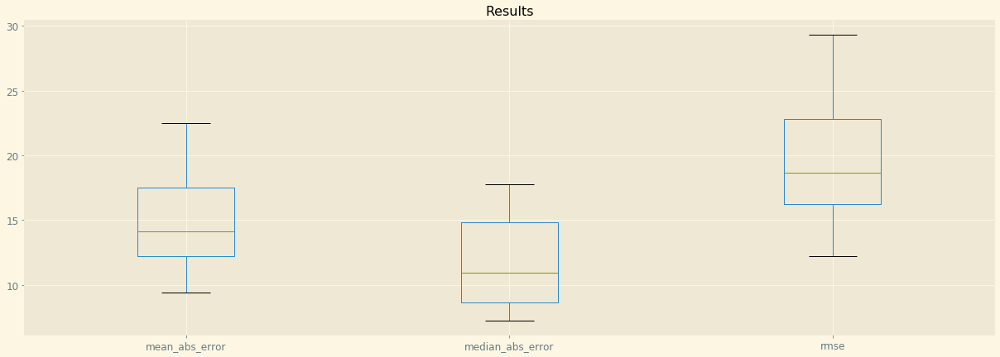

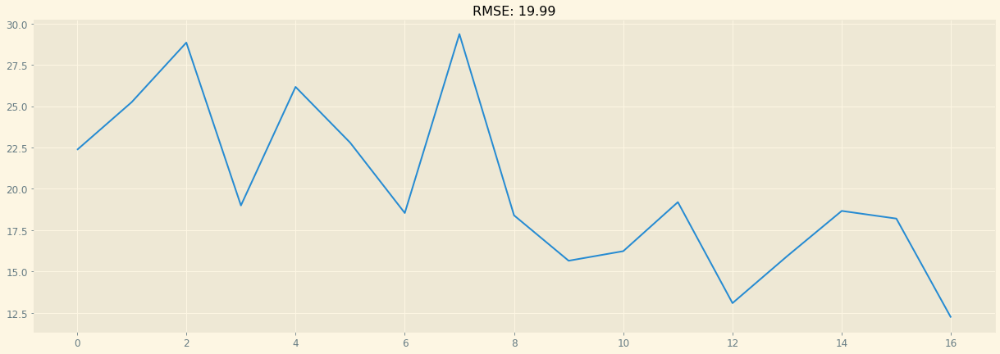

NameError: name 'plot_importance' is not defined

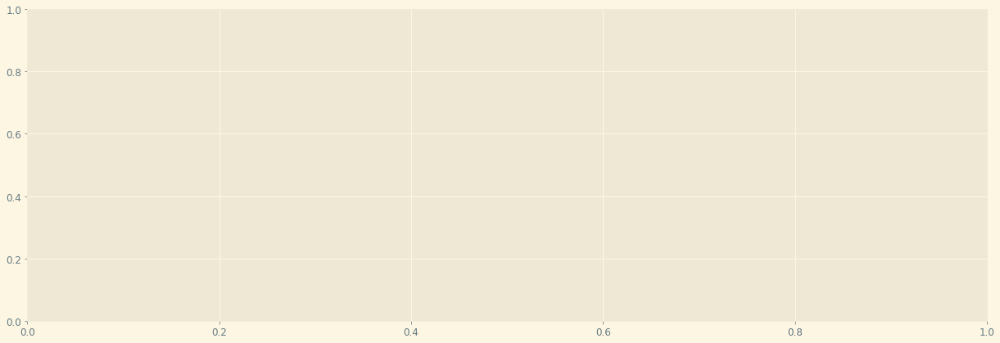

In [5]:
# Generate rolling predictions and results for particle of interest

data = oneparticle_onestation.sort_index().copy()
target = particle_of_interest

fit_func = fit_autoARIMA
predict_func = predict_autoARIMA

min_train_date = '2018-01-01'

week_starts = pd.date_range(min_train_date, data.index.max(), freq='W')

predictions_over_time, results_over_time = [], []

for i, week_start in enumerate(week_starts):
    if i % 10 == 0:
        print(week_start)

    train_set = data.loc[:(week_start - timedelta(hours=1))]
    test_set = data.loc[week_start:(week_start + timedelta(weeks=1, hours=-1))]
    models = train_set.groupby(['weekday', 'hour'])[target].apply(fit_func)
    predictions = test_set.apply(lambda x: predict_func(models.loc[tuple(x[['weekday', 'hour']])], x), axis=1)
    predictions_over_time.append(predictions)    
    results = evaluate_forecast(test_set[target], predictions, 'none')
    results['date'] = week_start
    results_over_time.append(results)  

results_over_time_08 = pd.DataFrame(results_over_time)
predictions_over_time_08 = pd.concat(predictions_over_time)

# Plot results statistics

results_over_time = results_over_time_08

fig, ax = plt.subplots(figsize=(21,7))
results_over_time.drop(['r2_score', 'mse'], axis=1).boxplot()
plt.title('Results')
plt.show()

# Plot RMSE overtime

fig, ax = plt.subplots(figsize=(21,7))
rmse_over_time = plt.plot(results_over_time['rmse'])
error = results_over_time['rmse'].mean()
plt.title('RMSE: %.2f'% error)
plt.show()

# Plot actuals and predictions overtime

plot_actuals_predictions(oneparticle_onestation[particle_of_interest][min_train_date:], predictions_over_time_08, results_over_time_08)

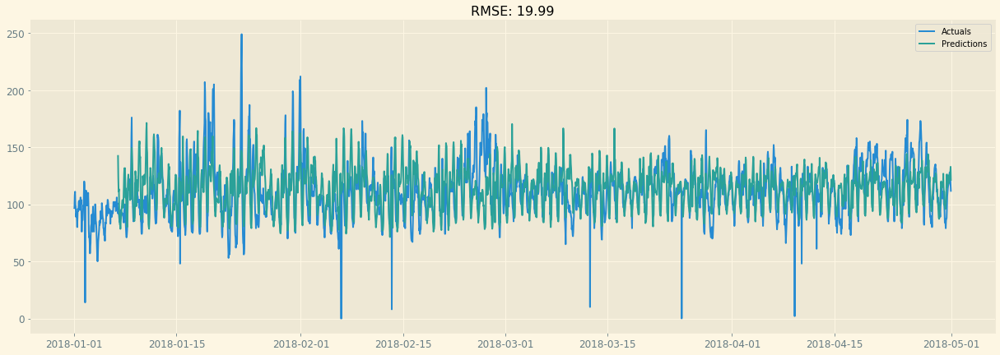

In [6]:
plot_actuals_predictions(oneparticle_onestation[particle_of_interest][min_train_date:], predictions_over_time_08, results_over_time_08)

### Station nr 28079018  - San Isidro/Calle Farolillo

In [8]:
# Generate dataframe for one particle and one station of interest

station_of_interest = 28079018

print(f'The station of interest is: {station_of_interest}')
print('')

oneparticle_onestation = df_temp.loc[df_temp['station'] == station_of_interest]
oneparticle_onestation = oneparticle_onestation.drop(columns = [x for x in particles_of_interest if x is not particle_of_interest], axis=1)
oneparticle_onestation.drop('station', axis=1, inplace=True)

print(f'Missing values for particle and station of interest: {round(oneparticle_onestation[particle_of_interest].isnull().mean()*100, 2)}%')
print('')
oneparticle_onestation.dropna(inplace=True)

oneparticle_onestation['quarter'] = oneparticle_onestation.index.quarter
oneparticle_onestation['dayofyear'] = oneparticle_onestation.index.dayofyear
oneparticle_onestation['dayofmonth'] = oneparticle_onestation.index.day
oneparticle_onestation['weekyear'] = oneparticle_onestation.index.weekofyear
oneparticle_onestation['weekday'] = oneparticle_onestation.index.weekday
oneparticle_onestation['hour'] = oneparticle_onestation.index.hour
oneparticle_onestation['year'] = oneparticle_onestation.index.year
oneparticle_onestation['month'] = oneparticle_onestation.index.month
oneparticle_onestation.fillna(0, inplace=True)

print(f'One particle, one station DF shape: {oneparticle_onestation.shape}')
oneparticle_onestation.head()

The station of interest is: 28079018

Missing values for particle and station of interest: 0.0%

One particle, one station DF shape: (55488, 9)


,all_particles,quarter,dayofyear,dayofmonth,weekyear,weekday,hour,year,month
date,,,,,,,,,
2012-01-01 00:00:00,150.0,1,1,1,52,6,0,2012,1
2012-01-01 01:00:00,107.0,1,1,1,52,6,1,2012,1
2012-01-01 02:00:00,83.0,1,1,1,52,6,2,2012,1
2012-01-01 03:00:00,120.0,1,1,1,52,6,3,2012,1
2012-01-01 04:00:00,98.0,1,1,1,52,6,4,2012,1


2018-01-07 00:00:00
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3076.112, BIC=3098.609, Time=1.135 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3119.517, BIC=3127.015, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3087.704, BIC=3098.953, Time=0.092 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3093.289, BIC=3104.537, Time=0.201 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3871.251, BIC=3875.000, Time=0.008 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3077.568, BIC=3096.315, Time=0.931 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3077.773, BIC=3096.520, Time=0.868 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3077.192, BIC=3103.437, Time=1.193 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3076.953, BIC=3103.199, Time=1.329 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2798.722, BIC=2821.218, Time=1.704 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2840.004, BIC=2847.503, Time=0.021 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2808.114, BIC=2819.362, Time=0.052 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2817.145, BIC=2828.393, Time=0.240 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3635.044, BIC=3638.794, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2797.938, BIC=2816.685, Time=1.161 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2810.185, BIC=2825.183, Time=0.244 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2796.006, BIC=2811.004, Time=0.891 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2797.950, BIC=2816.697, Time=1.141 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2801.277, BIC=2816.

Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3181.985, BIC=3196.982, Time=0.304 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3172.039, BIC=3187.037, Time=0.808 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3171.668, BIC=3194.164, Time=0.982 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3178.790, BIC=3197.537, Time=0.417 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3173.334, BIC=3199.580, Time=0.707 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3173.084, BIC=3199.330, Time=0.470 seconds
Fit ARIMA: (0, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3169.085, BIC=3191.581, Time=0.363 seconds
Fit ARIMA: (0, 0, 5)x(0, 0, 0, 0) (constant=True); AIC=3170.988, BIC=3197.234, Time=0.426 seconds
Fit ARIMA: (1, 0, 5)x(0, 0, 0, 0) (constant=True); AIC=3172.992, BIC=3202.987, Time=0.565 seconds
Total fit time: 7.133 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3214.388, BIC=3229.386, Time=0.330 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3214.827, BIC=3233.574, Time=0.632 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3213.387, BIC=3228.384, Time=1.049 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3214.202, BIC=3232.949, Time=0.385 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3212.246, BIC=3227.243, Time=0.239 seconds
Fit ARIMA: (3, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3214.118, BIC=3232.865, Time=0.545 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3216.117, BIC=3238.613, Time=0.434 seconds
Total fit time: 4.825 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3168.465, BIC=3190.961, Time=0.673 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3180.318, BIC=3187.817, Time=0.018 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2785.129, BIC=2800.126, Time=0.237 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2762.665, BIC=2777.662, Time=0.618 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2764.480, BIC=2783.227, Time=0.784 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2770.689, BIC=2785.687, Time=0.180 seconds
Total fit time: 4.855 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2742.367, BIC=2764.864, Time=1.137 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2820.896, BIC=2828.395, Time=0.011 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2756.197, BIC=2767.445, Time=0.041 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2775.583, BIC=2786.831, Time=0.228 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3654.343, BIC=3658.092, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3156.398, BIC=3175.129, Time=0.425 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3159.437, BIC=3185.660, Time=1.125 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3169.891, BIC=3196.114, Time=1.359 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.991)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3158.964, BIC=3173.949, Time=0.640 seconds
Near non-invertible roots for order (1, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of 

Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3066.182, BIC=3088.659, Time=0.501 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3050.426, BIC=3072.903, Time=1.472 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3061.871, BIC=3091.841, Time=2.564 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 10.997 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3210.845, BIC=3233.341, Time=0.390 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3230.487, BIC=3237.985, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3214.272, BIC=3225.520, Time=0.090 seconds
Fit ARIMA: (0, 0, 1)x(

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2982.584, BIC=2993.832, Time=0.265 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3796.400, BIC=3800.150, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2964.550, BIC=2983.297, Time=0.940 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2975.900, BIC=2990.898, Time=0.494 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2963.719, BIC=2978.717, Time=0.811 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2964.728, BIC=2983.475, Time=1.013 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2968.760, BIC=2983.758, Time=0.190 seconds
Total fit time: 5.144 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2861.170, BIC=2883.667, Time=1.023 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2907.264, BIC=2914.762, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3040.336, BIC=3051.584, Time=0.184 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3882.986, BIC=3886.735, Time=0.012 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3039.186, BIC=3054.184, Time=0.194 seconds
Fit ARIMA: (3, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3037.978, BIC=3056.725, Time=0.503 seconds
Fit ARIMA: (4, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3038.393, BIC=3060.889, Time=0.436 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3039.913, BIC=3062.409, Time=1.022 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3040.591, BIC=3059.338, Time=0.459 seconds
Fit ARIMA: (4, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3040.382, BIC=3066.628, Time=0.393 seconds
Total fit time: 4.632 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3080.736, BIC=3103.232, Time=1.126 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3120.749, BIC=3143.245, Time=1.063 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3163.790, BIC=3171.289, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3135.786, BIC=3147.034, Time=0.040 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3144.877, BIC=3156.125, Time=0.227 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3960.804, BIC=3964.553, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3120.169, BIC=3138.916, Time=0.898 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3133.823, BIC=3148.821, Time=0.365 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3118.565, BIC=3133.563, Time=0.820 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3120.181, BIC=3138.928, Time=0.969 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3124.240, BIC=3139.

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3151.574, BIC=3170.321, Time=0.361 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3150.849, BIC=3169.596, Time=0.345 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3149.539, BIC=3175.785, Time=1.243 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3149.236, BIC=3175.482, Time=1.300 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3154.876, BIC=3169.874, Time=0.113 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3152.990, BIC=3175.487, Time=0.313 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3152.773, BIC=3175.269, Time=0.541 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3148.727, BIC=3178.722, Time=1.470 seconds
Total fit time: 7.377 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3063.827, BIC=3086.323, Time=1.046 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2851.107, BIC=2869.854, Time=0.938 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2851.178, BIC=2877.424, Time=1.211 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2851.014, BIC=2877.260, Time=1.236 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2852.716, BIC=2867.714, Time=0.856 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2851.575, BIC=2874.071, Time=1.238 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2852.938, BIC=2875.434, Time=1.075 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2844.310, BIC=2874.305, Time=1.577 seconds
Fit ARIMA: (4, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2837.169, BIC=2870.914, Time=1.980 seconds
Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2850.190, BIC=2880.185, Time=1.140 seconds
Fit ARIMA: (5, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2838.616, BIC=2876.110, Time=2.131 seconds
Fit ARIMA: (4, 0, 4)

Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3153.200, BIC=3168.197, Time=0.215 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3153.837, BIC=3168.834, Time=0.262 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3155.168, BIC=3173.915, Time=0.359 seconds
Total fit time: 1.971 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3176.770, BIC=3199.247, Time=1.080 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3319.410, BIC=3326.903, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3251.513, BIC=3262.751, Time=0.032 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3186.360, BIC=3197.598, Time=0.169 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3317.423, BIC=3321.169, Time=0.016 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3190.186, BIC=3208.917, Time=0.437 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3155.072, BIC=3170.069, Time=0.221 seconds
Total fit time: 4.596 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3089.339, BIC=3111.835, Time=1.057 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3152.960, BIC=3160.459, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3099.556, BIC=3110.804, Time=0.041 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3115.845, BIC=3127.093, Time=0.269 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3934.498, BIC=3938.247, Time=0.012 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3086.130, BIC=3104.877, Time=1.087 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3103.191, BIC=3118.189, Time=0.308 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3085.130, BIC=3100.128, Time=0.664 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3129.606, BIC=3148.353, Time=1.063 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3127.304, BIC=3142.302, Time=0.700 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3134.973, BIC=3149.970, Time=0.322 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3132.808, BIC=3147.806, Time=0.287 seconds
Total fit time: 4.491 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3020.308, BIC=3042.804, Time=1.055 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3048.155, BIC=3055.653, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3033.670, BIC=3044.919, Time=0.081 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3037.877, BIC=3049.125, Time=0.236 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3847.716, BIC=3851.466, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2870.080, BIC=2888.827, Time=0.760 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2870.126, BIC=2888.873, Time=0.905 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2870.922, BIC=2897.168, Time=1.398 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2870.924, BIC=2897.170, Time=1.333 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2869.283, BIC=2884.280, Time=0.813 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2871.947, BIC=2894.443, Time=1.078 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2872.111, BIC=2894.607, Time=1.217 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2867.084, BIC=2897.079, Time=1.461 seconds
Fit ARIMA: (4, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2873.845, BIC=2907.589, Time=1.681 seconds
Fit ARIMA: (3, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2868.190, BIC=2901.935, Time=1.656 seconds
Fit ARIMA: (2, 0, 4)

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3119.421, BIC=3141.898, Time=1.149 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3239.150, BIC=3246.643, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3179.405, BIC=3190.644, Time=0.125 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3131.543, BIC=3142.781, Time=0.155 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3237.150, BIC=3240.896, Time=0.014 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3120.615, BIC=3139.346, Time=1.027 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3121.122, BIC=3139.853, Time=0.883 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too c

Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3246.569, BIC=3269.066, Time=0.987 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3265.941, BIC=3273.440, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3241.097, BIC=3252.345, Time=0.083 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3240.604, BIC=3251.853, Time=0.253 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3986.423, BIC=3990.172, Time=0.009 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3242.440, BIC=3257.437, Time=0.444 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3242.513, BIC=3257.511, Time=0.348 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3244.354, BIC=3263.101, Time=0.290 seconds
Total fit time: 2.435 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3237.456, BIC=3259.952, Time=0.714 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2768.809, BIC=2787.556, Time=0.908 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2787.638, BIC=2802.636, Time=0.436 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2766.877, BIC=2781.875, Time=0.969 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2768.823, BIC=2787.570, Time=1.063 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2779.279, BIC=2794.277, Time=0.319 seconds
Total fit time: 5.539 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2747.982, BIC=2770.479, Time=1.319 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2795.226, BIC=2802.725, Time=0.018 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2761.045, BIC=2772.294, Time=0.088 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2771.399, BIC=2782.647, Time=0.235 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2974.447, BIC=2996.944, Time=1.717 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3027.221, BIC=3034.720, Time=0.031 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2986.041, BIC=2997.289, Time=0.056 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2992.737, BIC=3003.986, Time=0.429 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3865.614, BIC=3869.364, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2974.736, BIC=2993.483, Time=1.548 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2975.401, BIC=2994.148, Time=1.387 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2975.451, BIC=3001.697, Time=1.663 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2974.837, BIC=3001.082, Time=1.290 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2974.790, BIC=2989.

Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3034.417, BIC=3060.663, Time=1.317 seconds
Fit ARIMA: (3, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3035.692, BIC=3069.436, Time=1.621 seconds
Total fit time: 15.532 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3036.896, BIC=3059.393, Time=1.267 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3108.900, BIC=3116.399, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3060.137, BIC=3071.386, Time=0.079 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3071.101, BIC=3082.349, Time=0.278 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3914.382, BIC=3918.132, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3043.507, BIC=3062.254, Time=0.917 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3043.557, BIC=3062.304, Time=1.009 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3117.838, BIC=3136.585, Time=1.013 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3117.850, BIC=3136.597, Time=1.001 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3114.634, BIC=3140.880, Time=1.901 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3114.332, BIC=3136.829, Time=1.411 seconds
Fit ARIMA: (3, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3114.336, BIC=3133.083, Time=0.351 seconds
Fit ARIMA: (4, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3115.814, BIC=3142.060, Time=2.074 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3123.884, BIC=3138.881, Time=0.242 seconds
Fit ARIMA: (4, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3115.440, BIC=3137.937, Time=0.456 seconds
Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3116.023, BIC=3146.018, Time=1.785 seconds
Total fit time: 11.723 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2848.341, BIC=2863.338, Time=0.253 seconds
Fit ARIMA: (0, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2842.447, BIC=2864.944, Time=0.561 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2838.675, BIC=2868.670, Time=1.620 seconds
Total fit time: 11.948 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2739.886, BIC=2762.382, Time=1.190 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2782.811, BIC=2790.310, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2750.058, BIC=2761.307, Time=0.082 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2758.419, BIC=2769.668, Time=0.248 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3648.321, BIC=3652.070, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2737.350, BIC=2756.097, Time=0.976 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2977.625, BIC=2988.863, Time=0.213 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3083.606, BIC=3087.352, Time=0.015 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2978.996, BIC=2993.981, Time=0.352 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2978.969, BIC=2993.953, Time=0.232 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2981.308, BIC=3000.039, Time=0.705 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 2.491 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2973.840, BIC=2996.317, Time=0.487 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3087.310, BIC=3094.803, Time=0.016 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3024.086, BIC=3035.325, Tim

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3157.499, BIC=3168.747, Time=0.195 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3937.453, BIC=3941.203, Time=0.009 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3151.590, BIC=3166.587, Time=0.124 seconds
Fit ARIMA: (3, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3153.301, BIC=3172.048, Time=0.186 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3153.526, BIC=3172.273, Time=0.239 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3153.682, BIC=3168.680, Time=0.137 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3155.305, BIC=3177.801, Time=0.274 seconds
Total fit time: 2.120 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3112.150, BIC=3134.646, Time=1.348 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3137.392, BIC=3144.891, Time=0.021 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2848.588, BIC=2863.598, Time=0.288 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2830.292, BIC=2845.303, Time=0.640 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2832.278, BIC=2851.041, Time=0.834 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2837.405, BIC=2852.415, Time=0.297 seconds
Total fit time: 4.370 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2828.465, BIC=2850.980, Time=1.135 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2880.447, BIC=2887.952, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2840.995, BIC=2852.252, Time=0.045 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2853.025, BIC=2864.283, Time=0.201 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3662.608, BIC=3666.360, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3162.183, BIC=3184.698, Time=0.607 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3171.518, BIC=3179.023, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3157.906, BIC=3169.164, Time=0.073 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3158.872, BIC=3170.129, Time=0.244 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3907.213, BIC=3910.965, Time=0.009 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3159.684, BIC=3174.694, Time=0.118 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3159.627, BIC=3174.637, Time=0.125 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3161.526, BIC=3180.289, Time=0.186 seconds
Total fit time: 1.383 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3169.251, BIC=3191.766, Time=1.032 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3248.695, BIC=3259.953, Time=0.255 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=4000.209, BIC=4003.961, Time=0.011 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3244.998, BIC=3260.008, Time=0.283 seconds
Fit ARIMA: (3, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3244.080, BIC=3262.843, Time=1.021 seconds
Fit ARIMA: (4, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3245.758, BIC=3268.274, Time=0.487 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3246.079, BIC=3268.595, Time=0.453 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3245.638, BIC=3264.401, Time=0.789 seconds
Fit ARIMA: (4, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3247.709, BIC=3273.977, Time=0.714 seconds
Total fit time: 5.266 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3276.643, BIC=3299.158, Time=1.056 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2834.151, BIC=2852.913, Time=0.697 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2852.789, BIC=2867.799, Time=0.189 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2832.366, BIC=2847.376, Time=0.584 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2834.177, BIC=2852.940, Time=0.862 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2840.311, BIC=2855.322, Time=0.208 seconds
Total fit time: 3.725 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2801.387, BIC=2823.903, Time=1.010 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2876.121, BIC=2883.626, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2815.401, BIC=2826.659, Time=0.075 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2832.677, BIC=2843.934, Time=0.270 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3125.387, BIC=3144.150, Time=0.527 seconds
Total fit time: 2.401 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3173.471, BIC=3195.987, Time=1.522 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3178.500, BIC=3186.005, Time=0.017 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3177.007, BIC=3188.264, Time=0.058 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3177.295, BIC=3188.553, Time=0.364 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3903.704, BIC=3907.457, Time=0.012 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3180.210, BIC=3198.973, Time=0.289 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3180.039, BIC=3198.801, Time=0.302 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3175.331, BIC=3201.599, Time=1.872 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3041.301, BIC=3060.064, Time=0.872 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3073.128, BIC=3088.139, Time=0.341 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3039.346, BIC=3054.356, Time=0.570 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3041.314, BIC=3060.076, Time=0.764 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3052.203, BIC=3067.213, Time=0.236 seconds
Total fit time: 4.232 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3060.764, BIC=3083.261, Time=1.269 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3179.053, BIC=3186.552, Time=0.017 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3119.280, BIC=3130.528, Time=0.086 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3075.149, BIC=3086.397, Time=0.184 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=F

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3113.295, BIC=3135.810, Time=1.140 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3129.315, BIC=3136.820, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3118.406, BIC=3129.663, Time=0.095 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3121.495, BIC=3132.753, Time=0.204 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3916.266, BIC=3920.019, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3110.239, BIC=3129.002, Time=0.950 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3117.161, BIC=3132.171, Time=0.205 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3109.358, BIC=3124.369, Time=0.855 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3110.436, BIC=3129.198, Time=1.291 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3112.416, BIC=3127.

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2738.782, BIC=2757.545, Time=1.537 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2740.777, BIC=2755.787, Time=0.500 seconds
Total fit time: 5.941 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2736.518, BIC=2759.033, Time=1.072 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2788.031, BIC=2795.537, Time=0.028 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2746.000, BIC=2757.257, Time=0.048 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2760.153, BIC=2771.410, Time=0.203 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3725.532, BIC=3729.285, Time=0.013 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2734.839, BIC=2753.602, Time=1.252 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2742.665, BIC=2757.675, Time=0.279 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3109.506, BIC=3128.253, Time=0.547 seconds
Total fit time: 2.527 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3092.471, BIC=3114.987, Time=1.144 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3171.750, BIC=3179.255, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3122.026, BIC=3133.284, Time=0.081 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3140.068, BIC=3151.326, Time=0.173 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3950.528, BIC=3954.280, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3092.635, BIC=3111.398, Time=0.751 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3092.710, BIC=3111.473, Time=0.728 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3094.501, BIC=3120.769, Time=1.182 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3311.307, BIC=3326.304, Time=0.787 seconds
Near non-invertible roots for order (1, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3314.514, BIC=3337.011, Time=1.218 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3311.068, BIC=3333.564, Time=0.621 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3315.766, BIC=3345.761, Time=1.569 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of 

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3055.709, BIC=3070.719, Time=0.723 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3051.431, BIC=3073.947, Time=1.019 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3067.839, BIC=3086.602, Time=0.440 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3050.670, BIC=3069.433, Time=0.824 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3053.674, BIC=3079.942, Time=1.267 seconds
Near non-invertible roots for order (2, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 6.739 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2929.778, BIC=2952.294, Time=1.555 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2977.711, BIC=2985.216, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2963.086, BIC=2974.344, Time

Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2848.985, BIC=2867.747, Time=0.467 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2831.555, BIC=2850.318, Time=1.042 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2834.664, BIC=2860.932, Time=1.414 seconds
Total fit time: 7.600 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2836.775, BIC=2859.291, Time=1.152 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2862.297, BIC=2869.802, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2849.890, BIC=2861.148, Time=0.080 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2853.294, BIC=2864.552, Time=0.253 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3726.421, BIC=3730.173, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2833.443, BIC=2852.206, Time=1.053 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3205.500, BIC=3231.746, Time=1.582 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3204.773, BIC=3219.771, Time=0.690 seconds
Near non-invertible roots for order (1, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3208.811, BIC=3231.307, Time=1.256 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3204.558, BIC=3227.054, Time=0.595 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of 

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3259.847, BIC=3271.105, Time=0.293 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=4010.259, BIC=4014.012, Time=0.010 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3258.810, BIC=3273.820, Time=0.137 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3258.958, BIC=3273.969, Time=0.293 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3260.786, BIC=3279.549, Time=0.431 seconds
Total fit time: 1.805 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3336.077, BIC=3358.593, Time=0.644 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3347.668, BIC=3355.173, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3331.077, BIC=3342.335, Time=0.037 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3333.544, BIC=3344.801, Time=0.277 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2919.729, BIC=2938.492, Time=0.795 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2946.517, BIC=2961.527, Time=0.201 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2919.060, BIC=2934.070, Time=0.658 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2920.078, BIC=2938.841, Time=0.825 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2934.876, BIC=2949.887, Time=0.206 seconds
Total fit time: 4.236 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2879.212, BIC=2901.727, Time=1.082 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2935.410, BIC=2942.915, Time=0.022 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2905.325, BIC=2916.582, Time=0.079 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2914.725, BIC=2925.983, Time=0.156 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3088.201, BIC=3103.211, Time=0.121 seconds
Total fit time: 2.827 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3104.002, BIC=3126.517, Time=0.648 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3120.669, BIC=3128.174, Time=0.017 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3107.119, BIC=3118.377, Time=0.027 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3110.669, BIC=3121.927, Time=0.219 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3923.850, BIC=3927.603, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3105.462, BIC=3124.225, Time=0.266 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3105.151, BIC=3123.914, Time=0.293 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3105.879, BIC=3132.147, Time=1.039 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3079.106, BIC=3105.352, Time=1.532 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3077.562, BIC=3092.560, Time=0.281 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3081.458, BIC=3103.954, Time=0.456 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3080.330, BIC=3102.826, Time=0.654 seconds
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3080.329, BIC=3110.324, Time=1.580 seconds
Total fit time: 7.770 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3094.601, BIC=3117.116, Time=1.313 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3152.649, BIC=3160.154, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3099.428, BIC=3110.686, Time=0.038 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3114.741, BIC=3125.998, Time=0.221 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3039.377, BIC=3058.140, Time=0.855 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3054.098, BIC=3069.108, Time=0.224 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3037.407, BIC=3052.417, Time=0.756 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3039.408, BIC=3058.171, Time=0.957 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3049.276, BIC=3064.287, Time=0.115 seconds
Total fit time: 4.237 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2951.386, BIC=2973.901, Time=1.018 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2990.204, BIC=2997.709, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2960.929, BIC=2972.186, Time=0.080 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2969.278, BIC=2980.535, Time=0.194 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2807.105, BIC=2818.363, Time=0.175 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3706.564, BIC=3710.316, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2787.663, BIC=2806.426, Time=0.846 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2797.947, BIC=2812.958, Time=0.281 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2785.837, BIC=2800.847, Time=0.938 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2787.833, BIC=2806.596, Time=1.890 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2791.689, BIC=2806.700, Time=0.204 seconds
Total fit time: 5.518 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2825.888, BIC=2848.404, Time=1.698 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2866.505, BIC=2874.010, Time=0.017 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3037.745, BIC=3063.990, Time=0.782 seconds
Total fit time: 3.674 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3036.651, BIC=3059.166, Time=0.978 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3118.966, BIC=3126.471, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3064.549, BIC=3075.807, Time=0.035 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3079.727, BIC=3090.984, Time=0.166 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3920.473, BIC=3924.226, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3036.777, BIC=3055.540, Time=0.822 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3036.813, BIC=3055.576, Time=0.800 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3035.091, BIC=3061.359, Time=1.199 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3178.543, BIC=3204.789, Time=1.813 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3177.651, BIC=3192.649, Time=0.853 seconds
Near non-invertible roots for order (1, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3181.670, BIC=3204.167, Time=1.498 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3174.010, BIC=3196.506, Time=0.416 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of 

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2979.991, BIC=3002.507, Time=0.971 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2994.530, BIC=3002.035, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2985.733, BIC=2996.991, Time=0.040 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2986.431, BIC=2997.688, Time=0.167 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3762.510, BIC=3766.263, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2981.274, BIC=3000.037, Time=0.653 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2981.323, BIC=3000.085, Time=0.817 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2978.499, BIC=3004.767, Time=1.126 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2977.148, BIC=2999.664, Time=0.892 seconds
Fit ARIMA: (3, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2980.133, BIC=2998.

Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2782.127, BIC=2804.643, Time=0.775 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2851.827, BIC=2859.332, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2806.374, BIC=2817.632, Time=0.066 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2823.137, BIC=2834.395, Time=0.117 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3722.172, BIC=3725.925, Time=0.012 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2780.151, BIC=2798.913, Time=0.553 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2805.380, BIC=2820.390, Time=0.147 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2779.618, BIC=2794.628, Time=0.407 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2780.355, BIC=2799.118, Time=0.503 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2787.532, BIC=2802.542, Time=0.146 seconds
Total fit time: 2.7

Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3045.630, BIC=3068.126, Time=0.287 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3165.508, BIC=3173.007, Time=0.016 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3100.109, BIC=3111.357, Time=0.074 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3042.379, BIC=3053.627, Time=0.118 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3163.509, BIC=3167.258, Time=0.012 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3044.050, BIC=3059.047, Time=0.221 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3044.008, BIC=3059.006, Time=0.197 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3043.717, BIC=3062.464, Time=0.209 seconds
Total fit time: 1.141 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3098.450, BIC=3120.946, Time=0.481 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3095.387, BIC=3121.677, Time=0.947 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3094.780, BIC=3109.803, Time=0.498 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3093.206, BIC=3115.740, Time=0.790 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3105.411, BIC=3124.190, Time=0.376 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3095.078, BIC=3121.368, Time=0.893 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3111.506, BIC=3126.529, Time=0.276 seconds
Fit ARIMA: (0, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3105.690, BIC=3128.224, Time=0.618 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3095.322, BIC=3125.368, Time=1.320 seconds
Near non-invertible roots for order (2, 0, 4)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.996)
Total fit time: 8.910 seconds
Performing stepwise search t

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2838.949, BIC=2861.484, Time=1.069 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2875.070, BIC=2882.582, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2851.010, BIC=2862.277, Time=0.046 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2858.234, BIC=2869.502, Time=0.168 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3715.100, BIC=3718.855, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2836.199, BIC=2854.977, Time=0.811 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2851.081, BIC=2866.104, Time=0.260 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2834.977, BIC=2850.000, Time=0.475 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2836.341, BIC=2855.120, Time=0.641 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2841.862, BIC=2856.

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3216.005, BIC=3227.272, Time=0.165 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3959.063, BIC=3962.819, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3203.255, BIC=3222.034, Time=0.657 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3216.077, BIC=3231.100, Time=0.269 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3203.541, BIC=3218.564, Time=0.519 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3201.536, BIC=3224.071, Time=0.783 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3212.910, BIC=3231.689, Time=0.224 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3203.073, BIC=3229.363, Time=0.486 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3199.818, BIC=3226.108, Time=0.771 seconds
Fit ARIMA: (0, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3198.325, BIC=3220.860, Time=0.307 seconds
Fit ARIMA: (0, 0, 5

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3195.294, BIC=3206.562, Time=0.151 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3980.795, BIC=3984.551, Time=0.012 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3185.530, BIC=3204.308, Time=0.649 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3186.234, BIC=3201.257, Time=0.287 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3186.933, BIC=3201.956, Time=0.704 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3187.612, BIC=3210.147, Time=0.316 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3186.389, BIC=3205.167, Time=0.357 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3185.534, BIC=3204.313, Time=0.160 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3189.061, BIC=3215.352, Time=0.627 seconds
Total fit time: 3.617 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2759.760, BIC=2778.539, Time=0.903 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2766.911, BIC=2781.934, Time=0.144 seconds
Total fit time: 5.046 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2774.217, BIC=2796.751, Time=1.089 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2832.723, BIC=2840.234, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2781.355, BIC=2792.622, Time=0.204 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2794.910, BIC=2806.178, Time=0.152 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3680.821, BIC=3684.577, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2771.905, BIC=2790.684, Time=0.550 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2784.900, BIC=2799.923, Time=0.290 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3174.780, BIC=3197.295, Time=0.443 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3183.672, BIC=3213.693, Time=1.219 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.997)
Total fit time: 7.294 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3148.528, BIC=3171.044, Time=0.749 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3301.006, BIC=3308.511, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3213.148, BIC=3224.406, Time=0.084 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3143.059, BIC=3154.317, Time=0.122 seconds
Fit ARIMA: (0, 1, 0)x(0

Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3230.086, BIC=3256.376, Time=1.330 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3233.927, BIC=3256.462, Time=0.703 seconds
Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3230.147, BIC=3260.193, Time=2.731 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3227.406, BIC=3257.452, Time=2.921 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3230.993, BIC=3257.284, Time=0.728 seconds
Fit ARIMA: (4, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3229.163, BIC=3262.965, Time=2.343 seconds
Fit ARIMA: (3, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3229.091, BIC=3262.893, Time=3.003 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3232.318, BIC=3262.364, Time=2.329 seconds
Fit ARIMA: (4, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3231.533, BIC=3269.090, Time=4.738 seconds
Total fit time: 23.123 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2875.546, BIC=2894.325, Time=0.740 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2893.448, BIC=2908.471, Time=0.331 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2874.531, BIC=2889.554, Time=0.574 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2875.913, BIC=2894.692, Time=0.657 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2882.252, BIC=2897.275, Time=0.155 seconds
Total fit time: 3.676 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2825.199, BIC=2847.733, Time=0.927 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2878.140, BIC=2885.652, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2842.724, BIC=2853.991, Time=0.071 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2854.675, BIC=2865.942, Time=0.159 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3058.850, BIC=3085.140, Time=0.442 seconds
Total fit time: 6.102 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3099.410, BIC=3121.944, Time=0.365 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3096.665, BIC=3104.176, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3096.220, BIC=3107.488, Time=0.031 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3096.577, BIC=3107.844, Time=0.130 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3931.076, BIC=3934.832, Time=0.009 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3096.183, BIC=3111.206, Time=0.138 seconds
Fit ARIMA: (3, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3097.848, BIC=3116.626, Time=0.212 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3098.137, BIC=3116.916, Time=0.195 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3138.902, BIC=3161.436, Time=0.824 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3183.355, BIC=3190.866, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3154.191, BIC=3165.458, Time=0.039 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3163.683, BIC=3174.951, Time=0.166 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3985.148, BIC=3988.903, Time=0.008 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3138.543, BIC=3157.322, Time=0.827 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3152.110, BIC=3167.133, Time=0.266 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3136.911, BIC=3151.934, Time=0.481 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3138.551, BIC=3157.330, Time=0.560 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3142.470, BIC=3157.493, Time=0.182 seconds
Total fit time: 3.3

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3169.901, BIC=3188.679, Time=0.569 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3169.112, BIC=3187.891, Time=0.722 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3167.677, BIC=3193.967, Time=1.285 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3167.265, BIC=3193.555, Time=1.384 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3164.483, BIC=3179.506, Time=0.655 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3168.541, BIC=3183.564, Time=0.267 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3167.144, BIC=3182.167, Time=0.185 seconds
Total fit time: 6.882 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3081.433, BIC=3103.967, Time=0.938 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3108.285, BIC=3115.796, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2868.463, BIC=2890.998, Time=0.787 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2869.781, BIC=2892.316, Time=0.807 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2867.135, BIC=2897.181, Time=1.455 seconds
Fit ARIMA: (4, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2861.275, BIC=2895.077, Time=1.327 seconds
Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2868.031, BIC=2898.077, Time=1.942 seconds
Fit ARIMA: (5, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2855.128, BIC=2892.685, Time=1.850 seconds
Fit ARIMA: (5, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2869.674, BIC=2903.476, Time=1.211 seconds
Fit ARIMA: (5, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2858.510, BIC=2899.823, Time=2.207 seconds
Near non-invertible roots for order (5, 0, 4)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.995)
Fit ARIMA: (4, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=285

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3172.914, BIC=3184.181, Time=0.284 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3932.278, BIC=3936.034, Time=0.016 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3171.555, BIC=3186.578, Time=0.344 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3172.160, BIC=3187.182, Time=0.353 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3173.527, BIC=3192.306, Time=0.386 seconds
Total fit time: 2.401 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3190.675, BIC=3213.191, Time=1.541 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3339.539, BIC=3347.044, Time=0.026 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3271.789, BIC=3283.047, Time=0.039 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3205.153, BIC=3216.411, Time=0.201 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3163.731, BIC=3178.754, Time=0.498 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3164.887, BIC=3183.666, Time=0.711 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3173.445, BIC=3188.468, Time=0.154 seconds
Total fit time: 4.758 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3107.513, BIC=3130.048, Time=0.914 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3171.070, BIC=3178.582, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3117.495, BIC=3128.762, Time=0.041 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3133.694, BIC=3144.962, Time=0.241 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3959.219, BIC=3962.975, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3104.241, BIC=3123.019, Time=0.747 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3158.496, BIC=3169.763, Time=0.376 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3934.189, BIC=3937.944, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3147.874, BIC=3166.652, Time=0.901 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3153.621, BIC=3168.644, Time=0.325 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3146.638, BIC=3161.661, Time=0.877 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3148.253, BIC=3167.031, Time=1.004 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3151.468, BIC=3166.491, Time=0.418 seconds
Total fit time: 5.147 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3037.949, BIC=3060.483, Time=1.077 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3066.185, BIC=3073.696, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2920.037, BIC=2931.304, Time=0.172 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3757.209, BIC=3760.965, Time=0.012 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2888.820, BIC=2907.599, Time=0.859 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2888.857, BIC=2907.635, Time=1.798 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2890.055, BIC=2916.345, Time=1.176 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2890.007, BIC=2916.297, Time=1.418 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2887.870, BIC=2902.893, Time=0.648 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2906.295, BIC=2921.318, Time=0.209 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2895.391, BIC=2910.414, Time=0.249 seconds
Total fit time: 8.291 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3151.089, BIC=3162.347, Time=0.157 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3258.305, BIC=3262.058, Time=0.019 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3139.563, BIC=3158.326, Time=1.181 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3140.189, BIC=3158.952, Time=1.505 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3139.395, BIC=3165.663, Time=1.261 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3259.561, BIC=3270.828, Time=0.327 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=4012.043, BIC=4015.799, Time=0.013 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3261.448, BIC=3276.471, Time=0.600 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3261.497, BIC=3276.519, Time=0.403 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3263.363, BIC=3282.142, Time=0.330 seconds
Total fit time: 2.546 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3257.000, BIC=3279.534, Time=0.681 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3262.496, BIC=3270.008, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3251.770, BIC=3263.038, Time=0.060 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3252.697, BIC=3263.964, Time=0.159 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2812.884, BIC=2824.152, Time=0.169 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3706.267, BIC=3710.023, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2786.092, BIC=2804.871, Time=0.992 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2804.671, BIC=2819.694, Time=0.252 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2784.130, BIC=2799.153, Time=0.536 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2786.099, BIC=2804.878, Time=1.098 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2796.328, BIC=2811.351, Time=0.279 seconds
Total fit time: 5.252 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2764.448, BIC=2786.983, Time=1.299 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2812.085, BIC=2819.597, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2962.109, BIC=2988.399, Time=0.984 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2961.437, BIC=2987.727, Time=1.075 seconds
Fit ARIMA: (0, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2963.965, BIC=2986.500, Time=0.391 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2962.455, BIC=2992.500, Time=1.553 seconds
Total fit time: 8.040 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2991.768, BIC=3014.303, Time=0.875 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3044.911, BIC=3052.422, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3003.380, BIC=3014.647, Time=0.047 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3010.161, BIC=3021.428, Time=0.163 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3889.906, BIC=3893.661, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3055.047, BIC=3073.826, Time=0.666 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3055.131, BIC=3073.910, Time=0.604 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3049.533, BIC=3075.823, Time=0.446 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3050.342, BIC=3072.876, Time=0.329 seconds
Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3050.734, BIC=3080.780, Time=0.649 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3052.862, BIC=3082.907, Time=0.592 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3049.009, BIC=3075.299, Time=0.818 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3053.247, BIC=3075.781, Time=0.702 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3050.983, BIC=3081.029, Time=0.985 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3051.707, BIC=3077.997, Time=0.899 seconds
Fit ARIMA: (3, 0, 4)

Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3175.710, BIC=3202.000, Time=1.597 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3176.073, BIC=3202.363, Time=1.159 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3189.125, BIC=3204.148, Time=0.109 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3179.263, BIC=3201.797, Time=0.997 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3184.032, BIC=3206.567, Time=1.053 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3179.732, BIC=3209.778, Time=1.837 seconds
Total fit time: 8.644 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3134.824, BIC=3157.358, Time=0.704 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3149.602, BIC=3157.113, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3141.711, BIC=3152.978, Time=0.035 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2864.296, BIC=2875.563, Time=0.163 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3693.724, BIC=3697.480, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2854.102, BIC=2872.881, Time=0.585 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2854.490, BIC=2873.269, Time=0.532 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2853.132, BIC=2879.422, Time=0.822 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2851.763, BIC=2874.298, Time=0.582 seconds
Fit ARIMA: (3, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2853.814, BIC=2872.593, Time=0.158 seconds
Fit ARIMA: (4, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2853.507, BIC=2879.798, Time=0.691 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2860.939, BIC=2875.962, Time=0.080 seconds
Fit ARIMA: (4, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2852.946, BIC=2875.481, Time=0.120 seconds
Fit ARIMA: (4, 0, 2

Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2935.498, BIC=2961.788, Time=1.149 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2935.072, BIC=2950.095, Time=0.573 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2937.290, BIC=2959.825, Time=0.882 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2937.704, BIC=2960.238, Time=0.980 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2937.538, BIC=2967.584, Time=1.124 seconds
Total fit time: 10.738 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2998.367, BIC=3020.882, Time=0.775 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3103.443, BIC=3110.949, Time=0.025 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3040.730, BIC=3051.987, Time=0.091 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2994.756, BIC=3006.014, Time=0.145 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3177.102, BIC=3207.123, Time=1.017 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 6.186 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3174.604, BIC=3197.138, Time=1.040 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3190.262, BIC=3197.773, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3172.540, BIC=3183.807, Time=0.092 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3176.464, BIC=3187.731, Time=0.141 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3961.695, BIC=3965.451, Time=0.010 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3170.767, BIC=3185.790, Time=0.079 seconds
Fit ARIMA: (3, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3172.436, BIC=3191.215, Tim

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2852.676, BIC=2875.230, Time=0.636 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2900.261, BIC=2907.779, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2861.346, BIC=2872.623, Time=0.079 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2871.285, BIC=2882.561, Time=0.087 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3709.959, BIC=3713.718, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2850.624, BIC=2869.418, Time=0.383 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2866.733, BIC=2881.768, Time=0.157 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2848.624, BIC=2863.660, Time=0.377 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2850.624, BIC=2869.418, Time=0.477 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2855.548, BIC=2870.

Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3189.674, BIC=3204.709, Time=0.117 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3189.664, BIC=3204.700, Time=0.175 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3191.620, BIC=3210.414, Time=0.228 seconds
Total fit time: 1.099 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3181.023, BIC=3203.577, Time=0.859 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3190.195, BIC=3197.713, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3176.718, BIC=3187.995, Time=0.077 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3177.686, BIC=3188.963, Time=0.171 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3931.704, BIC=3935.463, Time=0.010 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3178.490, BIC=3193.526, Time=0.080 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3196.424, BIC=3211.460, Time=0.294 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3184.954, BIC=3199.990, Time=0.624 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3186.886, BIC=3205.681, Time=0.798 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3189.911, BIC=3204.947, Time=0.102 seconds
Total fit time: 4.109 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3266.729, BIC=3289.283, Time=0.985 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3277.961, BIC=3285.479, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3267.774, BIC=3279.051, Time=0.029 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3269.932, BIC=3281.209, Time=0.242 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=4025.856, BIC=4029.615, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2930.385, BIC=2945.420, Time=0.332 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2912.518, BIC=2927.553, Time=0.622 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2914.439, BIC=2933.234, Time=1.652 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2919.678, BIC=2934.714, Time=0.328 seconds
Total fit time: 4.899 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2853.411, BIC=2875.965, Time=1.419 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2917.995, BIC=2925.513, Time=0.018 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2865.240, BIC=2876.516, Time=0.049 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2881.192, BIC=2892.468, Time=0.240 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3775.545, BIC=3779.304, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3051.975, BIC=3067.011, Time=0.372 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3053.981, BIC=3072.775, Time=0.267 seconds
Total fit time: 1.971 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3145.355, BIC=3167.908, Time=0.370 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3142.151, BIC=3149.669, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3139.624, BIC=3150.901, Time=0.039 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3139.421, BIC=3150.697, Time=0.221 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3922.397, BIC=3926.156, Time=0.009 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3141.558, BIC=3156.594, Time=0.212 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3141.390, BIC=3156.426, Time=0.285 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3067.018, BIC=3082.041, Time=0.366 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3066.874, BIC=3081.897, Time=0.305 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3068.260, BIC=3087.038, Time=0.412 seconds
Total fit time: 1.997 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3060.555, BIC=3083.108, Time=2.271 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3148.136, BIC=3155.654, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3080.431, BIC=3091.708, Time=0.038 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3101.734, BIC=3113.011, Time=0.196 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3975.270, BIC=3979.029, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3059.074, BIC=3077.868, Time=1.017 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3232.194, BIC=3243.471, Time=0.298 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3999.569, BIC=4003.327, Time=0.008 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3221.803, BIC=3240.597, Time=0.680 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3227.553, BIC=3242.589, Time=0.202 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3222.445, BIC=3237.480, Time=0.567 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3221.275, BIC=3243.829, Time=0.439 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3219.209, BIC=3238.003, Time=0.779 seconds
Fit ARIMA: (0, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3221.168, BIC=3243.722, Time=0.800 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3223.031, BIC=3249.343, Time=0.680 seconds
Total fit time: 4.987 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2757.828, BIC=2780.381, Time=1.410 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2808.795, BIC=2816.312, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2765.534, BIC=2776.811, Time=0.047 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2778.817, BIC=2790.093, Time=0.197 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3688.696, BIC=3692.455, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2756.148, BIC=2774.942, Time=0.772 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2765.502, BIC=2780.537, Time=0.275 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2754.340, BIC=2769.376, Time=0.816 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2756.146, BIC=2774.941, Time=1.221 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2758.383, BIC=2773.

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3158.539, BIC=3169.806, Time=0.167 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3294.026, BIC=3297.782, Time=0.014 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3160.200, BIC=3175.223, Time=0.311 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3160.230, BIC=3175.253, Time=0.273 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3161.716, BIC=3180.495, Time=0.726 seconds
Total fit time: 2.556 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3130.145, BIC=3152.680, Time=0.926 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3265.074, BIC=3272.585, Time=0.017 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3184.453, BIC=3195.720, Time=0.084 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3127.023, BIC=3138.290, Time=0.169 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3341.368, BIC=3352.635, Time=0.564 seconds
Near non-invertible roots for order (0, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3499.496, BIC=3503.252, Time=0.017 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3335.840, BIC=3354.619, Time=1.226 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3336.246, BIC=3355.025, Time=0.492 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3338.340, BIC=3364.630, Time=2.181 seconds
Near non-invertible roots for order

Fit ARIMA: (4, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3092.977, BIC=3130.566, Time=1.947 seconds
Total fit time: 17.967 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3055.186, BIC=3077.739, Time=1.225 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3092.946, BIC=3100.464, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3085.327, BIC=3096.604, Time=0.032 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3088.410, BIC=3099.686, Time=0.246 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3846.130, BIC=3849.889, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3057.936, BIC=3076.730, Time=0.852 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3058.367, BIC=3077.162, Time=0.912 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3056.730, BIC=3083.043, Time=1.268 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant

Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2839.208, BIC=2869.279, Time=2.184 seconds
Fit ARIMA: (1, 0, 5)x(0, 0, 0, 0) (constant=True); AIC=2821.513, BIC=2851.584, Time=1.236 seconds
Fit ARIMA: (0, 0, 5)x(0, 0, 0, 0) (constant=True); AIC=2858.523, BIC=2884.835, Time=0.530 seconds
Fit ARIMA: (2, 0, 5)x(0, 0, 0, 0) (constant=True); AIC=2819.903, BIC=2853.733, Time=2.350 seconds
Fit ARIMA: (3, 0, 5)x(0, 0, 0, 0) (constant=True); AIC=2824.051, BIC=2861.640, Time=2.416 seconds
Near non-invertible roots for order (3, 0, 5)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Fit ARIMA: (3, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2822.051, BIC=2855.881, Time=2.261 seconds
Total fit time: 18.288 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2851.046, BIC=2873.599, Time=1.180 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2884.110, BIC=2891.628, Tim

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3225.403, BIC=3247.937, Time=1.444 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3375.585, BIC=3383.096, Time=0.022 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3302.867, BIC=3314.134, Time=0.098 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3229.302, BIC=3240.569, Time=0.218 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3373.586, BIC=3377.342, Time=0.018 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3219.915, BIC=3238.694, Time=1.471 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3222.231, BIC=3241.009, Time=0.475 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too c

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3153.389, BIC=3172.183, Time=0.424 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3152.896, BIC=3171.690, Time=0.420 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3151.603, BIC=3177.916, Time=1.424 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3150.887, BIC=3177.199, Time=1.309 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3151.804, BIC=3174.357, Time=1.021 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3152.911, BIC=3182.982, Time=1.377 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3152.862, BIC=3182.934, Time=1.335 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3152.594, BIC=3178.907, Time=1.432 seconds
Fit ARIMA: (3, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3154.919, BIC=3188.749, Time=2.082 seconds
Total fit time: 13.371 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3010.253, BIC=3021.530, Time=0.191 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3800.019, BIC=3803.778, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2987.013, BIC=3005.808, Time=0.926 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3007.430, BIC=3022.465, Time=0.289 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2985.518, BIC=3000.554, Time=0.818 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2987.140, BIC=3005.934, Time=0.980 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3000.747, BIC=3015.783, Time=0.271 seconds
Total fit time: 4.564 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2938.323, BIC=2960.876, Time=1.057 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2986.828, BIC=2994.345, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3064.340, BIC=3086.894, Time=0.551 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3064.135, BIC=3086.688, Time=0.497 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3061.348, BIC=3091.420, Time=1.804 seconds
Total fit time: 9.558 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3108.742, BIC=3131.295, Time=0.822 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3120.149, BIC=3127.667, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3112.481, BIC=3123.757, Time=0.085 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3114.853, BIC=3126.130, Time=0.267 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3934.541, BIC=3938.300, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3109.236, BIC=3128.031, Time=0.220 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3083.789, BIC=3110.079, Time=1.648 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3086.631, BIC=3101.654, Time=0.304 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3090.566, BIC=3113.101, Time=0.489 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3090.183, BIC=3112.717, Time=0.750 seconds
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3087.166, BIC=3117.212, Time=2.867 seconds
Total fit time: 9.241 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3088.567, BIC=3111.101, Time=0.960 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3198.628, BIC=3206.139, Time=0.017 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3146.562, BIC=3157.829, Time=0.079 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3097.528, BIC=3108.795, Time=0.123 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3182.285, BIC=3201.080, Time=1.218 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3191.998, BIC=3207.033, Time=0.826 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3179.949, BIC=3194.984, Time=1.443 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3190.668, BIC=3209.462, Time=0.432 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3189.707, BIC=3204.742, Time=0.140 seconds
Total fit time: 5.450 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3063.686, BIC=3086.239, Time=1.174 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3090.778, BIC=3098.296, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3073.273, BIC=3084.550, Time=0.072 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3076.979, BIC=3088.256, Time=0.222 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2836.030, BIC=2847.307, Time=0.200 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3698.592, BIC=3702.350, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2812.202, BIC=2830.997, Time=0.977 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2830.633, BIC=2845.669, Time=0.333 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2810.223, BIC=2825.258, Time=1.117 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2812.207, BIC=2831.001, Time=0.973 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2823.028, BIC=2838.064, Time=0.723 seconds
Total fit time: 5.882 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2809.014, BIC=2831.568, Time=1.511 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2848.433, BIC=2855.951, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3053.438, BIC=3075.972, Time=0.616 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3189.280, BIC=3196.791, Time=0.016 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3136.570, BIC=3147.837, Time=0.047 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3059.350, BIC=3070.618, Time=0.221 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3187.280, BIC=3191.036, Time=0.015 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3055.042, BIC=3073.821, Time=0.598 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3053.072, BIC=3071.850, Time=0.338 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3061.118, BIC=3076.141, Time=0.279 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3069.224, BIC=3084.246, Time=1.283 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3053.061, BIC=3075.

Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3159.620, BIC=3174.655, Time=0.285 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3146.791, BIC=3161.827, Time=0.778 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3148.490, BIC=3167.285, Time=1.002 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3153.241, BIC=3168.277, Time=0.140 seconds
Total fit time: 4.776 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3200.322, BIC=3222.857, Time=1.198 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3352.846, BIC=3360.357, Time=0.016 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3287.623, BIC=3298.890, Time=0.091 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3203.124, BIC=3214.392, Time=0.124 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3350.848, BIC=3354.604, Time=0.012 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3043.546, BIC=3062.341, Time=1.017 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3052.431, BIC=3067.467, Time=0.193 seconds
Total fit time: 5.205 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2958.303, BIC=2980.857, Time=1.275 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2983.035, BIC=2990.553, Time=0.020 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2967.617, BIC=2978.894, Time=0.084 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2969.874, BIC=2981.151, Time=0.181 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3831.022, BIC=3834.781, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2956.788, BIC=2975.582, Time=1.142 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2970.723, BIC=2985.758, Time=0.450 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2791.462, BIC=2806.497, Time=0.208 seconds
Total fit time: 5.619 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2786.797, BIC=2809.350, Time=1.393 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2829.684, BIC=2837.202, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2801.032, BIC=2812.308, Time=0.074 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2809.163, BIC=2820.440, Time=0.271 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3707.007, BIC=3710.766, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2783.964, BIC=2802.758, Time=1.455 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2802.041, BIC=2817.076, Time=0.401 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2782.057, BIC=2797.092, Time=0.853 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3018.930, BIC=3033.953, Time=0.346 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3018.923, BIC=3033.946, Time=0.747 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3017.619, BIC=3036.398, Time=0.529 seconds
Total fit time: 2.535 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3044.680, BIC=3067.214, Time=0.495 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3173.485, BIC=3180.997, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3098.427, BIC=3109.694, Time=0.077 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3043.042, BIC=3054.309, Time=0.219 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3171.485, BIC=3175.241, Time=0.019 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3044.948, BIC=3059.971, Time=0.303 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3111.146, BIC=3133.719, Time=1.035 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3123.557, BIC=3142.367, Time=0.498 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3113.021, BIC=3139.356, Time=1.377 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3129.774, BIC=3144.823, Time=0.379 seconds
Fit ARIMA: (0, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3123.824, BIC=3146.397, Time=0.640 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3113.156, BIC=3143.252, Time=1.701 seconds
Near non-invertible roots for order (2, 0, 4)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Total fit time: 12.744 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3023.393, BIC=3045.965, Time=1.061 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3063.272, BIC=3070.796, Tim

Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2857.200, BIC=2879.773, Time=1.141 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2893.309, BIC=2900.833, Time=0.017 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2869.375, BIC=2880.661, Time=0.042 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2876.487, BIC=2887.773, Time=0.209 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3738.287, BIC=3742.049, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2854.689, BIC=2873.499, Time=1.137 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2869.534, BIC=2884.583, Time=0.297 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2853.455, BIC=2868.504, Time=0.883 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2854.833, BIC=2873.643, Time=0.938 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2860.466, BIC=2875.514, Time=0.201 seconds
Total fit time: 4.8

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3234.568, BIC=3245.854, Time=0.254 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3983.535, BIC=3987.297, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3221.529, BIC=3240.339, Time=0.851 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3234.614, BIC=3249.662, Time=0.349 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3221.808, BIC=3236.856, Time=0.744 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3219.775, BIC=3242.347, Time=1.313 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3231.409, BIC=3250.219, Time=0.315 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3221.404, BIC=3247.738, Time=0.711 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3218.086, BIC=3244.420, Time=1.163 seconds
Fit ARIMA: (0, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3216.612, BIC=3239.184, Time=0.457 seconds
Fit ARIMA: (0, 0, 5

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3215.175, BIC=3226.462, Time=0.206 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=4006.693, BIC=4010.455, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3206.014, BIC=3224.824, Time=0.619 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3206.429, BIC=3221.477, Time=0.318 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3207.350, BIC=3222.398, Time=0.823 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3208.066, BIC=3230.638, Time=0.480 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3206.703, BIC=3225.514, Time=0.381 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3206.014, BIC=3224.824, Time=0.199 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3204.020, BIC=3219.069, Time=0.210 seconds
Fit ARIMA: (3, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3205.983, BIC=3224.793, Time=0.151 seconds
Fit ARIMA: (3, 0, 1

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2775.096, BIC=2790.144, Time=0.604 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2776.694, BIC=2795.504, Time=0.898 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2783.851, BIC=2798.899, Time=0.199 seconds
Total fit time: 3.998 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2791.174, BIC=2813.746, Time=1.182 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2851.060, BIC=2858.584, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2798.482, BIC=2809.768, Time=0.036 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2812.728, BIC=2824.014, Time=0.206 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3703.079, BIC=3706.841, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2788.821, BIC=2807.631, Time=1.016 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3192.947, BIC=3215.500, Time=0.689 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3201.272, BIC=3231.343, Time=1.965 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Total fit time: 12.526 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3168.039, BIC=3190.593, Time=0.718 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3320.806, BIC=3328.324, Time=0.024 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3232.834, BIC=3244.111, Time=0.083 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3162.577, BIC=3173.854, Time=0.203 seconds
Fit ARIMA: (0, 1, 0)x(

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3252.970, BIC=3271.781, Time=0.789 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3253.809, BIC=3272.620, Time=0.382 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3249.153, BIC=3275.488, Time=1.249 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3255.586, BIC=3278.158, Time=0.489 seconds
Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3252.108, BIC=3282.204, Time=1.542 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3248.985, BIC=3279.081, Time=1.553 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3252.870, BIC=3279.204, Time=0.532 seconds
Fit ARIMA: (4, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3250.774, BIC=3284.633, Time=1.836 seconds
Fit ARIMA: (3, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3250.675, BIC=3284.533, Time=1.605 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3254.318, BIC=3284.414, Time=1.164 seconds
Fit ARIMA: (4, 0, 4)

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2923.286, BIC=2934.573, Time=0.292 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3789.691, BIC=3793.453, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2892.217, BIC=2911.027, Time=1.214 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2910.860, BIC=2925.908, Time=0.352 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2891.203, BIC=2906.251, Time=0.589 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2892.343, BIC=2911.154, Time=0.884 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2899.275, BIC=2914.324, Time=0.188 seconds
Total fit time: 5.179 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2841.472, BIC=2864.044, Time=1.706 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2896.126, BIC=2903.650, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3117.387, BIC=3139.960, Time=0.531 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3114.599, BIC=3122.123, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3114.151, BIC=3125.437, Time=0.036 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3114.508, BIC=3125.794, Time=0.214 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3956.070, BIC=3959.832, Time=0.010 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3114.108, BIC=3129.157, Time=0.829 seconds
Fit ARIMA: (3, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3115.724, BIC=3134.534, Time=0.624 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3116.055, BIC=3134.865, Time=0.395 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3115.950, BIC=3130.998, Time=0.257 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3117.722, BIC=3140.

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3181.873, BIC=3193.160, Time=0.576 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=4010.556, BIC=4014.318, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3157.358, BIC=3176.169, Time=2.846 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3170.273, BIC=3185.321, Time=0.821 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3155.649, BIC=3170.697, Time=0.773 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3161.719, BIC=3180.529, Time=0.275 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3160.926, BIC=3175.974, Time=1.364 seconds
Total fit time: 8.025 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3287.590, BIC=3310.163, Time=1.507 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3315.092, BIC=3322.616, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3292.398, BIC=3322.469, Time=2.422 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Total fit time: 13.264 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3183.720, BIC=3206.292, Time=1.833 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3200.115, BIC=3207.639, Time=0.028 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3192.422, BIC=3203.708, Time=0.049 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3194.909, BIC=3206.195, Time=0.436 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3967.873, BIC=3971.635, Time=0.043 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3188.592, BIC=3207.402, Time=0.464 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3187.805, BIC=3206.615, Ti

Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2885.020, BIC=2907.592, Time=1.696 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2942.803, BIC=2950.327, Time=0.018 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2920.836, BIC=2932.122, Time=0.101 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2929.257, BIC=2940.543, Time=0.401 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3721.623, BIC=3725.385, Time=0.015 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2885.509, BIC=2904.319, Time=1.089 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2885.897, BIC=2904.708, Time=0.833 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2886.620, BIC=2912.954, Time=2.361 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2886.235, BIC=2912.570, Time=1.234 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2887.707, BIC=2902.755, Time=0.631 seconds
Fit ARIMA: (1, 0, 3

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3151.409, BIC=3173.981, Time=1.191 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3152.362, BIC=3159.886, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3149.240, BIC=3160.526, Time=0.050 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3149.928, BIC=3161.214, Time=0.202 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3940.651, BIC=3944.413, Time=0.010 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3149.221, BIC=3164.269, Time=0.289 seconds
Fit ARIMA: (3, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3149.101, BIC=3167.911, Time=0.388 seconds
Fit ARIMA: (4, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3150.864, BIC=3173.437, Time=0.402 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3151.091, BIC=3173.664, Time=0.487 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3150.891, BIC=3169.

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3263.963, BIC=3275.249, Time=0.299 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=4001.282, BIC=4005.044, Time=0.012 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3239.785, BIC=3258.595, Time=1.204 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3258.511, BIC=3273.559, Time=0.425 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3237.795, BIC=3252.844, Time=1.748 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3239.790, BIC=3258.601, Time=1.298 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3249.611, BIC=3264.660, Time=0.159 seconds
Total fit time: 6.737 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3185.805, BIC=3208.378, Time=1.598 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3238.491, BIC=3246.015, Time=0.017 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3297.877, BIC=3320.449, Time=1.195 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3307.113, BIC=3314.637, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3299.574, BIC=3310.860, Time=0.078 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3301.568, BIC=3312.854, Time=0.241 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=4028.304, BIC=4032.066, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3298.750, BIC=3317.560, Time=0.300 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3298.534, BIC=3317.345, Time=0.229 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3299.828, BIC=3326.162, Time=1.254 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3299.544, BIC=3325.878, Time=2.074 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3294.013, BIC=3309.

Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2904.640, BIC=2919.689, Time=0.220 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2874.926, BIC=2889.974, Time=0.623 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2875.988, BIC=2894.798, Time=1.113 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2891.102, BIC=2906.150, Time=0.222 seconds
Total fit time: 4.760 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2887.403, BIC=2909.976, Time=1.252 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2936.844, BIC=2944.368, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2907.984, BIC=2919.271, Time=0.051 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2916.236, BIC=2927.522, Time=0.165 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3723.532, BIC=3727.294, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3181.548, BIC=3200.358, Time=0.181 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3181.099, BIC=3207.434, Time=1.547 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3180.835, BIC=3207.169, Time=1.225 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3181.511, BIC=3196.559, Time=0.108 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3178.460, BIC=3201.032, Time=0.980 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3182.425, BIC=3201.235, Time=0.406 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3178.637, BIC=3204.971, Time=1.594 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3181.818, BIC=3196.866, Time=0.818 seconds
Fit ARIMA: (0, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3184.026, BIC=3206.598, Time=0.611 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3182.498, BIC=3212.594, Time=1.643 seconds
Total fit time: 10.8

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3173.263, BIC=3184.549, Time=0.212 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=4002.112, BIC=4005.874, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3158.302, BIC=3177.112, Time=1.192 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3166.155, BIC=3181.204, Time=0.370 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3158.049, BIC=3173.097, Time=0.663 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3161.327, BIC=3180.137, Time=0.185 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3159.551, BIC=3174.599, Time=0.138 seconds
Total fit time: 3.224 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3265.398, BIC=3287.970, Time=0.788 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3296.982, BIC=3304.506, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2924.806, BIC=2936.093, Time=0.144 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3807.699, BIC=3811.461, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2898.778, BIC=2917.589, Time=0.863 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2915.275, BIC=2930.323, Time=0.220 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2896.786, BIC=2911.834, Time=0.671 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2898.915, BIC=2917.726, Time=0.842 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2907.128, BIC=2922.176, Time=0.113 seconds
Total fit time: 3.942 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2859.188, BIC=2881.761, Time=1.215 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2905.777, BIC=2913.301, Time=0.018 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2933.954, BIC=2956.526, Time=0.941 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2970.073, BIC=2977.598, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2940.638, BIC=2951.925, Time=0.080 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2946.451, BIC=2957.737, Time=0.192 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3848.157, BIC=3851.919, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2932.312, BIC=2951.123, Time=0.846 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2944.701, BIC=2959.749, Time=0.172 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2931.176, BIC=2946.224, Time=0.651 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2932.583, BIC=2951.393, Time=0.829 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2939.232, BIC=2954.

Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3063.171, BIC=3093.268, Time=1.291 seconds
Total fit time: 8.672 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3016.690, BIC=3039.263, Time=1.463 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3116.360, BIC=3123.884, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3051.348, BIC=3062.634, Time=0.043 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3068.721, BIC=3080.007, Time=0.436 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3950.337, BIC=3954.099, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3021.608, BIC=3040.418, Time=0.909 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3021.626, BIC=3040.436, Time=0.873 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3016.958, BIC=3043.293, Time=1.483 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3193.281, BIC=3215.853, Time=1.228 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3217.276, BIC=3224.800, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3206.788, BIC=3218.074, Time=0.094 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3206.860, BIC=3218.147, Time=0.219 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3987.904, BIC=3991.666, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3203.836, BIC=3222.647, Time=1.424 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3204.435, BIC=3223.245, Time=0.997 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3194.954, BIC=3221.289, Time=1.461 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3196.376, BIC=3222.710, Time=1.363 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3208.370, BIC=3223.

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2805.906, BIC=2824.717, Time=1.377 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2811.597, BIC=2826.645, Time=0.145 seconds
Total fit time: 6.002 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2869.660, BIC=2892.232, Time=2.040 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2905.642, BIC=2913.166, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2876.826, BIC=2888.112, Time=0.082 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2880.604, BIC=2891.890, Time=0.254 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3716.663, BIC=3720.425, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2870.332, BIC=2889.142, Time=1.895 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2870.727, BIC=2889.537, Time=1.754 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2993.339, BIC=3004.625, Time=0.412 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3896.126, BIC=3899.888, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2953.547, BIC=2972.357, Time=0.772 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2953.572, BIC=2972.382, Time=0.966 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2952.228, BIC=2978.563, Time=1.333 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2952.079, BIC=2978.413, Time=1.173 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2951.663, BIC=2966.711, Time=0.628 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2953.877, BIC=2976.449, Time=1.012 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2954.291, BIC=2976.863, Time=1.015 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2954.118, BIC=2984.215, Time=1.022 seconds
Total fit time: 9.8

Fit ARIMA: (3, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3191.323, BIC=3210.134, Time=0.178 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3191.629, BIC=3210.440, Time=0.496 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3191.709, BIC=3206.757, Time=0.298 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3193.320, BIC=3215.893, Time=0.559 seconds
Total fit time: 3.594 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3148.668, BIC=3171.240, Time=1.277 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3175.447, BIC=3182.971, Time=0.021 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3151.114, BIC=3162.400, Time=0.083 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3157.855, BIC=3169.141, Time=0.230 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3977.815, BIC=3981.577, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2864.861, BIC=2879.922, Time=1.218 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2866.861, BIC=2885.687, Time=1.656 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2871.933, BIC=2886.993, Time=0.380 seconds
Total fit time: 6.114 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2863.282, BIC=2885.873, Time=1.366 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2916.839, BIC=2924.370, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2875.683, BIC=2886.978, Time=0.058 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2888.078, BIC=2899.373, Time=0.380 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3707.434, BIC=3711.199, Time=0.012 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2861.800, BIC=2880.626, Time=1.773 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3200.596, BIC=3223.188, Time=0.660 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3209.418, BIC=3216.948, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3196.301, BIC=3207.597, Time=0.076 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3197.344, BIC=3208.640, Time=0.206 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3956.167, BIC=3959.932, Time=0.017 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3198.005, BIC=3213.066, Time=0.106 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3197.975, BIC=3213.036, Time=0.124 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3199.841, BIC=3218.667, Time=0.229 seconds
Total fit time: 1.437 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3207.406, BIC=3229.997, Time=1.104 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3216.362, BIC=3231.422, Time=0.293 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3204.388, BIC=3219.449, Time=0.691 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3206.364, BIC=3225.190, Time=0.898 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3209.489, BIC=3224.550, Time=0.254 seconds
Total fit time: 4.511 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3289.158, BIC=3311.749, Time=1.050 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3298.411, BIC=3305.942, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3288.289, BIC=3299.584, Time=0.031 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3290.314, BIC=3301.610, Time=0.234 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=4050.798, BIC=4054.563, Time=0.009 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2929.965, BIC=2945.026, Time=1.075 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2931.898, BIC=2950.724, Time=1.136 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2937.342, BIC=2952.403, Time=0.224 seconds
Total fit time: 6.260 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2869.665, BIC=2892.257, Time=1.198 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2935.945, BIC=2943.475, Time=0.024 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2882.014, BIC=2893.309, Time=0.043 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2898.454, BIC=2909.749, Time=0.223 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3798.455, BIC=3802.221, Time=0.014 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2867.213, BIC=2886.039, Time=2.645 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3163.776, BIC=3186.367, Time=0.429 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3160.496, BIC=3168.026, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3158.029, BIC=3169.324, Time=0.032 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3157.838, BIC=3169.133, Time=0.231 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3946.888, BIC=3950.653, Time=0.011 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3159.966, BIC=3175.027, Time=0.252 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3159.812, BIC=3174.873, Time=0.315 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3161.802, BIC=3180.628, Time=0.327 seconds
Total fit time: 1.618 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3211.318, BIC=3233.909, Time=1.092 seconds
F

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3084.442, BIC=3099.490, Time=0.211 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3084.293, BIC=3099.341, Time=0.259 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3085.671, BIC=3104.481, Time=0.495 seconds
Total fit time: 2.001 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3077.642, BIC=3100.234, Time=1.138 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3166.465, BIC=3173.995, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3098.185, BIC=3109.481, Time=0.039 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3119.707, BIC=3131.003, Time=0.168 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3999.721, BIC=4003.487, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3076.395, BIC=3095.221, Time=0.701 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3251.979, BIC=3263.275, Time=0.229 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=4024.186, BIC=4027.951, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3241.550, BIC=3260.376, Time=0.994 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3247.446, BIC=3262.507, Time=0.634 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3242.096, BIC=3257.157, Time=1.027 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3240.986, BIC=3263.578, Time=0.563 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3238.913, BIC=3257.739, Time=0.654 seconds
Fit ARIMA: (0, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3240.878, BIC=3263.469, Time=0.716 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3242.726, BIC=3269.082, Time=0.735 seconds
Total fit time: 6.998 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2773.520, BIC=2796.111, Time=0.982 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2825.909, BIC=2833.439, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2781.660, BIC=2792.955, Time=0.040 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2795.372, BIC=2806.667, Time=0.137 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3711.128, BIC=3714.893, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2771.854, BIC=2790.680, Time=0.658 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2781.465, BIC=2796.526, Time=0.182 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2770.030, BIC=2785.090, Time=0.554 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2771.844, BIC=2790.670, Time=0.801 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2774.115, BIC=2789.

Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3180.841, BIC=3195.902, Time=0.202 seconds
Total fit time: 4.433 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3148.127, BIC=3170.699, Time=1.252 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3284.157, BIC=3291.681, Time=0.026 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3203.336, BIC=3214.622, Time=0.067 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3145.146, BIC=3156.432, Time=0.163 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3282.157, BIC=3285.919, Time=0.011 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3147.128, BIC=3162.176, Time=0.300 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3147.128, BIC=3162.176, Time=0.227 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3146.647, BIC=3165.457, Time=0.469 seconds
Total fit time: 2.520 seconds
Performing ste

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3361.773, BIC=3380.584, Time=0.906 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3362.243, BIC=3381.053, Time=0.397 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3365.819, BIC=3392.153, Time=1.575 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3369.391, BIC=3395.725, Time=2.370 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of 

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3106.268, BIC=3117.564, Time=0.268 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3869.794, BIC=3873.560, Time=0.008 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3075.431, BIC=3094.257, Time=0.955 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3075.883, BIC=3094.709, Time=0.910 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3074.143, BIC=3100.499, Time=1.272 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3074.934, BIC=3101.291, Time=1.307 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3079.143, BIC=3094.204, Time=0.689 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3077.046, BIC=3099.637, Time=1.068 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3077.730, BIC=3100.321, Time=1.277 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3074.245, BIC=3104.366, Time=1.670 seconds
Total fit time: 10.

Fit ARIMA: (2, 0, 5)x(0, 0, 0, 0) (constant=True); AIC=2838.131, BIC=2872.017, Time=1.789 seconds
Fit ARIMA: (3, 0, 5)x(0, 0, 0, 0) (constant=True); AIC=2839.904, BIC=2877.556, Time=1.922 seconds
Near non-invertible roots for order (3, 0, 5)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Fit ARIMA: (3, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2848.814, BIC=2882.701, Time=1.528 seconds
Total fit time: 19.607 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2866.923, BIC=2889.515, Time=1.781 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2900.293, BIC=2907.823, Time=0.019 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2888.244, BIC=2899.539, Time=0.040 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2892.314, BIC=2903.610, Time=0.412 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3718.203, BIC=3721.968, Ti

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3244.673, BIC=3267.245, Time=1.138 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3396.904, BIC=3404.428, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3323.236, BIC=3334.522, Time=0.072 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3249.689, BIC=3260.975, Time=0.153 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3394.904, BIC=3398.666, Time=0.015 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3239.515, BIC=3258.325, Time=0.961 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3241.594, BIC=3260.404, Time=0.765 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too c

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3171.565, BIC=3190.391, Time=0.305 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3171.076, BIC=3189.902, Time=0.409 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3169.713, BIC=3196.070, Time=1.012 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3173.078, BIC=3195.669, Time=0.260 seconds
Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3171.322, BIC=3201.444, Time=1.638 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3170.953, BIC=3201.074, Time=2.068 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3168.929, BIC=3195.285, Time=1.301 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3169.822, BIC=3192.413, Time=1.563 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3170.914, BIC=3201.036, Time=1.876 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3170.544, BIC=3196.900, Time=1.448 seconds
Fit ARIMA: (3, 0, 4)

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3006.190, BIC=3028.781, Time=0.832 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3041.222, BIC=3048.753, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3023.052, BIC=3034.348, Time=0.043 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3027.522, BIC=3038.818, Time=0.144 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3823.335, BIC=3827.100, Time=0.013 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3003.898, BIC=3022.724, Time=0.638 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3024.655, BIC=3039.716, Time=0.163 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3002.415, BIC=3017.476, Time=0.550 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3004.037, BIC=3022.863, Time=0.648 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3017.866, BIC=3032.

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3079.486, BIC=3098.312, Time=0.973 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3081.932, BIC=3096.993, Time=0.264 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3082.902, BIC=3097.962, Time=0.090 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3083.940, BIC=3106.532, Time=0.296 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3083.175, BIC=3102.001, Time=0.281 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3081.996, BIC=3100.822, Time=0.273 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3082.832, BIC=3109.189, Time=0.734 seconds
Total fit time: 3.902 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3132.032, BIC=3154.623, Time=1.221 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3142.025, BIC=3149.556, Time=0.028 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3108.077, BIC=3130.650, Time=0.368 seconds
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3105.110, BIC=3135.207, Time=1.166 seconds
Total fit time: 5.650 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3106.597, BIC=3129.169, Time=0.802 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3217.158, BIC=3224.682, Time=0.017 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3164.847, BIC=3176.133, Time=0.077 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3115.451, BIC=3126.737, Time=0.097 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3215.160, BIC=3218.923, Time=0.013 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3115.373, BIC=3134.184, Time=0.334 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3115.341, BIC=3134.151, Time=0.270 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3081.712, BIC=3104.303, Time=0.787 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3109.312, BIC=3116.843, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3092.285, BIC=3103.580, Time=0.070 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3096.062, BIC=3107.357, Time=0.151 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3912.892, BIC=3916.657, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3079.143, BIC=3097.969, Time=0.619 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3094.068, BIC=3109.129, Time=0.160 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3077.157, BIC=3092.217, Time=0.537 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3079.167, BIC=3097.993, Time=0.711 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3089.407, BIC=3104.

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2828.452, BIC=2847.278, Time=0.674 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2839.250, BIC=2854.311, Time=0.138 seconds
Total fit time: 3.573 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2825.789, BIC=2848.381, Time=1.259 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2864.905, BIC=2872.435, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2836.030, BIC=2847.326, Time=0.082 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2844.521, BIC=2855.817, Time=0.101 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3754.701, BIC=3758.466, Time=0.012 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2825.285, BIC=2844.111, Time=1.098 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2835.373, BIC=2850.434, Time=0.289 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3072.392, BIC=3091.202, Time=0.274 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3070.447, BIC=3089.257, Time=0.232 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3078.575, BIC=3093.623, Time=0.172 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3086.733, BIC=3101.782, Time=0.164 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3070.429, BIC=3093.001, Time=0.412 seconds
Fit ARIMA: (3, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3079.611, BIC=3098.421, Time=0.189 seconds
Fit ARIMA: (4, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3072.317, BIC=3098.651, Time=0.671 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3072.381, BIC=3098.716, Time=0.866 seconds
Fit ARIMA: (4, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3078.012, BIC=3100.585, Time=0.263 seconds
Fit ARIMA: (4, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3065.926, BIC=3096.023, Time=0.490 seconds
Near non-invertible 

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3218.883, BIC=3241.475, Time=0.939 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3233.563, BIC=3241.093, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3222.138, BIC=3233.433, Time=0.098 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3223.435, BIC=3234.731, Time=0.177 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=4012.250, BIC=4016.015, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3223.951, BIC=3242.777, Time=0.201 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3219.211, BIC=3238.037, Time=0.806 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3220.552, BIC=3246.908, Time=0.644 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3220.989, BIC=3247.345, Time=0.743 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3222.571, BIC=3237.

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3014.049, BIC=3036.640, Time=0.837 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3030.058, BIC=3037.588, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3020.706, BIC=3032.002, Time=0.042 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3021.524, BIC=3032.820, Time=0.187 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3808.660, BIC=3812.425, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3015.472, BIC=3034.297, Time=0.740 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3015.498, BIC=3034.324, Time=0.656 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3012.771, BIC=3039.127, Time=0.941 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3011.245, BIC=3033.836, Time=0.818 seconds
Fit ARIMA: (3, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3014.517, BIC=3033.

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2814.219, BIC=2836.810, Time=0.727 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2885.510, BIC=2893.041, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2839.067, BIC=2850.362, Time=0.071 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2856.203, BIC=2867.498, Time=0.142 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3768.345, BIC=3772.111, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2812.115, BIC=2830.941, Time=0.816 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2838.298, BIC=2853.359, Time=0.209 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2811.617, BIC=2826.678, Time=0.498 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2812.334, BIC=2831.160, Time=1.003 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2819.809, BIC=2834.

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3081.167, BIC=3103.739, Time=0.648 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3203.377, BIC=3210.901, Time=0.017 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3136.805, BIC=3148.091, Time=0.082 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3077.818, BIC=3089.105, Time=0.192 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3201.377, BIC=3205.139, Time=0.017 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3079.494, BIC=3094.542, Time=0.390 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3079.453, BIC=3094.501, Time=0.241 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3079.247, BIC=3098.057, Time=0.210 seconds
Total fit time: 1.809 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3134.727, BIC=3157.300, Time=0.633 seconds
F

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3038.621, BIC=3057.463, Time=1.008 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3054.078, BIC=3069.151, Time=0.311 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3037.318, BIC=3052.391, Time=0.631 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3038.844, BIC=3057.685, Time=0.887 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3048.470, BIC=3063.543, Time=0.072 seconds
Total fit time: 4.342 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3092.631, BIC=3115.241, Time=1.235 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3107.275, BIC=3114.812, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3093.050, BIC=3104.355, Time=0.048 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3095.508, BIC=3106.813, Time=0.151 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2998.650, BIC=3009.955, Time=0.155 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3858.491, BIC=3862.259, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2993.296, BIC=3012.138, Time=0.162 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2994.913, BIC=3009.987, Time=0.307 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2990.051, BIC=3005.124, Time=0.622 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2993.056, BIC=3011.897, Time=0.210 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2991.447, BIC=3006.520, Time=0.139 seconds
Total fit time: 2.775 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3125.756, BIC=3148.366, Time=0.808 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3131.243, BIC=3138.780, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3239.079, BIC=3265.458, Time=0.462 seconds
Fit ARIMA: (0, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3235.658, BIC=3258.268, Time=0.386 seconds
Fit ARIMA: (0, 0, 5)x(0, 0, 0, 0) (constant=True); AIC=3237.154, BIC=3263.532, Time=0.656 seconds
Fit ARIMA: (1, 0, 5)x(0, 0, 0, 0) (constant=True); AIC=3239.018, BIC=3269.164, Time=0.519 seconds
Total fit time: 7.993 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3218.421, BIC=3241.031, Time=0.985 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3269.452, BIC=3276.988, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3225.542, BIC=3236.847, Time=0.036 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3233.834, BIC=3245.139, Time=0.188 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=4005.372, BIC=4009.140, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3230.065, BIC=3256.443, Time=0.758 seconds
Total fit time: 3.992 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3143.342, BIC=3165.952, Time=0.216 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3163.737, BIC=3171.274, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3150.308, BIC=3161.613, Time=0.175 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3154.659, BIC=3165.964, Time=0.139 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3975.672, BIC=3979.440, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3142.656, BIC=3161.498, Time=0.748 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3145.263, BIC=3160.336, Time=0.222 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3141.641, BIC=3156.714, Time=0.602 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2828.861, BIC=2840.166, Time=0.185 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3725.756, BIC=3729.524, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2804.437, BIC=2823.279, Time=0.672 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2817.608, BIC=2832.682, Time=0.284 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2803.932, BIC=2819.005, Time=0.621 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2804.580, BIC=2823.421, Time=0.877 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2810.311, BIC=2825.384, Time=0.288 seconds
Total fit time: 3.940 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2834.347, BIC=2856.957, Time=0.931 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2873.094, BIC=2880.631, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3114.706, BIC=3129.767, Time=0.250 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3116.164, BIC=3134.990, Time=0.518 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3115.880, BIC=3134.706, Time=0.319 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3117.877, BIC=3140.468, Time=0.662 seconds
Total fit time: 2.992 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3103.121, BIC=3125.712, Time=0.552 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3208.737, BIC=3216.267, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3151.338, BIC=3162.633, Time=0.073 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3099.240, BIC=3110.535, Time=0.158 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3206.737, BIC=3210.502, Time=0.021 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3295.718, BIC=3318.327, Time=1.137 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3311.885, BIC=3319.422, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3301.606, BIC=3312.911, Time=0.079 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3304.035, BIC=3315.340, Time=0.271 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=4070.423, BIC=4074.191, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3298.821, BIC=3317.662, Time=0.718 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3300.080, BIC=3318.922, Time=0.178 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3298.058, BIC=3324.436, Time=0.268 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3298.029, BIC=3324.407, Time=0.644 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3298.539, BIC=3313.

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2871.938, BIC=2883.243, Time=0.385 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3743.354, BIC=3747.123, Time=0.015 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2839.513, BIC=2858.355, Time=1.207 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2860.229, BIC=2875.303, Time=0.373 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2837.545, BIC=2852.618, Time=0.596 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2839.517, BIC=2858.359, Time=1.030 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2847.040, BIC=2862.113, Time=0.230 seconds
Total fit time: 6.365 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2798.676, BIC=2821.286, Time=1.391 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2864.768, BIC=2872.305, Time=0.017 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3242.640, BIC=3253.945, Time=0.209 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=4001.950, BIC=4005.718, Time=0.028 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3232.572, BIC=3251.413, Time=0.955 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3241.954, BIC=3257.027, Time=0.346 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3231.875, BIC=3246.949, Time=0.853 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3232.863, BIC=3251.704, Time=0.975 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3239.605, BIC=3254.679, Time=0.076 seconds
Total fit time: 4.622 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3184.437, BIC=3207.047, Time=1.794 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3225.624, BIC=3233.161, Time=0.052 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3371.225, BIC=3382.530, Time=0.240 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=4094.053, BIC=4097.821, Time=0.009 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3367.980, BIC=3383.053, Time=0.250 seconds
Fit ARIMA: (3, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3368.621, BIC=3387.462, Time=0.288 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3369.793, BIC=3388.635, Time=0.394 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3367.042, BIC=3382.115, Time=0.632 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3369.910, BIC=3388.752, Time=0.349 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3370.085, BIC=3385.158, Time=0.305 seconds
Total fit time: 4.510 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3375.681, BIC=3398.272, Time=0.860 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3081.582, BIC=3104.192, Time=1.036 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3120.166, BIC=3127.703, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3112.313, BIC=3123.618, Time=0.029 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3115.468, BIC=3126.773, Time=0.228 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3881.440, BIC=3885.208, Time=0.008 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3084.434, BIC=3103.275, Time=1.488 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3084.880, BIC=3103.721, Time=3.180 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3083.146, BIC=3109.524, Time=3.400 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3083.330, BIC=3109.709, Time=1.718 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3088.089, BIC=3103.

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2871.907, BIC=2890.749, Time=3.176 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2892.022, BIC=2907.095, Time=2.002 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2873.025, BIC=2888.099, Time=4.728 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2872.292, BIC=2894.902, Time=3.721 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2889.998, BIC=2908.840, Time=1.851 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2872.345, BIC=2891.186, Time=4.091 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2876.377, BIC=2902.755, Time=4.204 seconds
Total fit time: 28.559 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2877.929, BIC=2900.539, Time=2.521 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2904.046, BIC=2911.583, Time=0.036 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3255.132, BIC=3281.488, Time=4.926 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3253.265, BIC=3279.621, Time=5.130 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3252.765, BIC=3267.825, Time=1.687 seconds
Near non-invertible roots for order (1, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3256.764, BIC=3279.355, Time=3.723 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of 

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3316.624, BIC=3339.234, Time=2.521 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3334.122, BIC=3341.659, Time=0.036 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3312.001, BIC=3323.306, Time=0.108 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3314.584, BIC=3325.889, Time=0.864 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=4072.622, BIC=4076.390, Time=0.021 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3313.837, BIC=3328.910, Time=0.396 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3313.967, BIC=3329.041, Time=0.647 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3315.821, BIC=3334.662, Time=1.097 seconds
Total fit time: 5.702 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3392.958, BIC=3415.568, Time=1.296 seconds
F

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2963.815, BIC=2986.425, Time=2.496 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3012.829, BIC=3020.366, Time=0.036 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2986.997, BIC=2998.302, Time=0.114 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2994.405, BIC=3005.710, Time=0.534 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3797.756, BIC=3801.524, Time=0.022 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2961.340, BIC=2980.181, Time=1.807 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2988.939, BIC=3004.013, Time=0.527 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2960.737, BIC=2975.811, Time=1.465 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2961.707, BIC=2980.548, Time=1.766 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2976.887, BIC=2991.

Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3094.085, BIC=3124.231, Time=1.217 seconds
Fit ARIMA: (4, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3089.463, BIC=3127.146, Time=1.930 seconds
Near non-invertible roots for order (4, 0, 4)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.990)
Total fit time: 14.056 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3142.295, BIC=3164.905, Time=0.425 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3152.110, BIC=3159.647, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3145.637, BIC=3156.942, Time=0.102 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3147.657, BIC=3158.962, Time=0.114 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3971.967, BIC=3975.735, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3142.546, BIC=3161.388, Ti

Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3115.483, BIC=3138.074, Time=0.891 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3226.438, BIC=3233.968, Time=0.022 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3174.266, BIC=3185.561, Time=0.077 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3124.698, BIC=3135.993, Time=0.092 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3224.443, BIC=3228.208, Time=0.014 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3124.499, BIC=3143.325, Time=0.306 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3124.466, BIC=3143.292, Time=0.222 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3121.855, BIC=3148.212, Time=0.868 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3124.647, BIC=3151.003, Time=1.091 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3122.536, BIC=3137.597, Time=0.198 seconds
Fit ARIMA: (1, 1, 3

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3219.755, BIC=3231.060, Time=0.137 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3990.592, BIC=3994.360, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3209.599, BIC=3228.440, Time=0.796 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3220.232, BIC=3235.305, Time=0.374 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3207.857, BIC=3222.930, Time=0.632 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3211.492, BIC=3230.334, Time=1.221 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3217.691, BIC=3232.764, Time=0.235 seconds
Total fit time: 4.396 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3090.808, BIC=3113.417, Time=0.986 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3119.170, BIC=3126.706, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2860.582, BIC=2871.887, Time=0.169 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3734.026, BIC=3737.795, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2836.459, BIC=2855.301, Time=0.949 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2855.339, BIC=2870.412, Time=0.291 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2834.476, BIC=2849.549, Time=0.543 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2836.581, BIC=2855.422, Time=0.638 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2847.687, BIC=2862.761, Time=0.139 seconds
Total fit time: 3.639 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2833.744, BIC=2856.354, Time=0.952 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2872.924, BIC=2880.461, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3081.739, BIC=3100.565, Time=0.487 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3079.638, BIC=3098.464, Time=0.563 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3087.770, BIC=3102.831, Time=0.306 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3095.931, BIC=3110.992, Time=0.452 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3079.635, BIC=3102.227, Time=0.540 seconds
Fit ARIMA: (3, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3088.805, BIC=3107.631, Time=0.296 seconds
Fit ARIMA: (4, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3081.525, BIC=3107.882, Time=0.709 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3081.588, BIC=3107.945, Time=0.852 seconds
Fit ARIMA: (4, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3087.141, BIC=3109.732, Time=0.321 seconds
Fit ARIMA: (4, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3074.671, BIC=3104.792, Time=0.845 seconds
Near non-invertible 

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3227.694, BIC=3250.304, Time=1.046 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3243.228, BIC=3250.764, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3231.751, BIC=3243.055, Time=0.083 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3233.096, BIC=3244.401, Time=0.184 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=4024.367, BIC=4028.136, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3233.430, BIC=3252.271, Time=0.196 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3233.227, BIC=3252.068, Time=0.379 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3229.931, BIC=3256.309, Time=0.715 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3230.352, BIC=3256.730, Time=1.010 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3232.100, BIC=3247.

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3028.789, BIC=3047.630, Time=0.902 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3028.865, BIC=3047.707, Time=0.853 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3026.820, BIC=3053.198, Time=1.199 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3025.143, BIC=3051.522, Time=1.179 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3023.474, BIC=3046.084, Time=1.038 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3032.172, BIC=3051.013, Time=0.397 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3024.912, BIC=3051.290, Time=1.177 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3035.791, BIC=3050.865, Time=0.221 seconds
Fit ARIMA: (0, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3028.381, BIC=3050.991, Time=0.520 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3027.211, BIC=3057.357, Time=1.189 seconds
Total fit time: 9.95

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2820.549, BIC=2839.390, Time=0.644 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2846.391, BIC=2861.465, Time=0.250 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2820.064, BIC=2835.137, Time=0.587 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2820.763, BIC=2839.605, Time=0.791 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2827.983, BIC=2843.056, Time=0.179 seconds
Total fit time: 3.765 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2883.072, BIC=2905.682, Time=1.181 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2950.608, BIC=2958.145, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2903.412, BIC=2914.717, Time=0.074 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2919.719, BIC=2931.024, Time=0.147 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3088.281, BIC=3103.342, Time=0.270 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3088.240, BIC=3103.301, Time=0.277 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3087.982, BIC=3106.808, Time=0.287 seconds
Total fit time: 1.373 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3143.885, BIC=3166.476, Time=0.614 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3273.993, BIC=3281.524, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3201.704, BIC=3212.999, Time=0.087 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3139.080, BIC=3150.375, Time=0.161 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3271.994, BIC=3275.760, Time=0.014 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3140.111, BIC=3155.172, Time=0.558 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3101.302, BIC=3123.931, Time=1.186 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3116.087, BIC=3123.630, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3101.723, BIC=3113.038, Time=0.049 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3104.208, BIC=3115.522, Time=0.173 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3853.137, BIC=3856.909, Time=0.014 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3098.392, BIC=3117.249, Time=1.249 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3103.698, BIC=3118.784, Time=0.297 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3096.788, BIC=3111.874, Time=0.828 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3098.692, BIC=3117.550, Time=0.936 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3101.506, BIC=3116.

Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2999.971, BIC=3015.057, Time=0.122 seconds
Total fit time: 3.120 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3134.596, BIC=3157.225, Time=0.645 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3140.111, BIC=3147.654, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3129.820, BIC=3141.134, Time=0.090 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3130.684, BIC=3141.998, Time=0.248 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3940.785, BIC=3944.557, Time=0.009 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3131.562, BIC=3146.648, Time=0.144 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3131.601, BIC=3146.686, Time=0.130 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3133.483, BIC=3152.340, Time=0.174 seconds
Total fit time: 1.459 seconds
Performing ste

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3243.256, BIC=3254.570, Time=0.203 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=4017.439, BIC=4021.210, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3226.180, BIC=3245.037, Time=0.857 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3240.984, BIC=3256.070, Time=0.366 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3226.528, BIC=3241.614, Time=0.618 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3226.537, BIC=3249.166, Time=1.293 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3238.679, BIC=3257.537, Time=0.424 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3226.845, BIC=3245.702, Time=0.889 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3230.115, BIC=3256.515, Time=0.664 seconds
Total fit time: 6.424 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3164.170, BIC=3175.484, Time=0.143 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3987.637, BIC=3991.408, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3151.845, BIC=3170.702, Time=0.936 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3154.384, BIC=3169.470, Time=0.235 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3150.873, BIC=3165.959, Time=0.616 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3152.162, BIC=3171.019, Time=0.181 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3150.264, BIC=3165.349, Time=0.208 seconds
Fit ARIMA: (3, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3151.950, BIC=3170.807, Time=0.158 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3153.951, BIC=3176.579, Time=0.249 seconds
Total fit time: 3.064 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2841.954, BIC=2864.582, Time=1.056 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2881.221, BIC=2888.764, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2848.607, BIC=2859.921, Time=0.075 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2855.169, BIC=2866.483, Time=0.196 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3794.642, BIC=3798.413, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2841.710, BIC=2860.567, Time=0.840 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2852.278, BIC=2867.363, Time=0.277 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2840.619, BIC=2855.705, Time=0.612 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2841.932, BIC=2860.789, Time=0.873 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2847.402, BIC=2862.

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3107.944, BIC=3119.249, Time=0.187 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3215.907, BIC=3219.675, Time=0.013 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3109.076, BIC=3124.149, Time=0.205 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3108.909, BIC=3123.983, Time=0.233 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3110.082, BIC=3128.923, Time=0.334 seconds
Total fit time: 1.652 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3103.953, BIC=3126.562, Time=0.452 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3212.959, BIC=3220.496, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3155.068, BIC=3166.373, Time=0.073 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3100.516, BIC=3111.821, Time=0.147 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3258.739, BIC=3277.596, Time=0.463 seconds
Fit ARIMA: (0, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3260.701, BIC=3283.329, Time=0.803 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3262.528, BIC=3288.928, Time=0.646 seconds
Total fit time: 6.414 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3168.580, BIC=3191.208, Time=1.324 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3186.636, BIC=3194.178, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3174.672, BIC=3185.986, Time=0.082 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3178.072, BIC=3189.387, Time=0.156 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3988.393, BIC=3992.164, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3165.489, BIC=3184.346, Time=0.904 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2787.503, BIC=2806.360, Time=0.837 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2796.981, BIC=2812.067, Time=0.204 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2785.684, BIC=2800.770, Time=0.764 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2787.503, BIC=2806.360, Time=0.762 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2789.659, BIC=2804.745, Time=0.284 seconds
Total fit time: 4.029 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2787.150, BIC=2809.779, Time=0.964 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2839.239, BIC=2846.782, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2796.443, BIC=2807.757, Time=0.037 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2810.699, BIC=2822.013, Time=0.154 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3165.056, BIC=3180.129, Time=0.326 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3165.055, BIC=3180.128, Time=0.202 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3164.626, BIC=3183.467, Time=0.490 seconds
Total fit time: 1.977 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3146.501, BIC=3169.130, Time=0.917 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3228.089, BIC=3235.632, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3176.539, BIC=3187.853, Time=0.079 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3195.181, BIC=3206.496, Time=0.142 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=4023.742, BIC=4027.513, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3146.761, BIC=3165.619, Time=0.726 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3391.594, BIC=3417.972, Time=1.293 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3383.185, BIC=3398.258, Time=0.282 seconds
Near non-invertible roots for order (1, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3386.639, BIC=3409.249, Time=1.083 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3385.353, BIC=3407.963, Time=0.500 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of 

Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3123.759, BIC=3138.845, Time=0.288 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3108.649, BIC=3123.734, Time=0.603 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3104.130, BIC=3126.759, Time=0.889 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3121.049, BIC=3139.906, Time=0.303 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3103.321, BIC=3122.178, Time=0.771 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3103.453, BIC=3129.853, Time=1.116 seconds
Total fit time: 6.047 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2981.383, BIC=3004.012, Time=0.851 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3029.705, BIC=3037.247, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3015.039, BIC=3026.353, Time=0.075 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2903.088, BIC=2914.403, Time=0.239 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3796.748, BIC=3800.519, Time=0.020 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2882.863, BIC=2901.720, Time=0.801 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2899.161, BIC=2914.247, Time=0.292 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2882.358, BIC=2897.444, Time=0.655 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2883.400, BIC=2902.257, Time=0.855 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2893.092, BIC=2908.178, Time=0.207 seconds
Total fit time: 4.201 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3014.891, BIC=3037.520, Time=1.034 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3025.002, BIC=3032.544, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3268.756, BIC=3280.061, Time=0.138 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3415.204, BIC=3418.972, Time=0.013 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3258.669, BIC=3277.511, Time=1.009 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3260.958, BIC=3279.799, Time=0.391 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3264.462, BIC=3290.840, Time=1.277 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (

Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3189.546, BIC=3219.718, Time=1.326 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3189.175, BIC=3219.347, Time=1.424 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3187.151, BIC=3213.551, Time=1.058 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3187.757, BIC=3210.386, Time=1.048 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3189.037, BIC=3219.208, Time=1.635 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3188.551, BIC=3214.951, Time=1.359 seconds
Fit ARIMA: (3, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3190.934, BIC=3224.877, Time=1.704 seconds
Total fit time: 13.755 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3326.003, BIC=3348.631, Time=0.506 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3343.600, BIC=3351.143, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3044.653, BIC=3055.967, Time=0.177 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3846.849, BIC=3850.620, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3020.763, BIC=3039.620, Time=0.867 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3041.718, BIC=3056.803, Time=0.190 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3019.288, BIC=3034.374, Time=0.939 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3020.896, BIC=3039.753, Time=0.956 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3034.852, BIC=3049.938, Time=0.121 seconds
Total fit time: 4.591 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2972.126, BIC=2994.755, Time=1.012 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3021.242, BIC=3028.785, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3096.713, BIC=3111.799, Time=0.801 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3101.465, BIC=3116.551, Time=0.317 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3099.517, BIC=3114.603, Time=0.097 seconds
Total fit time: 5.389 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3151.506, BIC=3174.135, Time=1.118 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3161.102, BIC=3168.645, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3154.786, BIC=3166.101, Time=0.082 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3156.797, BIC=3168.111, Time=0.160 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3984.518, BIC=3988.290, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3151.418, BIC=3170.275, Time=0.160 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3122.919, BIC=3153.066, Time=2.076 seconds
Total fit time: 8.413 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3124.345, BIC=3146.955, Time=1.293 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3235.581, BIC=3243.117, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3183.363, BIC=3194.668, Time=0.090 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3134.011, BIC=3145.316, Time=0.137 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3233.588, BIC=3237.356, Time=0.013 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3133.677, BIC=3152.518, Time=0.493 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3133.650, BIC=3152.491, Time=0.410 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3131.090, BIC=3157.468, Time=1.353 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=

Fit ARIMA: (5, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3288.620, BIC=3322.563, Time=1.123 seconds
Fit ARIMA: (5, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3284.501, BIC=3325.987, Time=2.304 seconds
Near non-invertible roots for order (5, 0, 4)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.995)
Total fit time: 18.183 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3223.264, BIC=3245.893, Time=1.041 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3242.037, BIC=3249.580, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3228.098, BIC=3239.412, Time=0.077 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3230.227, BIC=3241.542, Time=0.196 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=4003.808, BIC=4007.579, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3219.843, BIC=3238.700, Ti

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2854.788, BIC=2873.646, Time=0.917 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2870.203, BIC=2885.289, Time=0.373 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2852.788, BIC=2867.874, Time=0.650 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2854.789, BIC=2873.646, Time=0.831 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2864.996, BIC=2880.082, Time=0.214 seconds
Total fit time: 4.238 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2845.994, BIC=2868.623, Time=1.100 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2887.321, BIC=2894.864, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2861.783, BIC=2873.097, Time=0.085 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2868.644, BIC=2879.958, Time=0.210 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3063.000, BIC=3081.857, Time=0.791 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3063.044, BIC=3081.901, Time=0.804 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3065.508, BIC=3091.908, Time=1.167 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3064.929, BIC=3091.329, Time=1.368 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3061.196, BIC=3076.282, Time=0.729 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3096.167, BIC=3111.253, Time=0.283 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3076.810, BIC=3091.895, Time=0.175 seconds
Total fit time: 6.729 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3089.610, BIC=3112.220, Time=0.545 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3225.914, BIC=3233.451, Time=0.018 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=T

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3185.339, BIC=3207.968, Time=0.991 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3220.822, BIC=3228.365, Time=0.022 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3191.875, BIC=3203.189, Time=0.043 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3196.984, BIC=3208.298, Time=0.222 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=4022.237, BIC=4026.008, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3185.207, BIC=3204.064, Time=0.812 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3196.790, BIC=3211.875, Time=0.218 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3183.660, BIC=3198.746, Time=0.653 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3190.154, BIC=3209.011, Time=0.337 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3190.265, BIC=3205.

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3007.167, BIC=3018.482, Time=0.145 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3878.960, BIC=3882.731, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2993.930, BIC=3012.788, Time=0.904 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3007.957, BIC=3023.042, Time=0.324 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2991.944, BIC=3007.030, Time=0.737 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2993.998, BIC=3012.856, Time=0.872 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3004.533, BIC=3019.619, Time=0.186 seconds
Total fit time: 4.413 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3035.237, BIC=3057.865, Time=1.156 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3050.561, BIC=3058.104, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2816.736, BIC=2835.593, Time=0.910 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2834.709, BIC=2849.795, Time=0.316 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2814.830, BIC=2829.916, Time=0.798 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2816.756, BIC=2835.614, Time=0.888 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2826.932, BIC=2842.018, Time=0.078 seconds
Total fit time: 4.374 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2831.300, BIC=2853.929, Time=1.005 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2902.630, BIC=2910.173, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2856.528, BIC=2867.842, Time=0.071 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2873.561, BIC=2884.875, Time=0.148 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3077.854, BIC=3089.159, Time=0.154 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3208.025, BIC=3211.794, Time=0.014 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3079.758, BIC=3094.831, Time=0.260 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3079.741, BIC=3094.814, Time=0.228 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3078.210, BIC=3097.051, Time=0.330 seconds
Total fit time: 1.539 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3098.687, BIC=3121.297, Time=0.465 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3221.863, BIC=3229.400, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3154.838, BIC=3166.143, Time=0.082 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3095.446, BIC=3106.751, Time=0.149 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3153.344, BIC=3183.541, Time=1.676 seconds
Near non-invertible roots for order (2, 0, 4)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.995)
Total fit time: 12.791 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3058.263, BIC=3080.911, Time=1.120 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3099.932, BIC=3107.481, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3066.968, BIC=3078.292, Time=0.046 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3072.907, BIC=3084.230, Time=0.719 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3911.777, BIC=3915.552, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3056.479, BIC=3075.351, Time=1.222 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3071.565, BIC=3086.663, Ti

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2908.589, BIC=2919.912, Time=0.187 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3785.070, BIC=3788.844, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2886.617, BIC=2905.490, Time=0.845 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2901.593, BIC=2916.691, Time=0.503 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2885.340, BIC=2900.438, Time=0.768 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2886.753, BIC=2905.626, Time=1.044 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2892.472, BIC=2907.571, Time=0.181 seconds
Total fit time: 4.648 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3011.452, BIC=3034.099, Time=1.138 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3028.757, BIC=3036.306, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3272.759, BIC=3284.083, Time=0.212 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=4032.552, BIC=4036.327, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3259.428, BIC=3278.301, Time=0.703 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3272.700, BIC=3287.798, Time=0.302 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3259.763, BIC=3274.862, Time=0.675 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3257.832, BIC=3280.480, Time=0.967 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3269.632, BIC=3288.505, Time=0.284 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3259.928, BIC=3286.350, Time=0.862 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3256.422, BIC=3282.844, Time=0.995 seconds
Fit ARIMA: (0, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3254.885, BIC=3277.532, Time=0.348 seconds
Fit ARIMA: (0, 0, 5

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3255.391, BIC=3266.714, Time=0.194 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=4056.021, BIC=4059.796, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3246.442, BIC=3265.314, Time=0.336 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3246.316, BIC=3261.414, Time=0.226 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3246.880, BIC=3265.752, Time=0.400 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3247.479, BIC=3262.578, Time=0.767 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3248.196, BIC=3270.843, Time=0.346 seconds
Total fit time: 2.789 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3161.225, BIC=3183.872, Time=0.215 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3182.133, BIC=3189.682, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2823.959, BIC=2846.607, Time=1.122 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2884.301, BIC=2891.850, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2830.835, BIC=2842.159, Time=0.041 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2845.426, BIC=2856.750, Time=0.210 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3749.420, BIC=3753.195, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2821.551, BIC=2840.424, Time=0.844 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2834.105, BIC=2849.203, Time=0.205 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2821.049, BIC=2836.148, Time=0.572 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2821.685, BIC=2840.558, Time=0.895 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2826.957, BIC=2842.

Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3209.964, BIC=3225.050, Time=0.206 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3211.409, BIC=3230.266, Time=0.892 seconds
Total fit time: 2.245 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3136.503, BIC=3159.132, Time=0.600 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3244.290, BIC=3251.833, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3191.026, BIC=3202.340, Time=0.084 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3133.855, BIC=3145.169, Time=0.155 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3242.291, BIC=3246.062, Time=0.013 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3133.939, BIC=3149.025, Time=0.216 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3133.567, BIC=3148.653, Time=0.260 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3320.971, BIC=3336.069, Time=0.255 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3319.993, BIC=3335.091, Time=0.411 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3316.047, BIC=3338.694, Time=0.408 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3314.667, BIC=3333.540, Time=0.481 seconds
Fit ARIMA: (0, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3315.275, BIC=3337.923, Time=0.654 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3317.848, BIC=3344.269, Time=0.550 seconds
Total fit time: 4.125 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3270.950, BIC=3293.597, Time=1.155 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3289.341, BIC=3296.890, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3278.269, BIC=3289.593, Time=0.045 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2814.102, BIC=2836.750, Time=1.027 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2881.080, BIC=2888.629, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2825.201, BIC=2836.525, Time=0.102 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2842.916, BIC=2854.240, Time=0.167 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3738.974, BIC=3742.749, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2811.861, BIC=2830.734, Time=0.823 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2828.503, BIC=2843.601, Time=0.226 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2810.081, BIC=2825.179, Time=0.643 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2811.876, BIC=2830.749, Time=0.928 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2816.750, BIC=2831.848, Time=0.297 seconds
Total fit time: 4.2

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3202.231, BIC=3224.878, Time=1.128 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3244.204, BIC=3251.753, Time=0.025 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3217.107, BIC=3228.431, Time=0.083 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3225.271, BIC=3236.594, Time=0.222 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=4029.045, BIC=4032.819, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3201.456, BIC=3220.329, Time=1.060 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3217.016, BIC=3232.115, Time=0.318 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3199.559, BIC=3214.657, Time=0.690 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3201.466, BIC=3220.339, Time=0.874 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3208.118, BIC=3223.

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3386.745, BIC=3401.843, Time=0.668 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3389.474, BIC=3408.347, Time=0.361 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3389.741, BIC=3404.839, Time=0.369 seconds
Total fit time: 3.787 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3396.056, BIC=3418.684, Time=1.231 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3558.611, BIC=3566.153, Time=0.016 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3483.141, BIC=3494.455, Time=0.076 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3399.242, BIC=3410.556, Time=0.420 seconds
Near non-invertible roots for order (0, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3556.619, BIC=3560.391, Tim

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3101.675, BIC=3120.547, Time=1.282 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3102.127, BIC=3121.000, Time=0.978 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3100.358, BIC=3126.780, Time=1.122 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3105.257, BIC=3131.679, Time=1.171 seconds
Near non-invertible roots for order (2, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3105.357, BIC=3120.455, Time=0.698 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3103.267, BIC=3125.915, Time=0.933 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3103.975, BIC=3126.623, Time=1.199 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3099.886, BIC=3130.082, Time=1.692 seconds
Total fit time: 10.678 seconds
Performing stepwise search 

Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2888.572, BIC=2911.219, Time=0.997 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2906.440, BIC=2925.313, Time=0.478 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2888.660, BIC=2907.533, Time=0.858 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2893.112, BIC=2919.534, Time=1.340 seconds
Total fit time: 7.009 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2894.017, BIC=2916.664, Time=0.965 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2920.220, BIC=2927.769, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2907.664, BIC=2918.988, Time=0.079 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2911.147, BIC=2922.470, Time=0.189 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3808.608, BIC=3812.382, Time=0.016 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3272.078, BIC=3287.164, Time=0.735 seconds
Near non-invertible roots for order (1, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3276.270, BIC=3298.898, Time=1.505 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3271.449, BIC=3294.077, Time=1.241 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3278.656, BIC=3308.827, Time=3.858 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of 

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3333.154, BIC=3348.252, Time=0.233 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3334.996, BIC=3353.869, Time=0.372 seconds
Total fit time: 1.915 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3412.772, BIC=3435.420, Time=0.658 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3422.699, BIC=3430.248, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3407.425, BIC=3418.749, Time=0.032 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3409.536, BIC=3420.860, Time=0.266 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=4121.192, BIC=4124.966, Time=0.009 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3408.899, BIC=3423.997, Time=0.200 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3409.296, BIC=3424.394, Time=0.113 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3005.655, BIC=3020.753, Time=0.332 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2977.330, BIC=2992.428, Time=0.810 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2978.316, BIC=2997.189, Time=0.910 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2993.552, BIC=3008.650, Time=0.214 seconds
Total fit time: 5.025 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2936.144, BIC=2958.791, Time=0.959 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2994.658, BIC=3002.207, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2963.482, BIC=2974.805, Time=0.082 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2973.280, BIC=2984.604, Time=0.158 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3788.671, BIC=3792.446, Time=0.008 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3160.031, BIC=3178.904, Time=0.204 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3158.113, BIC=3173.212, Time=0.155 seconds
Total fit time: 3.056 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3174.642, BIC=3197.289, Time=1.005 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3189.968, BIC=3197.517, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3178.125, BIC=3189.449, Time=0.044 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3181.279, BIC=3192.603, Time=0.344 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=4011.226, BIC=4015.000, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3176.253, BIC=3195.125, Time=0.346 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3175.899, BIC=3194.772, Time=0.138 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3179.164, BIC=3190.487, Time=0.301 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=4032.725, BIC=4036.499, Time=0.013 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3153.266, BIC=3172.139, Time=1.120 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3166.711, BIC=3181.809, Time=0.224 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3153.413, BIC=3168.511, Time=0.625 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3155.025, BIC=3177.672, Time=0.976 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3163.919, BIC=3182.792, Time=0.425 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3153.554, BIC=3172.427, Time=0.772 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3156.430, BIC=3182.852, Time=1.063 seconds
Total fit time: 6.510 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3012.969, BIC=3035.616, Time=1.148 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3052.211, BIC=3059.760, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3023.488, BIC=3034.812, Time=0.093 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3031.788, BIC=3043.112, Time=0.274 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3902.864, BIC=3906.639, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3010.066, BIC=3028.939, Time=1.149 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3022.564, BIC=3037.662, Time=0.218 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3008.331, BIC=3023.430, Time=0.847 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3010.743, BIC=3029.615, Time=1.058 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3017.201, BIC=3032.

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2849.914, BIC=2868.787, Time=0.843 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2853.630, BIC=2868.728, Time=0.196 seconds
Total fit time: 4.379 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2886.450, BIC=2909.097, Time=1.120 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2926.403, BIC=2933.952, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2896.176, BIC=2907.500, Time=0.081 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2904.381, BIC=2915.704, Time=0.157 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3842.785, BIC=3846.560, Time=0.014 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2886.443, BIC=2905.316, Time=1.591 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2897.779, BIC=2912.878, Time=0.261 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3098.036, BIC=3120.684, Time=0.998 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3183.444, BIC=3190.993, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3126.746, BIC=3138.070, Time=0.039 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3142.606, BIC=3153.930, Time=0.209 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=4005.863, BIC=4009.637, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3098.294, BIC=3117.167, Time=0.876 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3098.326, BIC=3117.199, Time=0.914 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3096.478, BIC=3122.900, Time=1.337 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3094.860, BIC=3117.508, Time=1.303 seconds
Fit ARIMA: (3, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3094.688, BIC=3113.

Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3238.373, BIC=3261.020, Time=1.050 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3254.948, BIC=3262.497, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3247.378, BIC=3258.701, Time=0.088 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3248.590, BIC=3259.914, Time=0.167 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=4052.354, BIC=4056.129, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3247.639, BIC=3266.511, Time=0.210 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3247.520, BIC=3266.392, Time=0.534 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3237.238, BIC=3263.660, Time=1.109 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3242.101, BIC=3264.749, Time=0.291 seconds
Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3238.860, BIC=3269.056, Time=1.467 seconds
Fit ARIMA: (3, 0, 3

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2889.789, BIC=2908.662, Time=0.997 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2902.296, BIC=2917.395, Time=0.207 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2888.041, BIC=2903.140, Time=0.727 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2889.859, BIC=2908.732, Time=0.906 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2896.850, BIC=2911.948, Time=0.129 seconds
Total fit time: 4.639 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2842.597, BIC=2865.245, Time=1.063 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2882.700, BIC=2890.249, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2849.703, BIC=2861.027, Time=0.037 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2857.995, BIC=2869.319, Time=0.223 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2927.400, BIC=2950.047, Time=1.070 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3011.985, BIC=3019.534, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2946.213, BIC=2957.536, Time=0.086 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2967.868, BIC=2979.192, Time=0.291 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3908.606, BIC=3912.381, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2926.711, BIC=2945.584, Time=0.759 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2952.927, BIC=2968.025, Time=0.213 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2924.713, BIC=2939.811, Time=0.735 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2926.711, BIC=2945.584, Time=0.848 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2933.694, BIC=2948.

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3240.969, BIC=3252.293, Time=0.227 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=4028.721, BIC=4032.496, Time=0.009 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3235.143, BIC=3250.241, Time=0.229 seconds
Fit ARIMA: (3, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3236.381, BIC=3255.254, Time=0.204 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3236.966, BIC=3255.839, Time=0.195 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3234.205, BIC=3249.303, Time=0.616 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3237.183, BIC=3256.056, Time=0.161 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3237.677, BIC=3252.775, Time=0.341 seconds
Total fit time: 2.637 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3232.175, BIC=3254.822, Time=1.755 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2978.085, BIC=2989.418, Time=0.265 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3823.252, BIC=3827.030, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2958.305, BIC=2977.194, Time=1.114 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2972.467, BIC=2987.578, Time=0.341 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2956.361, BIC=2971.471, Time=0.896 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2958.317, BIC=2977.206, Time=0.937 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2963.556, BIC=2978.667, Time=0.218 seconds
Total fit time: 5.041 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2902.268, BIC=2924.934, Time=1.167 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2950.681, BIC=2958.237, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3229.106, BIC=3240.439, Time=0.258 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3985.772, BIC=3989.550, Time=0.010 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3231.000, BIC=3246.110, Time=0.144 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3231.004, BIC=3246.114, Time=0.087 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3233.000, BIC=3251.888, Time=0.182 seconds
Total fit time: 1.258 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3251.497, BIC=3274.163, Time=0.777 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3251.068, BIC=3258.624, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3246.058, BIC=3257.391, Time=0.026 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3246.320, BIC=3257.653, Time=0.197 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3189.143, BIC=3208.031, Time=0.922 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3207.343, BIC=3222.454, Time=0.331 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3188.454, BIC=3203.565, Time=0.581 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3189.356, BIC=3208.244, Time=0.819 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3196.445, BIC=3211.556, Time=0.081 seconds
Total fit time: 4.547 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3243.843, BIC=3266.509, Time=1.077 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3280.485, BIC=3288.041, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3251.540, BIC=3262.873, Time=0.040 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3259.060, BIC=3270.393, Time=0.201 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3052.196, BIC=3071.084, Time=0.839 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3056.222, BIC=3071.333, Time=0.203 seconds
Total fit time: 4.091 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2967.132, BIC=2989.798, Time=1.319 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3020.794, BIC=3028.349, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2976.754, BIC=2988.087, Time=0.252 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2988.540, BIC=2999.873, Time=0.224 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3890.611, BIC=3894.389, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2965.280, BIC=2984.169, Time=1.367 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2981.983, BIC=2997.094, Time=0.343 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2980.332, BIC=2995.443, Time=0.135 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2981.710, BIC=3000.598, Time=0.219 seconds
Total fit time: 2.123 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3112.094, BIC=3134.760, Time=0.671 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3113.410, BIC=3120.965, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3106.383, BIC=3117.716, Time=0.080 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3106.110, BIC=3117.443, Time=0.214 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3980.129, BIC=3983.907, Time=0.009 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3108.335, BIC=3123.445, Time=0.054 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3108.109, BIC=3123.220, Time=0.302 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3122.537, BIC=3137.636, Time=0.219 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3123.900, BIC=3142.772, Time=0.498 seconds
Total fit time: 1.750 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3113.036, BIC=3135.702, Time=1.174 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3204.151, BIC=3211.707, Time=0.019 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3134.522, BIC=3145.855, Time=0.167 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3156.626, BIC=3167.959, Time=0.393 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=4048.366, BIC=4052.144, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3111.883, BIC=3130.772, Time=1.101 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3145.631, BIC=3160.742, Time=0.344 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3068.226, BIC=3090.892, Time=1.195 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3098.824, BIC=3106.379, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3080.097, BIC=3091.430, Time=0.074 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3086.142, BIC=3097.475, Time=0.237 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3947.380, BIC=3951.158, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3063.441, BIC=3082.329, Time=0.863 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3076.699, BIC=3091.810, Time=0.256 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3063.228, BIC=3078.338, Time=0.613 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3063.654, BIC=3082.542, Time=0.869 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3067.896, BIC=3083.

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2801.553, BIC=2820.441, Time=0.929 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2802.799, BIC=2817.909, Time=0.188 seconds
Total fit time: 4.302 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2939.543, BIC=2962.209, Time=1.048 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2953.705, BIC=2961.261, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2939.551, BIC=2950.884, Time=0.105 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2942.969, BIC=2954.302, Time=0.130 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3916.087, BIC=3919.865, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2939.532, BIC=2958.420, Time=0.754 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2938.322, BIC=2953.433, Time=0.312 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3196.903, BIC=3212.014, Time=0.372 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3176.696, BIC=3191.806, Time=0.182 seconds
Total fit time: 7.064 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3156.354, BIC=3179.020, Time=1.238 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3241.070, BIC=3248.626, Time=0.018 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3188.545, BIC=3199.878, Time=0.082 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3208.072, BIC=3219.404, Time=0.182 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=4049.005, BIC=4052.782, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3155.633, BIC=3174.521, Time=0.872 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3189.188, BIC=3204.299, Time=0.284 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3408.801, BIC=3438.997, Time=1.729 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.996)
Total fit time: 9.386 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3347.444, BIC=3370.110, Time=0.545 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3357.232, BIC=3364.787, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3348.568, BIC=3359.901, Time=0.050 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3350.713, BIC=3362.046, Time=0.259 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=4091.711, BIC=4095.488, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3348.614, BIC=3367.502, Time=0.184 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3348.416, BIC=3367.304, Tim

Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3120.725, BIC=3147.169, Time=1.004 seconds
Total fit time: 7.114 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2997.925, BIC=3020.591, Time=1.437 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3046.592, BIC=3054.148, Time=0.026 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3031.869, BIC=3043.202, Time=0.078 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3037.311, BIC=3048.644, Time=0.341 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3820.887, BIC=3824.665, Time=0.008 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2996.322, BIC=3015.210, Time=1.053 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3025.877, BIC=3040.987, Time=0.302 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3000.571, BIC=3015.682, Time=0.766 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3029.104, BIC=3047.993, Time=1.204 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3037.255, BIC=3052.365, Time=0.464 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3027.815, BIC=3042.926, Time=0.906 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3029.268, BIC=3048.156, Time=1.174 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3034.726, BIC=3049.837, Time=0.202 seconds
Total fit time: 5.380 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3198.225, BIC=3220.891, Time=1.170 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3198.822, BIC=3206.377, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3195.933, BIC=3207.266, Time=0.052 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3196.567, BIC=3207.900, Time=0.146 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3288.076, BIC=3310.742, Time=1.129 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3332.763, BIC=3340.318, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3303.480, BIC=3314.813, Time=0.062 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3311.326, BIC=3322.659, Time=0.259 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=4062.765, BIC=4066.542, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3286.355, BIC=3305.244, Time=1.080 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3305.894, BIC=3321.005, Time=0.251 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3284.364, BIC=3299.475, Time=0.657 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3286.357, BIC=3305.245, Time=0.891 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3296.745, BIC=3311.856, Time=0.112 seconds
Total fit time: 4.4

Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3396.945, BIC=3415.833, Time=0.561 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3400.171, BIC=3415.282, Time=0.161 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3399.018, BIC=3421.684, Time=0.340 seconds
Total fit time: 3.376 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3345.852, BIC=3368.518, Time=1.459 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3355.322, BIC=3362.877, Time=0.027 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3347.492, BIC=3358.825, Time=0.056 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3349.519, BIC=3360.852, Time=0.321 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=4090.273, BIC=4094.051, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3346.792, BIC=3365.680, Time=0.325 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2953.266, BIC=2964.599, Time=0.182 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3778.741, BIC=3782.518, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2916.313, BIC=2935.201, Time=0.701 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2945.977, BIC=2961.088, Time=0.215 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2915.591, BIC=2930.701, Time=0.624 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2916.616, BIC=2935.504, Time=0.937 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2932.121, BIC=2947.232, Time=0.249 seconds
Total fit time: 4.078 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2927.763, BIC=2950.429, Time=1.039 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2978.185, BIC=2985.741, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3240.437, BIC=3259.326, Time=0.194 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3240.435, BIC=3259.323, Time=0.170 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3240.149, BIC=3266.592, Time=1.141 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3239.908, BIC=3266.352, Time=1.193 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3240.710, BIC=3255.821, Time=0.099 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3237.429, BIC=3260.095, Time=1.042 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3241.499, BIC=3260.387, Time=0.248 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3237.026, BIC=3263.470, Time=1.394 seconds
Fit ARIMA: (0, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3242.893, BIC=3265.559, Time=0.777 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3241.626, BIC=3271.847, Time=2.048 seconds
Fit ARIMA: (1, 0, 5)

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3219.426, BIC=3230.759, Time=0.208 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=4063.215, BIC=4066.993, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3203.463, BIC=3222.351, Time=1.192 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3212.020, BIC=3227.130, Time=0.295 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3203.334, BIC=3218.445, Time=0.466 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3206.757, BIC=3225.645, Time=0.178 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3205.009, BIC=3220.119, Time=0.113 seconds
Total fit time: 3.092 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3313.065, BIC=3335.731, Time=0.772 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3344.868, BIC=3352.424, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2901.733, BIC=2924.399, Time=1.217 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2948.723, BIC=2956.278, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2918.016, BIC=2929.349, Time=0.081 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2926.709, BIC=2938.042, Time=0.159 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3826.930, BIC=3830.707, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2899.447, BIC=2918.336, Time=1.011 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2919.510, BIC=2934.620, Time=0.395 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2897.454, BIC=2912.565, Time=0.683 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2899.448, BIC=2918.337, Time=0.879 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2910.611, BIC=2925.

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2973.849, BIC=2988.960, Time=0.700 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2975.260, BIC=2994.148, Time=0.898 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2982.096, BIC=2997.206, Time=0.317 seconds
Total fit time: 4.739 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3022.622, BIC=3045.288, Time=1.309 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3064.956, BIC=3072.511, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3027.867, BIC=3039.200, Time=0.039 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3031.790, BIC=3043.123, Time=0.249 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3948.624, BIC=3952.402, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3022.266, BIC=3041.154, Time=1.042 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3064.751, BIC=3083.640, Time=0.851 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3064.767, BIC=3083.655, Time=0.849 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3060.009, BIC=3086.453, Time=1.261 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3059.340, BIC=3085.784, Time=1.346 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3058.440, BIC=3081.106, Time=0.787 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3083.594, BIC=3102.482, Time=0.429 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3060.119, BIC=3086.562, Time=1.245 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3108.950, BIC=3124.061, Time=0.267 seconds
Fit ARIMA: (0, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3078.607, BIC=3101.273, Time=0.380 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3058.940, BIC=3089.161, Time=1.483 seconds
Total fit time: 10.4

Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3249.310, BIC=3275.754, Time=0.834 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3260.409, BIC=3275.519, Time=0.148 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3251.158, BIC=3273.824, Time=1.394 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3252.416, BIC=3275.082, Time=1.442 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3251.575, BIC=3281.797, Time=1.750 seconds
Total fit time: 8.868 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3203.458, BIC=3226.124, Time=1.112 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3217.863, BIC=3225.418, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3210.123, BIC=3221.456, Time=0.034 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3210.753, BIC=3222.086, Time=0.261 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2911.868, BIC=2930.756, Time=0.889 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2910.736, BIC=2937.179, Time=1.523 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2909.223, BIC=2931.889, Time=0.989 seconds
Fit ARIMA: (3, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2911.310, BIC=2930.198, Time=0.405 seconds
Fit ARIMA: (4, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2910.940, BIC=2937.384, Time=1.144 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2918.485, BIC=2933.595, Time=0.118 seconds
Fit ARIMA: (4, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2910.354, BIC=2933.020, Time=0.183 seconds
Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2912.988, BIC=2943.210, Time=1.232 seconds
Total fit time: 8.718 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2811.295, BIC=2833.961, Time=0.997 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3001.907, BIC=3024.573, Time=1.071 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3001.685, BIC=3031.907, Time=1.114 seconds
Total fit time: 9.509 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3064.827, BIC=3087.475, Time=0.438 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3170.364, BIC=3177.913, Time=0.016 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3106.491, BIC=3117.815, Time=0.069 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3059.755, BIC=3071.079, Time=0.165 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3168.364, BIC=3172.138, Time=0.012 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3061.014, BIC=3076.112, Time=0.285 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3060.984, BIC=3076.082, Time=0.223 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3201.281, BIC=3223.947, Time=1.676 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3227.580, BIC=3235.136, Time=0.022 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3203.918, BIC=3215.251, Time=0.124 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3210.368, BIC=3221.701, Time=0.202 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=4039.439, BIC=4043.217, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3199.203, BIC=3218.092, Time=0.907 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3202.223, BIC=3217.334, Time=0.360 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3197.341, BIC=3212.451, Time=0.702 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3200.063, BIC=3218.951, Time=0.361 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3198.302, BIC=3213.413, Time=0.129 seconds
Total fit time: 4.4

Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3765.558, BIC=3769.339, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2902.106, BIC=2921.010, Time=0.723 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2919.894, BIC=2935.017, Time=0.237 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2900.236, BIC=2915.359, Time=0.516 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2902.131, BIC=2921.034, Time=0.934 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2906.478, BIC=2921.601, Time=0.406 seconds
Total fit time: 4.193 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2889.051, BIC=2911.735, Time=1.192 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2944.144, BIC=2951.705, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2906.787, BIC=2918.129, Time=0.045 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3254.830, BIC=3277.514, Time=0.914 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3272.239, BIC=3279.800, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3259.577, BIC=3270.919, Time=0.044 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3262.538, BIC=3273.880, Time=0.147 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=4032.788, BIC=4036.569, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3255.024, BIC=3273.928, Time=0.737 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3258.098, BIC=3277.002, Time=0.162 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3256.960, BIC=3283.425, Time=1.324 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3257.096, BIC=3283.561, Time=1.261 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3253.038, BIC=3268.

Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3334.682, BIC=3349.805, Time=0.265 seconds
Fit ARIMA: (3, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3333.788, BIC=3352.691, Time=0.631 seconds
Fit ARIMA: (4, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3335.405, BIC=3358.089, Time=0.698 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3335.788, BIC=3358.472, Time=0.623 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3335.329, BIC=3354.233, Time=0.876 seconds
Fit ARIMA: (4, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3337.361, BIC=3363.826, Time=0.765 seconds
Total fit time: 5.187 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3369.145, BIC=3391.829, Time=1.220 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3371.509, BIC=3379.071, Time=0.025 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3366.910, BIC=3378.252, Time=0.053 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2907.990, BIC=2926.894, Time=0.710 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2928.092, BIC=2943.215, Time=0.251 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2906.155, BIC=2921.278, Time=0.949 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2908.009, BIC=2926.913, Time=0.935 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2914.478, BIC=2929.601, Time=0.301 seconds
Total fit time: 5.036 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2875.465, BIC=2898.149, Time=1.119 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2953.495, BIC=2961.057, Time=0.022 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2889.603, BIC=2900.945, Time=0.086 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2908.200, BIC=2919.543, Time=0.228 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3209.427, BIC=3228.331, Time=0.246 seconds
Total fit time: 1.797 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3257.670, BIC=3280.355, Time=1.352 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3262.346, BIC=3269.907, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3260.760, BIC=3272.103, Time=0.048 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3261.045, BIC=3272.387, Time=0.226 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=4013.728, BIC=4017.509, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3264.016, BIC=3282.919, Time=0.180 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3263.848, BIC=3282.752, Time=0.191 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3259.520, BIC=3285.985, Time=1.291 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3162.364, BIC=3177.486, Time=0.678 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3147.968, BIC=3163.091, Time=1.327 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3149.824, BIC=3168.728, Time=1.400 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3151.856, BIC=3166.979, Time=0.254 seconds
Total fit time: 7.188 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3311.938, BIC=3334.622, Time=0.820 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3331.704, BIC=3339.266, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3313.574, BIC=3324.916, Time=0.267 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3317.919, BIC=3329.261, Time=1.244 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=4111.848, BIC=4115.628, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3050.440, BIC=3069.344, Time=1.338 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3055.455, BIC=3070.578, Time=0.733 seconds
Total fit time: 5.408 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2943.604, BIC=2966.288, Time=2.299 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2994.732, BIC=3002.293, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2963.436, BIC=2974.778, Time=0.062 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2974.075, BIC=2985.417, Time=0.616 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3859.311, BIC=3863.092, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2941.475, BIC=2960.379, Time=1.068 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2961.286, BIC=2976.409, Time=0.355 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3129.370, BIC=3144.493, Time=0.367 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3129.409, BIC=3144.532, Time=0.098 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3128.531, BIC=3151.215, Time=0.505 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3128.476, BIC=3147.380, Time=0.400 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3129.364, BIC=3148.268, Time=0.174 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3130.030, BIC=3156.495, Time=1.171 seconds
Total fit time: 5.121 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3172.821, BIC=3195.506, Time=0.934 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3170.242, BIC=3177.803, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3169.596, BIC=3180.938, Time=0.032 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3160.842, BIC=3179.746, Time=0.650 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3193.581, BIC=3208.704, Time=0.242 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3159.758, BIC=3174.881, Time=0.586 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3160.926, BIC=3179.830, Time=0.721 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3172.757, BIC=3187.880, Time=0.189 seconds
Total fit time: 3.981 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3214.470, BIC=3237.154, Time=1.645 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3261.469, BIC=3269.031, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3230.223, BIC=3241.566, Time=0.038 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3240.405, BIC=3251.747, Time=0.325 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3360.118, BIC=3390.364, Time=0.902 seconds
Fit ARIMA: (4, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3360.640, BIC=3398.447, Time=1.993 seconds
Total fit time: 22.860 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3239.542, BIC=3262.227, Time=1.003 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3256.874, BIC=3264.436, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3248.555, BIC=3259.898, Time=0.044 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3251.195, BIC=3262.537, Time=0.237 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=4040.349, BIC=4044.129, Time=0.014 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3244.734, BIC=3263.638, Time=0.417 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3243.928, BIC=3262.832, Time=0.347 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant

Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2970.544, BIC=2981.886, Time=0.191 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2979.070, BIC=2990.413, Time=1.296 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3791.777, BIC=3795.558, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2934.543, BIC=2953.447, Time=1.442 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2934.954, BIC=2953.858, Time=0.916 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2935.535, BIC=2962.000, Time=1.407 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2935.308, BIC=2961.773, Time=1.377 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2936.801, BIC=2951.924, Time=0.760 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2935.402, BIC=2958.087, Time=0.901 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2936.777, BIC=2959.461, Time=0.956 seconds
Fit ARIMA: (3, 0, 3

Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3271.380, BIC=3294.046, Time=1.131 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3419.056, BIC=3426.612, Time=0.016 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3349.757, BIC=3361.090, Time=0.039 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3280.865, BIC=3292.198, Time=0.217 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3417.059, BIC=3420.837, Time=0.015 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3284.731, BIC=3303.619, Time=0.699 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3267.219, BIC=3286.107, Time=0.970 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3268.469, BIC=3294.912, Time=1.483 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0)

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3207.083, BIC=3218.425, Time=0.238 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=4056.969, BIC=4060.750, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3175.925, BIC=3194.829, Time=0.997 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3194.661, BIC=3209.784, Time=0.568 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3174.984, BIC=3190.107, Time=0.864 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3175.940, BIC=3194.844, Time=1.086 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3182.641, BIC=3197.764, Time=0.155 seconds
Total fit time: 5.562 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3183.755, BIC=3206.439, Time=1.531 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3240.116, BIC=3247.678, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3229.309, BIC=3248.213, Time=0.893 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3227.829, BIC=3242.952, Time=0.431 seconds
Total fit time: 5.556 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3110.183, BIC=3132.867, Time=1.869 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3139.641, BIC=3147.202, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3124.637, BIC=3135.980, Time=0.084 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3128.908, BIC=3140.250, Time=0.203 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3967.627, BIC=3971.408, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3107.889, BIC=3126.793, Time=0.842 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3122.947, BIC=3138.070, Time=0.332 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2955.145, BIC=2974.049, Time=1.007 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2956.187, BIC=2982.653, Time=1.134 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2956.683, BIC=2983.148, Time=2.156 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2954.187, BIC=2969.310, Time=0.992 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2956.937, BIC=2979.622, Time=0.688 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2957.693, BIC=2980.378, Time=1.173 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2956.263, BIC=2986.509, Time=1.505 seconds
Total fit time: 11.801 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3018.218, BIC=3040.902, Time=1.491 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3060.225, BIC=3067.787, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3237.370, BIC=3252.493, Time=0.218 seconds
Total fit time: 4.221 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3218.938, BIC=3241.623, Time=1.530 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3270.238, BIC=3277.799, Time=0.017 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3225.964, BIC=3237.306, Time=0.039 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3239.204, BIC=3250.546, Time=0.246 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=4056.071, BIC=4059.852, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3223.478, BIC=3242.382, Time=0.158 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3222.870, BIC=3241.773, Time=0.292 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3217.339, BIC=3243.804, Time=1.426 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3340.478, BIC=3355.601, Time=0.295 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3342.384, BIC=3361.287, Time=0.323 seconds
Total fit time: 2.251 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3335.482, BIC=3358.167, Time=0.656 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3341.138, BIC=3348.700, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3330.315, BIC=3341.657, Time=0.052 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3331.207, BIC=3342.549, Time=0.217 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=4109.622, BIC=4113.403, Time=0.020 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3332.063, BIC=3347.186, Time=0.280 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3332.111, BIC=3347.234, Time=0.263 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2828.265, BIC=2850.949, Time=1.174 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2876.731, BIC=2884.293, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2843.024, BIC=2854.366, Time=0.080 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2853.493, BIC=2864.835, Time=0.186 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3775.825, BIC=3779.605, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2827.430, BIC=2846.333, Time=0.956 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2842.072, BIC=2857.195, Time=0.187 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2825.435, BIC=2840.558, Time=0.750 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2827.430, BIC=2846.334, Time=0.903 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2834.709, BIC=2849.

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3062.102, BIC=3081.006, Time=1.203 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3062.790, BIC=3081.694, Time=0.945 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3062.034, BIC=3088.499, Time=1.875 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3062.216, BIC=3088.681, Time=1.892 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3062.293, BIC=3077.416, Time=0.805 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3060.028, BIC=3082.713, Time=1.029 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3072.193, BIC=3091.097, Time=0.386 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3062.023, BIC=3088.488, Time=1.459 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3080.773, BIC=3095.896, Time=0.383 seconds
Fit ARIMA: (0, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3069.911, BIC=3092.596, Time=0.396 seconds
Fit ARIMA: (2, 0, 4)

Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3122.526, BIC=3148.992, Time=1.282 seconds
Fit ARIMA: (3, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3123.565, BIC=3157.592, Time=1.643 seconds
Total fit time: 14.737 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3125.246, BIC=3147.931, Time=0.947 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3201.364, BIC=3208.926, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3149.960, BIC=3161.303, Time=0.082 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3161.548, BIC=3172.890, Time=0.268 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=4035.816, BIC=4039.596, Time=0.012 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3132.007, BIC=3150.911, Time=0.934 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3132.069, BIC=3150.973, Time=0.961 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant

Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3221.826, BIC=3236.949, Time=0.207 seconds
Fit ARIMA: (0, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3214.076, BIC=3236.760, Time=0.375 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3212.058, BIC=3242.304, Time=1.264 seconds
Total fit time: 9.906 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3107.465, BIC=3130.150, Time=1.104 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3127.873, BIC=3135.435, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3116.133, BIC=3127.475, Time=0.030 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3117.748, BIC=3129.091, Time=0.237 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3963.646, BIC=3967.426, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3107.074, BIC=3125.978, Time=0.889 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2839.434, BIC=2862.119, Time=1.687 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2892.657, BIC=2900.219, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2854.698, BIC=2866.041, Time=0.025 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2865.104, BIC=2876.446, Time=0.381 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3775.394, BIC=3779.175, Time=0.012 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2836.899, BIC=2855.803, Time=0.997 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2857.494, BIC=2872.617, Time=0.306 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2834.907, BIC=2850.030, Time=0.743 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2836.901, BIC=2855.805, Time=0.900 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2848.305, BIC=2863.

Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3063.011, BIC=3085.677, Time=0.447 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3066.375, BIC=3085.263, Time=0.402 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3066.141, BIC=3085.030, Time=0.474 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3064.965, BIC=3091.409, Time=0.818 seconds
Total fit time: 3.610 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3081.502, BIC=3104.168, Time=0.411 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3210.219, BIC=3217.775, Time=0.016 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3140.513, BIC=3151.846, Time=0.070 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3080.034, BIC=3091.367, Time=0.159 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3208.220, BIC=3211.998, Time=0.021 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3211.706, BIC=3226.829, Time=0.350 seconds
Total fit time: 4.487 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3179.210, BIC=3201.913, Time=1.185 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3225.148, BIC=3232.716, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3191.931, BIC=3203.282, Time=0.101 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3197.763, BIC=3209.114, Time=0.201 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=4003.377, BIC=4007.161, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3181.078, BIC=3199.998, Time=0.887 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3181.299, BIC=3200.218, Time=0.979 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3181.457, BIC=3207.944, Time=1.154 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2889.346, BIC=2912.049, Time=1.091 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2933.001, BIC=2940.569, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2899.075, BIC=2910.427, Time=0.047 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2908.672, BIC=2920.024, Time=0.153 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3761.325, BIC=3765.109, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2888.618, BIC=2907.537, Time=0.944 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2901.327, BIC=2916.462, Time=0.253 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2886.672, BIC=2901.807, Time=1.377 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2888.628, BIC=2907.547, Time=0.804 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2892.025, BIC=2907.

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3274.978, BIC=3293.897, Time=0.897 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3285.798, BIC=3300.933, Time=0.324 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3275.046, BIC=3290.181, Time=0.658 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3274.978, BIC=3297.681, Time=1.142 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3282.964, BIC=3301.883, Time=0.506 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3275.557, BIC=3294.476, Time=1.014 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3277.388, BIC=3303.874, Time=0.844 seconds
Total fit time: 6.754 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3288.110, BIC=3310.813, Time=1.182 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3333.866, BIC=3341.434, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3324.902, BIC=3340.038, Time=0.230 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3325.705, BIC=3344.624, Time=0.327 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3324.027, BIC=3339.162, Time=0.872 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3324.938, BIC=3343.857, Time=0.221 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3322.974, BIC=3338.109, Time=0.125 seconds
Fit ARIMA: (3, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3324.874, BIC=3343.793, Time=0.187 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3326.868, BIC=3349.571, Time=0.295 seconds
Total fit time: 3.258 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3275.887, BIC=3298.590, Time=0.569 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3288.405, BIC=3295.973, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=T

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2833.207, BIC=2855.909, Time=1.110 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2914.338, BIC=2921.906, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2847.982, BIC=2859.334, Time=0.076 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2868.919, BIC=2880.271, Time=0.232 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3779.822, BIC=3783.606, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2832.150, BIC=2851.069, Time=0.639 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2852.873, BIC=2868.008, Time=0.186 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2830.584, BIC=2845.720, Time=0.552 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2832.199, BIC=2851.118, Time=0.783 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2839.136, BIC=2854.

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3262.187, BIC=3281.106, Time=0.835 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3267.624, BIC=3282.759, Time=0.342 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3260.255, BIC=3275.390, Time=0.614 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3264.824, BIC=3283.743, Time=0.176 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3263.361, BIC=3278.496, Time=0.188 seconds
Total fit time: 3.344 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3240.419, BIC=3263.104, Time=0.725 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3397.772, BIC=3405.333, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3307.640, BIC=3318.982, Time=0.083 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3234.937, BIC=3246.279, Time=0.134 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3368.792, BIC=3380.144, Time=0.236 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=4139.423, BIC=4143.207, Time=0.009 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3365.837, BIC=3380.972, Time=0.110 seconds
Fit ARIMA: (3, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3366.624, BIC=3385.543, Time=0.140 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3367.653, BIC=3386.573, Time=0.335 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3365.489, BIC=3380.624, Time=0.518 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3368.090, BIC=3387.009, Time=0.354 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3368.074, BIC=3383.209, Time=0.497 seconds
Total fit time: 2.878 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3342.560, BIC=3365.263, Time=1.068 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2917.135, BIC=2932.271, Time=0.312 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2894.663, BIC=2909.798, Time=0.581 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2896.075, BIC=2914.994, Time=0.918 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2904.403, BIC=2919.538, Time=0.218 seconds
Total fit time: 4.198 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2883.530, BIC=2906.233, Time=1.174 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2948.195, BIC=2955.763, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2898.465, BIC=2909.817, Time=0.042 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2914.072, BIC=2925.423, Time=0.153 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3801.367, BIC=3805.151, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3262.292, BIC=3273.644, Time=0.176 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=4049.644, BIC=4053.428, Time=0.011 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3262.202, BIC=3277.337, Time=0.569 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3263.692, BIC=3278.827, Time=0.129 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3264.194, BIC=3283.113, Time=0.273 seconds
Total fit time: 1.866 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3284.164, BIC=3306.867, Time=1.746 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3292.408, BIC=3299.976, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3289.037, BIC=3300.389, Time=0.099 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3290.001, BIC=3301.353, Time=0.196 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3370.085, BIC=3381.437, Time=0.247 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=4133.548, BIC=4137.332, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3356.723, BIC=3375.642, Time=0.694 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3361.237, BIC=3376.373, Time=0.345 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3355.600, BIC=3370.736, Time=0.538 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3357.466, BIC=3376.385, Time=0.163 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3355.860, BIC=3370.996, Time=0.117 seconds
Total fit time: 2.863 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3418.894, BIC=3441.597, Time=1.480 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3432.553, BIC=3440.120, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3159.186, BIC=3170.537, Time=0.217 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3941.289, BIC=3945.072, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3127.609, BIC=3146.528, Time=0.768 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3128.067, BIC=3146.986, Time=0.897 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3126.243, BIC=3152.730, Time=1.066 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3131.191, BIC=3157.678, Time=1.246 seconds
Near non-invertible roots for order (2, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3131.355, BIC=3146.490, Time=0.618 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3129.201, BIC=3151.904, Time=0.883 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=31

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2913.249, BIC=2932.168, Time=1.150 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2933.335, BIC=2948.470, Time=0.660 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2914.356, BIC=2929.491, Time=1.993 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2913.587, BIC=2936.290, Time=1.087 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2931.411, BIC=2950.331, Time=0.640 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2913.684, BIC=2932.603, Time=1.493 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2917.312, BIC=2943.799, Time=1.669 seconds
Total fit time: 10.266 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2918.266, BIC=2940.969, Time=1.514 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2944.798, BIC=2952.365, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3300.112, BIC=3326.577, Time=1.645 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3300.005, BIC=3315.128, Time=0.948 seconds
Near non-invertible roots for order (1, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3304.210, BIC=3326.895, Time=1.133 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3299.349, BIC=3322.034, Time=0.450 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of 

Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3359.466, BIC=3370.817, Time=0.234 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3362.215, BIC=3373.566, Time=0.257 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=4134.569, BIC=4138.353, Time=0.009 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3361.267, BIC=3376.402, Time=0.122 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3361.417, BIC=3376.552, Time=0.229 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3363.250, BIC=3382.169, Time=0.391 seconds
Total fit time: 1.764 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3441.932, BIC=3464.635, Time=1.053 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3452.380, BIC=3459.947, Time=0.019 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3436.621, BIC=3447.972, Time=0.063 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3036.488, BIC=3047.839, Time=0.216 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3856.511, BIC=3860.295, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3003.054, BIC=3021.973, Time=0.732 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3030.973, BIC=3046.109, Time=0.200 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3002.440, BIC=3017.576, Time=0.597 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3003.420, BIC=3022.339, Time=0.828 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3018.820, BIC=3033.955, Time=0.214 seconds
Total fit time: 3.926 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2961.450, BIC=2984.153, Time=1.002 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3020.387, BIC=3027.955, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3187.458, BIC=3210.160, Time=0.682 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3197.858, BIC=3205.426, Time=0.024 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3191.325, BIC=3202.677, Time=0.084 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3193.409, BIC=3204.761, Time=0.159 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=4032.921, BIC=4036.704, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3187.755, BIC=3206.674, Time=0.161 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3187.298, BIC=3206.217, Time=0.177 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3185.044, BIC=3200.179, Time=0.713 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3187.417, BIC=3202.552, Time=0.313 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3185.383, BIC=3200.519, Time=0.136 seconds
Total fit time: 2.4

Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3189.325, BIC=3204.461, Time=0.253 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3166.158, BIC=3181.293, Time=0.676 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3167.774, BIC=3190.477, Time=0.934 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3182.727, BIC=3201.646, Time=0.276 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3165.848, BIC=3184.767, Time=0.949 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3168.900, BIC=3195.387, Time=1.149 seconds
Total fit time: 6.635 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3185.219, BIC=3207.922, Time=0.804 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3247.930, BIC=3255.498, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3191.340, BIC=3202.692, Time=0.040 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3134.990, BIC=3153.909, Time=1.003 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3144.560, BIC=3159.696, Time=0.125 seconds
Total fit time: 4.632 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3038.348, BIC=3061.051, Time=1.168 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3078.690, BIC=3086.258, Time=0.027 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3049.514, BIC=3060.865, Time=0.092 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3057.912, BIC=3069.264, Time=0.207 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3938.402, BIC=3942.185, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3036.353, BIC=3055.272, Time=0.867 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3048.524, BIC=3063.660, Time=0.207 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2883.887, BIC=2899.022, Time=0.334 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2871.510, BIC=2886.645, Time=0.738 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2873.774, BIC=2892.693, Time=0.938 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2877.676, BIC=2892.811, Time=0.203 seconds
Total fit time: 4.563 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2910.594, BIC=2933.297, Time=0.968 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2950.755, BIC=2958.323, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2920.338, BIC=2931.690, Time=0.086 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2928.548, BIC=2939.899, Time=0.169 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3878.172, BIC=3881.956, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3124.660, BIC=3147.363, Time=1.097 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3211.164, BIC=3218.732, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3153.896, BIC=3165.248, Time=0.038 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3169.875, BIC=3181.226, Time=0.169 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=4042.059, BIC=4045.843, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3124.983, BIC=3143.902, Time=0.892 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3125.006, BIC=3143.926, Time=0.793 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3123.266, BIC=3149.753, Time=1.227 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3121.687, BIC=3144.390, Time=1.095 seconds
Fit ARIMA: (3, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3121.683, BIC=3140.

Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3265.605, BIC=3288.308, Time=1.031 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3283.671, BIC=3291.239, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3275.600, BIC=3286.951, Time=0.089 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3276.841, BIC=3288.193, Time=0.179 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=4088.807, BIC=4092.590, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3276.037, BIC=3294.956, Time=0.193 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3275.907, BIC=3294.826, Time=0.323 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3265.439, BIC=3291.926, Time=1.086 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3270.475, BIC=3293.178, Time=0.235 seconds
Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3267.060, BIC=3297.331, Time=1.441 seconds
Fit ARIMA: (3, 0, 3

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2927.862, BIC=2939.213, Time=0.210 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3845.491, BIC=3849.275, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2913.615, BIC=2932.534, Time=0.786 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2926.264, BIC=2941.400, Time=0.259 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2911.867, BIC=2927.003, Time=1.005 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2913.685, BIC=2932.604, Time=1.019 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2920.757, BIC=2935.892, Time=0.203 seconds
Total fit time: 4.950 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2866.095, BIC=2888.798, Time=1.219 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2906.648, BIC=2914.216, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2952.513, BIC=2975.215, Time=1.299 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3037.262, BIC=3044.829, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2971.883, BIC=2983.235, Time=0.099 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2993.606, BIC=3004.958, Time=0.286 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3944.963, BIC=3948.747, Time=0.012 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2951.605, BIC=2970.524, Time=1.328 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2977.997, BIC=2993.132, Time=0.300 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2949.613, BIC=2964.748, Time=0.605 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2951.606, BIC=2970.525, Time=0.991 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2958.739, BIC=2973.

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3268.753, BIC=3280.105, Time=0.411 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=4065.254, BIC=4069.038, Time=0.013 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3262.889, BIC=3278.024, Time=0.539 seconds
Fit ARIMA: (3, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3264.040, BIC=3282.959, Time=0.229 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3264.692, BIC=3283.612, Time=0.245 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3261.806, BIC=3276.941, Time=0.757 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3264.904, BIC=3283.823, Time=0.219 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3265.502, BIC=3280.637, Time=0.971 seconds
Total fit time: 4.187 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3259.858, BIC=3282.561, Time=1.364 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3002.852, BIC=3014.213, Time=0.311 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3858.749, BIC=3862.536, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2982.830, BIC=3001.765, Time=0.902 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2997.272, BIC=3012.420, Time=0.319 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2980.886, BIC=2996.034, Time=0.886 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2982.843, BIC=3001.778, Time=0.924 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2988.290, BIC=3003.437, Time=0.245 seconds
Total fit time: 5.066 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2926.414, BIC=2949.135, Time=1.138 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2975.580, BIC=2983.154, Time=0.018 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3256.374, BIC=3267.735, Time=0.239 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=4021.808, BIC=4025.595, Time=0.012 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3258.286, BIC=3273.433, Time=0.142 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3258.294, BIC=3273.442, Time=0.212 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3260.287, BIC=3279.222, Time=0.179 seconds
Total fit time: 1.441 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3279.280, BIC=3302.001, Time=0.615 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3279.071, BIC=3286.645, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3273.805, BIC=3285.166, Time=0.026 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3274.071, BIC=3285.432, Time=0.227 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3215.749, BIC=3234.684, Time=0.900 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3234.165, BIC=3249.312, Time=0.385 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3215.072, BIC=3230.220, Time=0.631 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3215.960, BIC=3234.895, Time=1.036 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3223.173, BIC=3238.320, Time=0.080 seconds
Total fit time: 4.407 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3270.934, BIC=3293.656, Time=1.592 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3308.282, BIC=3315.856, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3278.857, BIC=3290.218, Time=0.039 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3286.506, BIC=3297.867, Time=0.336 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3077.991, BIC=3096.926, Time=0.895 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3082.093, BIC=3097.240, Time=0.185 seconds
Total fit time: 4.265 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2991.814, BIC=3014.535, Time=1.002 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3046.085, BIC=3053.658, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3001.503, BIC=3012.863, Time=0.147 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3013.395, BIC=3024.756, Time=0.176 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3926.285, BIC=3930.072, Time=0.008 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2989.930, BIC=3008.864, Time=0.820 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3006.808, BIC=3021.955, Time=0.211 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3005.539, BIC=3020.687, Time=0.148 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3006.899, BIC=3025.833, Time=0.222 seconds
Total fit time: 2.020 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3138.885, BIC=3161.606, Time=0.660 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3140.502, BIC=3148.076, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3133.156, BIC=3144.517, Time=0.246 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3132.901, BIC=3144.262, Time=0.247 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=4016.075, BIC=4019.862, Time=0.011 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3135.103, BIC=3150.251, Time=0.190 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3134.901, BIC=3150.048, Time=0.299 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3144.853, BIC=3160.001, Time=0.607 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3188.614, BIC=3203.762, Time=0.396 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3162.760, BIC=3177.908, Time=0.229 seconds
Total fit time: 6.612 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3139.191, BIC=3161.913, Time=1.425 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3231.948, BIC=3239.522, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3161.150, BIC=3172.510, Time=0.054 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3183.686, BIC=3195.047, Time=0.168 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=4084.912, BIC=4088.699, Time=0.166 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3137.979, BIC=3156.913, Time=0.715 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3210.651, BIC=3229.586, Time=0.843 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3213.441, BIC=3228.588, Time=0.199 seconds
Total fit time: 4.145 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3094.914, BIC=3117.635, Time=1.125 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3125.984, BIC=3133.557, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3107.263, BIC=3118.624, Time=0.085 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3113.366, BIC=3124.727, Time=0.198 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3983.199, BIC=3986.986, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3089.946, BIC=3108.880, Time=0.710 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3103.532, BIC=3118.680, Time=0.216 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2835.024, BIC=2850.171, Time=0.224 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2825.170, BIC=2840.318, Time=0.873 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2827.184, BIC=2846.118, Time=1.089 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2828.203, BIC=2843.350, Time=0.196 seconds
Total fit time: 4.899 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2964.372, BIC=2987.093, Time=1.079 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2978.693, BIC=2986.267, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2964.337, BIC=2975.697, Time=0.092 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2967.798, BIC=2979.159, Time=0.207 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3952.740, BIC=3956.527, Time=0.010 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3195.079, BIC=3221.587, Time=1.305 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3191.840, BIC=3206.988, Time=0.676 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3226.205, BIC=3241.352, Time=0.234 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3205.468, BIC=3220.615, Time=0.197 seconds
Total fit time: 7.745 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3184.248, BIC=3206.969, Time=1.059 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3270.377, BIC=3277.950, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3217.716, BIC=3229.076, Time=0.076 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3237.493, BIC=3248.854, Time=0.153 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=4085.389, BIC=4089.176, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3259.132, BIC=3281.853, Time=1.153 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3276.930, BIC=3284.504, Time=0.017 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3268.394, BIC=3279.754, Time=0.056 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3271.100, BIC=3282.461, Time=0.230 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=4064.280, BIC=4068.067, Time=0.012 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3264.461, BIC=3283.396, Time=0.381 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3263.660, BIC=3282.594, Time=0.229 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3262.186, BIC=3288.695, Time=1.263 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3261.794, BIC=3288.302, Time=1.261 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3267.726, BIC=3282.

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2951.863, BIC=2970.797, Time=0.691 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2952.273, BIC=2971.208, Time=1.095 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2952.895, BIC=2979.403, Time=1.448 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2952.655, BIC=2979.163, Time=1.526 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2954.092, BIC=2969.239, Time=0.942 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2952.703, BIC=2975.425, Time=1.222 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2954.094, BIC=2976.815, Time=1.759 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2947.295, BIC=2977.590, Time=2.278 seconds
Fit ARIMA: (4, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2944.339, BIC=2978.421, Time=2.373 seconds
Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2952.206, BIC=2982.501, Time=1.958 seconds
Fit ARIMA: (5, 0, 3)

Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3265.979, BIC=3281.126, Time=0.260 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3266.640, BIC=3281.788, Time=0.281 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3267.954, BIC=3286.888, Time=0.345 seconds
Total fit time: 2.053 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3290.963, BIC=3313.666, Time=0.779 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3439.020, BIC=3446.587, Time=0.016 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3369.134, BIC=3380.486, Time=0.036 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3299.807, BIC=3311.158, Time=0.173 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3437.026, BIC=3440.810, Time=0.013 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3303.655, BIC=3322.574, Time=0.522 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3265.630, BIC=3280.778, Time=0.439 seconds
Total fit time: 8.104 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3197.378, BIC=3220.100, Time=1.791 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3263.983, BIC=3271.556, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3208.688, BIC=3220.049, Time=0.043 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3225.286, BIC=3236.646, Time=0.382 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=4081.887, BIC=4085.674, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3194.053, BIC=3212.988, Time=1.787 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3212.955, BIC=3228.102, Time=0.734 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3193.096, BIC=3208.244, Time=1.218 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3252.845, BIC=3264.206, Time=0.413 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=4055.970, BIC=4059.756, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3241.422, BIC=3260.356, Time=1.634 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3248.235, BIC=3263.383, Time=0.678 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3239.519, BIC=3254.666, Time=0.892 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3247.252, BIC=3266.187, Time=0.514 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3245.766, BIC=3260.914, Time=0.329 seconds
Total fit time: 6.383 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3128.023, BIC=3150.744, Time=1.514 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3157.271, BIC=3164.845, Time=0.017 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3006.386, BIC=3017.746, Time=0.420 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3875.656, BIC=3879.442, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2974.541, BIC=2993.476, Time=1.267 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2974.597, BIC=2993.531, Time=1.967 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2975.960, BIC=3002.468, Time=2.115 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2975.989, BIC=3002.497, Time=1.478 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2973.704, BIC=2988.851, Time=1.376 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2992.880, BIC=3008.028, Time=0.393 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2981.752, BIC=2996.900, Time=0.353 seconds
Total fit time: 10.997 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant

Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3255.969, BIC=3271.117, Time=0.218 seconds
Total fit time: 5.998 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3236.903, BIC=3259.624, Time=1.124 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3288.716, BIC=3296.290, Time=0.031 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3244.202, BIC=3255.563, Time=0.045 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3257.549, BIC=3268.910, Time=0.283 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=4080.525, BIC=4084.312, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3236.683, BIC=3255.617, Time=1.474 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3242.636, BIC=3257.784, Time=0.354 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3236.965, BIC=3252.113, Time=0.618 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3361.173, BIC=3376.321, Time=0.345 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3363.042, BIC=3381.976, Time=0.360 seconds
Total fit time: 2.457 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3355.291, BIC=3378.013, Time=1.059 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3361.724, BIC=3369.298, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3350.263, BIC=3361.624, Time=0.071 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3351.288, BIC=3362.649, Time=0.403 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=4133.905, BIC=4137.692, Time=0.009 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3351.929, BIC=3367.077, Time=0.432 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3352.004, BIC=3367.151, Time=0.418 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2844.299, BIC=2867.021, Time=0.987 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2892.869, BIC=2900.443, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2858.753, BIC=2870.114, Time=0.084 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2869.334, BIC=2880.695, Time=0.158 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3799.458, BIC=3803.245, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2843.065, BIC=2862.000, Time=1.134 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2857.838, BIC=2872.985, Time=0.217 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2841.073, BIC=2856.221, Time=0.770 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2843.096, BIC=2862.031, Time=1.030 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2850.453, BIC=2865.

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3078.992, BIC=3097.926, Time=1.219 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3097.786, BIC=3112.934, Time=0.375 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3079.214, BIC=3094.362, Time=0.966 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3076.916, BIC=3099.637, Time=1.266 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3089.135, BIC=3108.070, Time=0.500 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3080.606, BIC=3107.115, Time=1.251 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3078.910, BIC=3105.418, Time=1.322 seconds
Fit ARIMA: (0, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3086.891, BIC=3109.612, Time=0.420 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3080.889, BIC=3111.184, Time=1.436 seconds
Total fit time: 10.249 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3143.198, BIC=3165.920, Time=1.713 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3219.613, BIC=3227.187, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3168.043, BIC=3179.404, Time=0.083 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3179.689, BIC=3191.049, Time=0.524 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=4060.555, BIC=4064.342, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3150.149, BIC=3169.084, Time=1.423 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3150.210, BIC=3169.144, Time=1.806 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3144.096, BIC=3170.605, Time=2.363 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3143.903, BIC=3170.412, Time=1.484 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3148.326, BIC=3163.

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3124.192, BIC=3143.127, Time=0.942 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3135.995, BIC=3151.142, Time=0.348 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3122.259, BIC=3137.407, Time=1.008 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3124.495, BIC=3143.429, Time=1.021 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3133.515, BIC=3148.663, Time=0.214 seconds
Total fit time: 4.997 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3038.920, BIC=3061.641, Time=1.108 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3062.472, BIC=3070.046, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3047.549, BIC=3058.910, Time=0.072 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3049.896, BIC=3061.257, Time=0.148 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2881.754, BIC=2893.115, Time=0.217 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3799.008, BIC=3802.795, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2853.282, BIC=2872.217, Time=0.926 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2874.198, BIC=2889.346, Time=0.275 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2851.285, BIC=2866.433, Time=0.658 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2853.283, BIC=2872.218, Time=1.045 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2864.846, BIC=2879.994, Time=0.226 seconds
Total fit time: 4.670 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2859.978, BIC=2882.700, Time=1.188 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2903.769, BIC=2911.343, Time=0.018 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3082.092, BIC=3108.578, Time=1.038 seconds
Total fit time: 4.414 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3098.806, BIC=3121.509, Time=0.424 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3228.644, BIC=3236.212, Time=0.016 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3158.229, BIC=3169.581, Time=0.078 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3097.494, BIC=3108.845, Time=0.166 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3226.645, BIC=3230.429, Time=0.013 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3099.488, BIC=3114.623, Time=0.274 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3099.486, BIC=3114.622, Time=0.449 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3097.938, BIC=3116.857, Time=1.002 seconds
Total fit time: 2.430 seconds
Performing ste

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3216.353, BIC=3227.723, Time=0.237 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=4028.217, BIC=4032.007, Time=0.018 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3199.853, BIC=3218.803, Time=0.992 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3200.075, BIC=3219.025, Time=1.016 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3199.215, BIC=3225.744, Time=1.278 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3198.763, BIC=3225.293, Time=1.527 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3198.599, BIC=3213.759, Time=0.894 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3196.597, BIC=3219.337, Time=0.984 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3209.525, BIC=3228.475, Time=0.331 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3198.427, BIC=3224.957, Time=1.374 seconds
Fit ARIMA: (0, 0, 2

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2904.943, BIC=2923.893, Time=0.789 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2918.002, BIC=2933.162, Time=0.221 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2903.005, BIC=2918.165, Time=0.619 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2904.954, BIC=2923.904, Time=0.888 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2908.438, BIC=2923.598, Time=0.384 seconds
Total fit time: 4.239 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2929.290, BIC=2952.029, Time=1.224 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2967.043, BIC=2974.623, Time=0.023 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2942.200, BIC=2953.570, Time=0.057 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2949.549, BIC=2960.919, Time=0.250 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3301.273, BIC=3320.223, Time=0.567 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3295.651, BIC=3322.181, Time=0.799 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3294.839, BIC=3321.368, Time=0.459 seconds
Fit ARIMA: (0, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3290.917, BIC=3313.657, Time=0.375 seconds
Fit ARIMA: (0, 0, 5)x(0, 0, 0, 0) (constant=True); AIC=3292.837, BIC=3319.367, Time=0.429 seconds
Fit ARIMA: (1, 0, 5)x(0, 0, 0, 0) (constant=True); AIC=3294.783, BIC=3325.103, Time=0.641 seconds
Total fit time: 7.720 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3307.174, BIC=3329.914, Time=1.178 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3352.880, BIC=3360.460, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3314.787, BIC=3326.157, Time=0.080 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3343.407, BIC=3358.567, Time=0.277 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3344.155, BIC=3363.105, Time=0.423 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3342.482, BIC=3357.642, Time=0.823 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3343.386, BIC=3362.336, Time=0.346 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3341.426, BIC=3356.586, Time=0.115 seconds
Fit ARIMA: (3, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3343.314, BIC=3362.263, Time=0.615 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3345.312, BIC=3368.052, Time=0.260 seconds
Total fit time: 3.761 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3293.987, BIC=3316.727, Time=0.406 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3306.788, BIC=3314.368, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2891.417, BIC=2906.577, Time=0.220 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2868.176, BIC=2883.336, Time=0.534 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2870.082, BIC=2889.032, Time=0.844 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2876.067, BIC=2891.227, Time=0.209 seconds
Total fit time: 4.069 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2848.622, BIC=2871.361, Time=1.122 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2930.526, BIC=2938.106, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2863.586, BIC=2874.956, Time=0.080 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2884.703, BIC=2896.073, Time=0.234 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3803.331, BIC=3807.121, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3281.708, BIC=3304.448, Time=1.206 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3304.848, BIC=3312.428, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3285.688, BIC=3297.058, Time=0.048 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3290.362, BIC=3301.732, Time=0.209 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=4066.303, BIC=4070.093, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3280.576, BIC=3299.526, Time=0.962 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3286.323, BIC=3301.483, Time=0.249 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3278.647, BIC=3293.807, Time=0.717 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3280.613, BIC=3299.562, Time=0.879 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3281.859, BIC=3297.019, Time=0.203 seconds
Total fit time: 4.5

Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3338.872, BIC=3354.032, Time=0.294 seconds
Fit ARIMA: (3, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3340.449, BIC=3359.399, Time=0.382 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3342.448, BIC=3365.188, Time=0.635 seconds
Total fit time: 7.572 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3388.664, BIC=3411.404, Time=0.701 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3403.119, BIC=3410.699, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3385.210, BIC=3396.580, Time=0.043 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3388.274, BIC=3399.644, Time=0.258 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=4163.904, BIC=4167.694, Time=0.010 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3385.073, BIC=3400.233, Time=0.128 seconds
Fit ARIMA: (3, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2948.813, BIC=2960.183, Time=0.211 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3852.234, BIC=3856.024, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2912.829, BIC=2931.778, Time=1.176 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2934.121, BIC=2949.281, Time=0.225 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2911.693, BIC=2926.853, Time=0.585 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2912.949, BIC=2931.898, Time=0.903 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2921.208, BIC=2936.368, Time=0.204 seconds
Total fit time: 4.716 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2901.841, BIC=2924.580, Time=1.121 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2966.074, BIC=2973.654, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3281.090, BIC=3292.460, Time=0.352 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=4074.595, BIC=4078.385, Time=0.013 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3281.116, BIC=3296.275, Time=0.398 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3282.521, BIC=3297.681, Time=0.227 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3283.109, BIC=3302.059, Time=0.341 seconds
Total fit time: 2.703 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3302.410, BIC=3325.150, Time=2.084 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3310.834, BIC=3318.414, Time=0.017 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3307.398, BIC=3318.768, Time=0.099 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3308.380, BIC=3319.750, Time=0.197 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3390.243, BIC=3401.612, Time=0.217 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=4157.866, BIC=4161.656, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3376.173, BIC=3395.123, Time=0.801 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3380.993, BIC=3396.153, Time=0.342 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3375.055, BIC=3390.215, Time=0.726 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3376.950, BIC=3395.900, Time=0.147 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3375.369, BIC=3390.529, Time=0.113 seconds
Total fit time: 3.165 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3439.200, BIC=3461.940, Time=1.137 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3453.778, BIC=3461.358, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3146.095, BIC=3165.045, Time=0.900 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3146.525, BIC=3165.474, Time=0.765 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3144.727, BIC=3171.257, Time=1.040 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3149.635, BIC=3176.164, Time=1.327 seconds
Near non-invertible roots for order (2, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3149.757, BIC=3164.917, Time=0.724 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3147.644, BIC=3170.384, Time=1.055 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3148.367, BIC=3171.107, Time=1.157 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3145.540, BIC=3175.860, Time=1.576 seconds
Total fit time: 9.747 seconds
Performing stepwise search t

Fit ARIMA: (3, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2912.563, BIC=2946.672, Time=3.038 seconds
Total fit time: 18.854 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2933.536, BIC=2956.276, Time=1.195 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2967.170, BIC=2974.750, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2954.769, BIC=2966.139, Time=0.034 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2958.884, BIC=2970.254, Time=0.293 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3810.942, BIC=3814.732, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2930.729, BIC=2949.679, Time=1.103 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2950.611, BIC=2965.771, Time=0.317 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2931.633, BIC=2946.793, Time=0.873 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant

Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3317.924, BIC=3336.859, Time=0.500 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3321.509, BIC=3348.017, Time=1.689 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3319.305, BIC=3345.813, Time=1.684 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3319.372, BIC=3334.520, Time=1.112 seconds
Near non-invertible roots for order (1, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of 

Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3243.266, BIC=3273.586, Time=1.627 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3242.448, BIC=3268.978, Time=1.389 seconds
Fit ARIMA: (3, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3245.109, BIC=3279.219, Time=1.683 seconds
Total fit time: 14.279 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3383.115, BIC=3405.855, Time=0.530 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3401.368, BIC=3408.948, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3378.327, BIC=3389.697, Time=0.042 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3381.121, BIC=3392.491, Time=0.304 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=4159.484, BIC=4163.274, Time=0.010 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3380.113, BIC=3395.273, Time=0.127 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3070.734, BIC=3085.894, Time=0.819 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3072.348, BIC=3091.298, Time=1.058 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3086.326, BIC=3101.486, Time=0.155 seconds
Total fit time: 5.177 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3022.446, BIC=3045.186, Time=1.512 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3072.459, BIC=3080.039, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3045.873, BIC=3057.242, Time=0.079 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3053.454, BIC=3064.824, Time=0.228 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3880.646, BIC=3884.436, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3020.046, BIC=3038.996, Time=0.946 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (3, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3156.920, BIC=3191.030, Time=2.209 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3157.786, BIC=3188.105, Time=1.358 seconds
Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3157.999, BIC=3188.319, Time=1.089 seconds
Fit ARIMA: (4, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3151.539, BIC=3189.439, Time=2.052 seconds
Near non-invertible roots for order (4, 0, 4)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.997)
Total fit time: 16.903 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3205.266, BIC=3228.006, Time=0.772 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3215.822, BIC=3223.402, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3209.316, BIC=3220.686, Time=0.076 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3211.404, BIC=3222.774, Tim

Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3175.690, BIC=3202.198, Time=2.132 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3174.031, BIC=3200.540, Time=2.240 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3176.079, BIC=3191.226, Time=0.314 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3179.991, BIC=3202.712, Time=0.809 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3179.499, BIC=3202.220, Time=0.550 seconds
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3179.572, BIC=3209.868, Time=1.931 seconds
Total fit time: 11.647 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3189.291, BIC=3212.031, Time=1.390 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3271.116, BIC=3278.696, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3199.776, BIC=3211.146, Time=0.036 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3287.730, BIC=3302.890, Time=0.620 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3275.515, BIC=3290.675, Time=0.881 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3277.536, BIC=3296.486, Time=1.045 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3285.081, BIC=3300.241, Time=0.153 seconds
Total fit time: 6.057 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3154.491, BIC=3177.231, Time=2.238 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3182.939, BIC=3190.519, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3164.846, BIC=3176.216, Time=0.096 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3168.853, BIC=3180.222, Time=0.259 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=4010.045, BIC=4013.835, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2893.060, BIC=2912.010, Time=1.334 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2912.811, BIC=2927.970, Time=0.355 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2891.097, BIC=2906.256, Time=0.713 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2893.067, BIC=2912.016, Time=0.990 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2904.769, BIC=2919.929, Time=0.187 seconds
Total fit time: 5.617 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2889.613, BIC=2912.353, Time=1.105 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2929.736, BIC=2937.316, Time=0.017 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2900.406, BIC=2911.776, Time=0.085 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2908.996, BIC=2920.366, Time=0.220 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3184.032, BIC=3195.402, Time=0.219 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=4068.160, BIC=4071.950, Time=0.012 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3148.683, BIC=3167.633, Time=0.912 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3148.784, BIC=3167.734, Time=0.860 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3139.573, BIC=3166.103, Time=1.842 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3138.153, BIC=3160.893, Time=2.213 seconds
Fit ARIMA: (3, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3139.803, BIC=3158.753, Time=0.582 seconds
Fit ARIMA: (4, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3139.537, BIC=3166.067, Time=1.980 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3170.925, BIC=3186.085, Time=0.310 seconds
Fit ARIMA: (4, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3139.399, BIC=3162.139, Time=0.649 seconds
Fit ARIMA: (4, 0, 2

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3299.331, BIC=3310.701, Time=0.307 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=4110.761, BIC=4114.551, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3299.415, BIC=3318.364, Time=0.191 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3294.217, BIC=3313.167, Time=0.946 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3296.069, BIC=3322.599, Time=1.012 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3296.080, BIC=3322.610, Time=1.996 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3292.351, BIC=3307.511, Time=1.478 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3300.649, BIC=3315.808, Time=0.511 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3298.413, BIC=3313.572, Time=0.272 seconds
Total fit time: 8.376 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3094.978, BIC=3117.718, Time=1.440 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3102.857, BIC=3121.807, Time=0.544 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3096.652, BIC=3123.182, Time=2.015 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3106.829, BIC=3121.989, Time=0.398 seconds
Fit ARIMA: (0, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3099.654, BIC=3122.394, Time=1.142 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3099.020, BIC=3129.340, Time=1.692 seconds
Total fit time: 13.747 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2932.092, BIC=2954.832, Time=2.155 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2966.655, BIC=2974.235, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2938.501, BIC=2949.871, Time=0.079 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2941.156, BIC=2963.896, Time=3.109 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3009.854, BIC=3017.433, Time=0.018 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2962.803, BIC=2974.173, Time=0.085 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2979.338, BIC=2990.708, Time=0.603 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3919.294, BIC=3923.084, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2937.763, BIC=2956.713, Time=2.971 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2962.430, BIC=2977.590, Time=0.637 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2936.813, BIC=2951.973, Time=1.105 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2937.900, BIC=2956.849, Time=1.645 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2945.023, BIC=2960.

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3219.637, BIC=3231.006, Time=0.314 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=4064.995, BIC=4068.785, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3199.039, BIC=3217.989, Time=1.430 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3213.995, BIC=3229.155, Time=0.568 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3197.045, BIC=3212.205, Time=1.102 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3199.041, BIC=3217.991, Time=1.428 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3205.610, BIC=3220.770, Time=0.270 seconds
Total fit time: 6.892 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3284.125, BIC=3306.865, Time=1.635 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3303.119, BIC=3310.699, Time=0.018 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3166.975, BIC=3178.354, Time=0.262 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3937.780, BIC=3941.573, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3161.183, BIC=3180.148, Time=1.445 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3166.560, BIC=3181.732, Time=0.538 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3159.676, BIC=3174.848, Time=1.785 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3161.349, BIC=3180.314, Time=1.911 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3164.475, BIC=3179.647, Time=0.291 seconds
Total fit time: 8.606 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3002.133, BIC=3024.892, Time=3.975 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3043.325, BIC=3050.911, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3193.953, BIC=3205.332, Time=0.264 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=4026.578, BIC=4030.371, Time=0.009 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3194.869, BIC=3210.041, Time=0.162 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3194.907, BIC=3210.079, Time=0.119 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3196.804, BIC=3215.769, Time=0.214 seconds
Total fit time: 1.579 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3280.301, BIC=3303.059, Time=0.633 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3280.171, BIC=3287.757, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3274.407, BIC=3285.786, Time=0.062 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3274.488, BIC=3285.867, Time=0.256 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3292.545, BIC=3315.304, Time=1.615 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3304.876, BIC=3323.841, Time=0.321 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3292.887, BIC=3311.852, Time=1.158 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3296.164, BIC=3322.715, Time=1.019 seconds
Total fit time: 9.192 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3238.206, BIC=3260.964, Time=1.887 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3300.042, BIC=3307.628, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3247.031, BIC=3258.410, Time=0.043 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3260.818, BIC=3272.197, Time=0.255 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=4103.723, BIC=4107.516, Time=0.014 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3217.683, BIC=3232.855, Time=0.728 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3213.618, BIC=3228.790, Time=0.785 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3215.108, BIC=3234.073, Time=0.400 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3213.232, BIC=3228.404, Time=0.293 seconds
Fit ARIMA: (3, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3214.860, BIC=3233.825, Time=0.156 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3216.860, BIC=3239.619, Time=0.375 seconds
Total fit time: 4.514 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3097.513, BIC=3120.271, Time=1.598 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3137.431, BIC=3145.017, Time=0.022 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3108.250, BIC=3119.629, Time=0.044 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2912.492, BIC=2923.871, Time=0.222 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3878.090, BIC=3881.883, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2898.394, BIC=2917.359, Time=0.953 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2908.906, BIC=2924.078, Time=0.318 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2897.229, BIC=2912.401, Time=0.931 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2898.623, BIC=2917.588, Time=0.921 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2903.838, BIC=2919.010, Time=0.439 seconds
Total fit time: 5.227 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3023.700, BIC=3046.458, Time=1.387 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3034.657, BIC=3042.243, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3176.654, BIC=3199.394, Time=1.054 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3286.605, BIC=3294.185, Time=0.017 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3226.955, BIC=3238.325, Time=0.079 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3172.747, BIC=3184.117, Time=0.146 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3284.606, BIC=3288.396, Time=0.016 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3173.931, BIC=3189.091, Time=0.262 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3173.775, BIC=3188.935, Time=0.312 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3174.947, BIC=3193.897, Time=0.566 seconds
Total fit time: 2.459 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3162.643, BIC=3185.401, Time=1.203 seconds
F

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3337.906, BIC=3349.285, Time=0.234 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=4133.692, BIC=4137.485, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3325.810, BIC=3344.775, Time=0.708 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3332.783, BIC=3347.955, Time=0.692 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3326.158, BIC=3341.330, Time=0.918 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3325.449, BIC=3348.207, Time=0.543 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3323.531, BIC=3342.496, Time=0.445 seconds
Fit ARIMA: (0, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3325.456, BIC=3348.215, Time=0.683 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3327.186, BIC=3353.737, Time=0.422 seconds
Total fit time: 6.136 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2847.638, BIC=2870.396, Time=1.364 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2900.330, BIC=2907.916, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2856.559, BIC=2867.938, Time=0.042 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2870.357, BIC=2881.736, Time=0.136 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3816.500, BIC=3820.293, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2845.998, BIC=2864.964, Time=0.854 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2855.430, BIC=2870.602, Time=0.192 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2844.053, BIC=2859.225, Time=0.805 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2845.994, BIC=2864.959, Time=0.947 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2847.879, BIC=2863.

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3231.161, BIC=3253.901, Time=0.933 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3372.751, BIC=3380.331, Time=0.020 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3287.774, BIC=3299.144, Time=0.081 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3227.945, BIC=3239.315, Time=0.289 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3370.751, BIC=3374.541, Time=0.015 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3229.898, BIC=3245.058, Time=0.394 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3229.896, BIC=3245.056, Time=0.204 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3229.584, BIC=3248.534, Time=0.564 seconds
Total fit time: 2.506 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3210.657, BIC=3233.415, Time=1.670 seconds
F

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3458.002, BIC=3473.174, Time=1.064 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3460.747, BIC=3479.712, Time=0.382 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3459.976, BIC=3475.148, Time=0.304 seconds
Total fit time: 4.705 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3395.917, BIC=3418.675, Time=0.619 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3406.893, BIC=3414.479, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3397.384, BIC=3408.763, Time=0.051 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3399.741, BIC=3411.120, Time=0.253 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=4152.780, BIC=4156.573, Time=0.012 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3397.201, BIC=3416.166, Time=0.148 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3069.631, BIC=3084.803, Time=0.360 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3043.896, BIC=3059.068, Time=1.026 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3038.406, BIC=3061.164, Time=1.300 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3066.292, BIC=3085.257, Time=0.417 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3041.443, BIC=3067.994, Time=1.154 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3032.995, BIC=3059.547, Time=1.434 seconds
Fit ARIMA: (0, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3056.884, BIC=3079.642, Time=0.545 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3033.563, BIC=3063.907, Time=1.526 seconds
Fit ARIMA: (1, 0, 5)x(0, 0, 0, 0) (constant=True); AIC=3033.345, BIC=3063.690, Time=1.572 seconds
Fit ARIMA: (0, 0, 5)x(0, 0, 0, 0) (constant=True); AIC=3055.830, BIC=3082.381, Time=0.471 seconds
Fit ARIMA: (2, 0, 5)

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3081.663, BIC=3093.042, Time=0.240 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3982.240, BIC=3986.033, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3072.899, BIC=3091.865, Time=1.261 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3081.194, BIC=3096.366, Time=0.219 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3071.568, BIC=3086.740, Time=0.884 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3073.276, BIC=3092.241, Time=0.912 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3078.616, BIC=3093.789, Time=0.238 seconds
Total fit time: 5.139 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3244.107, BIC=3266.865, Time=1.184 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3245.010, BIC=3252.596, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3351.332, BIC=3366.492, Time=0.410 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3351.332, BIC=3366.492, Time=0.433 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3353.250, BIC=3372.199, Time=0.350 seconds
Total fit time: 2.409 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3334.910, BIC=3357.668, Time=1.314 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3379.987, BIC=3387.573, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3350.536, BIC=3361.916, Time=0.054 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3358.416, BIC=3369.795, Time=0.317 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=4124.830, BIC=4128.623, Time=0.012 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3333.009, BIC=3351.975, Time=1.090 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3450.473, BIC=3461.852, Time=0.252 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=4188.624, BIC=4192.417, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3445.465, BIC=3464.430, Time=0.638 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3443.562, BIC=3458.734, Time=0.343 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3445.500, BIC=3464.465, Time=0.484 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3448.967, BIC=3464.139, Time=0.117 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3447.534, BIC=3470.293, Time=0.483 seconds
Total fit time: 3.106 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3393.458, BIC=3416.216, Time=1.130 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3403.529, BIC=3411.115, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2959.712, BIC=2982.470, Time=1.120 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3016.218, BIC=3023.804, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2985.684, BIC=2997.063, Time=0.078 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2994.928, BIC=3006.307, Time=0.204 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3837.917, BIC=3841.710, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2957.842, BIC=2976.807, Time=0.837 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2987.441, BIC=3002.613, Time=0.241 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2957.093, BIC=2972.265, Time=0.559 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2958.137, BIC=2977.102, Time=0.829 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2973.473, BIC=2988.

Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3230.370, BIC=3256.921, Time=1.999 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3230.610, BIC=3257.161, Time=1.448 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3224.973, BIC=3240.145, Time=1.623 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3230.580, BIC=3245.752, Time=0.961 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3228.016, BIC=3243.188, Time=0.404 seconds
Total fit time: 9.099 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3283.017, BIC=3305.775, Time=1.976 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3298.052, BIC=3305.638, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3286.203, BIC=3297.582, Time=0.094 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3288.866, BIC=3300.245, Time=0.494 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3211.904, BIC=3238.455, Time=1.760 seconds
Total fit time: 9.796 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3253.120, BIC=3275.878, Time=0.739 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3302.883, BIC=3310.469, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3253.717, BIC=3265.096, Time=0.038 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3266.064, BIC=3277.443, Time=0.428 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=4124.755, BIC=4128.548, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3249.469, BIC=3268.434, Time=1.778 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3258.176, BIC=3273.348, Time=0.710 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3249.316, BIC=3264.488, Time=1.191 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2983.482, BIC=3002.447, Time=1.450 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2999.606, BIC=3014.778, Time=0.513 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2981.500, BIC=2996.672, Time=1.501 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2983.678, BIC=3002.643, Time=1.457 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2991.598, BIC=3006.770, Time=0.218 seconds
Total fit time: 7.338 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2942.086, BIC=2964.844, Time=2.066 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2989.672, BIC=2997.258, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2958.540, BIC=2969.919, Time=0.095 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2967.259, BIC=2978.638, Time=0.293 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3030.837, BIC=3042.216, Time=0.275 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3969.089, BIC=3972.882, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3016.514, BIC=3035.479, Time=1.276 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3029.101, BIC=3044.273, Time=0.270 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3015.441, BIC=3030.613, Time=1.357 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3016.862, BIC=3035.827, Time=1.506 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3023.574, BIC=3038.746, Time=0.606 seconds
Total fit time: 6.991 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3065.108, BIC=3087.866, Time=1.542 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3108.295, BIC=3115.881, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3109.255, BIC=3128.220, Time=1.404 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3109.272, BIC=3128.237, Time=1.904 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3104.828, BIC=3131.379, Time=1.865 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3104.273, BIC=3130.824, Time=1.927 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3103.219, BIC=3125.977, Time=1.324 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3128.288, BIC=3147.253, Time=0.640 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3104.947, BIC=3131.498, Time=1.966 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3153.609, BIC=3168.781, Time=0.493 seconds
Fit ARIMA: (0, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3123.335, BIC=3146.093, Time=0.602 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3103.966, BIC=3134.311, Time=2.361 seconds
Total fit time: 16.6

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3301.695, BIC=3320.660, Time=1.257 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3308.192, BIC=3327.157, Time=0.592 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3294.112, BIC=3320.664, Time=2.285 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3293.975, BIC=3320.526, Time=1.913 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3306.464, BIC=3321.636, Time=0.182 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3297.415, BIC=3320.173, Time=1.708 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3301.924, BIC=3324.682, Time=0.594 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3297.822, BIC=3328.166, Time=2.168 seconds
Total fit time: 13.176 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3248.593, BIC=3271.351, Time=1.506 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2953.381, BIC=2976.139, Time=1.303 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2988.829, BIC=2996.415, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2960.016, BIC=2971.395, Time=0.081 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2964.102, BIC=2975.481, Time=0.251 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3833.125, BIC=3836.918, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2953.111, BIC=2972.076, Time=0.909 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2964.356, BIC=2979.528, Time=0.253 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2952.071, BIC=2967.243, Time=0.733 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2953.421, BIC=2972.386, Time=0.973 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2960.109, BIC=2975.

Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3041.473, BIC=3068.024, Time=1.315 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3041.457, BIC=3056.629, Time=0.907 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3043.881, BIC=3066.640, Time=0.932 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3044.332, BIC=3067.090, Time=1.036 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3043.505, BIC=3073.849, Time=1.246 seconds
Total fit time: 10.644 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3106.777, BIC=3129.517, Time=1.270 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3216.323, BIC=3223.903, Time=0.020 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3150.997, BIC=3162.367, Time=0.081 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3103.363, BIC=3114.733, Time=0.251 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3287.440, BIC=3310.198, Time=0.576 seconds
Total fit time: 3.105 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3247.033, BIC=3269.791, Time=1.580 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3273.802, BIC=3281.389, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3249.629, BIC=3261.008, Time=0.080 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3256.133, BIC=3267.512, Time=0.292 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=4100.710, BIC=4104.503, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3244.951, BIC=3263.916, Time=1.083 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3248.206, BIC=3263.378, Time=0.231 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3243.022, BIC=3258.194, Time=0.638 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2945.813, BIC=2968.589, Time=1.231 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3002.978, BIC=3010.570, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2958.981, BIC=2970.369, Time=0.044 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2972.216, BIC=2983.605, Time=0.155 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3825.842, BIC=3829.638, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2944.450, BIC=2963.430, Time=0.984 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2963.102, BIC=2978.286, Time=0.293 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2942.596, BIC=2957.780, Time=0.505 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2944.479, BIC=2963.459, Time=0.854 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2949.039, BIC=2964.

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3292.505, BIC=3307.689, Time=0.160 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3294.373, BIC=3313.354, Time=0.258 seconds
Total fit time: 1.910 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3301.372, BIC=3324.148, Time=1.455 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3318.781, BIC=3326.373, Time=0.022 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3306.113, BIC=3317.501, Time=0.048 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3309.072, BIC=3320.460, Time=0.197 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=4094.204, BIC=4098.000, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3301.459, BIC=3320.439, Time=0.816 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3304.596, BIC=3323.576, Time=0.217 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3383.171, BIC=3402.151, Time=0.669 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3381.820, BIC=3397.005, Time=0.454 seconds
Total fit time: 6.824 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3416.983, BIC=3439.759, Time=1.534 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3419.857, BIC=3427.449, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3414.914, BIC=3426.302, Time=0.045 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3415.912, BIC=3427.300, Time=0.377 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=4187.029, BIC=4190.825, Time=0.009 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3414.595, BIC=3429.779, Time=0.416 seconds
Fit ARIMA: (3, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3415.625, BIC=3434.606, Time=0.396 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2946.242, BIC=2961.426, Time=1.346 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2948.088, BIC=2967.069, Time=1.532 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2954.651, BIC=2969.835, Time=0.278 seconds
Total fit time: 6.806 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2915.637, BIC=2938.414, Time=1.562 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2994.730, BIC=3002.322, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2930.053, BIC=2941.441, Time=0.075 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2948.845, BIC=2960.233, Time=0.357 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3872.082, BIC=3875.878, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2914.517, BIC=2933.497, Time=1.075 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3305.401, BIC=3328.177, Time=1.468 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3310.361, BIC=3317.953, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3308.486, BIC=3319.874, Time=0.082 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3308.796, BIC=3320.184, Time=0.307 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=4074.303, BIC=4078.099, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3311.720, BIC=3330.700, Time=0.256 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3311.535, BIC=3330.516, Time=0.462 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3307.315, BIC=3333.887, Time=1.805 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3312.982, BIC=3339.554, Time=1.054 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3310.069, BIC=3325.253, Time=0.157 seconds
Fit ARIMA: (1, 0, 3

Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3190.715, BIC=3205.899, Time=0.283 seconds
Total fit time: 6.119 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3209.629, BIC=3232.405, Time=2.084 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3264.258, BIC=3271.850, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3216.324, BIC=3227.712, Time=0.071 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3229.819, BIC=3241.207, Time=0.377 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=4135.254, BIC=4139.050, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3207.377, BIC=3226.357, Time=1.091 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3221.508, BIC=3236.692, Time=0.382 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3205.627, BIC=3220.811, Time=1.214 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3127.542, BIC=3138.930, Time=0.287 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3972.740, BIC=3976.536, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3107.165, BIC=3126.145, Time=1.188 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3120.667, BIC=3135.851, Time=0.506 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3106.486, BIC=3121.670, Time=1.030 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3107.382, BIC=3126.362, Time=1.230 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3112.733, BIC=3127.917, Time=0.282 seconds
Total fit time: 6.112 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3004.946, BIC=3027.722, Time=2.615 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3050.726, BIC=3058.318, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3187.164, BIC=3198.552, Time=0.257 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=4065.016, BIC=4068.812, Time=0.016 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3185.874, BIC=3201.058, Time=0.722 seconds
Fit ARIMA: (3, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3185.247, BIC=3204.227, Time=0.445 seconds
Fit ARIMA: (4, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3185.469, BIC=3208.246, Time=0.601 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3187.187, BIC=3209.964, Time=0.862 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3187.383, BIC=3206.364, Time=0.275 seconds
Fit ARIMA: (4, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3187.449, BIC=3214.021, Time=0.438 seconds
Total fit time: 5.849 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3231.115, BIC=3253.891, Time=0.780 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3216.974, BIC=3235.955, Time=1.300 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3251.148, BIC=3266.332, Time=0.361 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3215.977, BIC=3231.161, Time=0.929 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3217.061, BIC=3236.042, Time=1.291 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3229.614, BIC=3244.798, Time=0.398 seconds
Total fit time: 7.079 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3270.637, BIC=3293.413, Time=1.700 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3320.013, BIC=3327.605, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3288.147, BIC=3299.535, Time=0.037 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3298.737, BIC=3310.126, Time=0.387 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3209.908, BIC=3228.888, Time=1.273 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3210.913, BIC=3237.485, Time=2.077 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3210.016, BIC=3236.588, Time=2.007 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3211.527, BIC=3226.711, Time=1.561 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3211.934, BIC=3234.710, Time=3.001 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3217.086, BIC=3239.863, Time=1.091 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3208.287, BIC=3238.655, Time=3.111 seconds
Fit ARIMA: (4, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3208.388, BIC=3242.553, Time=2.340 seconds
Fit ARIMA: (3, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3212.498, BIC=3246.663, Time=3.164 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3215.665, BIC=3246.033, Time=1.902 seconds
Near non-invertible 

Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2943.838, BIC=2970.411, Time=1.941 seconds
Fit ARIMA: (0, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2973.980, BIC=2996.756, Time=0.862 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2952.891, BIC=2983.260, Time=2.002 seconds
Fit ARIMA: (1, 0, 5)x(0, 0, 0, 0) (constant=True); AIC=2937.614, BIC=2967.983, Time=1.904 seconds
Fit ARIMA: (0, 0, 5)x(0, 0, 0, 0) (constant=True); AIC=2972.355, BIC=2998.927, Time=0.624 seconds
Fit ARIMA: (2, 0, 5)x(0, 0, 0, 0) (constant=True); AIC=2936.720, BIC=2970.885, Time=3.411 seconds
Fit ARIMA: (3, 0, 5)x(0, 0, 0, 0) (constant=True); AIC=2939.254, BIC=2977.214, Time=3.772 seconds
Near non-invertible roots for order (3, 0, 5)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (3, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2936.564, BIC=2970.728, Time=5.060 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=293

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3326.143, BIC=3341.315, Time=0.906 seconds
Near non-invertible roots for order (1, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3326.951, BIC=3349.709, Time=1.752 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3327.362, BIC=3350.121, Time=1.500 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3329.286, BIC=3359.630, Time=1.521 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of 

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3224.829, BIC=3243.809, Time=1.268 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3239.395, BIC=3254.580, Time=0.582 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3224.041, BIC=3239.225, Time=1.016 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3225.073, BIC=3244.053, Time=1.267 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3230.302, BIC=3245.486, Time=0.288 seconds
Total fit time: 7.079 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3260.604, BIC=3283.380, Time=1.510 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3303.615, BIC=3311.207, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3263.698, BIC=3275.086, Time=0.045 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3275.006, BIC=3286.394, Time=0.424 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3102.637, BIC=3125.413, Time=1.877 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3137.593, BIC=3145.185, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3121.073, BIC=3132.461, Time=0.041 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3125.275, BIC=3136.663, Time=0.720 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3984.931, BIC=3988.727, Time=0.012 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3100.318, BIC=3119.298, Time=1.535 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3122.080, BIC=3137.264, Time=0.521 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3099.165, BIC=3114.349, Time=1.214 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3100.542, BIC=3119.522, Time=1.286 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3115.079, BIC=3130.

Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3076.706, BIC=3091.890, Time=0.312 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3061.131, BIC=3076.315, Time=0.955 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3063.081, BIC=3082.061, Time=1.343 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3068.640, BIC=3083.825, Time=0.171 seconds
Total fit time: 5.778 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3173.599, BIC=3196.375, Time=1.347 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3184.890, BIC=3192.482, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3176.807, BIC=3188.195, Time=0.085 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3178.987, BIC=3190.375, Time=0.309 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=4067.771, BIC=4071.567, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3263.749, BIC=3290.321, Time=2.654 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3261.904, BIC=3288.476, Time=2.810 seconds
Fit ARIMA: (3, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3264.506, BIC=3298.671, Time=3.052 seconds
Total fit time: 23.731 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3187.622, BIC=3210.380, Time=1.960 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3290.294, BIC=3297.880, Time=0.016 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3245.457, BIC=3256.836, Time=0.139 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3201.926, BIC=3213.305, Time=0.223 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3288.309, BIC=3292.102, Time=0.013 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3197.085, BIC=3216.050, Time=0.547 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant

Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3366.844, BIC=3389.620, Time=0.607 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3381.866, BIC=3389.458, Time=0.026 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3364.592, BIC=3375.980, Time=0.052 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3365.066, BIC=3376.454, Time=0.281 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=4152.975, BIC=4156.771, Time=0.010 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3366.572, BIC=3381.756, Time=0.178 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3366.451, BIC=3381.635, Time=0.352 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3368.352, BIC=3387.332, Time=0.527 seconds
Total fit time: 2.043 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3299.449, BIC=3322.226, Time=1.516 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2927.715, BIC=2950.491, Time=1.022 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2959.833, BIC=2967.425, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2939.437, BIC=2950.825, Time=0.073 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2944.628, BIC=2956.016, Time=0.192 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3829.585, BIC=3833.381, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2923.952, BIC=2942.932, Time=0.984 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2940.306, BIC=2955.491, Time=0.341 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2921.983, BIC=2937.167, Time=0.857 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2924.001, BIC=2942.982, Time=1.052 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2934.798, BIC=2949.

Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3107.541, BIC=3137.909, Time=2.060 seconds
Total fit time: 13.406 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3133.627, BIC=3156.403, Time=1.167 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3219.623, BIC=3227.215, Time=0.024 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3156.382, BIC=3167.770, Time=0.049 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3174.314, BIC=3185.702, Time=0.397 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=4070.856, BIC=4074.652, Time=0.012 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3133.678, BIC=3152.658, Time=1.073 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3133.766, BIC=3152.746, Time=1.031 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3135.353, BIC=3161.925, Time=1.677 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant

Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3173.512, BIC=3196.288, Time=0.735 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3176.291, BIC=3206.660, Time=1.657 seconds
Total fit time: 12.731 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3258.140, BIC=3280.917, Time=1.242 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3294.954, BIC=3302.546, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3265.135, BIC=3276.523, Time=0.040 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3270.402, BIC=3281.790, Time=0.275 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=4121.190, BIC=4124.986, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3258.131, BIC=3277.111, Time=0.910 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3270.138, BIC=3285.322, Time=0.230 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3063.301, BIC=3086.077, Time=1.257 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3087.784, BIC=3095.376, Time=0.019 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3072.691, BIC=3084.079, Time=0.075 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3075.063, BIC=3086.451, Time=0.192 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3974.814, BIC=3978.610, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3061.309, BIC=3080.289, Time=1.079 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3075.635, BIC=3090.819, Time=0.416 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3059.330, BIC=3074.514, Time=0.936 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3061.430, BIC=3080.410, Time=1.690 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3072.019, BIC=3087.

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2885.214, BIC=2907.990, Time=1.021 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2928.550, BIC=2936.142, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2899.727, BIC=2911.115, Time=0.073 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2907.684, BIC=2919.073, Time=0.199 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3847.264, BIC=3851.060, Time=0.008 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2882.858, BIC=2901.838, Time=1.100 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2900.900, BIC=2916.084, Time=0.307 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2880.940, BIC=2896.124, Time=0.782 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2882.876, BIC=2901.857, Time=0.982 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2893.143, BIC=2908.

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3127.253, BIC=3142.425, Time=0.201 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3127.243, BIC=3142.415, Time=0.207 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3125.940, BIC=3144.905, Time=0.268 seconds
Total fit time: 1.416 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3154.334, BIC=3177.092, Time=0.519 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3287.799, BIC=3295.385, Time=0.016 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3210.217, BIC=3221.596, Time=0.073 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3152.808, BIC=3164.187, Time=0.166 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3285.800, BIC=3289.593, Time=0.015 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3154.728, BIC=3169.900, Time=0.279 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3227.389, BIC=3253.983, Time=1.226 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3227.704, BIC=3242.900, Time=0.661 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3225.158, BIC=3247.952, Time=1.040 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3238.445, BIC=3257.440, Time=0.440 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3227.041, BIC=3253.635, Time=1.390 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3245.009, BIC=3260.205, Time=0.386 seconds
Fit ARIMA: (0, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3238.610, BIC=3261.405, Time=0.412 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3227.210, BIC=3257.603, Time=1.740 seconds
Near non-invertible roots for order (2, 0, 4)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Total fit time: 12.351 seconds
Performing stepwise search 

Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2934.613, BIC=2949.809, Time=0.473 seconds
Total fit time: 5.586 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2953.987, BIC=2976.781, Time=1.962 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2992.734, BIC=3000.332, Time=0.027 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2967.290, BIC=2978.687, Time=0.053 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2974.904, BIC=2986.301, Time=0.255 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3880.685, BIC=3884.484, Time=0.012 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2951.580, BIC=2970.576, Time=1.378 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2967.340, BIC=2982.537, Time=0.565 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2950.395, BIC=2965.591, Time=0.863 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 5)x(0, 0, 0, 0) (constant=True); AIC=3320.848, BIC=3347.442, Time=1.409 seconds
Fit ARIMA: (1, 0, 5)x(0, 0, 0, 0) (constant=True); AIC=3322.815, BIC=3353.208, Time=0.657 seconds
Total fit time: 11.600 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3335.485, BIC=3358.280, Time=1.473 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3381.235, BIC=3388.833, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3343.271, BIC=3354.669, Time=0.077 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3348.704, BIC=3360.101, Time=0.305 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=4132.052, BIC=4135.851, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3334.911, BIC=3353.906, Time=1.597 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3348.602, BIC=3363.798, Time=0.428 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3370.710, BIC=3385.907, Time=0.955 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3371.684, BIC=3390.680, Time=0.249 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3369.730, BIC=3384.926, Time=0.120 seconds
Fit ARIMA: (3, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3371.596, BIC=3390.591, Time=0.649 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3373.594, BIC=3396.389, Time=0.281 seconds
Total fit time: 4.212 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3321.686, BIC=3344.481, Time=0.401 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3334.823, BIC=3342.421, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3327.975, BIC=3339.372, Time=0.047 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3330.451, BIC=3341.849, Time=0.214 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2895.949, BIC=2914.944, Time=0.848 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2901.949, BIC=2917.145, Time=0.219 seconds
Total fit time: 5.011 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2878.178, BIC=2900.972, Time=1.270 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2957.835, BIC=2965.433, Time=0.018 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2893.972, BIC=2905.369, Time=0.102 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2914.276, BIC=2925.674, Time=0.265 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3838.446, BIC=3842.245, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2877.016, BIC=2896.011, Time=0.886 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2898.029, BIC=2913.226, Time=0.196 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3311.059, BIC=3326.255, Time=0.216 seconds
Total fit time: 3.810 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3289.733, BIC=3312.510, Time=1.100 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3447.075, BIC=3454.667, Time=0.017 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3355.840, BIC=3367.228, Time=0.088 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3284.298, BIC=3295.687, Time=0.191 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3445.075, BIC=3448.871, Time=0.013 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3286.280, BIC=3301.464, Time=0.263 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3286.280, BIC=3301.465, Time=0.321 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3287.590, BIC=3306.570, Time=1.855 seconds
Total fit time: 3.853 seconds
Performing ste

Fit ARIMA: (3, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3423.422, BIC=3442.417, Time=0.139 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3424.626, BIC=3443.622, Time=0.313 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3423.804, BIC=3439.000, Time=0.245 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3425.416, BIC=3448.211, Time=0.697 seconds
Total fit time: 2.477 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3400.358, BIC=3423.153, Time=1.397 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3418.449, BIC=3426.048, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3407.582, BIC=3418.979, Time=0.086 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3410.263, BIC=3421.660, Time=0.271 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=4193.377, BIC=4197.176, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2956.311, BIC=2975.306, Time=0.780 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2965.591, BIC=2980.787, Time=0.182 seconds
Total fit time: 3.966 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2944.680, BIC=2967.474, Time=1.022 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3003.284, BIC=3010.882, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2960.545, BIC=2971.943, Time=0.041 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2973.180, BIC=2984.578, Time=0.148 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3859.066, BIC=3862.865, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2942.257, BIC=2961.252, Time=0.745 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2963.587, BIC=2978.783, Time=0.318 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3340.822, BIC=3363.617, Time=1.142 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3348.757, BIC=3356.355, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3345.978, BIC=3357.375, Time=0.049 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3346.839, BIC=3358.236, Time=0.205 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=4124.349, BIC=4128.148, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3335.480, BIC=3354.475, Time=0.864 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3345.815, BIC=3361.012, Time=0.365 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3335.344, BIC=3350.540, Time=0.785 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3335.836, BIC=3354.831, Time=0.879 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3343.391, BIC=3358.588, Time=0.161 seconds
Total fit time: 4.4

Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3412.947, BIC=3428.143, Time=0.123 seconds
Total fit time: 3.421 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3475.700, BIC=3498.494, Time=1.038 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3491.009, BIC=3498.607, Time=0.023 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3475.842, BIC=3487.239, Time=0.046 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3478.896, BIC=3490.293, Time=0.286 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=4216.909, BIC=4220.708, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3475.987, BIC=3494.982, Time=0.407 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3475.895, BIC=3494.890, Time=0.408 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3478.484, BIC=3505.077, Time=1.430 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3193.361, BIC=3216.155, Time=1.332 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3226.095, BIC=3233.693, Time=0.017 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3222.281, BIC=3233.678, Time=0.042 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3224.102, BIC=3235.499, Time=0.298 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3956.621, BIC=3960.420, Time=0.012 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3190.646, BIC=3209.641, Time=1.100 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3212.754, BIC=3227.951, Time=0.387 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3197.739, BIC=3212.935, Time=0.898 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3192.158, BIC=3214.952, Time=1.139 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3209.273, BIC=3228.

Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2989.486, BIC=3004.682, Time=0.350 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2973.007, BIC=2988.203, Time=0.786 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2971.635, BIC=2994.429, Time=0.726 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2986.264, BIC=3005.260, Time=0.273 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2977.726, BIC=3004.320, Time=1.281 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2970.440, BIC=2997.034, Time=1.194 seconds
Fit ARIMA: (0, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2981.436, BIC=3004.230, Time=0.343 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2974.192, BIC=3004.585, Time=1.523 seconds
Fit ARIMA: (1, 0, 5)x(0, 0, 0, 0) (constant=True); AIC=2969.281, BIC=2999.673, Time=1.476 seconds
Fit ARIMA: (0, 0, 5)x(0, 0, 0, 0) (constant=True); AIC=2981.194, BIC=3007.787, Time=0.664 seconds
Fit ARIMA: (2, 0, 5)

Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3364.030, BIC=3386.806, Time=0.950 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3357.072, BIC=3379.848, Time=1.102 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3358.217, BIC=3388.586, Time=1.717 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.997)
Total fit time: 14.031 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3378.238, BIC=3401.032, Time=1.511 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3406.933, BIC=3414.532, Time=0.017 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3393.399, BIC=3404.796, Time=0.045 seconds
Fit ARIMA: (0, 0, 1)x(

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3411.502, BIC=3430.498, Time=0.422 seconds
Total fit time: 1.643 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3490.693, BIC=3513.488, Time=0.559 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3501.470, BIC=3509.068, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3485.404, BIC=3496.801, Time=0.037 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3487.686, BIC=3499.083, Time=0.258 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=4221.408, BIC=4225.207, Time=0.010 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3486.798, BIC=3501.994, Time=0.223 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3487.248, BIC=3502.444, Time=0.116 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3488.774, BIC=3507.769, Time=0.469 seconds
Total fit time: 1.693 seconds
Performing ste

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3047.080, BIC=3062.276, Time=0.872 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3048.045, BIC=3067.040, Time=0.858 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3063.485, BIC=3078.681, Time=0.228 seconds
Total fit time: 4.745 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3006.517, BIC=3029.311, Time=1.078 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3067.098, BIC=3074.697, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3034.430, BIC=3045.828, Time=0.093 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3044.633, BIC=3056.030, Time=0.194 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3885.072, BIC=3888.871, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3003.335, BIC=3022.330, Time=0.823 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3232.962, BIC=3251.957, Time=0.301 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3232.476, BIC=3251.471, Time=0.166 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3230.476, BIC=3245.673, Time=0.686 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3232.607, BIC=3247.803, Time=0.331 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3230.551, BIC=3245.747, Time=0.129 seconds
Total fit time: 2.594 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3247.476, BIC=3270.270, Time=0.711 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3263.379, BIC=3270.977, Time=0.024 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3250.675, BIC=3262.072, Time=0.034 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3253.998, BIC=3265.395, Time=0.835 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3217.568, BIC=3240.344, Time=0.599 seconds
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3217.688, BIC=3248.057, Time=1.796 seconds
Total fit time: 9.247 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3231.306, BIC=3254.101, Time=1.112 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3294.512, BIC=3302.110, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3236.722, BIC=3248.119, Time=0.039 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3253.437, BIC=3264.835, Time=0.235 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=4132.327, BIC=4136.126, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3227.171, BIC=3246.166, Time=0.916 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3240.553, BIC=3255.749, Time=0.209 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3102.584, BIC=3113.981, Time=0.227 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3998.639, BIC=4002.438, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3080.694, BIC=3099.689, Time=0.990 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3093.085, BIC=3108.281, Time=0.284 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3078.949, BIC=3094.145, Time=1.081 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3080.798, BIC=3099.793, Time=0.999 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3087.823, BIC=3103.020, Time=0.158 seconds
Total fit time: 4.951 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3007.226, BIC=3030.020, Time=1.321 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3050.532, BIC=3058.130, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2973.069, BIC=2984.466, Time=0.464 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3938.274, BIC=3942.073, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2954.880, BIC=2973.875, Time=1.449 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2966.478, BIC=2981.674, Time=0.204 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2952.964, BIC=2968.160, Time=0.714 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2954.913, BIC=2973.908, Time=1.187 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2959.504, BIC=2974.700, Time=0.414 seconds
Total fit time: 5.403 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3036.962, BIC=3059.757, Time=1.421 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3073.740, BIC=3081.339, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3170.321, BIC=3189.317, Time=0.898 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3170.342, BIC=3189.338, Time=0.845 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3168.597, BIC=3195.191, Time=1.135 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3167.042, BIC=3189.837, Time=1.017 seconds
Fit ARIMA: (3, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3166.916, BIC=3185.911, Time=0.297 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3187.870, BIC=3203.067, Time=0.196 seconds
Fit ARIMA: (4, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3167.729, BIC=3190.524, Time=0.430 seconds
Fit ARIMA: (4, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3169.728, BIC=3196.322, Time=0.593 seconds
Total fit time: 7.518 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3121.972, BIC=3144.766, Time=0.945 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3322.072, BIC=3341.067, Time=0.254 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3316.697, BIC=3335.693, Time=1.259 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3311.591, BIC=3338.184, Time=1.978 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3311.681, BIC=3338.274, Time=0.896 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3321.529, BIC=3336.725, Time=0.339 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3316.551, BIC=3339.346, Time=0.626 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3316.275, BIC=3339.070, Time=0.349 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3313.489, BIC=3343.882, Time=1.719 seconds
Total fit time: 8.984 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3311.710, BIC=3334.505, Time=1.702 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2954.969, BIC=2973.965, Time=1.256 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2962.204, BIC=2977.401, Time=0.245 seconds
Total fit time: 4.994 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2905.503, BIC=2928.297, Time=2.373 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2946.709, BIC=2954.307, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2912.927, BIC=2924.324, Time=0.043 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2921.413, BIC=2932.810, Time=0.257 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3871.654, BIC=3875.453, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2903.026, BIC=2922.022, Time=0.927 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2915.153, BIC=2930.349, Time=0.199 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3036.947, BIC=3048.344, Time=0.255 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=4005.942, BIC=4009.741, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2994.984, BIC=3013.979, Time=0.779 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3021.578, BIC=3036.774, Time=0.324 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2992.987, BIC=3008.183, Time=1.174 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2994.984, BIC=3013.980, Time=1.642 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3002.359, BIC=3017.555, Time=0.123 seconds
Total fit time: 6.169 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3059.094, BIC=3081.889, Time=1.266 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3150.170, BIC=3157.769, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3315.163, BIC=3326.560, Time=0.264 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=4126.757, BIC=4130.556, Time=0.011 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3309.178, BIC=3324.375, Time=0.233 seconds
Fit ARIMA: (3, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3310.259, BIC=3329.255, Time=0.154 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3310.962, BIC=3329.957, Time=0.390 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3308.035, BIC=3323.232, Time=0.865 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3311.177, BIC=3330.172, Time=0.178 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3311.868, BIC=3327.064, Time=0.763 seconds
Total fit time: 3.793 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3306.395, BIC=3329.189, Time=1.178 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=

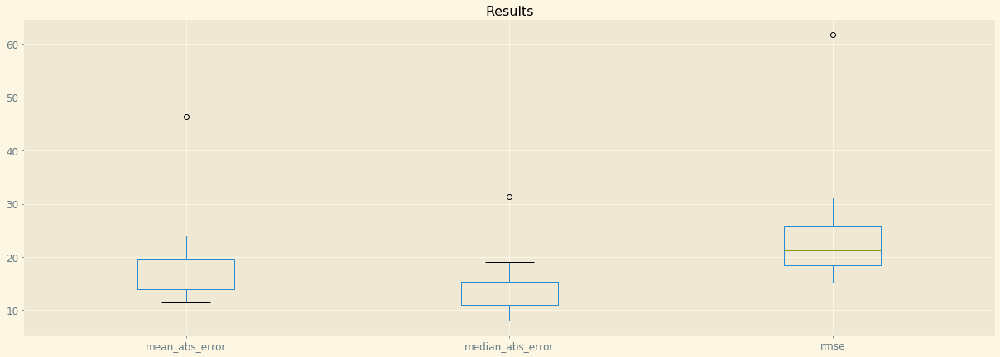

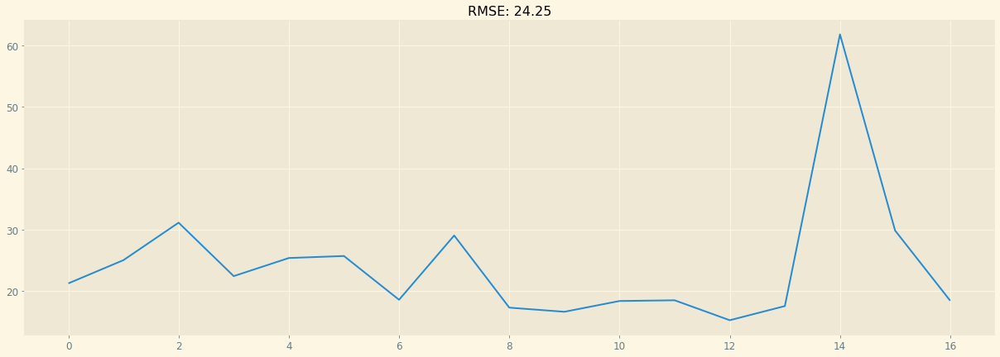

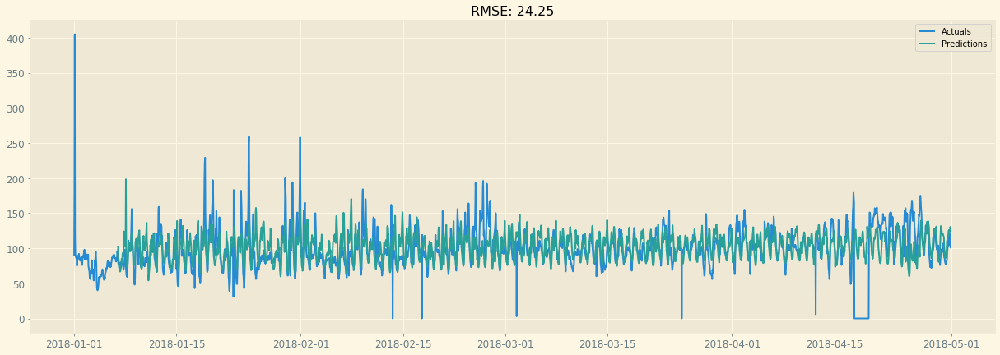

In [9]:
# Generate rolling predictions and results for particle of interest

data = oneparticle_onestation.sort_index().copy()
target = particle_of_interest

fit_func = fit_autoARIMA
predict_func = predict_autoARIMA

min_train_date = '2018-01-01'

week_starts = pd.date_range(min_train_date, data.index.max(), freq='W')

predictions_over_time, results_over_time = [], []

for i, week_start in enumerate(week_starts):
    if i % 10 == 0:
        print(week_start)

    train_set = data.loc[:(week_start - timedelta(hours=1))]
    test_set = data.loc[week_start:(week_start + timedelta(weeks=1, hours=-1))]
    models = train_set.groupby(['weekday', 'hour'])[target].apply(fit_func)
    predictions = test_set.apply(lambda x: predict_func(models.loc[tuple(x[['weekday', 'hour']])], x), axis=1)
    predictions_over_time.append(predictions)    
    results = evaluate_forecast(test_set[target], predictions, 'none')
    results['date'] = week_start
    results_over_time.append(results)  

results_over_time_18 = pd.DataFrame(results_over_time)
predictions_over_time_18 = pd.concat(predictions_over_time)

# Plot results statistics

results_over_time = results_over_time_18

fig, ax = plt.subplots(figsize=(21,7))
results_over_time.drop(['r2_score', 'mse'], axis=1).boxplot()
plt.title('Results')
plt.show()

# Plot RMSE overtime

fig, ax = plt.subplots(figsize=(21,7))
rmse_over_time = plt.plot(results_over_time['rmse'])
error = results_over_time['rmse'].mean()
plt.title('RMSE: %.2f'% error)
plt.show()

# Plot actuals and predictions overtime

plot_actuals_predictions(oneparticle_onestation[particle_of_interest][min_train_date:], predictions_over_time_18, results_over_time_18)

### Station nr 28079024 - Casa de Campo

In [10]:
# Generate dataframe for one particle and one station of interest

station_of_interest = 28079024

print(f'The station of interest is: {station_of_interest}')
print('')

oneparticle_onestation = df_temp.loc[df_temp['station'] == station_of_interest]
oneparticle_onestation = oneparticle_onestation.drop(columns = [x for x in particles_of_interest if x is not particle_of_interest], axis=1)
oneparticle_onestation.drop('station', axis=1, inplace=True)

print(f'Missing values for particle and station of interest: {round(oneparticle_onestation[particle_of_interest].isnull().mean()*100, 2)}%')
print('')
oneparticle_onestation.dropna(inplace=True)

oneparticle_onestation['quarter'] = oneparticle_onestation.index.quarter
oneparticle_onestation['dayofyear'] = oneparticle_onestation.index.dayofyear
oneparticle_onestation['dayofmonth'] = oneparticle_onestation.index.day
oneparticle_onestation['weekyear'] = oneparticle_onestation.index.weekofyear
oneparticle_onestation['weekday'] = oneparticle_onestation.index.weekday
oneparticle_onestation['hour'] = oneparticle_onestation.index.hour
oneparticle_onestation['year'] = oneparticle_onestation.index.year
oneparticle_onestation['month'] = oneparticle_onestation.index.month
oneparticle_onestation.fillna(0, inplace=True)

print(f'One particle, one station DF shape: {oneparticle_onestation.shape}')
oneparticle_onestation.head()

The station of interest is: 28079024

Missing values for particle and station of interest: 0.0%

One particle, one station DF shape: (55488, 9)


,all_particles,quarter,dayofyear,dayofmonth,weekyear,weekday,hour,year,month
date,,,,,,,,,
2012-01-01 00:00:00,88.0,1,1,1,52,6,0,2012,1
2012-01-01 01:00:00,71.0,1,1,1,52,6,1,2012,1
2012-01-01 02:00:00,62.0,1,1,1,52,6,2,2012,1
2012-01-01 03:00:00,71.0,1,1,1,52,6,3,2012,1
2012-01-01 04:00:00,90.0,1,1,1,52,6,4,2012,1


2018-01-07 00:00:00
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2952.769, BIC=2975.266, Time=1.151 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2987.783, BIC=2995.282, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2961.536, BIC=2972.784, Time=0.041 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2968.079, BIC=2979.327, Time=0.149 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3782.915, BIC=3786.664, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2949.986, BIC=2968.733, Time=0.809 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2964.378, BIC=2979.376, Time=0.395 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2947.990, BIC=2962.987, Time=0.782 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2949.986, BIC=2968.733, Time=0.902 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2853.362, BIC=2864.610, Time=0.196 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3594.198, BIC=3597.948, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2841.104, BIC=2859.851, Time=1.963 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2853.196, BIC=2868.194, Time=0.961 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2839.136, BIC=2854.134, Time=0.985 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2841.116, BIC=2859.863, Time=1.007 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2846.869, BIC=2861.867, Time=0.268 seconds
Total fit time: 6.642 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2858.444, BIC=2880.940, Time=0.999 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2882.645, BIC=2890.144, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3152.057, BIC=3163.305, Time=0.198 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3899.897, BIC=3903.646, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3132.492, BIC=3151.239, Time=0.787 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3150.735, BIC=3165.733, Time=0.351 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3131.061, BIC=3146.059, Time=0.749 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3132.684, BIC=3151.431, Time=0.886 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3143.798, BIC=3158.796, Time=0.201 seconds
Total fit time: 4.372 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3143.868, BIC=3166.345, Time=0.691 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3266.470, BIC=3273.963, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3033.703, BIC=3052.450, Time=0.810 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3038.156, BIC=3064.401, Time=1.198 seconds
Total fit time: 6.927 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2982.976, BIC=3005.473, Time=0.978 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3047.407, BIC=3054.906, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3011.546, BIC=3022.794, Time=0.038 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3025.165, BIC=3036.413, Time=0.169 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3848.440, BIC=3852.189, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2981.926, BIC=3000.673, Time=0.831 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3007.126, BIC=3022.123, Time=0.317 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2832.135, BIC=2854.631, Time=1.173 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2884.406, BIC=2891.905, Time=0.025 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2854.925, BIC=2866.173, Time=0.042 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2864.813, BIC=2876.061, Time=0.147 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3621.994, BIC=3625.743, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2829.737, BIC=2848.484, Time=1.113 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2852.052, BIC=2867.049, Time=0.999 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2828.285, BIC=2843.282, Time=1.441 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2829.772, BIC=2848.518, Time=2.551 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2840.889, BIC=2855.

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3151.910, BIC=3163.158, Time=0.241 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3846.448, BIC=3850.197, Time=0.012 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3136.829, BIC=3155.576, Time=1.088 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3153.201, BIC=3168.199, Time=0.362 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3139.730, BIC=3154.727, Time=0.720 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3131.456, BIC=3153.952, Time=1.114 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3147.675, BIC=3166.422, Time=0.375 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3133.399, BIC=3159.644, Time=1.308 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3133.374, BIC=3159.619, Time=0.539 seconds
Fit ARIMA: (0, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3132.871, BIC=3155.367, Time=0.360 seconds
Fit ARIMA: (2, 0, 4

Fit ARIMA: (0, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3081.908, BIC=3104.404, Time=0.447 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3063.709, BIC=3093.704, Time=1.670 seconds
Total fit time: 9.808 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3065.456, BIC=3087.953, Time=1.085 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3129.721, BIC=3137.220, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3092.911, BIC=3104.159, Time=0.066 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3105.498, BIC=3116.746, Time=0.209 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3894.733, BIC=3898.483, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3061.648, BIC=3080.395, Time=0.674 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3094.486, BIC=3109.483, Time=0.212 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2894.877, BIC=2909.874, Time=0.720 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2895.617, BIC=2914.364, Time=0.857 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2898.304, BIC=2913.302, Time=0.212 seconds
Total fit time: 4.219 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3015.642, BIC=3038.139, Time=3.325 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3058.559, BIC=3066.058, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3036.113, BIC=3047.361, Time=0.039 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3043.828, BIC=3055.077, Time=0.244 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3722.862, BIC=3726.611, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3012.730, BIC=3031.477, Time=1.000 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3081.817, BIC=3100.548, Time=0.482 seconds
Total fit time: 2.291 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3079.810, BIC=3102.306, Time=1.027 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3167.591, BIC=3175.090, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3120.887, BIC=3132.135, Time=0.089 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3138.182, BIC=3149.430, Time=0.240 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3912.993, BIC=3916.743, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3075.818, BIC=3094.565, Time=1.140 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3123.798, BIC=3138.795, Time=0.605 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3077.278, BIC=3092.275, Time=0.696 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3074.597, BIC=3089.595, Time=0.298 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3062.457, BIC=3077.454, Time=0.731 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3073.452, BIC=3092.199, Time=0.194 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3072.437, BIC=3087.434, Time=0.206 seconds
Total fit time: 3.969 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2986.121, BIC=3008.618, Time=1.075 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3019.749, BIC=3027.248, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3012.341, BIC=3023.589, Time=0.080 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3015.241, BIC=3026.489, Time=0.183 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3794.462, BIC=3798.211, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2831.462, BIC=2857.707, Time=1.363 seconds
Fit ARIMA: (0, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2857.238, BIC=2879.734, Time=0.531 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2834.302, BIC=2864.297, Time=1.394 seconds
Fit ARIMA: (1, 0, 5)x(0, 0, 0, 0) (constant=True); AIC=2832.851, BIC=2862.846, Time=1.148 seconds
Fit ARIMA: (0, 0, 5)x(0, 0, 0, 0) (constant=True); AIC=2849.582, BIC=2875.827, Time=1.076 seconds
Fit ARIMA: (2, 0, 5)x(0, 0, 0, 0) (constant=True); AIC=2834.415, BIC=2868.160, Time=2.186 seconds
Total fit time: 14.589 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2838.944, BIC=2861.441, Time=1.209 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2877.581, BIC=2885.080, Time=0.017 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2864.111, BIC=2875.359, Time=0.078 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3172.329, BIC=3194.807, Time=0.974 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3334.280, BIC=3341.773, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3246.710, BIC=3257.948, Time=0.037 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3167.628, BIC=3178.867, Time=0.136 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3332.295, BIC=3336.041, Time=0.012 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3169.082, BIC=3184.066, Time=0.225 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3169.017, BIC=3184.002, Time=0.193 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3170.693, BIC=3189.424, Time=0.468 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 2.067 seconds
Performing stepwise search 

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3048.970, BIC=3067.717, Time=0.535 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3097.640, BIC=3112.637, Time=0.370 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3052.651, BIC=3067.648, Time=0.539 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3047.802, BIC=3070.298, Time=0.836 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3091.170, BIC=3109.917, Time=0.299 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3051.495, BIC=3077.741, Time=1.153 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3043.926, BIC=3070.172, Time=0.976 seconds
Fit ARIMA: (0, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3082.647, BIC=3105.143, Time=0.372 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3046.930, BIC=3076.925, Time=1.403 seconds
Fit ARIMA: (1, 0, 5)x(0, 0, 0, 0) (constant=True); AIC=3044.464, BIC=3074.459, Time=1.453 seconds
Fit ARIMA: (0, 0, 5)

Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2938.150, BIC=2964.396, Time=1.054 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2937.013, BIC=2963.259, Time=1.132 seconds
Fit ARIMA: (0, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2959.497, BIC=2981.993, Time=0.524 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2939.715, BIC=2969.710, Time=1.587 seconds
Near non-invertible roots for order (2, 0, 4)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Total fit time: 8.812 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2906.489, BIC=2928.985, Time=0.940 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2964.187, BIC=2971.685, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2937.786, BIC=2949.034, Time=0.080 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2946.400, BIC=2957.648, Time

Fit ARIMA: (3, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2865.125, BIC=2898.869, Time=1.583 seconds
Total fit time: 13.125 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2853.252, BIC=2875.749, Time=1.078 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2909.776, BIC=2917.275, Time=0.024 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2884.044, BIC=2895.292, Time=0.074 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2892.296, BIC=2903.545, Time=0.196 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3643.305, BIC=3647.054, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2849.797, BIC=2868.544, Time=0.661 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2884.347, BIC=2899.345, Time=0.239 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2850.412, BIC=2865.410, Time=0.539 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2979.687, BIC=3002.184, Time=1.018 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3045.340, BIC=3052.839, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3007.206, BIC=3018.454, Time=0.100 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3020.022, BIC=3031.271, Time=0.189 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3813.351, BIC=3817.100, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2975.845, BIC=2994.592, Time=0.803 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3009.472, BIC=3024.470, Time=0.329 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2974.964, BIC=2989.962, Time=0.578 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2976.063, BIC=2994.810, Time=0.801 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2991.519, BIC=3006.

Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3113.551, BIC=3128.548, Time=0.401 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3072.299, BIC=3087.297, Time=0.754 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3071.789, BIC=3094.285, Time=0.958 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3101.254, BIC=3120.001, Time=0.569 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3076.337, BIC=3102.583, Time=1.178 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3072.947, BIC=3099.193, Time=1.034 seconds
Fit ARIMA: (0, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3090.098, BIC=3112.594, Time=0.559 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3072.390, BIC=3102.386, Time=1.418 seconds
Total fit time: 8.869 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3082.363, BIC=3104.860, Time=1.883 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2957.684, BIC=2976.431, Time=1.072 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2985.697, BIC=3000.695, Time=0.490 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2959.619, BIC=2974.616, Time=0.940 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2955.221, BIC=2977.717, Time=1.199 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2979.116, BIC=2997.863, Time=0.418 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2957.870, BIC=2984.116, Time=1.421 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2956.514, BIC=2982.759, Time=1.140 seconds
Fit ARIMA: (0, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2970.388, BIC=2992.884, Time=0.744 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2958.295, BIC=2988.291, Time=1.927 seconds
Total fit time: 11.359 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2797.179, BIC=2815.926, Time=0.841 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2813.198, BIC=2828.195, Time=0.345 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2795.186, BIC=2810.184, Time=1.005 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2797.244, BIC=2815.991, Time=0.874 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2808.462, BIC=2823.460, Time=0.339 seconds
Total fit time: 4.706 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2822.984, BIC=2845.480, Time=1.395 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2858.780, BIC=2866.279, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2837.335, BIC=2848.583, Time=0.103 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2841.772, BIC=2853.020, Time=0.267 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3049.884, BIC=3068.631, Time=0.912 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3053.053, BIC=3071.800, Time=1.185 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3045.861, BIC=3072.106, Time=1.411 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3047.028, BIC=3073.274, Time=1.170 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3055.541, BIC=3070.539, Time=0.677 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3045.072, BIC=3067.568, Time=0.996 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3045.075, BIC=3067.571, Time=1.479 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3049.451, BIC=3079.446, Time=1.535 seconds
Total fit time: 11.363 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3041.126, BIC=3063.622, Time=1.457 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3108.276, BIC=3119.525, Time=0.234 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3868.898, BIC=3872.647, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3060.596, BIC=3079.343, Time=0.860 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3097.369, BIC=3112.367, Time=0.374 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3058.700, BIC=3073.698, Time=0.593 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3060.625, BIC=3079.372, Time=1.000 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3076.472, BIC=3091.469, Time=0.097 seconds
Total fit time: 4.505 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3020.301, BIC=3042.797, Time=1.173 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3063.553, BIC=3071.052, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2831.065, BIC=2842.313, Time=0.215 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3622.803, BIC=3626.552, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2816.744, BIC=2835.491, Time=1.097 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2831.315, BIC=2846.313, Time=0.369 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2815.619, BIC=2830.617, Time=0.696 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2817.041, BIC=2835.788, Time=1.026 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2828.639, BIC=2843.637, Time=0.122 seconds
Total fit time: 4.829 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2807.628, BIC=2830.125, Time=1.098 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2826.890, BIC=2834.389, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2970.176, BIC=2985.173, Time=0.724 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2971.705, BIC=2990.452, Time=1.126 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2985.486, BIC=3000.484, Time=0.118 seconds
Total fit time: 4.696 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3012.513, BIC=3035.010, Time=1.060 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3086.216, BIC=3093.715, Time=0.017 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3043.077, BIC=3054.325, Time=0.075 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3058.953, BIC=3070.201, Time=0.185 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3861.288, BIC=3865.038, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3010.275, BIC=3029.022, Time=0.852 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3056.763, BIC=3075.510, Time=0.883 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3080.671, BIC=3095.669, Time=0.271 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3054.845, BIC=3069.842, Time=0.610 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3056.771, BIC=3075.518, Time=0.798 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3064.968, BIC=3079.966, Time=0.216 seconds
Total fit time: 4.249 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3002.845, BIC=3025.341, Time=1.183 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3076.548, BIC=3084.047, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3023.903, BIC=3035.152, Time=0.054 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3042.376, BIC=3053.624, Time=0.217 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2887.361, BIC=2898.619, Time=0.457 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3643.288, BIC=3647.041, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2865.487, BIC=2884.250, Time=0.981 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2866.155, BIC=2884.918, Time=0.811 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2859.436, BIC=2885.704, Time=1.576 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2861.256, BIC=2883.771, Time=1.068 seconds
Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2858.845, BIC=2888.865, Time=1.609 seconds
Fit ARIMA: (4, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2856.271, BIC=2882.539, Time=1.708 seconds
Fit ARIMA: (4, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2859.410, BIC=2881.925, Time=0.463 seconds
Fit ARIMA: (5, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2860.304, BIC=2890.324, Time=0.871 seconds
Fit ARIMA: (3, 0, 0

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3033.697, BIC=3048.707, Time=0.664 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3044.636, BIC=3059.646, Time=0.227 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3039.226, BIC=3054.236, Time=0.113 seconds
Total fit time: 6.831 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3144.838, BIC=3167.353, Time=1.218 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3146.317, BIC=3153.822, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3143.334, BIC=3154.592, Time=0.077 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3143.694, BIC=3154.952, Time=0.150 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3858.275, BIC=3862.027, Time=0.010 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3144.763, BIC=3159.774, Time=0.143 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3086.283, BIC=3101.293, Time=0.642 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3087.080, BIC=3105.843, Time=0.804 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3101.375, BIC=3116.386, Time=0.191 seconds
Total fit time: 4.221 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3070.633, BIC=3093.149, Time=1.378 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3146.609, BIC=3154.114, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3097.705, BIC=3108.963, Time=0.042 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3114.795, BIC=3126.052, Time=0.204 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3915.105, BIC=3918.858, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3067.506, BIC=3086.268, Time=0.684 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2903.275, BIC=2922.037, Time=0.753 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2926.965, BIC=2941.975, Time=0.287 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2902.182, BIC=2917.192, Time=0.620 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2903.381, BIC=2922.144, Time=0.798 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2915.384, BIC=2930.395, Time=0.181 seconds
Total fit time: 3.794 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2838.074, BIC=2860.589, Time=1.092 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2905.047, BIC=2912.552, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2864.340, BIC=2875.598, Time=0.044 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2878.583, BIC=2889.841, Time=0.147 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2966.166, BIC=2977.423, Time=0.212 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3743.113, BIC=3746.866, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2935.005, BIC=2953.768, Time=0.795 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2963.171, BIC=2978.181, Time=0.354 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2933.005, BIC=2948.016, Time=0.683 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2935.005, BIC=2953.768, Time=0.855 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2951.571, BIC=2966.581, Time=0.331 seconds
Total fit time: 4.439 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3098.903, BIC=3121.419, Time=1.388 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3126.106, BIC=3133.611, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3075.064, BIC=3093.827, Time=0.778 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3119.388, BIC=3134.399, Time=0.340 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3074.022, BIC=3089.032, Time=0.555 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3075.298, BIC=3094.061, Time=0.841 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3091.662, BIC=3106.672, Time=0.090 seconds
Total fit time: 3.949 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3054.489, BIC=3077.004, Time=1.327 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3160.784, BIC=3168.289, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3090.223, BIC=3101.481, Time=0.125 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3116.828, BIC=3128.086, Time=0.365 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3025.564, BIC=3048.079, Time=1.235 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3033.350, BIC=3052.112, Time=0.446 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3024.003, BIC=3042.765, Time=1.013 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3025.834, BIC=3052.102, Time=1.591 seconds
Near non-invertible roots for order (2, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.993)
Total fit time: 8.265 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2963.450, BIC=2985.965, Time=0.833 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3010.040, BIC=3017.545, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2986.782, BIC=2998.040, Time=0.071 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2995.731, BIC=3006.989, Time

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2836.425, BIC=2855.187, Time=1.028 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2841.511, BIC=2856.521, Time=0.320 seconds
Total fit time: 4.274 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2828.909, BIC=2851.424, Time=1.072 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2868.905, BIC=2876.410, Time=0.025 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2839.154, BIC=2850.412, Time=0.040 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2848.635, BIC=2859.893, Time=0.192 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3609.190, BIC=3612.943, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2826.658, BIC=2845.421, Time=0.757 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2835.870, BIC=2850.880, Time=0.201 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3161.030, BIC=3179.793, Time=0.821 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3176.063, BIC=3191.073, Time=0.196 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3159.213, BIC=3174.224, Time=0.628 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3161.056, BIC=3179.819, Time=0.862 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3170.433, BIC=3185.443, Time=0.208 seconds
Total fit time: 3.997 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3139.834, BIC=3162.331, Time=0.759 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3288.820, BIC=3296.319, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3206.778, BIC=3218.026, Time=0.069 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3136.083, BIC=3147.332, Time=0.171 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=F

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3125.531, BIC=3148.046, Time=1.042 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3155.722, BIC=3163.227, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3143.346, BIC=3154.604, Time=0.045 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3146.705, BIC=3157.963, Time=0.234 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3896.312, BIC=3900.065, Time=0.014 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3122.578, BIC=3141.341, Time=0.790 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3143.377, BIC=3158.387, Time=0.289 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3122.204, BIC=3137.215, Time=0.595 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3122.981, BIC=3141.743, Time=0.855 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3137.266, BIC=3152.

Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2923.519, BIC=2949.787, Time=1.270 seconds
Fit ARIMA: (0, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2945.252, BIC=2967.768, Time=0.441 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2923.631, BIC=2953.651, Time=1.157 seconds
Fit ARIMA: (1, 0, 5)x(0, 0, 0, 0) (constant=True); AIC=2925.042, BIC=2955.063, Time=1.327 seconds
Fit ARIMA: (0, 0, 5)x(0, 0, 0, 0) (constant=True); AIC=2941.874, BIC=2968.142, Time=0.438 seconds
Fit ARIMA: (2, 0, 5)x(0, 0, 0, 0) (constant=True); AIC=2924.741, BIC=2958.514, Time=1.531 seconds
Total fit time: 12.691 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2886.751, BIC=2909.267, Time=1.215 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2932.167, BIC=2939.672, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2920.009, BIC=2931.267, Time=0.075 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3013.325, BIC=3024.583, Time=0.149 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3742.126, BIC=3745.878, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2974.608, BIC=2993.371, Time=0.735 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3003.639, BIC=3018.649, Time=0.345 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2973.267, BIC=2988.277, Time=0.575 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2974.743, BIC=2993.506, Time=0.719 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2991.871, BIC=3006.882, Time=0.191 seconds
Total fit time: 3.867 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3047.216, BIC=3069.732, Time=0.988 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3073.122, BIC=3080.627, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3100.776, BIC=3119.539, Time=0.700 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3131.294, BIC=3146.304, Time=0.317 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3100.125, BIC=3115.135, Time=0.621 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3101.015, BIC=3119.778, Time=0.803 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3117.146, BIC=3132.156, Time=0.192 seconds
Total fit time: 3.905 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3080.637, BIC=3103.152, Time=1.055 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3155.976, BIC=3163.482, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3120.932, BIC=3132.190, Time=0.044 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3134.341, BIC=3145.599, Time=0.204 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3138.478, BIC=3157.241, Time=0.884 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3152.255, BIC=3167.265, Time=0.211 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3138.277, BIC=3153.287, Time=1.107 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3138.493, BIC=3157.256, Time=1.205 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3147.109, BIC=3162.119, Time=0.223 seconds
Total fit time: 4.937 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3015.261, BIC=3037.776, Time=1.231 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3052.247, BIC=3059.752, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3038.404, BIC=3049.662, Time=0.083 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3043.171, BIC=3054.428, Time=0.178 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2903.512, BIC=2933.532, Time=1.233 seconds
Fit ARIMA: (3, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2905.547, BIC=2939.320, Time=1.465 seconds
Fit ARIMA: (2, 0, 5)x(0, 0, 0, 0) (constant=True); AIC=2905.245, BIC=2939.019, Time=1.515 seconds
Fit ARIMA: (1, 0, 5)x(0, 0, 0, 0) (constant=True); AIC=2902.475, BIC=2932.495, Time=1.268 seconds
Fit ARIMA: (0, 0, 5)x(0, 0, 0, 0) (constant=True); AIC=2927.910, BIC=2954.178, Time=0.775 seconds
Total fit time: 13.198 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2880.755, BIC=2903.270, Time=1.084 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2940.057, BIC=2947.563, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2913.228, BIC=2924.486, Time=0.080 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2921.726, BIC=2932.984, Time=0.214 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2964.059, BIC=2979.070, Time=0.495 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2964.652, BIC=2983.415, Time=0.743 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2985.465, BIC=3000.475, Time=0.209 seconds
Total fit time: 3.739 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2988.098, BIC=3010.614, Time=1.116 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3054.741, BIC=3062.246, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3016.026, BIC=3027.284, Time=0.226 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3029.070, BIC=3040.328, Time=0.187 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3824.989, BIC=3828.741, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2984.359, BIC=3003.122, Time=0.761 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3134.901, BIC=3146.158, Time=0.213 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3915.750, BIC=3919.502, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3081.536, BIC=3100.299, Time=0.908 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3122.568, BIC=3137.578, Time=0.361 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3081.663, BIC=3096.673, Time=0.473 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3081.781, BIC=3104.296, Time=0.853 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3110.885, BIC=3129.648, Time=0.673 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3081.960, BIC=3100.723, Time=0.813 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3085.690, BIC=3111.958, Time=1.193 seconds
Total fit time: 6.487 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2998.150, BIC=3009.407, Time=0.149 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3794.417, BIC=3798.170, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2966.083, BIC=2984.845, Time=0.746 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2994.366, BIC=3009.376, Time=0.285 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2968.070, BIC=2983.080, Time=0.679 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2963.614, BIC=2986.129, Time=0.928 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2987.576, BIC=3006.339, Time=0.300 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2965.719, BIC=2991.987, Time=1.243 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2964.887, BIC=2991.155, Time=1.018 seconds
Fit ARIMA: (0, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2978.839, BIC=3001.355, Time=0.554 seconds
Fit ARIMA: (2, 0, 4

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2824.367, BIC=2835.625, Time=0.145 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3603.965, BIC=3607.718, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2806.447, BIC=2825.210, Time=0.841 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2822.470, BIC=2837.480, Time=0.321 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2804.468, BIC=2819.478, Time=0.646 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2806.456, BIC=2825.219, Time=0.808 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2817.599, BIC=2832.610, Time=0.262 seconds
Total fit time: 4.209 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2832.452, BIC=2854.968, Time=1.598 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2867.474, BIC=2874.979, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3114.508, BIC=3125.766, Time=0.193 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3895.955, BIC=3899.708, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3058.596, BIC=3077.359, Time=0.610 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3061.773, BIC=3080.536, Time=0.778 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3054.584, BIC=3080.852, Time=1.065 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3055.741, BIC=3082.009, Time=1.054 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3064.279, BIC=3079.290, Time=0.624 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3053.787, BIC=3076.302, Time=0.844 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3053.769, BIC=3076.285, Time=0.934 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3056.945, BIC=3086.966, Time=1.278 seconds
Total fit time: 8.5

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3071.875, BIC=3094.390, Time=0.969 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3158.271, BIC=3165.777, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3098.437, BIC=3109.695, Time=0.036 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3117.933, BIC=3129.191, Time=0.175 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3880.567, BIC=3884.319, Time=0.015 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3069.793, BIC=3088.556, Time=1.237 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3106.908, BIC=3121.918, Time=0.580 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3067.883, BIC=3082.893, Time=0.704 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3069.818, BIC=3088.581, Time=0.753 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3085.829, BIC=3100.

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2829.321, BIC=2848.084, Time=2.368 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2840.726, BIC=2855.736, Time=0.403 seconds
Total fit time: 7.180 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2829.398, BIC=2851.913, Time=2.451 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2845.728, BIC=2853.233, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2837.512, BIC=2848.770, Time=0.076 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2839.060, BIC=2850.318, Time=0.315 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3634.133, BIC=3637.885, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2824.692, BIC=2843.455, Time=1.680 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2839.311, BIC=2854.322, Time=0.838 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3020.130, BIC=3031.387, Time=0.220 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3841.258, BIC=3845.011, Time=0.013 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2980.304, BIC=2999.067, Time=0.906 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3010.364, BIC=3025.374, Time=0.480 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2978.978, BIC=2993.989, Time=1.035 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2980.482, BIC=2999.245, Time=518.867 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2994.283, BIC=3009.294, Time=1.796 seconds
Total fit time: 524.862 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3021.769, BIC=3044.284, Time=6.337 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3096.376, BIC=3103.881, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (const

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3106.245, BIC=3117.503, Time=0.202 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3883.781, BIC=3887.533, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3067.577, BIC=3086.340, Time=2.336 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3095.842, BIC=3110.852, Time=1.304 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3066.754, BIC=3081.764, Time=1.215 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3067.780, BIC=3086.542, Time=1.695 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3080.094, BIC=3095.104, Time=0.267 seconds
Total fit time: 8.435 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3068.437, BIC=3090.952, Time=1.734 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3134.341, BIC=3141.846, Time=0.017 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2901.247, BIC=2912.514, Time=0.312 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3676.379, BIC=3680.135, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2884.679, BIC=2903.458, Time=0.826 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2900.700, BIC=2915.723, Time=0.431 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2883.351, BIC=2898.374, Time=0.994 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2884.945, BIC=2903.724, Time=1.113 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2893.167, BIC=2908.190, Time=0.272 seconds
Total fit time: 5.625 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2876.101, BIC=2898.635, Time=1.356 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2913.049, BIC=2920.560, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3045.038, BIC=3063.817, Time=1.022 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3054.361, BIC=3069.384, Time=0.249 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3043.056, BIC=3058.079, Time=1.312 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3045.055, BIC=3063.834, Time=1.422 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3048.766, BIC=3063.789, Time=0.477 seconds
Total fit time: 6.061 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3153.908, BIC=3176.443, Time=3.273 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3155.454, BIC=3162.965, Time=0.024 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3152.406, BIC=3163.673, Time=0.102 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3152.775, BIC=3164.042, Time=0.206 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3095.732, BIC=3114.510, Time=0.690 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3134.695, BIC=3149.718, Time=0.425 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3095.414, BIC=3110.437, Time=0.714 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3096.144, BIC=3114.922, Time=1.234 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3110.891, BIC=3125.914, Time=0.240 seconds
Total fit time: 5.056 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3080.344, BIC=3102.878, Time=1.094 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3156.460, BIC=3163.971, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3107.612, BIC=3118.879, Time=0.041 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3124.748, BIC=3136.016, Time=0.277 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2949.392, BIC=2960.659, Time=0.255 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3765.335, BIC=3769.091, Time=0.014 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2911.668, BIC=2930.446, Time=1.211 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2935.664, BIC=2950.687, Time=0.388 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2910.573, BIC=2925.596, Time=0.894 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2911.776, BIC=2930.555, Time=1.088 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2923.950, BIC=2938.973, Time=0.245 seconds
Total fit time: 5.596 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2846.748, BIC=2869.283, Time=1.286 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2914.409, BIC=2921.921, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2975.293, BIC=2986.560, Time=0.183 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3754.335, BIC=3758.091, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2944.174, BIC=2962.952, Time=0.974 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2972.455, BIC=2987.478, Time=0.479 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2942.180, BIC=2957.203, Time=0.831 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2944.176, BIC=2962.954, Time=1.068 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2960.740, BIC=2975.763, Time=0.649 seconds
Total fit time: 5.642 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3109.891, BIC=3132.425, Time=1.589 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3135.087, BIC=3142.599, Time=0.023 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3084.062, BIC=3102.841, Time=0.982 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3100.492, BIC=3115.515, Time=0.098 seconds
Total fit time: 8.242 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3063.371, BIC=3085.906, Time=1.672 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3170.770, BIC=3178.281, Time=0.017 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3099.291, BIC=3110.559, Time=0.132 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3125.709, BIC=3136.976, Time=0.241 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3925.502, BIC=3929.258, Time=0.013 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3061.332, BIC=3080.111, Time=0.901 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3108.573, BIC=3123.596, Time=0.451 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3035.186, BIC=3061.476, Time=2.122 seconds
Near non-invertible roots for order (2, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.995)
Total fit time: 9.928 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2972.303, BIC=2994.837, Time=1.609 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3019.919, BIC=3027.430, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2996.283, BIC=3007.551, Time=0.086 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3005.448, BIC=3016.716, Time=0.264 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3833.937, BIC=3837.692, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2970.480, BIC=2989.258, Time=0.839 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2986.201, BIC=3001.224, Tim

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2842.616, BIC=2857.639, Time=1.193 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2844.548, BIC=2863.326, Time=1.471 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2849.588, BIC=2864.611, Time=0.894 seconds
Total fit time: 8.300 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2836.931, BIC=2859.466, Time=1.753 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2877.213, BIC=2884.725, Time=0.020 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2847.240, BIC=2858.508, Time=0.063 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2856.823, BIC=2868.090, Time=0.384 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3620.295, BIC=3624.051, Time=0.014 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2834.666, BIC=2853.445, Time=1.869 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3191.395, BIC=3202.662, Time=0.296 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3927.316, BIC=3931.072, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3170.041, BIC=3188.820, Time=1.470 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3185.117, BIC=3200.140, Time=0.610 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3168.224, BIC=3183.247, Time=1.125 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3170.061, BIC=3188.840, Time=1.475 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3179.502, BIC=3194.525, Time=0.376 seconds
Total fit time: 6.918 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3145.975, BIC=3168.509, Time=1.487 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3203.366, BIC=3210.878, Time=0.023 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3164.551, BIC=3183.330, Time=3.360 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3187.058, BIC=3202.081, Time=0.680 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3163.726, BIC=3178.749, Time=1.038 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3164.704, BIC=3183.482, Time=1.271 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3175.902, BIC=3190.925, Time=0.311 seconds
Total fit time: 9.241 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3135.245, BIC=3157.779, Time=1.688 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3165.261, BIC=3172.772, Time=0.018 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3152.591, BIC=3163.858, Time=0.060 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3156.056, BIC=3167.323, Time=0.380 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2936.676, BIC=2955.455, Time=1.320 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2965.523, BIC=2980.546, Time=0.549 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2942.316, BIC=2957.339, Time=1.108 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2936.373, BIC=2958.907, Time=1.258 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2963.578, BIC=2982.356, Time=0.375 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2938.749, BIC=2965.039, Time=1.983 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2933.051, BIC=2959.342, Time=1.715 seconds
Fit ARIMA: (0, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2954.916, BIC=2977.451, Time=0.519 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2933.638, BIC=2963.684, Time=2.244 seconds
Fit ARIMA: (1, 0, 5)x(0, 0, 0, 0) (constant=True); AIC=2934.551, BIC=2964.597, Time=2.090 seconds
Fit ARIMA: (0, 0, 5)

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2872.491, BIC=2887.514, Time=1.005 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2871.314, BIC=2893.849, Time=1.383 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2893.861, BIC=2912.640, Time=0.641 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2871.799, BIC=2890.578, Time=1.163 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2875.617, BIC=2901.907, Time=1.746 seconds
Near non-invertible roots for order (2, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.997)
Total fit time: 9.575 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2984.559, BIC=3007.093, Time=1.625 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3044.940, BIC=3052.452, Time=0.017 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3013.566, BIC=3024.833, Time

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3170.823, BIC=3185.846, Time=1.015 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3172.029, BIC=3190.808, Time=1.441 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3184.305, BIC=3199.328, Time=0.414 seconds
Total fit time: 7.137 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3112.651, BIC=3135.185, Time=1.580 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3170.392, BIC=3177.904, Time=0.017 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3140.235, BIC=3151.502, Time=0.042 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3150.020, BIC=3161.287, Time=0.321 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3933.842, BIC=3937.597, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3109.781, BIC=3128.559, Time=1.508 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3152.545, BIC=3175.079, Time=1.414 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3177.187, BIC=3184.699, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3167.705, BIC=3178.972, Time=0.106 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3170.982, BIC=3182.249, Time=0.256 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3891.289, BIC=3895.045, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3147.695, BIC=3166.474, Time=1.253 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3161.473, BIC=3176.496, Time=0.272 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3147.561, BIC=3162.584, Time=0.879 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3147.727, BIC=3166.505, Time=1.008 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3156.383, BIC=3171.406, Time=0.258 seconds
Total fit time: 5.4

Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2914.368, BIC=2936.902, Time=1.715 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2937.333, BIC=2956.111, Time=0.485 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2918.590, BIC=2944.880, Time=2.030 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2912.932, BIC=2939.222, Time=1.919 seconds
Fit ARIMA: (0, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2936.018, BIC=2958.553, Time=1.020 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2912.254, BIC=2942.300, Time=2.046 seconds
Fit ARIMA: (3, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2909.837, BIC=2943.638, Time=3.015 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2917.133, BIC=2947.179, Time=2.517 seconds
Fit ARIMA: (4, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2910.177, BIC=2947.734, Time=3.493 seconds
Fit ARIMA: (3, 0, 5)x(0, 0, 0, 0) (constant=True); AIC=2911.155, BIC=2948.713, Time=3.542 seconds
Fit ARIMA: (2, 0, 5)

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2976.064, BIC=2998.599, Time=2.729 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3075.404, BIC=3082.915, Time=0.017 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3015.449, BIC=3026.716, Time=0.041 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3036.656, BIC=3047.923, Time=2.169 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3778.026, BIC=3781.782, Time=0.012 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2972.580, BIC=2991.359, Time=2.530 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3024.149, BIC=3039.172, Time=1.406 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2972.560, BIC=2987.583, Time=0.697 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2973.127, BIC=2991.905, Time=1.034 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2994.071, BIC=3009.

Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3158.131, BIC=3173.154, Time=0.625 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3122.581, BIC=3137.604, Time=1.147 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3123.071, BIC=3141.850, Time=2.979 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3139.647, BIC=3154.670, Time=0.195 seconds
Total fit time: 8.109 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3092.332, BIC=3114.866, Time=1.774 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3170.691, BIC=3178.203, Time=0.021 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3128.920, BIC=3140.187, Time=0.060 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3143.854, BIC=3155.121, Time=0.410 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3927.902, BIC=3931.658, Time=0.012 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3019.355, BIC=3045.646, Time=1.652 seconds
Fit ARIMA: (0, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3036.815, BIC=3059.349, Time=1.701 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3021.410, BIC=3051.456, Time=10.271 seconds
Fit ARIMA: (1, 0, 5)x(0, 0, 0, 0) (constant=True); AIC=3021.195, BIC=3051.241, Time=2.803 seconds
Fit ARIMA: (0, 0, 5)x(0, 0, 0, 0) (constant=True); AIC=3033.268, BIC=3059.559, Time=1.387 seconds
Fit ARIMA: (2, 0, 5)x(0, 0, 0, 0) (constant=True); AIC=3024.340, BIC=3058.142, Time=4.235 seconds
Total fit time: 31.375 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2982.695, BIC=3005.229, Time=2.040 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3014.878, BIC=3022.390, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3003.253, BIC=3014.521, Time=0.088 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2800.985, BIC=2819.764, Time=1.272 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2801.117, BIC=2819.896, Time=1.130 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2804.356, BIC=2830.647, Time=2.328 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2802.434, BIC=2828.725, Time=3.851 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2799.490, BIC=2814.513, Time=0.853 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2819.401, BIC=2834.424, Time=0.490 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2813.087, BIC=2828.110, Time=0.316 seconds
Total fit time: 12.151 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2816.465, BIC=2839.000, Time=1.266 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2846.749, BIC=2854.260, Time=0.031 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3083.300, BIC=3098.323, Time=0.410 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3041.499, BIC=3056.522, Time=0.907 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3035.123, BIC=3057.657, Time=1.309 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3065.037, BIC=3083.816, Time=0.427 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3037.123, BIC=3063.413, Time=1.618 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3037.123, BIC=3063.413, Time=1.346 seconds
Fit ARIMA: (0, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3055.520, BIC=3078.055, Time=0.555 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3038.868, BIC=3068.914, Time=1.730 seconds
Total fit time: 12.899 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3061.542, BIC=3084.077, Time=1.561 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3108.074, BIC=3130.608, Time=1.113 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3205.329, BIC=3212.841, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3131.431, BIC=3142.699, Time=0.045 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3155.323, BIC=3166.590, Time=0.173 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3915.730, BIC=3919.486, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3107.489, BIC=3126.268, Time=1.069 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3142.541, BIC=3157.564, Time=0.310 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3105.742, BIC=3120.765, Time=0.895 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3107.552, BIC=3126.331, Time=1.126 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3121.363, BIC=3136.

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2868.532, BIC=2887.311, Time=1.033 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2881.606, BIC=2896.629, Time=0.150 seconds
Total fit time: 5.064 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2839.631, BIC=2862.166, Time=1.325 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2869.747, BIC=2877.258, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2852.468, BIC=2863.735, Time=0.098 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2856.453, BIC=2867.720, Time=0.219 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3670.043, BIC=3673.799, Time=0.020 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2837.585, BIC=2856.363, Time=1.391 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2854.436, BIC=2869.459, Time=0.517 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2958.971, BIC=2970.238, Time=0.171 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3805.110, BIC=3808.866, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2914.467, BIC=2933.246, Time=0.964 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2946.364, BIC=2961.387, Time=0.459 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2912.955, BIC=2927.978, Time=0.776 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2914.587, BIC=2933.366, Time=1.252 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2926.993, BIC=2942.016, Time=0.184 seconds
Total fit time: 5.195 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2992.438, BIC=3014.972, Time=1.599 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3057.996, BIC=3065.508, Time=0.028 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3133.946, BIC=3145.213, Time=0.183 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3905.060, BIC=3908.816, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3098.065, BIC=3116.844, Time=0.834 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3126.453, BIC=3141.476, Time=0.371 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3096.069, BIC=3111.092, Time=0.673 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3098.066, BIC=3116.845, Time=1.139 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3111.414, BIC=3126.437, Time=0.134 seconds
Total fit time: 4.547 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3081.280, BIC=3103.815, Time=1.375 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3139.614, BIC=3147.125, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2926.439, BIC=2937.715, Time=0.283 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3719.394, BIC=3723.153, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2907.585, BIC=2926.379, Time=1.146 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2925.426, BIC=2940.462, Time=0.381 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2906.168, BIC=2921.203, Time=0.863 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2907.763, BIC=2926.557, Time=1.176 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2918.426, BIC=2933.462, Time=0.425 seconds
Total fit time: 5.539 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2896.574, BIC=2919.128, Time=1.979 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2926.810, BIC=2934.327, Time=0.017 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2902.222, BIC=2917.258, Time=0.275 seconds
Total fit time: 8.804 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2996.498, BIC=3019.051, Time=1.219 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3035.049, BIC=3042.567, Time=0.017 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3004.838, BIC=3016.115, Time=0.043 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3011.364, BIC=3022.641, Time=0.185 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3749.922, BIC=3753.681, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2993.781, BIC=3012.576, Time=0.962 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3009.041, BIC=3024.076, Time=0.389 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2992.124, BIC=3007.160, Time=0.832 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3147.391, BIC=3162.426, Time=0.762 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3149.312, BIC=3168.107, Time=1.009 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3164.252, BIC=3179.288, Time=0.205 seconds
Total fit time: 5.341 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3092.741, BIC=3115.294, Time=1.127 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3195.868, BIC=3203.386, Time=0.027 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3122.651, BIC=3133.928, Time=0.045 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3146.056, BIC=3157.333, Time=0.188 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3941.065, BIC=3944.824, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3091.339, BIC=3110.133, Time=0.630 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2954.716, BIC=2977.270, Time=1.326 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2954.805, BIC=2977.358, Time=1.435 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2953.511, BIC=2983.582, Time=2.734 seconds
Total fit time: 17.372 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2955.916, BIC=2978.470, Time=1.408 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3020.865, BIC=3028.383, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2988.688, BIC=2999.964, Time=0.141 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3000.870, BIC=3012.146, Time=0.254 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3813.006, BIC=3816.765, Time=0.012 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2956.215, BIC=2975.009, Time=0.939 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2884.910, BIC=2896.187, Time=0.272 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3633.257, BIC=3637.016, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2857.417, BIC=2876.211, Time=1.014 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2878.677, BIC=2893.712, Time=0.373 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2855.875, BIC=2870.910, Time=0.804 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2857.489, BIC=2876.284, Time=1.420 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2870.700, BIC=2885.735, Time=0.270 seconds
Total fit time: 5.539 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2908.385, BIC=2930.938, Time=1.373 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2938.853, BIC=2946.371, Time=0.026 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3155.618, BIC=3170.641, Time=0.556 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3156.663, BIC=3175.442, Time=0.891 seconds
Total fit time: 3.706 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3118.640, BIC=3141.174, Time=1.496 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3259.667, BIC=3267.179, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3185.687, BIC=3196.954, Time=0.090 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3117.106, BIC=3128.374, Time=0.279 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3257.668, BIC=3261.424, Time=0.015 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3118.778, BIC=3133.801, Time=0.349 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3118.667, BIC=3133.690, Time=0.311 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3106.233, BIC=3125.028, Time=1.924 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3127.840, BIC=3142.875, Time=0.499 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3106.415, BIC=3121.450, Time=1.235 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3107.853, BIC=3130.407, Time=1.952 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3123.918, BIC=3142.713, Time=1.326 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3106.434, BIC=3125.229, Time=2.436 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3110.226, BIC=3136.538, Time=2.111 seconds
Total fit time: 14.057 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3043.809, BIC=3066.362, Time=1.645 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3080.467, BIC=3087.985, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2907.463, BIC=2922.498, Time=0.325 seconds
Total fit time: 7.570 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2894.757, BIC=2917.311, Time=1.988 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2936.775, BIC=2944.293, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2914.080, BIC=2925.357, Time=0.084 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2921.555, BIC=2932.832, Time=1.347 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3684.628, BIC=3688.387, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2891.737, BIC=2910.531, Time=1.823 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2911.365, BIC=2926.401, Time=0.720 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2891.216, BIC=2906.252, Time=1.323 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3171.943, BIC=3186.978, Time=0.451 seconds
Fit ARIMA: (3, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3173.934, BIC=3192.728, Time=0.632 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3173.941, BIC=3192.736, Time=0.535 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3168.283, BIC=3183.318, Time=1.411 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3174.248, BIC=3193.043, Time=0.635 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3172.235, BIC=3187.271, Time=0.581 seconds
Total fit time: 5.994 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3178.999, BIC=3201.552, Time=1.829 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3187.865, BIC=3195.383, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3183.466, BIC=3194.743, Time=0.052 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3103.271, BIC=3129.584, Time=4.868 seconds
Total fit time: 28.673 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3151.922, BIC=3174.476, Time=2.358 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3215.086, BIC=3222.604, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3182.227, BIC=3193.504, Time=0.053 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3194.035, BIC=3205.312, Time=0.370 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3945.811, BIC=3949.570, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3149.848, BIC=3168.642, Time=1.657 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3180.539, BIC=3195.574, Time=0.517 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3149.704, BIC=3164.740, Time=1.104 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3010.156, BIC=3021.432, Time=0.284 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3757.010, BIC=3760.769, Time=0.008 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2959.318, BIC=2978.112, Time=0.914 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2990.658, BIC=3005.694, Time=0.424 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2968.356, BIC=2983.391, Time=0.825 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2961.024, BIC=2983.577, Time=1.183 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2987.989, BIC=3006.783, Time=0.352 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2960.025, BIC=2978.820, Time=0.990 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2960.429, BIC=2986.741, Time=2.056 seconds
Total fit time: 10.406 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2863.694, BIC=2882.489, Time=0.743 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2889.094, BIC=2904.130, Time=0.356 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2865.847, BIC=2880.882, Time=0.697 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2864.208, BIC=2886.761, Time=1.055 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2884.178, BIC=2902.973, Time=0.630 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2864.358, BIC=2883.153, Time=0.916 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2868.584, BIC=2894.897, Time=3.490 seconds
Near non-invertible roots for order (2, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Total fit time: 9.458 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2883.751, BIC=2906.305, Time

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3176.551, BIC=3195.346, Time=0.929 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3212.592, BIC=3227.628, Time=0.412 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3178.282, BIC=3193.318, Time=0.799 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3173.887, BIC=3196.440, Time=0.990 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3202.959, BIC=3221.753, Time=0.344 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3171.231, BIC=3197.544, Time=1.607 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3177.698, BIC=3207.769, Time=2.119 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3175.098, BIC=3205.169, Time=4.373 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3174.093, BIC=3200.405, Time=1.285 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3170.721, BIC=3197.034, Time=1.453 seconds
Fit ARIMA: (3, 0, 1)

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3153.532, BIC=3176.085, Time=1.270 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3192.542, BIC=3200.060, Time=0.017 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3173.612, BIC=3184.889, Time=0.111 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3178.821, BIC=3190.098, Time=0.205 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3945.545, BIC=3949.304, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3149.565, BIC=3168.360, Time=1.024 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3174.567, BIC=3189.602, Time=0.493 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3148.840, BIC=3163.876, Time=0.852 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3149.862, BIC=3168.656, Time=1.028 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3165.422, BIC=3180.

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2959.337, BIC=2978.131, Time=1.017 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2987.573, BIC=3002.609, Time=0.285 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2960.059, BIC=2975.095, Time=0.863 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2958.371, BIC=2980.925, Time=1.159 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2978.639, BIC=2997.433, Time=0.432 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2963.257, BIC=2989.569, Time=1.919 seconds
Near non-invertible roots for order (2, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2958.364, BIC=2984.676, Time=1.826 seconds
Fit ARIMA: (0, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2979.522, BIC=3002.075, Time=0.539 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=295

Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2901.074, BIC=2923.628, Time=1.417 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2940.643, BIC=2948.161, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2925.940, BIC=2937.216, Time=0.194 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2930.545, BIC=2941.822, Time=0.489 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3662.465, BIC=3666.224, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2899.464, BIC=2918.259, Time=0.895 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2924.200, BIC=2939.236, Time=0.465 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2899.919, BIC=2914.955, Time=0.691 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2899.637, BIC=2922.191, Time=0.953 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2918.017, BIC=2936.811, Time=0.475 seconds
Fit ARIMA: (2, 0, 1

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3152.232, BIC=3163.509, Time=0.248 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3939.240, BIC=3942.999, Time=0.014 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3121.806, BIC=3140.601, Time=0.905 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3144.303, BIC=3159.339, Time=0.301 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3120.049, BIC=3135.085, Time=1.414 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3121.840, BIC=3140.634, Time=1.153 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3132.283, BIC=3147.319, Time=0.910 seconds
Total fit time: 6.220 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3119.809, BIC=3142.362, Time=3.501 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3185.178, BIC=3192.696, Time=0.025 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3038.780, BIC=3061.333, Time=1.220 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3080.785, BIC=3088.303, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3061.859, BIC=3073.136, Time=0.100 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3067.392, BIC=3078.668, Time=0.202 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3876.238, BIC=3879.997, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3035.468, BIC=3054.262, Time=1.025 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3062.370, BIC=3077.405, Time=0.363 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3035.044, BIC=3050.079, Time=0.790 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3035.850, BIC=3054.645, Time=1.140 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3053.058, BIC=3068.

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2880.659, BIC=2891.936, Time=0.185 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3696.693, BIC=3700.452, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2854.631, BIC=2873.425, Time=0.987 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2876.258, BIC=2891.293, Time=0.382 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2853.035, BIC=2868.070, Time=1.196 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2854.732, BIC=2873.527, Time=1.326 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2868.764, BIC=2883.800, Time=0.249 seconds
Total fit time: 5.637 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2826.751, BIC=2849.305, Time=1.186 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2862.092, BIC=2869.609, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2978.523, BIC=2997.318, Time=1.539 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2994.756, BIC=3009.792, Time=0.191 seconds
Total fit time: 6.170 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3003.688, BIC=3026.241, Time=1.307 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3059.661, BIC=3067.179, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3030.761, BIC=3042.038, Time=0.096 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3038.213, BIC=3049.490, Time=0.276 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3878.144, BIC=3881.903, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2998.726, BIC=3017.520, Time=0.912 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3035.874, BIC=3050.910, Time=0.356 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3055.453, BIC=3078.006, Time=0.959 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3090.128, BIC=3108.922, Time=0.533 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3057.434, BIC=3083.747, Time=1.265 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3057.421, BIC=3083.733, Time=1.090 seconds
Fit ARIMA: (0, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3074.093, BIC=3096.646, Time=0.432 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3059.215, BIC=3089.286, Time=1.478 seconds
Total fit time: 10.200 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3076.586, BIC=3099.139, Time=1.184 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3175.077, BIC=3182.595, Time=0.024 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3108.720, BIC=3119.996, Time=0.042 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2918.431, BIC=2929.708, Time=0.262 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2920.588, BIC=2931.864, Time=0.167 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3759.193, BIC=3762.952, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2906.345, BIC=2925.139, Time=0.966 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2921.820, BIC=2936.856, Time=0.372 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2904.369, BIC=2919.405, Time=0.922 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2906.358, BIC=2925.153, Time=1.298 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2918.582, BIC=2933.618, Time=0.236 seconds
Total fit time: 5.598 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2951.078, BIC=2973.632, Time=1.237 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2863.017, BIC=2885.571, Time=1.625 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2951.362, BIC=2958.880, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2903.476, BIC=2914.753, Time=0.098 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2921.101, BIC=2932.378, Time=0.289 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3673.430, BIC=3677.189, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2863.591, BIC=2882.386, Time=0.896 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2864.468, BIC=2883.263, Time=1.104 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2859.014, BIC=2885.327, Time=1.907 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2863.614, BIC=2886.167, Time=1.492 seconds
Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2849.607, BIC=2879.

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3074.727, BIC=3097.280, Time=2.559 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3158.207, BIC=3165.725, Time=0.017 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3104.851, BIC=3116.128, Time=0.049 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3122.960, BIC=3134.236, Time=0.273 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3918.214, BIC=3921.973, Time=0.015 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3074.070, BIC=3092.865, Time=0.946 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3110.528, BIC=3125.563, Time=0.465 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3072.420, BIC=3087.455, Time=0.920 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3074.134, BIC=3092.928, Time=1.262 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3088.599, BIC=3103.

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2986.291, BIC=3005.101, Time=2.037 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2993.051, BIC=3008.099, Time=0.174 seconds
Total fit time: 10.967 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2943.869, BIC=2966.441, Time=1.650 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2982.036, BIC=2989.560, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2956.152, BIC=2967.438, Time=0.058 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2962.522, BIC=2973.808, Time=0.502 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3792.142, BIC=3795.904, Time=0.007 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2940.563, BIC=2959.374, Time=1.337 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2959.417, BIC=2974.465, Time=0.516 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2895.078, BIC=2917.650, Time=1.684 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2921.035, BIC=2928.559, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2900.727, BIC=2912.014, Time=0.084 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2904.478, BIC=2915.764, Time=0.218 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3630.945, BIC=3634.707, Time=0.012 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2893.749, BIC=2912.559, Time=1.073 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2904.188, BIC=2919.237, Time=0.503 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2891.756, BIC=2906.804, Time=0.983 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2893.752, BIC=2912.562, Time=1.545 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2898.923, BIC=2913.

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3179.959, BIC=3202.531, Time=2.610 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3237.074, BIC=3244.598, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3194.527, BIC=3205.813, Time=0.136 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3204.021, BIC=3215.307, Time=0.231 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3956.497, BIC=3960.259, Time=0.015 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3177.218, BIC=3196.028, Time=1.591 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3201.545, BIC=3216.593, Time=0.546 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3175.442, BIC=3190.490, Time=1.032 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3177.299, BIC=3196.109, Time=1.245 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3190.682, BIC=3205.

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3062.239, BIC=3073.526, Time=0.624 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3896.607, BIC=3900.369, Time=0.024 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3018.936, BIC=3037.747, Time=1.831 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3043.851, BIC=3058.899, Time=0.514 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3018.501, BIC=3033.549, Time=2.246 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3019.035, BIC=3037.845, Time=2.192 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3027.790, BIC=3042.839, Time=0.326 seconds
Total fit time: 10.233 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2961.372, BIC=2983.944, Time=1.944 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3029.752, BIC=3037.276, Time=0.022 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant

Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2887.766, BIC=2902.814, Time=0.439 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2863.797, BIC=2878.845, Time=1.064 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2865.163, BIC=2883.974, Time=2.770 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2876.322, BIC=2891.371, Time=0.380 seconds
Total fit time: 10.460 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2859.566, BIC=2882.139, Time=2.002 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2903.483, BIC=2911.007, Time=0.017 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2879.241, BIC=2890.527, Time=0.045 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2886.795, BIC=2898.081, Time=0.349 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3641.633, BIC=3645.395, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3158.083, BIC=3180.636, Time=0.871 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3279.921, BIC=3287.439, Time=0.043 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3230.997, BIC=3242.274, Time=0.126 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3159.408, BIC=3170.684, Time=0.239 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3277.922, BIC=3281.680, Time=0.018 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3159.621, BIC=3178.416, Time=0.573 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3156.087, BIC=3174.882, Time=0.618 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3159.842, BIC=3174.878, Time=1.174 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3182.169, BIC=3197.205, Time=0.607 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3158.066, BIC=3180.

Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3149.498, BIC=3164.546, Time=0.311 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3129.003, BIC=3144.051, Time=1.711 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3129.055, BIC=3151.627, Time=1.692 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3141.021, BIC=3159.831, Time=0.428 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3127.920, BIC=3146.731, Time=1.296 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3126.967, BIC=3153.301, Time=2.023 seconds
Near non-invertible roots for order (2, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.990)
Total fit time: 14.632 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3118.654, BIC=3141.226, Time=1.651 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3169.351, BIC=3176.875, Tim

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2904.405, BIC=2919.453, Time=0.909 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2905.346, BIC=2924.157, Time=1.109 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2915.123, BIC=2930.171, Time=0.245 seconds
Total fit time: 5.600 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2909.019, BIC=2931.591, Time=1.474 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2952.896, BIC=2960.420, Time=0.020 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2927.076, BIC=2938.362, Time=0.098 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2935.038, BIC=2946.324, Time=0.275 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3724.431, BIC=3728.193, Time=0.012 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2905.962, BIC=2924.772, Time=0.950 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3107.794, BIC=3126.604, Time=1.148 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3118.022, BIC=3133.070, Time=0.330 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3117.504, BIC=3132.552, Time=0.138 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3108.806, BIC=3131.378, Time=1.083 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3119.710, BIC=3138.521, Time=0.442 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3117.537, BIC=3136.347, Time=0.328 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3111.677, BIC=3138.012, Time=1.137 seconds
Total fit time: 6.782 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3182.424, BIC=3204.997, Time=0.737 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3182.068, BIC=3189.592, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3171.148, BIC=3182.435, Time=0.160 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3956.704, BIC=3960.466, Time=0.013 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3109.833, BIC=3128.643, Time=0.831 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3151.051, BIC=3166.100, Time=0.221 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3110.350, BIC=3125.398, Time=0.766 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3110.586, BIC=3133.159, Time=0.889 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3146.697, BIC=3165.507, Time=0.333 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3110.176, BIC=3128.987, Time=0.712 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3112.273, BIC=3138.607, Time=1.061 seconds
Total fit time: 6.148 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3010.038, BIC=3032.611, Time=1.185 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3037.039, BIC=3055.849, Time=0.400 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3011.065, BIC=3029.875, Time=0.859 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3011.253, BIC=3037.588, Time=1.347 seconds
Total fit time: 6.886 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2971.217, BIC=2993.789, Time=1.199 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3024.918, BIC=3032.442, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3013.660, BIC=3024.947, Time=0.048 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3018.634, BIC=3029.920, Time=0.259 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3768.804, BIC=3772.566, Time=0.012 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2878.547, BIC=2901.120, Time=1.063 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2916.688, BIC=2924.212, Time=0.017 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2901.699, BIC=2912.985, Time=0.097 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2906.869, BIC=2918.155, Time=0.229 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3646.263, BIC=3650.025, Time=0.013 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2871.726, BIC=2890.536, Time=0.636 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2897.183, BIC=2912.231, Time=0.299 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2873.869, BIC=2888.918, Time=0.598 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2872.226, BIC=2894.798, Time=0.879 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2892.254, BIC=2911.

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3189.820, BIC=3212.392, Time=1.076 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3244.794, BIC=3252.318, Time=0.026 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3221.792, BIC=3233.078, Time=0.117 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3229.154, BIC=3240.440, Time=0.159 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3967.181, BIC=3970.943, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3185.556, BIC=3204.366, Time=0.705 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3221.725, BIC=3236.773, Time=0.327 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3187.307, BIC=3202.355, Time=0.578 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3182.953, BIC=3205.526, Time=0.732 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3212.053, BIC=3230.

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3130.671, BIC=3149.481, Time=0.783 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3165.485, BIC=3180.533, Time=0.353 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3128.804, BIC=3143.852, Time=0.717 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3130.706, BIC=3149.516, Time=0.858 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3149.799, BIC=3164.848, Time=0.154 seconds
Total fit time: 4.590 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3161.818, BIC=3184.390, Time=1.036 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3202.389, BIC=3209.913, Time=0.021 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3182.779, BIC=3194.065, Time=0.147 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3188.047, BIC=3199.333, Time=0.188 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2972.176, BIC=2994.749, Time=1.008 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3016.053, BIC=3023.577, Time=0.020 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2997.832, BIC=3009.118, Time=0.056 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3003.526, BIC=3014.813, Time=0.155 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3780.599, BIC=3784.361, Time=0.014 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2967.791, BIC=2986.601, Time=0.742 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2996.322, BIC=3011.370, Time=0.208 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2968.562, BIC=2983.611, Time=0.626 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2966.762, BIC=2989.334, Time=0.863 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2987.318, BIC=3006.

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2909.308, BIC=2931.880, Time=0.964 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2948.911, BIC=2956.435, Time=0.019 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2934.150, BIC=2945.436, Time=0.100 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2938.772, BIC=2950.058, Time=0.282 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3673.868, BIC=3677.630, Time=0.013 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2907.708, BIC=2926.518, Time=0.801 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2932.399, BIC=2947.447, Time=0.212 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2908.107, BIC=2923.155, Time=0.626 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2907.951, BIC=2930.524, Time=1.206 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2926.197, BIC=2945.

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3161.447, BIC=3172.734, Time=0.186 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3951.170, BIC=3954.932, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3130.957, BIC=3149.767, Time=0.823 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3153.431, BIC=3168.479, Time=0.228 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3129.228, BIC=3144.276, Time=0.618 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3131.008, BIC=3149.818, Time=0.771 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3141.435, BIC=3156.483, Time=0.173 seconds
Total fit time: 3.940 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3129.356, BIC=3151.929, Time=0.980 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3194.920, BIC=3202.444, Time=0.021 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3047.255, BIC=3069.827, Time=1.023 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3089.654, BIC=3097.178, Time=0.020 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3070.552, BIC=3081.838, Time=0.121 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3076.125, BIC=3087.411, Time=0.174 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3888.172, BIC=3891.934, Time=0.012 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3044.104, BIC=3062.914, Time=0.778 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3071.071, BIC=3086.119, Time=0.303 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3043.671, BIC=3058.719, Time=0.640 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3044.484, BIC=3063.294, Time=0.778 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3061.742, BIC=3076.

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2862.736, BIC=2881.546, Time=0.949 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2884.548, BIC=2899.597, Time=0.321 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2861.153, BIC=2876.201, Time=0.613 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2862.841, BIC=2881.651, Time=0.891 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2876.976, BIC=2892.025, Time=0.136 seconds
Total fit time: 4.401 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2834.460, BIC=2857.033, Time=1.098 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2870.181, BIC=2877.705, Time=0.018 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2849.141, BIC=2860.427, Time=0.122 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2854.496, BIC=2865.782, Time=0.194 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3047.108, BIC=3058.394, Time=0.228 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3889.947, BIC=3893.709, Time=0.013 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3007.280, BIC=3026.091, Time=0.721 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3044.750, BIC=3059.798, Time=0.312 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3007.367, BIC=3022.415, Time=0.629 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2999.855, BIC=3022.427, Time=0.813 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3030.067, BIC=3048.877, Time=0.296 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3001.621, BIC=3027.955, Time=1.147 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3001.630, BIC=3027.964, Time=0.986 seconds
Fit ARIMA: (0, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3020.302, BIC=3042.874, Time=0.364 seconds
Fit ARIMA: (2, 0, 4

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3142.727, BIC=3154.014, Time=0.223 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3934.368, BIC=3938.130, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3083.123, BIC=3101.933, Time=0.543 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3126.928, BIC=3141.976, Time=0.351 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3082.001, BIC=3097.049, Time=0.480 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3083.324, BIC=3102.134, Time=0.687 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3097.469, BIC=3112.517, Time=0.093 seconds
Total fit time: 3.186 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3119.938, BIC=3142.510, Time=0.953 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3224.151, BIC=3231.675, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2972.597, BIC=2983.883, Time=0.140 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3743.912, BIC=3747.675, Time=0.013 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2955.949, BIC=2974.759, Time=0.871 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2973.390, BIC=2988.438, Time=0.272 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2954.321, BIC=2969.369, Time=0.643 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2956.107, BIC=2974.917, Time=0.850 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2969.774, BIC=2984.822, Time=0.185 seconds
Total fit time: 4.111 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2887.540, BIC=2910.112, Time=0.985 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2916.407, BIC=2923.931, Time=0.018 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (5, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2856.422, BIC=2882.756, Time=0.355 seconds
Fit ARIMA: (5, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2858.409, BIC=2888.505, Time=0.487 seconds
Total fit time: 8.017 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2914.224, BIC=2936.796, Time=1.262 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3000.521, BIC=3008.045, Time=0.020 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2947.752, BIC=2959.038, Time=0.109 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2966.146, BIC=2977.432, Time=0.243 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3763.742, BIC=3767.504, Time=0.013 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2912.703, BIC=2931.513, Time=0.784 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2953.030, BIC=2968.078, Time=0.318 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3129.778, BIC=3141.064, Time=0.153 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3927.645, BIC=3931.407, Time=0.013 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3090.372, BIC=3109.182, Time=0.730 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3120.554, BIC=3135.602, Time=0.321 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3088.372, BIC=3103.421, Time=0.647 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3090.372, BIC=3109.182, Time=0.715 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3104.693, BIC=3119.741, Time=0.169 seconds
Total fit time: 3.882 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3117.041, BIC=3139.613, Time=1.072 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3187.496, BIC=3195.020, Time=0.021 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2940.709, BIC=2952.005, Time=0.221 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3769.596, BIC=3773.361, Time=0.013 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2919.324, BIC=2938.150, Time=0.832 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2939.817, BIC=2954.878, Time=0.299 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2917.380, BIC=2932.441, Time=0.601 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2919.342, BIC=2938.168, Time=0.798 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2931.825, BIC=2946.885, Time=0.197 seconds
Total fit time: 4.059 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2927.299, BIC=2949.890, Time=0.946 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2957.164, BIC=2964.694, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2912.988, BIC=2931.814, Time=0.710 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2914.159, BIC=2940.515, Time=1.123 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2914.887, BIC=2941.243, Time=1.163 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2911.157, BIC=2926.217, Time=0.565 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2925.614, BIC=2940.675, Time=0.321 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2918.882, BIC=2933.942, Time=0.191 seconds
Total fit time: 6.293 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3013.397, BIC=3035.988, Time=0.989 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3052.445, BIC=3059.975, Time=0.019 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3021.978, BIC=3033.273, Time=0.052 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3168.124, BIC=3186.950, Time=0.911 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3197.147, BIC=3212.208, Time=0.299 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3166.201, BIC=3181.262, Time=0.547 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3168.148, BIC=3186.974, Time=0.956 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3183.389, BIC=3198.450, Time=0.213 seconds
Total fit time: 4.424 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3111.693, BIC=3134.284, Time=1.012 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3215.834, BIC=3223.364, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3142.035, BIC=3153.330, Time=0.052 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3165.779, BIC=3177.074, Time=0.161 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2972.400, BIC=2998.757, Time=1.133 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2972.543, BIC=2987.604, Time=0.607 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2973.755, BIC=2996.347, Time=0.842 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2973.880, BIC=2996.472, Time=0.928 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2972.686, BIC=3002.807, Time=1.334 seconds
Total fit time: 9.371 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2973.676, BIC=2996.267, Time=0.796 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3039.186, BIC=3046.717, Time=0.026 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3007.351, BIC=3018.646, Time=0.293 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3019.451, BIC=3030.747, Time=0.198 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2874.208, BIC=2896.800, Time=0.992 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2917.822, BIC=2925.352, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2895.576, BIC=2906.872, Time=0.103 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2901.926, BIC=2913.222, Time=0.191 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3655.096, BIC=3658.861, Time=0.015 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2873.699, BIC=2892.525, Time=0.693 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2895.396, BIC=2910.457, Time=0.319 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2872.140, BIC=2887.201, Time=0.579 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2873.768, BIC=2892.594, Time=0.780 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2887.044, BIC=2902.105, Time=0.106 seconds
Total fit time: 3.8

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3202.736, BIC=3214.031, Time=0.241 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3960.435, BIC=3964.201, Time=0.012 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3172.260, BIC=3191.086, Time=0.829 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3198.689, BIC=3213.749, Time=0.364 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3171.066, BIC=3186.127, Time=0.593 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3172.492, BIC=3191.318, Time=0.850 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3187.104, BIC=3202.164, Time=0.229 seconds
Total fit time: 4.285 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3136.714, BIC=3159.287, Time=0.732 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3278.757, BIC=3286.281, Time=0.019 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3161.035, BIC=3172.330, Time=0.215 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3940.998, BIC=3944.763, Time=0.014 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3125.281, BIC=3144.107, Time=0.728 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3147.295, BIC=3162.356, Time=0.220 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3125.338, BIC=3140.398, Time=0.525 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3126.834, BIC=3149.425, Time=0.757 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3143.142, BIC=3161.967, Time=0.437 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3125.487, BIC=3144.313, Time=0.603 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3129.527, BIC=3155.884, Time=1.214 seconds
Total fit time: 5.780 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2913.364, BIC=2928.425, Time=0.691 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2914.569, BIC=2933.395, Time=0.847 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2924.366, BIC=2939.426, Time=0.182 seconds
Total fit time: 4.219 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2911.556, BIC=2934.148, Time=1.083 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2955.330, BIC=2962.860, Time=0.019 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2931.778, BIC=2943.073, Time=0.111 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2939.586, BIC=2950.881, Time=0.250 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3706.722, BIC=3710.487, Time=0.014 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2908.872, BIC=2927.698, Time=0.807 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3191.151, BIC=3202.446, Time=0.229 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3915.867, BIC=3919.632, Time=0.010 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3190.259, BIC=3205.319, Time=0.228 seconds
Fit ARIMA: (3, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3192.240, BIC=3211.066, Time=0.344 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3192.255, BIC=3211.081, Time=0.339 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3192.447, BIC=3207.508, Time=0.227 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3194.240, BIC=3216.831, Time=0.426 seconds
Total fit time: 2.689 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3198.332, BIC=3220.923, Time=1.024 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3207.698, BIC=3215.229, Time=0.018 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3119.581, BIC=3142.172, Time=0.948 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3156.585, BIC=3175.411, Time=0.275 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3119.300, BIC=3138.126, Time=0.736 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3121.335, BIC=3147.691, Time=1.272 seconds
Total fit time: 5.959 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3170.570, BIC=3193.161, Time=1.041 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3233.903, BIC=3241.433, Time=0.022 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3200.935, BIC=3212.230, Time=0.060 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3212.733, BIC=3224.029, Time=0.149 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3970.160, BIC=3973.925, Time=0.013 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2980.187, BIC=3002.778, Time=1.098 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3034.147, BIC=3041.677, Time=0.018 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3022.906, BIC=3034.201, Time=0.056 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3027.869, BIC=3039.165, Time=0.222 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3780.119, BIC=3783.885, Time=0.013 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2976.632, BIC=2995.458, Time=0.766 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3008.428, BIC=3023.489, Time=0.335 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2985.691, BIC=3000.751, Time=0.627 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2978.305, BIC=3000.896, Time=0.888 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3005.588, BIC=3024.414, Time=0.252 seconds
Fit ARIMA: (2, 0, 1

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2880.222, BIC=2899.048, Time=0.688 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2906.379, BIC=2921.440, Time=0.297 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2882.500, BIC=2897.561, Time=0.784 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2880.647, BIC=2903.238, Time=0.863 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2901.122, BIC=2919.948, Time=0.446 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2880.923, BIC=2899.749, Time=0.782 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2885.476, BIC=2911.833, Time=1.164 seconds
Near non-invertible roots for order (2, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.993)
Total fit time: 6.480 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2902.888, BIC=2925.479, Time

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3238.720, BIC=3250.016, Time=0.173 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3979.194, BIC=3982.959, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3194.597, BIC=3213.423, Time=0.755 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3231.065, BIC=3246.126, Time=0.248 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3196.395, BIC=3211.455, Time=0.509 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3191.985, BIC=3214.576, Time=0.945 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3221.468, BIC=3240.294, Time=0.601 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3190.299, BIC=3216.655, Time=1.246 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3195.560, BIC=3225.682, Time=1.616 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3193.048, BIC=3223.169, Time=1.537 seconds
Fit ARIMA: (1, 0, 4

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3139.534, BIC=3158.360, Time=0.895 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3158.698, BIC=3173.759, Time=0.200 seconds
Total fit time: 4.589 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3171.026, BIC=3193.617, Time=1.255 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3212.052, BIC=3219.582, Time=0.025 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3192.091, BIC=3203.386, Time=0.127 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3197.549, BIC=3208.844, Time=0.198 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3969.401, BIC=3973.166, Time=0.012 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3167.811, BIC=3186.637, Time=0.823 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3193.224, BIC=3208.285, Time=0.215 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3012.175, BIC=3023.471, Time=0.170 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3792.093, BIC=3795.858, Time=0.012 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2976.177, BIC=2995.003, Time=0.865 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3004.933, BIC=3019.994, Time=0.241 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2976.963, BIC=2992.024, Time=0.660 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2975.095, BIC=2997.686, Time=1.012 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2995.880, BIC=3014.706, Time=0.286 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2980.105, BIC=3006.462, Time=1.367 seconds
Near non-invertible roots for order (2, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=29

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2948.667, BIC=2959.963, Time=0.231 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3684.705, BIC=3688.470, Time=0.013 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2916.918, BIC=2935.744, Time=0.707 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2942.354, BIC=2957.415, Time=0.299 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2917.467, BIC=2932.528, Time=0.584 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2916.943, BIC=2939.534, Time=0.750 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2936.017, BIC=2954.843, Time=0.317 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2917.376, BIC=2936.202, Time=0.785 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2919.581, BIC=2945.937, Time=1.227 seconds
Total fit time: 6.024 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3170.755, BIC=3182.050, Time=0.192 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3963.773, BIC=3967.538, Time=0.013 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3140.530, BIC=3159.356, Time=0.674 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3162.998, BIC=3178.058, Time=0.224 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3138.807, BIC=3153.868, Time=0.611 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3140.560, BIC=3159.386, Time=0.904 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3151.174, BIC=3166.235, Time=0.179 seconds
Total fit time: 3.772 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3138.145, BIC=3160.736, Time=0.968 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3204.094, BIC=3211.624, Time=0.020 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3057.377, BIC=3079.968, Time=1.038 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3098.574, BIC=3106.105, Time=0.020 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3079.537, BIC=3090.832, Time=0.124 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3085.063, BIC=3096.359, Time=0.160 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3900.584, BIC=3904.349, Time=0.012 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3053.152, BIC=3071.978, Time=0.781 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3080.113, BIC=3095.174, Time=0.290 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3052.706, BIC=3067.767, Time=0.626 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3053.534, BIC=3072.360, Time=0.834 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3070.854, BIC=3085.

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2871.257, BIC=2890.083, Time=0.864 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2892.977, BIC=2908.038, Time=0.307 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2869.674, BIC=2884.735, Time=0.751 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2871.362, BIC=2890.187, Time=1.008 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2885.440, BIC=2900.501, Time=0.140 seconds
Total fit time: 4.436 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2842.679, BIC=2865.271, Time=1.119 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2878.444, BIC=2885.975, Time=0.035 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2857.436, BIC=2868.732, Time=0.129 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2862.801, BIC=2874.096, Time=0.209 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3055.671, BIC=3066.966, Time=0.278 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3902.010, BIC=3905.775, Time=0.016 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3015.801, BIC=3034.627, Time=1.310 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3053.299, BIC=3068.360, Time=0.585 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3015.892, BIC=3030.953, Time=0.651 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3008.357, BIC=3030.948, Time=0.840 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3038.562, BIC=3057.388, Time=0.293 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3010.088, BIC=3036.445, Time=1.053 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3010.150, BIC=3036.507, Time=1.506 seconds
Fit ARIMA: (0, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3028.769, BIC=3051.360, Time=0.367 seconds
Fit ARIMA: (2, 0, 4

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3151.676, BIC=3162.972, Time=0.220 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3946.376, BIC=3950.142, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3091.800, BIC=3110.626, Time=0.469 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3135.787, BIC=3150.847, Time=0.313 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3090.685, BIC=3105.746, Time=0.417 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3092.003, BIC=3110.829, Time=0.681 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3106.182, BIC=3121.242, Time=0.090 seconds
Total fit time: 2.922 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3128.714, BIC=3151.306, Time=0.870 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3233.520, BIC=3241.050, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2981.486, BIC=2992.782, Time=0.136 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3755.188, BIC=3758.954, Time=0.014 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2964.381, BIC=2983.207, Time=0.836 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2982.227, BIC=2997.288, Time=0.275 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2962.775, BIC=2977.836, Time=0.621 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2964.556, BIC=2983.382, Time=0.804 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2978.497, BIC=2993.558, Time=0.197 seconds
Total fit time: 4.357 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2896.029, BIC=2918.620, Time=1.041 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2925.102, BIC=2932.632, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (3, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2892.716, BIC=2911.542, Time=0.180 seconds
Fit ARIMA: (5, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2864.684, BIC=2891.040, Time=0.232 seconds
Fit ARIMA: (5, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2866.088, BIC=2896.209, Time=1.452 seconds
Total fit time: 8.704 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2922.296, BIC=2944.887, Time=1.066 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3009.042, BIC=3016.573, Time=0.024 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2956.092, BIC=2967.388, Time=0.098 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2974.586, BIC=2985.881, Time=0.205 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3775.309, BIC=3779.075, Time=0.012 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2920.878, BIC=2939.704, Time=0.714 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3939.408, BIC=3943.173, Time=0.013 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3099.269, BIC=3118.095, Time=0.630 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3099.270, BIC=3118.095, Time=0.685 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3102.833, BIC=3129.189, Time=1.040 seconds
Near non-invertible roots for order (3, 0, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.995)
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3102.061, BIC=3128.418, Time=1.077 seconds
Near non-invertible roots for order (2, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3097.271, BIC=3112.332, Time=0.640 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3130.039, BIC=3145.100, Time=0.304 secon

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2957.231, BIC=2976.073, Time=0.862 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2967.749, BIC=2982.822, Time=0.084 seconds
Total fit time: 4.411 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2930.834, BIC=2953.444, Time=0.987 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2968.831, BIC=2976.367, Time=0.017 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2943.777, BIC=2955.082, Time=0.055 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2949.010, BIC=2960.315, Time=0.209 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3781.064, BIC=3784.832, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2927.442, BIC=2946.283, Time=0.718 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2948.123, BIC=2963.197, Time=0.304 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2921.820, BIC=2944.430, Time=0.927 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2952.674, BIC=2960.211, Time=0.017 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2932.370, BIC=2943.675, Time=0.100 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2937.383, BIC=2948.688, Time=0.383 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3692.635, BIC=3696.403, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2921.891, BIC=2940.732, Time=1.151 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2921.944, BIC=2940.786, Time=0.791 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2923.343, BIC=2949.721, Time=1.284 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2923.674, BIC=2950.053, Time=1.187 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2920.116, BIC=2935.190, Time=0.543 seconds
Fit ARIMA: (0, 0, 2

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3179.866, BIC=3202.476, Time=1.025 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3245.891, BIC=3253.427, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3198.834, BIC=3210.139, Time=0.121 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3211.011, BIC=3222.316, Time=0.222 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3979.947, BIC=3983.716, Time=0.013 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3177.030, BIC=3195.871, Time=0.748 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3206.214, BIC=3221.287, Time=0.301 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3175.105, BIC=3190.179, Time=0.603 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3177.053, BIC=3195.894, Time=0.783 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3192.368, BIC=3207.

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3028.233, BIC=3039.538, Time=0.203 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3882.896, BIC=3886.664, Time=0.008 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2980.146, BIC=2998.988, Time=0.864 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2980.171, BIC=2999.013, Time=0.867 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2980.680, BIC=3007.058, Time=1.122 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2980.674, BIC=3007.052, Time=1.560 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2980.861, BIC=2995.934, Time=0.843 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2982.046, BIC=3004.656, Time=1.160 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2982.141, BIC=3004.751, Time=1.084 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2980.941, BIC=3011.087, Time=1.530 seconds
Total fit time: 10.

Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2893.552, BIC=2908.625, Time=0.336 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2871.903, BIC=2886.976, Time=0.471 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2873.593, BIC=2892.435, Time=0.763 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2884.702, BIC=2899.776, Time=0.263 seconds
Total fit time: 3.857 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2883.752, BIC=2906.362, Time=1.050 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2926.122, BIC=2933.659, Time=0.019 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2904.009, BIC=2915.314, Time=0.128 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2910.284, BIC=2921.589, Time=0.158 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3666.709, BIC=3670.478, Time=0.015 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (3, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3177.811, BIC=3196.637, Time=0.255 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3176.834, BIC=3203.191, Time=0.765 seconds
Total fit time: 4.017 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3183.322, BIC=3205.932, Time=1.056 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3248.970, BIC=3256.506, Time=0.017 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3200.229, BIC=3211.534, Time=0.098 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3211.803, BIC=3223.108, Time=0.220 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3972.500, BIC=3976.268, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3181.203, BIC=3200.045, Time=0.670 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3207.754, BIC=3222.828, Time=0.315 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3145.751, BIC=3172.130, Time=1.215 seconds
Fit ARIMA: (3, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3147.680, BIC=3181.595, Time=2.519 seconds
Total fit time: 13.809 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3137.447, BIC=3160.056, Time=1.128 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3188.968, BIC=3196.504, Time=0.019 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3160.083, BIC=3171.388, Time=0.069 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3170.301, BIC=3181.606, Time=0.226 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3952.843, BIC=3956.612, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3134.528, BIC=3153.369, Time=0.918 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3156.574, BIC=3171.648, Time=0.265 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2921.475, BIC=2936.549, Time=0.542 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2922.677, BIC=2941.519, Time=0.687 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2932.508, BIC=2947.581, Time=0.169 seconds
Total fit time: 3.734 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2919.924, BIC=2942.534, Time=1.025 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2963.614, BIC=2971.151, Time=0.018 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2939.975, BIC=2951.280, Time=0.087 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2947.782, BIC=2959.087, Time=0.212 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3718.136, BIC=3721.904, Time=0.014 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2917.086, BIC=2935.928, Time=0.906 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3208.767, BIC=3220.072, Time=0.149 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3927.134, BIC=3930.903, Time=0.016 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3208.264, BIC=3223.337, Time=0.092 seconds
Fit ARIMA: (3, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3210.240, BIC=3229.082, Time=0.349 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3210.255, BIC=3229.096, Time=0.359 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3210.138, BIC=3225.211, Time=0.092 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3212.240, BIC=3234.850, Time=0.460 seconds
Total fit time: 2.512 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3207.788, BIC=3230.398, Time=1.012 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3218.046, BIC=3225.582, Time=0.025 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3128.828, BIC=3151.438, Time=0.828 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3166.147, BIC=3184.989, Time=0.303 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3128.575, BIC=3147.417, Time=0.830 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3130.681, BIC=3157.059, Time=1.036 seconds
Total fit time: 5.523 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3179.899, BIC=3202.509, Time=1.434 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3243.933, BIC=3251.470, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3210.515, BIC=3221.820, Time=0.067 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3222.449, BIC=3233.754, Time=0.206 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3982.021, BIC=3985.789, Time=0.019 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2988.427, BIC=3011.037, Time=0.978 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3042.965, BIC=3050.502, Time=0.021 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3031.523, BIC=3042.828, Time=0.043 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3036.553, BIC=3047.858, Time=0.241 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3791.564, BIC=3795.332, Time=0.012 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2985.069, BIC=3003.910, Time=0.658 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3017.145, BIC=3032.218, Time=0.326 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2994.104, BIC=3009.178, Time=0.727 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2986.718, BIC=3009.327, Time=0.845 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3014.329, BIC=3033.171, Time=0.424 seconds
Fit ARIMA: (2, 0, 1

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2888.605, BIC=2907.446, Time=0.690 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2915.236, BIC=2930.310, Time=0.283 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2890.852, BIC=2905.926, Time=0.575 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2888.962, BIC=2911.572, Time=0.797 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2909.938, BIC=2928.780, Time=0.405 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2889.312, BIC=2908.154, Time=0.716 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2894.010, BIC=2920.388, Time=1.191 seconds
Near non-invertible roots for order (2, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.991)
Total fit time: 6.029 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2911.813, BIC=2934.423, Time

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3248.234, BIC=3259.539, Time=0.178 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3991.170, BIC=3994.939, Time=0.013 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3203.710, BIC=3222.552, Time=0.768 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3240.592, BIC=3255.666, Time=0.231 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3205.520, BIC=3220.594, Time=0.511 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3201.042, BIC=3223.652, Time=0.917 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3230.784, BIC=3249.626, Time=0.281 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3199.902, BIC=3226.281, Time=1.201 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3205.351, BIC=3235.498, Time=1.668 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3202.151, BIC=3232.298, Time=1.507 seconds
Fit ARIMA: (1, 0, 4

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3148.423, BIC=3167.264, Time=0.838 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3167.834, BIC=3182.908, Time=0.149 seconds
Total fit time: 3.979 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3180.436, BIC=3203.045, Time=1.023 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3221.938, BIC=3229.475, Time=0.023 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3201.617, BIC=3212.922, Time=0.124 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3207.180, BIC=3218.485, Time=0.183 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3981.293, BIC=3985.061, Time=0.015 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3176.899, BIC=3195.741, Time=0.862 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3202.810, BIC=3217.884, Time=0.352 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3021.116, BIC=3032.421, Time=0.250 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3803.488, BIC=3807.257, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2984.721, BIC=3003.563, Time=0.837 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3013.750, BIC=3028.823, Time=0.233 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2985.533, BIC=3000.607, Time=0.576 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2983.601, BIC=3006.210, Time=0.921 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3004.643, BIC=3023.484, Time=0.371 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2988.682, BIC=3015.060, Time=3.354 seconds
Near non-invertible roots for order (2, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=29

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2956.957, BIC=2968.262, Time=0.216 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3695.886, BIC=3699.654, Time=0.012 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2925.048, BIC=2943.890, Time=0.760 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2950.637, BIC=2965.710, Time=0.283 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2925.592, BIC=2940.665, Time=1.150 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2925.052, BIC=2947.661, Time=2.586 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2944.287, BIC=2963.129, Time=0.732 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2925.506, BIC=2944.348, Time=2.428 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2927.708, BIC=2954.086, Time=1.579 seconds
Total fit time: 12.188 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3179.752, BIC=3191.057, Time=0.911 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3976.042, BIC=3979.811, Time=0.030 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3149.342, BIC=3168.183, Time=3.090 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3171.951, BIC=3187.024, Time=1.081 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3147.620, BIC=3162.693, Time=3.699 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3149.371, BIC=3168.213, Time=3.081 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3160.036, BIC=3175.110, Time=0.579 seconds
Total fit time: 17.332 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3147.195, BIC=3169.805, Time=3.317 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3213.138, BIC=3220.675, Time=0.053 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3065.106, BIC=3087.716, Time=4.814 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3107.295, BIC=3114.832, Time=0.055 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3088.245, BIC=3099.550, Time=0.314 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3093.778, BIC=3105.083, Time=0.900 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3912.646, BIC=3916.415, Time=0.033 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3061.690, BIC=3080.532, Time=3.982 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3088.800, BIC=3103.874, Time=1.088 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3061.258, BIC=3076.331, Time=2.448 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3062.087, BIC=3080.929, Time=3.227 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3079.485, BIC=3094.

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2879.231, BIC=2898.072, Time=1.612 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2901.078, BIC=2916.152, Time=1.025 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2877.657, BIC=2892.730, Time=2.121 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2879.339, BIC=2898.181, Time=1.566 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2893.499, BIC=2908.572, Time=0.217 seconds
Total fit time: 9.082 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2850.754, BIC=2873.364, Time=1.997 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2886.506, BIC=2894.043, Time=0.032 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2865.513, BIC=2876.818, Time=0.220 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2870.884, BIC=2882.189, Time=0.337 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Total fit time: 7.291 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3028.347, BIC=3050.957, Time=2.427 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3086.150, BIC=3093.686, Time=0.041 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3056.643, BIC=3067.948, Time=0.294 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3064.233, BIC=3075.538, Time=0.491 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3914.124, BIC=3917.892, Time=0.020 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3024.356, BIC=3043.197, Time=1.648 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3061.844, BIC=3076.917, Time=0.786 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3024.414, BIC=3039.487, Time=1.465 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3016.880, BIC=3039.490, Time=1.893 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3085.272, BIC=3115.419, Time=1.054 seconds
Total fit time: 5.954 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3102.731, BIC=3125.340, Time=0.777 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3203.547, BIC=3211.083, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3135.724, BIC=3147.029, Time=0.035 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3160.984, BIC=3172.289, Time=0.161 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3958.280, BIC=3962.048, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3100.508, BIC=3119.349, Time=0.429 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3144.937, BIC=3160.010, Time=0.268 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3099.398, BIC=3114.472, Time=0.340 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2933.653, BIC=2948.727, Time=0.479 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2935.641, BIC=2954.482, Time=0.649 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2947.318, BIC=2962.391, Time=0.140 seconds
Total fit time: 3.141 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2981.589, BIC=3004.199, Time=0.746 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3004.262, BIC=3011.799, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2991.383, BIC=3002.688, Time=0.073 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2993.430, BIC=3004.735, Time=0.104 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3768.125, BIC=3771.894, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2977.638, BIC=2996.480, Time=0.622 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2889.044, BIC=2907.886, Time=0.462 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2889.891, BIC=2908.733, Time=0.488 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2884.416, BIC=2910.794, Time=0.900 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2888.940, BIC=2911.550, Time=0.627 seconds
Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2874.434, BIC=2904.580, Time=0.957 seconds
Fit ARIMA: (4, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2872.687, BIC=2899.065, Time=0.701 seconds
Fit ARIMA: (4, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2871.071, BIC=2893.681, Time=0.144 seconds
Fit ARIMA: (3, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2901.041, BIC=2919.883, Time=0.106 seconds
Fit ARIMA: (5, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2872.657, BIC=2899.035, Time=0.178 seconds
Fit ARIMA: (5, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2874.646, BIC=2904.792, Time=0.330 seconds
Total fit time: 5.85

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3100.561, BIC=3119.402, Time=0.451 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3138.429, BIC=3153.502, Time=0.203 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3098.920, BIC=3113.994, Time=0.410 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3100.627, BIC=3119.468, Time=0.531 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3115.647, BIC=3130.721, Time=0.151 seconds
Total fit time: 2.623 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3107.931, BIC=3130.541, Time=0.796 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3183.082, BIC=3190.618, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3133.918, BIC=3145.223, Time=0.039 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3149.041, BIC=3160.346, Time=0.101 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2968.467, BIC=2991.095, Time=0.801 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3008.376, BIC=3015.919, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2981.777, BIC=2993.092, Time=0.034 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2988.377, BIC=2999.691, Time=0.132 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3826.756, BIC=3830.527, Time=0.008 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2965.418, BIC=2984.276, Time=0.670 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2985.153, BIC=3000.238, Time=0.239 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2963.490, BIC=2978.575, Time=0.484 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2965.435, BIC=2984.293, Time=0.615 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2976.017, BIC=2991.

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2918.884, BIC=2937.741, Time=0.537 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2929.478, BIC=2944.564, Time=0.213 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2916.888, BIC=2931.974, Time=0.517 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2918.885, BIC=2937.742, Time=0.565 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2924.153, BIC=2939.239, Time=0.142 seconds
Total fit time: 2.871 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2931.342, BIC=2953.971, Time=0.714 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2962.161, BIC=2969.704, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2942.309, BIC=2953.623, Time=0.073 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2947.268, BIC=2958.582, Time=0.180 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3233.311, BIC=3244.626, Time=0.113 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3992.238, BIC=3996.009, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3205.463, BIC=3224.320, Time=0.573 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3230.741, BIC=3245.827, Time=0.236 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3203.670, BIC=3218.756, Time=0.472 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3205.539, BIC=3224.396, Time=0.589 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3219.585, BIC=3234.671, Time=0.153 seconds
Total fit time: 3.042 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3187.979, BIC=3210.608, Time=0.783 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3255.475, BIC=3263.018, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3072.138, BIC=3087.224, Time=0.206 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3045.562, BIC=3060.647, Time=0.446 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3045.958, BIC=3064.815, Time=0.596 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3055.639, BIC=3070.725, Time=0.081 seconds
Total fit time: 2.733 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2987.037, BIC=3009.666, Time=0.733 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3057.391, BIC=3064.934, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3023.577, BIC=3034.891, Time=0.042 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3037.335, BIC=3048.649, Time=0.158 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3894.585, BIC=3898.357, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2883.820, BIC=2906.448, Time=0.726 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2928.667, BIC=2936.210, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2903.780, BIC=2915.094, Time=0.041 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2911.596, BIC=2922.910, Time=0.107 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3675.017, BIC=3678.788, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2881.590, BIC=2900.447, Time=0.557 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2901.588, BIC=2916.674, Time=0.242 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2879.910, BIC=2894.996, Time=0.575 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2881.615, BIC=2900.472, Time=0.654 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2892.690, BIC=2907.

Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3306.710, BIC=3310.478, Time=0.014 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3186.922, BIC=3205.764, Time=0.273 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3183.364, BIC=3202.206, Time=0.292 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3187.112, BIC=3202.185, Time=0.304 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3209.900, BIC=3224.973, Time=0.144 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3185.350, BIC=3207.960, Time=0.404 seconds
Fit ARIMA: (3, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3186.811, BIC=3205.652, Time=0.189 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3185.831, BIC=3212.209, Time=0.555 seconds
Total fit time: 2.881 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3192.329, BIC=3214.958, Time=0.748 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3169.516, BIC=3188.373, Time=0.233 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3155.450, BIC=3174.307, Time=0.513 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3154.521, BIC=3180.921, Time=0.873 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3156.396, BIC=3186.568, Time=1.086 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3156.457, BIC=3186.629, Time=1.012 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3158.596, BIC=3184.996, Time=0.831 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3154.791, BIC=3181.191, Time=0.943 seconds
Fit ARIMA: (3, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3156.699, BIC=3190.642, Time=1.214 seconds
Total fit time: 9.485 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3146.594, BIC=3169.223, Time=0.757 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2930.062, BIC=2948.919, Time=0.501 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2940.228, BIC=2955.314, Time=0.132 seconds
Total fit time: 2.927 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2933.732, BIC=2956.360, Time=0.748 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2979.383, BIC=2986.926, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2952.710, BIC=2964.024, Time=0.068 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2961.026, BIC=2972.340, Time=0.159 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3758.219, BIC=3761.991, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2930.722, BIC=2949.579, Time=0.443 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2951.398, BIC=2966.484, Time=0.242 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3144.815, BIC=3159.901, Time=0.221 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3144.235, BIC=3159.320, Time=0.094 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3135.318, BIC=3157.947, Time=0.748 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3146.463, BIC=3165.320, Time=0.314 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3134.325, BIC=3153.182, Time=0.635 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3136.804, BIC=3163.204, Time=0.889 seconds
Total fit time: 4.603 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3216.316, BIC=3238.944, Time=0.774 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3217.818, BIC=3225.360, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3217.441, BIC=3228.755, Time=0.031 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3144.627, BIC=3171.027, Time=0.949 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3140.125, BIC=3166.525, Time=0.816 seconds
Fit ARIMA: (0, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3166.152, BIC=3188.780, Time=0.255 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3140.772, BIC=3170.943, Time=0.953 seconds
Total fit time: 6.170 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3137.938, BIC=3160.567, Time=0.669 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3229.617, BIC=3237.159, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3180.426, BIC=3191.740, Time=0.045 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3199.779, BIC=3211.093, Time=0.123 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3992.446, BIC=3996.218, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3038.801, BIC=3061.430, Time=0.795 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3088.224, BIC=3095.767, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3076.321, BIC=3087.635, Time=0.031 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3081.037, BIC=3092.351, Time=0.165 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3845.750, BIC=3849.522, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3035.632, BIC=3054.489, Time=0.559 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3067.984, BIC=3083.070, Time=0.240 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3042.579, BIC=3057.664, Time=0.540 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3035.851, BIC=3058.480, Time=0.813 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3063.930, BIC=3082.787, Time=0.233 seconds
Fit ARIMA: (2, 0, 1

Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2917.045, BIC=2935.902, Time=0.324 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2897.163, BIC=2923.563, Time=1.025 seconds
Near non-invertible roots for order (2, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.995)
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2889.861, BIC=2916.261, Time=0.743 seconds
Fit ARIMA: (0, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2910.637, BIC=2933.266, Time=0.442 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2896.283, BIC=2926.454, Time=1.149 seconds
Fit ARIMA: (1, 0, 5)x(0, 0, 0, 0) (constant=True); AIC=2890.552, BIC=2920.723, Time=0.905 seconds
Fit ARIMA: (0, 0, 5)x(0, 0, 0, 0) (constant=True); AIC=2903.211, BIC=2929.611, Time=0.316 seconds
Fit ARIMA: (2, 0, 5)x(0, 0, 0, 0) (constant=True); AIC=2894.405, BIC=2928.347, Time=1.238 seconds
Total fit time: 8.997 seconds
Performing stepwise search t

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3282.259, BIC=3293.573, Time=0.219 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3995.548, BIC=3999.320, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3248.313, BIC=3267.170, Time=0.671 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3276.421, BIC=3291.506, Time=0.209 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3250.700, BIC=3265.786, Time=0.550 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3247.374, BIC=3270.003, Time=0.647 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3269.139, BIC=3287.996, Time=0.265 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3252.762, BIC=3279.162, Time=0.986 seconds
Near non-invertible roots for order (2, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.996)
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=32

Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3115.278, BIC=3141.679, Time=0.895 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3107.524, BIC=3133.924, Time=0.728 seconds
Fit ARIMA: (0, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3148.130, BIC=3170.758, Time=0.282 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3109.767, BIC=3139.938, Time=1.001 seconds
Fit ARIMA: (1, 0, 5)x(0, 0, 0, 0) (constant=True); AIC=3108.056, BIC=3138.228, Time=0.997 seconds
Fit ARIMA: (0, 0, 5)x(0, 0, 0, 0) (constant=True); AIC=3140.332, BIC=3166.732, Time=0.371 seconds
Fit ARIMA: (2, 0, 5)x(0, 0, 0, 0) (constant=True); AIC=3109.614, BIC=3143.557, Time=1.162 seconds
Total fit time: 8.158 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3158.966, BIC=3181.594, Time=0.797 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3230.946, BIC=3238.489, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3006.786, BIC=3018.100, Time=0.174 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3842.054, BIC=3845.825, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2960.754, BIC=2979.612, Time=0.518 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2996.965, BIC=3012.051, Time=0.220 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2961.790, BIC=2976.875, Time=0.471 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2959.778, BIC=2982.406, Time=0.614 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2982.936, BIC=3001.793, Time=0.308 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2961.944, BIC=2988.344, Time=0.855 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2961.381, BIC=2987.782, Time=0.998 seconds
Fit ARIMA: (0, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2983.857, BIC=3006.486, Time=0.404 seconds
Fit ARIMA: (2, 0, 4

Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2930.902, BIC=2949.759, Time=0.301 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2906.355, BIC=2932.755, Time=1.012 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2912.663, BIC=2942.835, Time=0.934 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2910.037, BIC=2940.208, Time=1.046 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2910.499, BIC=2936.899, Time=0.948 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2913.326, BIC=2939.726, Time=0.830 seconds
Fit ARIMA: (3, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2902.559, BIC=2936.502, Time=1.280 seconds
Near non-invertible roots for order (3, 0, 4)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Total fit time: 9.101 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2924.594, BIC=2947.223, Time

Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3197.415, BIC=3220.044, Time=0.714 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3227.618, BIC=3235.161, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3210.569, BIC=3221.883, Time=0.083 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3215.390, BIC=3226.705, Time=0.104 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3978.193, BIC=3981.964, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3195.607, BIC=3214.464, Time=0.618 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3210.070, BIC=3225.156, Time=0.150 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3193.812, BIC=3208.898, Time=0.535 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3195.624, BIC=3214.482, Time=0.611 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3203.410, BIC=3218.496, Time=0.141 seconds
Total fit time: 2.9

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3134.051, BIC=3149.137, Time=0.454 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3135.951, BIC=3154.808, Time=0.595 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3153.789, BIC=3168.875, Time=0.101 seconds
Total fit time: 3.029 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3123.168, BIC=3145.797, Time=0.791 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3194.303, BIC=3201.845, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3148.619, BIC=3159.933, Time=0.041 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3161.821, BIC=3173.136, Time=0.102 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3973.505, BIC=3977.276, Time=0.015 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3121.315, BIC=3140.172, Time=0.539 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2930.015, BIC=2948.873, Time=0.593 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2961.533, BIC=2976.619, Time=0.228 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2931.976, BIC=2947.062, Time=0.512 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2925.945, BIC=2948.573, Time=0.640 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2955.911, BIC=2974.768, Time=0.330 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2927.419, BIC=2953.819, Time=0.944 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2926.742, BIC=2953.142, Time=0.991 seconds
Fit ARIMA: (0, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2940.995, BIC=2963.624, Time=0.418 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2928.323, BIC=2958.494, Time=1.098 seconds
Total fit time: 6.818 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=T

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2989.810, BIC=3012.439, Time=0.762 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3065.994, BIC=3073.537, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3020.330, BIC=3031.644, Time=0.083 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3035.453, BIC=3046.768, Time=0.167 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3816.827, BIC=3820.598, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2990.218, BIC=3009.076, Time=0.723 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2990.342, BIC=3009.200, Time=0.637 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2991.904, BIC=3018.304, Time=0.923 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2991.815, BIC=3018.215, Time=0.904 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2988.768, BIC=3003.

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3080.815, BIC=3099.672, Time=0.489 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3077.367, BIC=3103.767, Time=0.836 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3077.857, BIC=3104.257, Time=0.904 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3083.950, BIC=3099.036, Time=0.392 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3075.823, BIC=3098.451, Time=0.588 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3076.762, BIC=3099.391, Time=0.679 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3079.675, BIC=3109.846, Time=1.561 seconds
Total fit time: 7.020 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3098.651, BIC=3121.280, Time=0.847 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3203.324, BIC=3210.867, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3016.708, BIC=3035.565, Time=0.603 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3031.058, BIC=3046.143, Time=0.141 seconds
Total fit time: 2.988 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2977.930, BIC=3000.559, Time=0.793 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3011.029, BIC=3018.572, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2991.130, BIC=3002.445, Time=0.077 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2994.840, BIC=3006.155, Time=0.118 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3836.256, BIC=3840.028, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2974.243, BIC=2993.101, Time=0.576 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2994.441, BIC=3009.527, Time=0.228 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2877.788, BIC=2892.874, Time=0.225 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2858.698, BIC=2873.784, Time=0.509 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2859.743, BIC=2878.600, Time=0.655 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2874.521, BIC=2889.607, Time=0.145 seconds
Total fit time: 3.117 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2863.902, BIC=2886.531, Time=0.865 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2898.268, BIC=2905.811, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2882.720, BIC=2894.034, Time=0.081 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2886.377, BIC=2897.692, Time=0.125 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3668.961, BIC=3672.732, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3077.744, BIC=3100.373, Time=0.753 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3165.628, BIC=3173.171, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3112.581, BIC=3123.895, Time=0.045 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3128.871, BIC=3140.185, Time=0.105 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3962.046, BIC=3965.817, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3079.232, BIC=3098.089, Time=0.487 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3079.405, BIC=3098.262, Time=0.456 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3076.517, BIC=3102.917, Time=0.914 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3075.983, BIC=3098.612, Time=0.749 seconds
Fit ARIMA: (3, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3083.349, BIC=3102.

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3052.796, BIC=3075.424, Time=0.769 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3098.770, BIC=3106.313, Time=0.022 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3069.293, BIC=3080.607, Time=0.091 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3078.243, BIC=3089.558, Time=0.116 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3894.182, BIC=3897.954, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3050.300, BIC=3069.157, Time=0.713 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3069.904, BIC=3084.990, Time=0.253 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3048.608, BIC=3063.694, Time=0.603 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3050.336, BIC=3069.194, Time=0.671 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3058.602, BIC=3073.

Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2909.124, BIC=2931.771, Time=0.932 seconds
Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2904.969, BIC=2935.165, Time=1.170 seconds
Fit ARIMA: (4, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2903.700, BIC=2930.121, Time=0.962 seconds
Fit ARIMA: (4, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2907.010, BIC=2929.657, Time=0.187 seconds
Fit ARIMA: (5, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2908.773, BIC=2938.970, Time=0.698 seconds
Fit ARIMA: (3, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2909.259, BIC=2928.131, Time=0.137 seconds
Fit ARIMA: (5, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2906.874, BIC=2933.296, Time=0.230 seconds
Fit ARIMA: (5, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2907.091, BIC=2941.062, Time=1.234 seconds
Total fit time: 8.669 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2911.422, BIC=2934.070, Time=0.808 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=T

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3219.361, BIC=3242.009, Time=0.783 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3251.148, BIC=3258.697, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3226.461, BIC=3237.785, Time=0.037 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3231.048, BIC=3242.372, Time=0.139 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3980.478, BIC=3984.253, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3216.343, BIC=3235.216, Time=0.565 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3230.143, BIC=3245.241, Time=0.512 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3214.578, BIC=3229.677, Time=0.569 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3216.411, BIC=3235.284, Time=0.901 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3225.066, BIC=3240.

Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3106.110, BIC=3128.757, Time=0.584 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3137.036, BIC=3155.909, Time=0.350 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3105.130, BIC=3124.003, Time=0.696 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3108.792, BIC=3135.214, Time=0.919 seconds
Near non-invertible roots for order (2, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.996)
Total fit time: 4.834 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3110.455, BIC=3133.103, Time=0.767 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3168.115, BIC=3175.665, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3142.086, BIC=3153.409, Time=0.040 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3152.017, BIC=3163.341, Time

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2885.831, BIC=2904.704, Time=0.533 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2918.176, BIC=2933.275, Time=0.373 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2884.392, BIC=2899.490, Time=0.434 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2885.959, BIC=2904.832, Time=0.685 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2902.325, BIC=2917.423, Time=0.142 seconds
Total fit time: 3.179 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2875.310, BIC=2897.957, Time=0.811 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2946.787, BIC=2954.336, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2900.571, BIC=2911.894, Time=0.036 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2916.228, BIC=2927.552, Time=0.103 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3226.163, BIC=3237.487, Time=0.201 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3943.078, BIC=3946.852, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3210.418, BIC=3229.291, Time=0.804 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3227.275, BIC=3242.373, Time=0.325 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3226.584, BIC=3241.682, Time=0.210 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3205.576, BIC=3228.224, Time=0.832 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3221.849, BIC=3240.722, Time=0.344 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3207.497, BIC=3233.918, Time=1.071 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3207.653, BIC=3234.074, Time=0.507 seconds
Fit ARIMA: (0, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3206.858, BIC=3229.505, Time=0.327 seconds
Fit ARIMA: (2, 0, 4

Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3131.302, BIC=3153.949, Time=0.728 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3165.770, BIC=3184.643, Time=0.400 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3133.263, BIC=3159.684, Time=1.095 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3133.262, BIC=3159.684, Time=0.835 seconds
Fit ARIMA: (0, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3154.433, BIC=3177.080, Time=0.437 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3135.153, BIC=3165.349, Time=0.395 seconds
Total fit time: 6.367 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3136.872, BIC=3159.520, Time=0.801 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3205.999, BIC=3213.548, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3166.063, BIC=3177.386, Time=0.085 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3021.439, BIC=3040.311, Time=0.627 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3024.828, BIC=3039.926, Time=0.136 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3025.329, BIC=3047.976, Time=0.366 seconds
Fit ARIMA: (3, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3023.346, BIC=3042.219, Time=0.231 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3024.221, BIC=3050.643, Time=0.951 seconds
Total fit time: 4.875 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2974.424, BIC=2997.072, Time=0.732 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3019.659, BIC=3027.208, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2993.359, BIC=3004.683, Time=0.078 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3002.731, BIC=3014.054, Time=0.161 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3000.642, BIC=3011.966, Time=0.173 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3727.537, BIC=3731.312, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2970.447, BIC=2989.320, Time=0.620 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2981.904, BIC=2997.002, Time=0.160 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2969.561, BIC=2984.659, Time=0.457 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2970.278, BIC=2989.151, Time=0.649 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2974.480, BIC=2989.578, Time=0.346 seconds
Total fit time: 3.360 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3088.201, BIC=3110.848, Time=0.841 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3134.262, BIC=3141.811, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3165.313, BIC=3180.411, Time=0.469 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3166.751, BIC=3185.624, Time=0.672 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3186.649, BIC=3201.747, Time=0.076 seconds
Total fit time: 2.999 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3155.432, BIC=3178.079, Time=0.835 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3251.271, BIC=3258.820, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3194.827, BIC=3206.151, Time=0.054 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3215.354, BIC=3226.678, Time=0.201 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=4008.683, BIC=4012.458, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3153.176, BIC=3172.049, Time=0.477 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3138.955, BIC=3161.602, Time=0.767 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3151.207, BIC=3158.756, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3146.567, BIC=3157.891, Time=0.048 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3147.744, BIC=3159.068, Time=0.109 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3921.062, BIC=3924.837, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3135.647, BIC=3154.520, Time=0.766 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3146.741, BIC=3161.840, Time=0.172 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3134.365, BIC=3149.464, Time=0.596 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3145.693, BIC=3164.566, Time=0.133 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3144.578, BIC=3159.

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2906.735, BIC=2925.608, Time=0.680 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2941.823, BIC=2956.921, Time=0.261 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2911.478, BIC=2926.577, Time=0.564 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2901.635, BIC=2924.282, Time=0.622 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2937.510, BIC=2956.382, Time=0.308 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2911.632, BIC=2938.054, Time=0.953 seconds
Near non-invertible roots for order (2, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.993)
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2898.917, BIC=2925.338, Time=0.778 seconds
Fit ARIMA: (0, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2925.465, BIC=2948.113, Time=0.541 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=290

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3232.991, BIC=3255.639, Time=1.157 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3239.221, BIC=3246.771, Time=0.019 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3233.566, BIC=3244.889, Time=0.052 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3234.718, BIC=3246.042, Time=0.252 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3960.490, BIC=3964.265, Time=0.015 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3229.624, BIC=3248.497, Time=0.882 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3234.401, BIC=3249.499, Time=0.201 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3227.623, BIC=3242.721, Time=0.716 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3234.991, BIC=3253.864, Time=0.351 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3233.204, BIC=3248.

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3139.800, BIC=3158.673, Time=1.071 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3181.869, BIC=3196.967, Time=0.258 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3142.173, BIC=3157.271, Time=0.437 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3139.401, BIC=3162.049, Time=0.614 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3175.751, BIC=3194.624, Time=0.391 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3144.223, BIC=3170.645, Time=1.260 seconds
Near non-invertible roots for order (2, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.997)
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3136.522, BIC=3162.944, Time=1.102 seconds
Fit ARIMA: (0, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3171.147, BIC=3193.795, Time=0.299 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=314

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3073.538, BIC=3092.410, Time=0.722 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3097.265, BIC=3112.363, Time=0.251 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3074.552, BIC=3089.650, Time=0.570 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3075.051, BIC=3097.699, Time=0.792 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3090.346, BIC=3109.218, Time=0.370 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3073.833, BIC=3092.705, Time=0.782 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3077.888, BIC=3104.310, Time=1.146 seconds
Near non-invertible roots for order (2, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.997)
Total fit time: 5.886 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3012.214, BIC=3034.861, Time

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2937.861, BIC=2960.508, Time=0.819 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2999.772, BIC=3007.321, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2971.643, BIC=2982.967, Time=0.072 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2980.581, BIC=2991.905, Time=0.160 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3758.709, BIC=3762.484, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2932.368, BIC=2951.240, Time=0.575 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2972.904, BIC=2988.002, Time=0.287 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2934.369, BIC=2949.468, Time=0.399 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2929.601, BIC=2952.248, Time=0.604 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2957.609, BIC=2976.

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3046.313, BIC=3065.186, Time=0.719 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3082.554, BIC=3097.652, Time=0.355 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3045.702, BIC=3060.800, Time=0.548 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3046.598, BIC=3065.471, Time=0.818 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3062.978, BIC=3078.076, Time=0.145 seconds
Total fit time: 3.849 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3138.632, BIC=3161.279, Time=0.927 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3171.629, BIC=3179.178, Time=0.017 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3153.047, BIC=3164.371, Time=0.080 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3158.615, BIC=3169.939, Time=0.126 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3202.215, BIC=3213.539, Time=0.158 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=4001.039, BIC=4004.814, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3150.864, BIC=3169.736, Time=0.605 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3192.921, BIC=3208.019, Time=0.278 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3149.518, BIC=3164.617, Time=0.418 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3151.019, BIC=3169.892, Time=0.626 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3169.966, BIC=3185.064, Time=0.093 seconds
Total fit time: 3.167 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3146.934, BIC=3169.582, Time=0.742 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3210.042, BIC=3217.591, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3007.875, BIC=3019.199, Time=0.164 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3845.694, BIC=3849.469, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2977.400, BIC=2996.273, Time=0.647 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3003.626, BIC=3018.724, Time=0.226 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2976.337, BIC=2991.435, Time=0.509 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2977.663, BIC=2996.536, Time=0.671 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2995.026, BIC=3010.124, Time=0.414 seconds
Total fit time: 3.595 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2946.446, BIC=2969.093, Time=0.814 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2985.210, BIC=2992.759, Time=0.017 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2892.748, BIC=2911.620, Time=0.662 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2906.112, BIC=2921.210, Time=0.200 seconds
Total fit time: 3.428 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2962.146, BIC=2984.793, Time=0.816 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3036.482, BIC=3044.031, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2992.057, BIC=3003.381, Time=0.079 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3006.805, BIC=3018.129, Time=0.168 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3752.812, BIC=3756.586, Time=0.012 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2961.775, BIC=2980.647, Time=0.553 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2995.185, BIC=3010.284, Time=0.259 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3117.463, BIC=3143.884, Time=1.053 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3117.292, BIC=3132.390, Time=0.449 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3113.210, BIC=3135.857, Time=0.695 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3113.304, BIC=3135.952, Time=0.759 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3116.782, BIC=3146.978, Time=1.178 seconds
Total fit time: 8.669 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3081.342, BIC=3103.989, Time=0.912 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3191.553, BIC=3199.102, Time=0.019 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3142.080, BIC=3153.403, Time=0.088 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3160.810, BIC=3172.134, Time=0.206 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3087.870, BIC=3102.968, Time=0.445 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3089.696, BIC=3108.568, Time=0.624 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3103.325, BIC=3118.423, Time=0.148 seconds
Total fit time: 3.731 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3030.921, BIC=3053.569, Time=0.803 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3066.050, BIC=3073.599, Time=0.025 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3046.749, BIC=3058.072, Time=0.080 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3051.588, BIC=3062.911, Time=0.113 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3882.973, BIC=3886.748, Time=0.012 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3026.579, BIC=3045.452, Time=0.566 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2869.298, BIC=2888.171, Time=0.720 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2887.277, BIC=2902.375, Time=0.229 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2869.328, BIC=2884.426, Time=0.549 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2862.973, BIC=2885.620, Time=0.779 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2885.147, BIC=2904.020, Time=0.313 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2858.607, BIC=2885.029, Time=1.202 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2868.942, BIC=2899.138, Time=1.215 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2861.824, BIC=2892.020, Time=1.191 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2859.846, BIC=2886.268, Time=0.998 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2866.577, BIC=2892.999, Time=0.990 seconds
Fit ARIMA: (3, 0, 4)

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3134.035, BIC=3145.359, Time=0.117 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3956.822, BIC=3960.597, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3083.872, BIC=3102.745, Time=0.483 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3118.440, BIC=3133.538, Time=0.163 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3083.468, BIC=3098.566, Time=0.444 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3084.152, BIC=3103.025, Time=0.648 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3096.609, BIC=3111.707, Time=0.177 seconds
Total fit time: 3.033 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3076.960, BIC=3099.607, Time=0.846 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3166.190, BIC=3173.739, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3130.906, BIC=3149.778, Time=0.699 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3139.328, BIC=3154.426, Time=0.162 seconds
Total fit time: 3.700 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3075.439, BIC=3098.086, Time=1.006 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3153.456, BIC=3161.005, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3097.159, BIC=3108.483, Time=0.083 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3116.933, BIC=3128.256, Time=0.137 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3933.968, BIC=3937.742, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3073.997, BIC=3092.870, Time=0.618 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3099.463, BIC=3114.561, Time=0.181 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2955.609, BIC=2970.719, Time=0.247 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2935.432, BIC=2950.542, Time=0.461 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2936.738, BIC=2955.627, Time=0.633 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2946.119, BIC=2961.230, Time=0.168 seconds
Total fit time: 3.426 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2918.689, BIC=2941.355, Time=0.941 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2957.982, BIC=2965.537, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2930.012, BIC=2941.345, Time=0.080 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2936.767, BIC=2948.100, Time=0.183 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3710.434, BIC=3714.212, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3224.358, BIC=3239.469, Time=0.210 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3225.814, BIC=3244.703, Time=0.288 seconds
Total fit time: 1.539 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3262.031, BIC=3284.696, Time=1.129 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3271.119, BIC=3278.674, Time=0.027 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3266.157, BIC=3277.490, Time=0.072 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3267.169, BIC=3278.502, Time=0.195 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3976.131, BIC=3979.908, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3259.798, BIC=3278.686, Time=0.697 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3267.533, BIC=3282.644, Time=0.241 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3176.387, BIC=3191.497, Time=0.291 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3139.489, BIC=3154.600, Time=0.607 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3140.513, BIC=3159.401, Time=0.703 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3154.196, BIC=3169.306, Time=0.120 seconds
Total fit time: 3.459 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3115.964, BIC=3138.630, Time=0.999 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3197.902, BIC=3205.457, Time=0.017 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3155.564, BIC=3166.897, Time=0.048 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3172.848, BIC=3184.181, Time=0.211 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=4005.036, BIC=4008.813, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3811.263, BIC=3815.041, Time=0.014 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2903.896, BIC=2922.784, Time=0.657 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2932.171, BIC=2947.282, Time=0.290 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2902.441, BIC=2917.551, Time=0.465 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2903.962, BIC=2922.850, Time=0.675 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2916.611, BIC=2931.721, Time=0.164 seconds
Total fit time: 3.361 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2896.342, BIC=2919.007, Time=0.914 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2965.885, BIC=2973.440, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2924.073, BIC=2935.406, Time=0.041 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3174.524, BIC=3193.412, Time=0.600 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3174.565, BIC=3193.453, Time=0.624 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3176.273, BIC=3202.716, Time=0.982 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3176.149, BIC=3202.593, Time=1.431 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3173.401, BIC=3188.512, Time=0.726 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3185.408, BIC=3200.518, Time=0.214 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3179.690, BIC=3194.801, Time=0.246 seconds
Total fit time: 5.916 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3229.836, BIC=3252.502, Time=1.121 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3235.227, BIC=3242.782, Time=0.025 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3172.067, BIC=3187.177, Time=0.277 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3123.148, BIC=3138.259, Time=0.432 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3124.501, BIC=3143.390, Time=0.635 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3139.917, BIC=3155.028, Time=0.079 seconds
Total fit time: 3.161 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3147.759, BIC=3170.424, Time=0.857 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3239.969, BIC=3247.525, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3186.501, BIC=3197.834, Time=0.046 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3205.335, BIC=3216.667, Time=0.187 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=4005.776, BIC=4009.554, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3031.430, BIC=3054.096, Time=0.872 seconds
Fit ARIMA: (3, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3031.210, BIC=3050.098, Time=0.242 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3033.386, BIC=3059.830, Time=0.753 seconds
Total fit time: 6.216 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3031.750, BIC=3054.416, Time=0.830 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3065.182, BIC=3072.737, Time=0.022 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3048.993, BIC=3060.326, Time=0.036 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3054.763, BIC=3066.096, Time=0.180 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3880.490, BIC=3884.268, Time=0.012 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3029.934, BIC=3048.822, Time=1.002 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2921.198, BIC=2943.864, Time=0.969 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2955.949, BIC=2963.504, Time=0.023 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2929.456, BIC=2940.789, Time=0.041 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2936.860, BIC=2948.193, Time=0.170 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3695.054, BIC=3698.832, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2918.916, BIC=2937.804, Time=0.655 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2928.738, BIC=2943.848, Time=0.273 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2916.916, BIC=2932.027, Time=0.579 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2918.916, BIC=2937.804, Time=0.690 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2922.939, BIC=2938.049, Time=0.313 seconds
Total fit time: 3.7

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3209.830, BIC=3228.719, Time=0.672 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3241.377, BIC=3256.487, Time=0.168 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3208.808, BIC=3223.919, Time=0.525 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3210.061, BIC=3228.949, Time=0.646 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3229.275, BIC=3244.386, Time=0.170 seconds
Total fit time: 3.382 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3176.059, BIC=3198.725, Time=0.834 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3258.857, BIC=3266.412, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3210.421, BIC=3221.754, Time=0.089 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3226.426, BIC=3237.758, Time=0.123 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3205.358, BIC=3224.246, Time=0.645 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3218.605, BIC=3233.715, Time=0.151 seconds
Total fit time: 3.266 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3180.124, BIC=3202.790, Time=0.846 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3205.806, BIC=3213.361, Time=0.025 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3196.673, BIC=3208.006, Time=0.045 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3199.438, BIC=3210.771, Time=0.181 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3970.266, BIC=3974.043, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3178.133, BIC=3197.021, Time=0.632 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3194.407, BIC=3209.518, Time=0.167 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2950.516, BIC=2969.405, Time=0.565 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2978.797, BIC=2993.907, Time=0.263 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2956.110, BIC=2971.221, Time=0.497 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2950.917, BIC=2973.583, Time=0.744 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2977.549, BIC=2996.437, Time=0.266 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2951.494, BIC=2970.383, Time=0.904 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2953.173, BIC=2979.617, Time=0.979 seconds
Total fit time: 5.482 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2921.335, BIC=2944.001, Time=0.876 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2971.551, BIC=2979.106, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3049.715, BIC=3068.604, Time=0.663 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3067.867, BIC=3082.978, Time=0.237 seconds
Total fit time: 4.387 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3121.237, BIC=3143.903, Time=1.072 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3147.132, BIC=3154.687, Time=0.017 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3126.997, BIC=3138.330, Time=0.062 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3131.404, BIC=3142.737, Time=0.228 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3910.501, BIC=3914.279, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3117.719, BIC=3136.607, Time=0.921 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3128.930, BIC=3144.041, Time=0.337 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3172.142, BIC=3187.253, Time=0.535 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3172.947, BIC=3191.836, Time=0.745 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3190.364, BIC=3205.475, Time=0.164 seconds
Total fit time: 3.853 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3153.217, BIC=3175.883, Time=1.115 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3232.572, BIC=3240.127, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3195.654, BIC=3206.987, Time=0.052 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3209.818, BIC=3221.151, Time=0.185 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=4012.694, BIC=4016.472, Time=0.014 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3148.742, BIC=3167.630, Time=0.812 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3086.906, BIC=3109.572, Time=0.980 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3125.700, BIC=3133.256, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3111.132, BIC=3122.465, Time=0.091 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3116.101, BIC=3127.434, Time=0.155 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3936.640, BIC=3940.418, Time=0.008 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3082.303, BIC=3101.191, Time=0.742 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3106.178, BIC=3121.289, Time=0.258 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3083.287, BIC=3098.398, Time=0.609 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3083.824, BIC=3106.490, Time=0.738 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3099.286, BIC=3118.

Fit ARIMA: (4, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2971.281, BIC=3005.280, Time=1.286 seconds
Fit ARIMA: (5, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2969.386, BIC=3010.940, Time=2.333 seconds
Fit ARIMA: (4, 0, 5)x(0, 0, 0, 0) (constant=True); AIC=2968.351, BIC=3009.906, Time=1.850 seconds
Fit ARIMA: (3, 0, 5)x(0, 0, 0, 0) (constant=True); AIC=2969.266, BIC=3007.043, Time=1.565 seconds
Fit ARIMA: (5, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2972.078, BIC=3009.855, Time=1.660 seconds
Fit ARIMA: (5, 0, 5)x(0, 0, 0, 0) (constant=True); AIC=2970.110, BIC=3015.442, Time=1.941 seconds
Total fit time: 23.135 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2946.084, BIC=2968.750, Time=0.832 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3008.455, BIC=3016.011, Time=0.017 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2980.185, BIC=2991.518, Time=0.077 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3085.127, BIC=3100.237, Time=0.314 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3031.982, BIC=3047.093, Time=0.382 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3032.556, BIC=3051.444, Time=0.598 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3054.136, BIC=3069.247, Time=0.168 seconds
Total fit time: 3.141 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3058.810, BIC=3081.476, Time=0.928 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3129.702, BIC=3137.257, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3088.881, BIC=3100.214, Time=0.097 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3102.761, BIC=3114.094, Time=0.154 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3918.943, BIC=3922.721, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3152.991, BIC=3171.879, Time=0.930 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3196.743, BIC=3211.854, Time=0.430 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3153.274, BIC=3168.384, Time=0.572 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3153.110, BIC=3175.776, Time=0.735 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3184.529, BIC=3203.417, Time=0.373 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3153.461, BIC=3172.349, Time=0.699 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3156.807, BIC=3183.250, Time=1.245 seconds
Total fit time: 5.979 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3163.024, BIC=3185.690, Time=1.033 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3245.671, BIC=3253.227, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3034.829, BIC=3053.717, Time=0.709 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3063.652, BIC=3078.763, Time=0.274 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3036.804, BIC=3051.915, Time=1.388 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3032.268, BIC=3054.934, Time=1.288 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3057.090, BIC=3075.978, Time=0.833 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3033.976, BIC=3060.420, Time=1.000 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3033.503, BIC=3059.946, Time=1.110 seconds
Fit ARIMA: (0, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3047.423, BIC=3070.089, Time=0.305 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3034.625, BIC=3064.846, Time=1.177 seconds
Total fit time: 9.218 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2870.568, BIC=2885.679, Time=0.239 seconds
Total fit time: 3.886 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2872.815, BIC=2895.480, Time=0.925 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2904.816, BIC=2912.372, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2885.942, BIC=2897.275, Time=0.135 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2890.103, BIC=2901.436, Time=0.151 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3696.401, BIC=3700.179, Time=0.013 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2871.733, BIC=2890.621, Time=0.721 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2888.154, BIC=2903.265, Time=0.281 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2869.756, BIC=2884.866, Time=0.561 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3187.743, BIC=3199.076, Time=0.197 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3992.387, BIC=3996.165, Time=0.016 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3129.848, BIC=3148.736, Time=0.608 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3132.987, BIC=3151.875, Time=0.687 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3125.544, BIC=3151.988, Time=1.221 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3126.791, BIC=3153.235, Time=1.296 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3135.435, BIC=3150.545, Time=0.509 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3124.840, BIC=3147.506, Time=0.710 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3158.817, BIC=3177.705, Time=0.394 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3126.755, BIC=3153.199, Time=0.992 seconds
Fit ARIMA: (0, 0, 2

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3168.648, BIC=3183.759, Time=0.480 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3170.455, BIC=3189.343, Time=0.646 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3184.933, BIC=3200.043, Time=0.059 seconds
Total fit time: 3.031 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3143.886, BIC=3166.552, Time=0.830 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3233.056, BIC=3240.611, Time=0.024 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3171.739, BIC=3183.072, Time=0.049 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3191.906, BIC=3203.239, Time=0.144 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3976.686, BIC=3980.464, Time=0.014 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3141.741, BIC=3160.629, Time=0.675 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2897.190, BIC=2916.078, Time=0.739 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2913.935, BIC=2929.045, Time=0.248 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2895.541, BIC=2910.651, Time=0.600 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2897.295, BIC=2916.184, Time=0.768 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2908.681, BIC=2923.792, Time=0.143 seconds
Total fit time: 3.680 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2896.312, BIC=2918.978, Time=0.899 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2912.675, BIC=2920.231, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2904.607, BIC=2915.940, Time=0.083 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2906.200, BIC=2917.533, Time=0.125 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3056.115, BIC=3078.781, Time=0.921 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3121.794, BIC=3129.350, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3079.745, BIC=3091.078, Time=0.078 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3093.418, BIC=3104.751, Time=0.124 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3937.081, BIC=3940.858, Time=0.014 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3052.157, BIC=3071.046, Time=0.669 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3083.083, BIC=3098.194, Time=0.290 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3050.949, BIC=3066.059, Time=0.503 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3052.366, BIC=3071.254, Time=0.699 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3066.283, BIC=3081.

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3140.596, BIC=3159.485, Time=0.706 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3171.141, BIC=3186.252, Time=0.351 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3139.800, BIC=3154.911, Time=0.521 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3140.810, BIC=3159.698, Time=0.724 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3153.889, BIC=3168.999, Time=0.171 seconds
Total fit time: 3.993 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3142.002, BIC=3164.668, Time=0.892 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3212.406, BIC=3219.961, Time=0.017 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3162.871, BIC=3174.204, Time=0.047 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3179.312, BIC=3190.645, Time=0.195 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2969.577, BIC=2980.920, Time=0.202 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3768.319, BIC=3772.099, Time=0.012 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2952.503, BIC=2971.407, Time=0.550 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2968.582, BIC=2983.705, Time=0.240 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2951.132, BIC=2966.255, Time=0.622 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2952.751, BIC=2971.655, Time=0.873 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2960.556, BIC=2975.679, Time=0.154 seconds
Total fit time: 3.632 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2944.747, BIC=2967.432, Time=0.906 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2982.919, BIC=2990.480, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3125.013, BIC=3147.698, Time=0.845 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3157.402, BIC=3164.963, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3132.274, BIC=3143.617, Time=0.047 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3138.553, BIC=3149.895, Time=0.120 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3913.061, BIC=3916.841, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3124.990, BIC=3143.894, Time=0.671 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3134.005, BIC=3149.128, Time=0.172 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3123.021, BIC=3138.144, Time=0.659 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3124.994, BIC=3143.898, Time=0.740 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3128.093, BIC=3143.

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3171.670, BIC=3194.355, Time=0.881 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3254.901, BIC=3262.463, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3204.157, BIC=3215.500, Time=0.039 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3222.258, BIC=3233.600, Time=0.192 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=4021.896, BIC=4025.677, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3168.025, BIC=3186.929, Time=0.583 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3208.762, BIC=3223.885, Time=0.309 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3167.773, BIC=3182.896, Time=0.469 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3168.447, BIC=3187.350, Time=0.710 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3183.978, BIC=3199.

Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3017.743, BIC=3040.427, Time=0.857 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3015.724, BIC=3045.970, Time=1.226 seconds
Total fit time: 7.960 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2979.053, BIC=3001.738, Time=0.873 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3038.664, BIC=3046.226, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3007.100, BIC=3018.443, Time=0.048 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3018.295, BIC=3029.637, Time=0.139 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3858.422, BIC=3862.203, Time=0.016 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2978.511, BIC=2997.414, Time=0.668 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3003.711, BIC=3018.834, Time=0.269 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2968.043, BIC=2983.166, Time=0.823 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2969.998, BIC=2988.902, Time=1.340 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2976.546, BIC=2991.669, Time=0.322 seconds
Total fit time: 4.348 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3031.344, BIC=3054.029, Time=0.766 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3091.378, BIC=3098.940, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3050.979, BIC=3062.321, Time=0.083 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3060.563, BIC=3071.905, Time=0.137 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3847.469, BIC=3851.250, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3031.417, BIC=3050.321, Time=0.619 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3228.566, BIC=3243.689, Time=0.273 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3180.000, BIC=3195.123, Time=0.504 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3181.405, BIC=3200.308, Time=0.678 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3205.402, BIC=3220.525, Time=0.071 seconds
Total fit time: 3.535 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3156.763, BIC=3179.448, Time=0.904 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3260.094, BIC=3267.656, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3193.259, BIC=3204.602, Time=0.037 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3217.745, BIC=3229.087, Time=0.131 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=4029.689, BIC=4033.470, Time=0.012 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3102.416, BIC=3121.320, Time=0.646 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3120.650, BIC=3135.773, Time=0.329 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3104.831, BIC=3119.954, Time=0.605 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3104.281, BIC=3126.965, Time=0.806 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3113.573, BIC=3132.477, Time=0.391 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3102.790, BIC=3121.693, Time=0.648 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3104.527, BIC=3130.992, Time=1.024 seconds
Near non-invertible roots for order (2, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.992)
Total fit time: 5.654 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3040.274, BIC=3062.958, Time

Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2951.816, BIC=2959.378, Time=0.208 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2926.654, BIC=2937.996, Time=0.042 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2934.369, BIC=2945.711, Time=0.126 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3728.568, BIC=3732.349, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2912.462, BIC=2931.365, Time=0.620 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2924.303, BIC=2939.426, Time=0.261 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2910.589, BIC=2925.712, Time=0.943 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2912.470, BIC=2931.374, Time=0.826 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2917.849, BIC=2932.972, Time=0.151 seconds
Total fit time: 4.182 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3243.095, BIC=3261.999, Time=0.808 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3251.476, BIC=3266.599, Time=0.629 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3241.456, BIC=3256.579, Time=0.852 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3251.243, BIC=3270.147, Time=0.165 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3249.571, BIC=3264.694, Time=0.192 seconds
Total fit time: 4.116 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3248.745, BIC=3271.429, Time=1.003 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3282.358, BIC=3289.920, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3263.670, BIC=3275.012, Time=0.046 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3269.026, BIC=3280.369, Time=0.194 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3214.673, BIC=3233.577, Time=0.646 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3228.517, BIC=3243.640, Time=0.099 seconds
Total fit time: 2.998 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3248.114, BIC=3270.798, Time=0.940 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3291.545, BIC=3299.107, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3267.805, BIC=3279.147, Time=0.082 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3274.996, BIC=3286.339, Time=0.185 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=4027.189, BIC=4030.970, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3247.456, BIC=3266.359, Time=0.687 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3267.252, BIC=3282.375, Time=0.162 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3008.017, BIC=3030.701, Time=0.861 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3052.167, BIC=3059.729, Time=0.017 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3041.879, BIC=3053.221, Time=0.080 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3045.863, BIC=3057.205, Time=0.180 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3801.917, BIC=3805.697, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3005.161, BIC=3024.064, Time=0.663 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3034.445, BIC=3049.568, Time=0.310 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3010.724, BIC=3025.847, Time=0.514 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3004.752, BIC=3027.437, Time=0.780 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3032.106, BIC=3051.010, Time=0.374 seconds
Fit ARIMA: (2, 0, 3

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2942.129, BIC=2961.033, Time=0.565 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2971.464, BIC=2986.587, Time=0.301 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2943.133, BIC=2958.256, Time=0.455 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2942.084, BIC=2964.768, Time=0.731 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2964.119, BIC=2983.023, Time=0.367 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2946.140, BIC=2972.605, Time=1.035 seconds
Near non-invertible roots for order (2, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2943.507, BIC=2969.972, Time=0.891 seconds
Fit ARIMA: (0, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2957.849, BIC=2980.533, Time=0.829 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=294

Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3240.501, BIC=3263.186, Time=0.967 seconds
Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3242.356, BIC=3272.602, Time=0.705 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3241.861, BIC=3260.765, Time=0.682 seconds
Fit ARIMA: (4, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3242.014, BIC=3268.479, Time=1.055 seconds
Fit ARIMA: (4, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3244.267, BIC=3278.293, Time=1.340 seconds
Total fit time: 14.081 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3248.088, BIC=3270.772, Time=0.610 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3297.828, BIC=3305.390, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3272.249, BIC=3283.592, Time=0.101 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3280.505, BIC=3291.847, Time=0.142 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3193.814, BIC=3216.499, Time=0.852 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3244.593, BIC=3252.155, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3222.019, BIC=3233.361, Time=0.033 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3229.724, BIC=3241.066, Time=0.113 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=4012.019, BIC=4015.800, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3190.839, BIC=3209.743, Time=0.805 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3218.227, BIC=3233.350, Time=0.199 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3191.135, BIC=3206.258, Time=0.519 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3192.111, BIC=3214.795, Time=0.704 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3211.714, BIC=3230.

Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3017.476, BIC=3047.722, Time=1.248 seconds
Fit ARIMA: (1, 0, 5)x(0, 0, 0, 0) (constant=True); AIC=3011.422, BIC=3041.668, Time=1.162 seconds
Fit ARIMA: (0, 0, 5)x(0, 0, 0, 0) (constant=True); AIC=3038.946, BIC=3065.412, Time=0.812 seconds
Fit ARIMA: (2, 0, 5)x(0, 0, 0, 0) (constant=True); AIC=3011.484, BIC=3045.510, Time=1.496 seconds
Total fit time: 11.280 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2983.422, BIC=3006.107, Time=0.887 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3031.057, BIC=3038.619, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3012.500, BIC=3023.842, Time=0.088 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3018.338, BIC=3029.680, Time=0.147 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3812.464, BIC=3816.244, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2958.664, BIC=2977.567, Time=0.667 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2960.746, BIC=2987.211, Time=1.134 seconds
Total fit time: 5.273 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3017.513, BIC=3040.198, Time=0.892 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3059.845, BIC=3067.406, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3043.451, BIC=3054.793, Time=0.078 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3049.029, BIC=3060.371, Time=0.260 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3785.126, BIC=3788.907, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3015.623, BIC=3034.526, Time=0.692 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3039.211, BIC=3054.334, Time=0.330 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3179.988, BIC=3198.891, Time=0.773 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3201.122, BIC=3216.245, Time=0.200 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3178.881, BIC=3194.004, Time=0.705 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3179.985, BIC=3198.889, Time=0.720 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3187.109, BIC=3202.232, Time=0.160 seconds
Total fit time: 3.764 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3196.815, BIC=3219.500, Time=0.900 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3270.124, BIC=3277.685, Time=0.017 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3232.550, BIC=3243.892, Time=0.038 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3246.082, BIC=3257.424, Time=0.173 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3092.998, BIC=3111.902, Time=0.630 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3119.136, BIC=3134.259, Time=0.257 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3094.292, BIC=3109.415, Time=0.628 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3091.071, BIC=3113.755, Time=0.990 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3117.408, BIC=3136.312, Time=0.331 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3098.716, BIC=3125.181, Time=1.013 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3089.315, BIC=3115.780, Time=0.938 seconds
Fit ARIMA: (0, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3107.186, BIC=3129.870, Time=0.507 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3091.434, BIC=3121.680, Time=1.285 seconds
Fit ARIMA: (1, 0, 5)x(0, 0, 0, 0) (constant=True); AIC=3091.188, BIC=3121.433, Time=1.317 seconds
Fit ARIMA: (0, 0, 5)

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2866.580, BIC=2889.264, Time=0.929 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2903.048, BIC=2910.609, Time=0.017 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2885.979, BIC=2897.321, Time=0.091 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2890.922, BIC=2902.264, Time=0.167 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3722.924, BIC=3726.705, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2866.311, BIC=2885.215, Time=1.115 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2885.359, BIC=2900.482, Time=0.818 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2864.920, BIC=2880.043, Time=0.607 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2866.485, BIC=2885.388, Time=0.640 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2878.800, BIC=2893.

Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3154.992, BIC=3170.115, Time=0.285 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3112.119, BIC=3127.242, Time=0.611 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3105.930, BIC=3128.615, Time=0.728 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3136.679, BIC=3155.583, Time=0.378 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3107.930, BIC=3134.395, Time=1.073 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3107.930, BIC=3134.395, Time=1.001 seconds
Fit ARIMA: (0, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3127.155, BIC=3149.840, Time=0.530 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3109.618, BIC=3139.864, Time=1.243 seconds
Total fit time: 7.774 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3133.348, BIC=3156.032, Time=1.019 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3171.814, BIC=3190.717, Time=0.649 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3188.850, BIC=3203.973, Time=0.085 seconds
Total fit time: 3.081 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3180.023, BIC=3202.707, Time=0.814 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3281.351, BIC=3288.912, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3204.463, BIC=3215.805, Time=0.038 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3229.467, BIC=3240.809, Time=0.141 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=4011.758, BIC=4015.538, Time=0.012 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3179.238, BIC=3198.142, Time=0.626 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3216.051, BIC=3231.174, Time=0.368 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2954.332, BIC=2969.455, Time=0.279 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2935.038, BIC=2950.161, Time=0.575 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2936.720, BIC=2955.624, Time=0.733 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2949.546, BIC=2964.669, Time=0.089 seconds
Total fit time: 3.501 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2906.213, BIC=2928.897, Time=1.014 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2937.671, BIC=2945.232, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2920.330, BIC=2931.673, Time=0.079 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2924.380, BIC=2935.722, Time=0.138 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3763.141, BIC=3766.921, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2986.580, BIC=3009.265, Time=1.778 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3064.115, BIC=3071.676, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3012.919, BIC=3024.261, Time=0.031 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3030.605, BIC=3041.947, Time=0.443 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3900.992, BIC=3904.772, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2984.795, BIC=3003.699, Time=0.566 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3016.834, BIC=3031.957, Time=0.238 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2983.557, BIC=2998.680, Time=0.519 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2984.970, BIC=3003.873, Time=0.685 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2996.884, BIC=3012.

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3171.774, BIC=3194.458, Time=1.094 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3244.527, BIC=3252.089, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3194.434, BIC=3205.776, Time=0.046 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3209.108, BIC=3220.450, Time=0.190 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=4000.675, BIC=4004.456, Time=0.013 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3170.617, BIC=3189.521, Time=0.665 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3200.980, BIC=3216.103, Time=0.298 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3168.619, BIC=3183.742, Time=0.483 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3170.618, BIC=3189.521, Time=0.744 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3184.757, BIC=3199.

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2972.063, BIC=2990.982, Time=0.665 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2983.672, BIC=2998.807, Time=0.157 seconds
Total fit time: 3.513 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2978.666, BIC=3001.369, Time=0.857 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3008.535, BIC=3016.103, Time=0.022 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2990.499, BIC=3001.850, Time=0.046 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2994.566, BIC=3005.918, Time=0.157 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3813.133, BIC=3816.917, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2975.577, BIC=2994.496, Time=0.725 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2993.300, BIC=3008.435, Time=0.310 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2965.272, BIC=2984.191, Time=0.599 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2965.330, BIC=2984.249, Time=0.683 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2966.434, BIC=2992.920, Time=0.961 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2966.607, BIC=2993.094, Time=1.067 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2963.514, BIC=2978.649, Time=0.542 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2977.710, BIC=2992.845, Time=0.243 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2971.064, BIC=2986.199, Time=0.162 seconds
Total fit time: 5.345 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3064.896, BIC=3087.599, Time=0.911 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3104.099, BIC=3111.667, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3257.684, BIC=3269.036, Time=0.141 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=4040.754, BIC=4044.538, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3222.856, BIC=3241.775, Time=0.722 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3252.473, BIC=3267.608, Time=0.274 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3220.932, BIC=3236.068, Time=0.632 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3222.886, BIC=3241.805, Time=0.674 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3238.429, BIC=3253.564, Time=0.176 seconds
Total fit time: 3.683 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3165.078, BIC=3187.781, Time=0.928 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3271.540, BIC=3279.108, Time=0.017 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3021.814, BIC=3040.734, Time=0.754 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3022.234, BIC=3048.720, Time=1.178 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3022.259, BIC=3048.746, Time=1.052 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3022.587, BIC=3037.723, Time=0.606 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3023.711, BIC=3046.414, Time=1.037 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3023.765, BIC=3046.468, Time=1.038 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3022.679, BIC=3052.949, Time=1.301 seconds
Total fit time: 9.050 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3023.517, BIC=3046.220, Time=2.022 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3090.966, BIC=3098.533, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2926.077, BIC=2941.213, Time=0.308 seconds
Total fit time: 4.122 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2927.105, BIC=2949.807, Time=2.319 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2968.897, BIC=2976.465, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2946.068, BIC=2957.419, Time=0.089 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2952.604, BIC=2963.955, Time=0.159 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3725.263, BIC=3729.047, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2925.529, BIC=2944.448, Time=0.767 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2945.691, BIC=2960.826, Time=0.299 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2923.840, BIC=2938.976, Time=0.569 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3220.625, BIC=3239.544, Time=0.783 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3221.011, BIC=3239.930, Time=0.959 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3215.511, BIC=3241.998, Time=1.014 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3214.620, BIC=3237.323, Time=1.005 seconds
Fit ARIMA: (3, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3220.528, BIC=3239.447, Time=0.315 seconds
Fit ARIMA: (4, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3212.471, BIC=3238.958, Time=0.895 seconds
Fit ARIMA: (4, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3210.838, BIC=3233.541, Time=0.403 seconds
Fit ARIMA: (5, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3212.495, BIC=3238.982, Time=0.245 seconds
Fit ARIMA: (5, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3214.484, BIC=3244.755, Time=0.623 seconds
Total fit time: 7.653 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3192.431, BIC=3207.566, Time=0.489 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3192.581, BIC=3215.284, Time=0.684 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3205.998, BIC=3224.917, Time=0.320 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3191.415, BIC=3210.335, Time=0.652 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3190.402, BIC=3216.889, Time=0.959 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3192.502, BIC=3222.773, Time=1.038 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3192.441, BIC=3222.712, Time=0.848 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3194.544, BIC=3221.031, Time=1.229 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3190.723, BIC=3217.210, Time=2.408 seconds
Fit ARIMA: (3, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3192.559, BIC=3226.613, Time=1.427 seconds
Total fit time: 11.8

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2964.401, BIC=2983.320, Time=0.668 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2983.994, BIC=2999.129, Time=0.382 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2963.776, BIC=2978.911, Time=0.698 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2964.603, BIC=2983.522, Time=0.711 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2974.681, BIC=2989.816, Time=0.133 seconds
Total fit time: 3.866 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2968.383, BIC=2991.086, Time=0.933 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3013.877, BIC=3021.445, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2987.412, BIC=2998.763, Time=0.075 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2995.678, BIC=3007.029, Time=0.187 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3182.746, BIC=3194.098, Time=0.171 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3938.073, BIC=3941.857, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3169.617, BIC=3188.536, Time=0.700 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3179.532, BIC=3198.451, Time=0.246 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3172.889, BIC=3199.376, Time=0.924 seconds
Near non-invertible roots for order (3, 0, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.995)
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3173.589, BIC=3200.076, Time=0.959 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3179.650, BIC=3194.785, Time=0.092 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3170.722, BIC=3193.425, Time=0.830 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=31

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3179.993, BIC=3202.696, Time=0.743 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3274.260, BIC=3281.828, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3222.913, BIC=3234.265, Time=0.075 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3241.962, BIC=3253.314, Time=0.185 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=4045.367, BIC=4049.151, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3176.562, BIC=3195.481, Time=0.540 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3226.086, BIC=3241.221, Time=0.260 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3177.524, BIC=3192.660, Time=0.428 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3175.708, BIC=3198.411, Time=0.605 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3215.644, BIC=3234.

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3112.527, BIC=3123.879, Time=0.119 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3924.456, BIC=3928.239, Time=0.007 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3080.495, BIC=3099.415, Time=0.672 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3101.340, BIC=3116.475, Time=0.225 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3083.516, BIC=3098.651, Time=0.540 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3082.131, BIC=3104.834, Time=0.728 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3098.905, BIC=3117.824, Time=0.207 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3080.850, BIC=3099.769, Time=0.622 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3082.167, BIC=3108.654, Time=0.881 seconds
Total fit time: 4.912 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2935.453, BIC=2958.156, Time=0.920 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2974.063, BIC=2981.630, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2960.458, BIC=2971.810, Time=0.082 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2965.381, BIC=2976.732, Time=0.215 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3731.105, BIC=3734.889, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2928.626, BIC=2947.545, Time=0.600 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2954.110, BIC=2969.246, Time=0.281 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2931.860, BIC=2946.996, Time=0.606 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2928.391, BIC=2951.094, Time=0.757 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2952.315, BIC=2971.

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3275.013, BIC=3290.136, Time=0.226 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3274.946, BIC=3290.069, Time=0.231 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3276.742, BIC=3295.645, Time=0.216 seconds
Total fit time: 2.186 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3290.189, BIC=3312.892, Time=0.977 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3327.453, BIC=3335.021, Time=0.017 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3315.846, BIC=3327.198, Time=0.049 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3319.565, BIC=3330.917, Time=0.125 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=4044.074, BIC=4047.858, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3284.949, BIC=3303.868, Time=0.742 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3148.290, BIC=3167.209, Time=0.560 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3200.970, BIC=3216.106, Time=0.269 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3152.452, BIC=3167.587, Time=0.488 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3146.539, BIC=3169.242, Time=0.679 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3193.552, BIC=3212.471, Time=0.247 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3150.778, BIC=3177.264, Time=0.986 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3142.660, BIC=3169.147, Time=0.717 seconds
Fit ARIMA: (0, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3184.156, BIC=3206.859, Time=0.288 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3145.400, BIC=3175.671, Time=1.187 seconds
Fit ARIMA: (1, 0, 5)x(0, 0, 0, 0) (constant=True); AIC=3143.219, BIC=3173.489, Time=1.042 seconds
Fit ARIMA: (0, 0, 5)

Fit ARIMA: (0, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3055.557, BIC=3078.260, Time=0.564 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3035.346, BIC=3065.617, Time=1.361 seconds
Near non-invertible roots for order (2, 0, 4)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.992)
Total fit time: 8.433 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2999.375, BIC=3022.078, Time=0.896 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3060.328, BIC=3067.896, Time=0.019 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3032.228, BIC=3043.579, Time=0.090 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3041.418, BIC=3052.769, Time=0.175 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3889.375, BIC=3893.159, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2994.826, BIC=3013.745, Tim

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2943.466, BIC=2962.385, Time=0.550 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2978.419, BIC=2993.554, Time=0.172 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2943.985, BIC=2959.121, Time=0.504 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2943.047, BIC=2965.750, Time=0.691 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2964.820, BIC=2983.739, Time=0.222 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2944.595, BIC=2971.082, Time=0.965 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2944.985, BIC=2971.472, Time=0.905 seconds
Fit ARIMA: (0, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2963.219, BIC=2985.922, Time=0.456 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2944.486, BIC=2974.757, Time=1.313 seconds
Total fit time: 7.053 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=T

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3233.339, BIC=3256.042, Time=0.922 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3265.249, BIC=3272.817, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3247.613, BIC=3258.964, Time=0.040 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3252.650, BIC=3264.001, Time=0.159 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=4026.074, BIC=4029.858, Time=0.013 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3232.164, BIC=3251.083, Time=0.795 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3246.961, BIC=3262.097, Time=0.172 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3230.366, BIC=3245.501, Time=0.564 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3232.180, BIC=3251.099, Time=0.687 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3240.077, BIC=3255.

Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3206.314, BIC=3221.449, Time=0.295 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3170.878, BIC=3186.013, Time=0.601 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3172.810, BIC=3191.729, Time=0.671 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3191.328, BIC=3206.463, Time=0.102 seconds
Total fit time: 3.501 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3160.363, BIC=3183.065, Time=0.939 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3233.359, BIC=3240.927, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3186.511, BIC=3197.863, Time=0.044 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3200.074, BIC=3211.425, Time=0.132 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=4021.383, BIC=4025.167, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2963.924, BIC=2982.844, Time=0.701 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2995.573, BIC=3010.709, Time=0.291 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2965.838, BIC=2980.973, Time=0.526 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2959.719, BIC=2982.422, Time=0.663 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2990.045, BIC=3008.964, Time=0.365 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2961.054, BIC=2987.541, Time=1.172 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2960.471, BIC=2986.957, Time=0.906 seconds
Fit ARIMA: (0, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2975.172, BIC=2997.875, Time=0.366 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2962.150, BIC=2992.420, Time=1.252 seconds
Total fit time: 7.512 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=T

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3023.657, BIC=3046.360, Time=0.848 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3100.541, BIC=3108.109, Time=0.019 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3054.483, BIC=3065.835, Time=0.093 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3069.660, BIC=3081.012, Time=0.176 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3864.238, BIC=3868.022, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3024.072, BIC=3042.991, Time=0.617 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3024.200, BIC=3043.119, Time=0.689 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3025.693, BIC=3052.179, Time=2.287 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3025.671, BIC=3052.157, Time=2.445 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3022.626, BIC=3037.

Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3112.254, BIC=3138.740, Time=1.113 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3112.710, BIC=3139.197, Time=1.019 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3119.049, BIC=3134.184, Time=0.424 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3110.720, BIC=3133.423, Time=0.616 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3111.692, BIC=3134.395, Time=0.837 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3113.638, BIC=3143.908, Time=1.146 seconds
Total fit time: 7.639 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3134.955, BIC=3157.657, Time=0.951 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3240.118, BIC=3247.686, Time=0.017 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3177.604, BIC=3188.955, Time=0.194 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=T

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3013.496, BIC=3036.199, Time=0.970 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3045.986, BIC=3053.554, Time=0.019 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3026.293, BIC=3037.645, Time=0.078 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3030.218, BIC=3041.570, Time=0.155 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3884.146, BIC=3887.930, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3009.112, BIC=3028.031, Time=0.690 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3029.359, BIC=3044.494, Time=0.314 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3007.377, BIC=3022.513, Time=0.706 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3009.213, BIC=3028.132, Time=1.747 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3024.085, BIC=3039.

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2894.396, BIC=2913.315, Time=0.667 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2908.763, BIC=2923.898, Time=0.144 seconds
Total fit time: 3.599 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2899.560, BIC=2922.263, Time=0.935 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2933.154, BIC=2940.722, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2916.902, BIC=2928.253, Time=0.086 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2920.586, BIC=2931.937, Time=0.152 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3716.002, BIC=3719.786, Time=0.012 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2895.416, BIC=2914.335, Time=0.700 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2919.132, BIC=2934.268, Time=0.271 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=4010.923, BIC=4014.707, Time=0.012 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3115.147, BIC=3134.066, Time=0.597 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3115.296, BIC=3134.216, Time=0.619 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3112.241, BIC=3138.728, Time=1.038 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3111.721, BIC=3134.424, Time=0.838 seconds
Fit ARIMA: (3, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3119.175, BIC=3138.094, Time=0.394 seconds
Fit ARIMA: (4, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3111.358, BIC=3137.845, Time=0.379 seconds
Fit ARIMA: (4, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3109.411, BIC=3132.114, Time=0.340 seconds
Fit ARIMA: (5, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3111.198, BIC=3137.685, Time=0.436 seconds
Fit ARIMA: (5, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3113.193, BIC=3143.463, Time=0.566 seconds
Total fit time: 6.1

Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3094.814, BIC=3109.950, Time=0.664 seconds
Total fit time: 6.610 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3058.495, BIC=3081.216, Time=0.906 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3096.277, BIC=3103.850, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3067.887, BIC=3079.247, Time=0.045 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3074.926, BIC=3086.287, Time=0.177 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3924.026, BIC=3927.812, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3055.791, BIC=3074.725, Time=0.754 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3070.957, BIC=3086.105, Time=0.370 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3053.800, BIC=3068.948, Time=0.599 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (5, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2942.937, BIC=2973.232, Time=0.761 seconds
Fit ARIMA: (3, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2943.237, BIC=2962.172, Time=0.138 seconds
Fit ARIMA: (5, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2941.020, BIC=2967.529, Time=0.241 seconds
Fit ARIMA: (5, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2941.334, BIC=2975.416, Time=1.015 seconds
Total fit time: 8.987 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2945.252, BIC=2967.973, Time=0.898 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2977.092, BIC=2984.666, Time=0.018 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2952.091, BIC=2963.452, Time=0.063 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2956.887, BIC=2968.247, Time=0.117 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3730.013, BIC=3733.800, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3252.744, BIC=3271.678, Time=0.709 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3267.440, BIC=3282.588, Time=0.274 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3250.942, BIC=3266.090, Time=0.637 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3252.796, BIC=3271.730, Time=0.708 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3262.073, BIC=3277.220, Time=0.160 seconds
Total fit time: 3.554 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3249.251, BIC=3271.973, Time=0.943 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3294.302, BIC=3301.876, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3258.999, BIC=3270.359, Time=0.149 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3265.936, BIC=3277.297, Time=0.151 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3145.481, BIC=3168.202, Time=0.907 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3204.076, BIC=3211.649, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3177.842, BIC=3189.203, Time=0.041 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3187.848, BIC=3199.208, Time=0.176 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=4026.178, BIC=4029.965, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3143.189, BIC=3162.124, Time=0.552 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3171.815, BIC=3186.963, Time=0.289 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3145.040, BIC=3160.188, Time=0.771 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3144.358, BIC=3167.079, Time=0.831 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3171.074, BIC=3190.

Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2908.154, BIC=2930.875, Time=0.958 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2980.358, BIC=2987.932, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2933.637, BIC=2944.997, Time=0.043 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2949.409, BIC=2960.770, Time=0.111 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3783.800, BIC=3787.587, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2906.102, BIC=2925.037, Time=0.959 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2934.587, BIC=2949.735, Time=0.286 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2904.257, BIC=2919.405, Time=0.433 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2906.120, BIC=2925.054, Time=0.646 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2918.755, BIC=2933.903, Time=0.163 seconds
Total fit time: 3.6

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3250.190, BIC=3265.337, Time=0.685 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3242.102, BIC=3264.823, Time=0.987 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3258.649, BIC=3277.584, Time=0.372 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3244.352, BIC=3270.860, Time=1.116 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3244.125, BIC=3270.633, Time=0.483 seconds
Fit ARIMA: (0, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3243.261, BIC=3265.982, Time=0.310 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3244.284, BIC=3274.579, Time=0.803 seconds
Total fit time: 7.954 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3276.950, BIC=3299.671, Time=1.083 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3305.797, BIC=3313.371, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3166.436, BIC=3189.158, Time=0.651 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3201.734, BIC=3220.669, Time=0.414 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3168.408, BIC=3194.916, Time=1.062 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3168.406, BIC=3194.914, Time=0.850 seconds
Fit ARIMA: (0, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3189.906, BIC=3212.627, Time=0.515 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3170.289, BIC=3200.584, Time=0.467 seconds
Total fit time: 6.570 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3172.438, BIC=3195.159, Time=0.884 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3243.650, BIC=3251.224, Time=0.017 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3202.204, BIC=3213.564, Time=0.070 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3057.866, BIC=3080.587, Time=0.878 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3064.892, BIC=3083.826, Time=0.421 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3055.905, BIC=3074.839, Time=0.629 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3059.351, BIC=3074.499, Time=0.151 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3059.813, BIC=3082.535, Time=0.448 seconds
Fit ARIMA: (3, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3057.831, BIC=3076.765, Time=0.255 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3056.690, BIC=3083.199, Time=1.167 seconds
Near non-invertible roots for order (3, 0, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Total fit time: 6.568 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3009.675, BIC=3032.396, Time

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3005.807, BIC=3028.529, Time=0.952 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3047.704, BIC=3055.277, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3027.999, BIC=3039.360, Time=0.085 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3035.474, BIC=3046.835, Time=0.153 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3775.000, BIC=3778.786, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3005.027, BIC=3023.961, Time=0.682 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3016.233, BIC=3031.380, Time=0.198 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3004.216, BIC=3019.363, Time=0.554 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3004.833, BIC=3023.768, Time=0.756 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3008.648, BIC=3023.

Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3243.920, BIC=3259.068, Time=0.230 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3201.392, BIC=3216.539, Time=0.543 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3202.760, BIC=3221.694, Time=0.631 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3223.132, BIC=3238.279, Time=0.164 seconds
Total fit time: 3.182 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3191.521, BIC=3214.242, Time=0.872 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3289.558, BIC=3297.132, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3232.012, BIC=3243.373, Time=0.052 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3253.091, BIC=3264.452, Time=0.152 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=4056.843, BIC=4060.630, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3204.899, BIC=3220.047, Time=0.559 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3205.529, BIC=3224.463, Time=0.632 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3216.950, BIC=3232.097, Time=0.084 seconds
Total fit time: 3.299 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3173.799, BIC=3196.520, Time=0.904 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3187.598, BIC=3195.172, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3182.864, BIC=3194.225, Time=0.052 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3184.047, BIC=3195.408, Time=0.130 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3968.755, BIC=3972.542, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3171.647, BIC=3190.582, Time=0.671 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2947.723, BIC=2970.445, Time=0.907 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2997.674, BIC=3005.248, Time=0.051 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2979.319, BIC=2990.680, Time=0.088 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2985.620, BIC=2996.981, Time=0.182 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3763.729, BIC=3767.516, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2942.026, BIC=2960.961, Time=0.579 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2976.079, BIC=2991.227, Time=0.259 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2946.194, BIC=2961.342, Time=0.484 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2937.197, BIC=2959.918, Time=0.635 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2971.945, BIC=2990.

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3144.995, BIC=3163.930, Time=0.747 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3156.344, BIC=3171.492, Time=0.288 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3143.182, BIC=3158.330, Time=0.527 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3145.032, BIC=3163.966, Time=0.618 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3151.818, BIC=3166.966, Time=0.087 seconds
Total fit time: 3.378 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3269.587, BIC=3292.309, Time=0.914 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3276.047, BIC=3283.621, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3270.258, BIC=3281.619, Time=0.047 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3271.431, BIC=3282.791, Time=0.219 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3217.033, BIC=3232.180, Time=0.808 seconds
Total fit time: 5.015 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3174.766, BIC=3197.487, Time=1.023 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3259.804, BIC=3267.377, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3222.359, BIC=3233.719, Time=0.050 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3236.698, BIC=3248.058, Time=0.161 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=4049.298, BIC=4053.085, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3175.063, BIC=3193.997, Time=0.546 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3175.802, BIC=3194.737, Time=0.636 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3179.806, BIC=3206.314, Time=0.955 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3112.797, BIC=3135.518, Time=0.806 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3152.261, BIC=3159.835, Time=0.021 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3137.439, BIC=3148.800, Time=0.094 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3142.468, BIC=3153.828, Time=0.190 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3972.999, BIC=3976.786, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3108.839, BIC=3127.773, Time=0.776 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3132.493, BIC=3147.641, Time=0.245 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3109.722, BIC=3124.869, Time=0.658 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3110.346, BIC=3133.068, Time=1.033 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3125.605, BIC=3144.

Fit ARIMA: (4, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2994.768, BIC=3032.637, Time=1.639 seconds
Fit ARIMA: (4, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2998.305, BIC=3032.387, Time=2.177 seconds
Fit ARIMA: (5, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2995.939, BIC=3037.594, Time=1.828 seconds
Fit ARIMA: (4, 0, 5)x(0, 0, 0, 0) (constant=True); AIC=2995.119, BIC=3036.774, Time=1.604 seconds
Fit ARIMA: (3, 0, 5)x(0, 0, 0, 0) (constant=True); AIC=2997.906, BIC=3035.775, Time=1.560 seconds
Fit ARIMA: (5, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2999.438, BIC=3037.307, Time=1.435 seconds
Fit ARIMA: (5, 0, 5)x(0, 0, 0, 0) (constant=True); AIC=2997.671, BIC=3043.114, Time=2.381 seconds
Total fit time: 22.349 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2973.230, BIC=2995.951, Time=0.932 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3035.376, BIC=3042.950, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3059.442, BIC=3074.590, Time=0.432 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3057.079, BIC=3079.801, Time=0.569 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3092.837, BIC=3111.771, Time=0.238 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3056.010, BIC=3082.518, Time=1.080 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3063.767, BIC=3094.062, Time=1.205 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3059.756, BIC=3090.051, Time=1.187 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3058.845, BIC=3085.354, Time=0.661 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3060.020, BIC=3086.528, Time=1.019 seconds
Fit ARIMA: (3, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3060.978, BIC=3095.060, Time=1.319 seconds
Total fit time: 9.794 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=T

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3182.023, BIC=3204.744, Time=0.780 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3266.197, BIC=3273.771, Time=0.017 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3221.272, BIC=3232.633, Time=0.039 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3237.464, BIC=3248.825, Time=0.173 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=4047.961, BIC=4051.748, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3179.933, BIC=3198.868, Time=0.625 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3224.213, BIC=3239.361, Time=0.337 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3180.281, BIC=3195.428, Time=0.494 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3180.104, BIC=3202.826, Time=0.733 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3211.709, BIC=3230.

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3067.525, BIC=3090.247, Time=0.963 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3101.605, BIC=3109.179, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3089.539, BIC=3100.899, Time=0.085 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3093.052, BIC=3104.412, Time=0.186 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3925.123, BIC=3928.910, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3060.024, BIC=3078.958, Time=0.730 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3089.113, BIC=3104.260, Time=0.271 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3062.011, BIC=3077.158, Time=0.700 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3057.517, BIC=3080.239, Time=1.029 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3082.481, BIC=3101.

Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2895.906, BIC=2911.054, Time=0.347 seconds
Total fit time: 8.017 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2897.609, BIC=2920.331, Time=1.119 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2931.887, BIC=2939.461, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2911.962, BIC=2923.322, Time=0.133 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2916.424, BIC=2927.784, Time=0.146 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3732.400, BIC=3736.187, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2897.101, BIC=2916.035, Time=1.109 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2914.255, BIC=2929.403, Time=0.298 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2895.125, BIC=2910.273, Time=0.782 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3214.401, BIC=3225.762, Time=0.304 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=4028.848, BIC=4032.634, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3156.068, BIC=3175.002, Time=0.505 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3159.172, BIC=3178.107, Time=0.722 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3151.752, BIC=3178.261, Time=0.994 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3152.968, BIC=3179.476, Time=0.883 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3161.601, BIC=3176.748, Time=0.473 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3151.010, BIC=3173.731, Time=0.693 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3150.986, BIC=3173.707, Time=0.763 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3153.812, BIC=3184.107, Time=0.996 seconds
Total fit time: 7.4

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3170.209, BIC=3192.930, Time=0.914 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3260.369, BIC=3267.943, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3198.263, BIC=3209.623, Time=0.040 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3218.695, BIC=3230.056, Time=0.117 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=4012.940, BIC=4016.727, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3168.088, BIC=3187.022, Time=0.552 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3206.767, BIC=3221.915, Time=0.165 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3166.202, BIC=3181.349, Time=0.397 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3168.119, BIC=3187.053, Time=0.596 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3184.635, BIC=3199.

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2921.859, BIC=2940.794, Time=0.716 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2933.364, BIC=2948.512, Time=0.110 seconds
Total fit time: 3.443 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2921.523, BIC=2944.244, Time=1.343 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2938.658, BIC=2946.232, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2930.347, BIC=2941.708, Time=0.083 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2932.063, BIC=2943.424, Time=0.115 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3761.308, BIC=3765.095, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2916.589, BIC=2935.524, Time=0.841 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2931.808, BIC=2946.956, Time=0.225 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3119.518, BIC=3130.878, Time=0.147 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3973.584, BIC=3977.371, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3077.560, BIC=3096.495, Time=0.731 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3108.817, BIC=3123.965, Time=0.185 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3076.431, BIC=3091.579, Time=0.465 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3077.785, BIC=3096.720, Time=0.772 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3091.746, BIC=3106.894, Time=0.086 seconds
Total fit time: 3.458 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3120.377, BIC=3143.098, Time=0.924 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3198.905, BIC=3206.479, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3209.097, BIC=3220.458, Time=0.168 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=4015.118, BIC=4018.905, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3166.700, BIC=3185.634, Time=0.592 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3197.647, BIC=3212.795, Time=0.332 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3165.902, BIC=3181.050, Time=0.524 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3166.913, BIC=3185.847, Time=0.675 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3180.250, BIC=3195.398, Time=0.162 seconds
Total fit time: 3.448 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3168.150, BIC=3190.871, Time=0.957 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3239.430, BIC=3247.003, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2994.891, BIC=3006.261, Time=0.200 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3804.023, BIC=3807.813, Time=0.012 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2977.252, BIC=2996.202, Time=0.724 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2993.764, BIC=3008.923, Time=0.247 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2975.958, BIC=2991.118, Time=0.527 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2977.534, BIC=2996.484, Time=0.710 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2985.437, BIC=3000.597, Time=0.137 seconds
Total fit time: 3.844 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2969.605, BIC=2992.345, Time=1.002 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3008.974, BIC=3016.554, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3151.042, BIC=3173.782, Time=0.788 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3183.718, BIC=3191.298, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3158.300, BIC=3169.670, Time=0.045 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3164.657, BIC=3176.027, Time=0.122 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3948.763, BIC=3952.553, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3150.975, BIC=3169.925, Time=0.729 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3159.993, BIC=3175.152, Time=0.183 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3149.015, BIC=3164.175, Time=0.697 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3150.981, BIC=3169.930, Time=0.816 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3154.063, BIC=3169.

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3206.314, BIC=3229.054, Time=0.869 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3288.897, BIC=3296.477, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3239.441, BIC=3250.811, Time=0.050 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3256.970, BIC=3268.340, Time=0.191 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=4057.798, BIC=4061.588, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3202.259, BIC=3221.208, Time=0.657 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3243.398, BIC=3258.558, Time=0.276 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3202.230, BIC=3217.390, Time=0.514 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3202.706, BIC=3221.656, Time=0.665 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3218.556, BIC=3233.

Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3043.283, BIC=3066.022, Time=1.002 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3041.127, BIC=3071.446, Time=1.170 seconds
Total fit time: 8.208 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3004.242, BIC=3026.982, Time=0.980 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3064.229, BIC=3071.809, Time=0.018 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3032.381, BIC=3043.751, Time=0.064 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3043.655, BIC=3055.025, Time=0.137 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3894.391, BIC=3898.181, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3003.812, BIC=3022.761, Time=0.922 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3028.957, BIC=3044.117, Time=0.271 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2992.681, BIC=3007.841, Time=0.621 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2994.569, BIC=3013.519, Time=0.765 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3001.378, BIC=3016.538, Time=0.107 seconds
Total fit time: 3.576 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3056.682, BIC=3079.422, Time=0.846 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3117.119, BIC=3124.699, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3076.683, BIC=3088.053, Time=0.082 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3086.303, BIC=3097.673, Time=0.190 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3882.538, BIC=3886.328, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3056.732, BIC=3075.682, Time=0.611 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3207.602, BIC=3226.552, Time=0.635 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3255.737, BIC=3270.897, Time=0.279 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3206.458, BIC=3221.618, Time=0.487 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3207.851, BIC=3226.801, Time=0.695 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3232.153, BIC=3247.313, Time=0.084 seconds
Total fit time: 3.383 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3182.967, BIC=3205.707, Time=0.935 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3287.864, BIC=3295.444, Time=0.017 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3220.023, BIC=3231.393, Time=0.043 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3244.904, BIC=3256.274, Time=0.133 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3160.680, BIC=3172.050, Time=0.218 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=4002.139, BIC=4005.929, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3128.182, BIC=3147.132, Time=0.715 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3146.618, BIC=3161.778, Time=0.278 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3130.665, BIC=3145.825, Time=0.584 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3130.044, BIC=3152.783, Time=0.795 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3139.415, BIC=3158.365, Time=0.356 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3128.564, BIC=3147.514, Time=0.729 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3130.284, BIC=3156.814, Time=1.109 seconds
Near non-invertible roots for order (2, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close 

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2978.392, BIC=2993.552, Time=0.473 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2979.004, BIC=3001.744, Time=0.734 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2997.057, BIC=3016.007, Time=0.385 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2978.609, BIC=2997.559, Time=0.653 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2983.056, BIC=3009.585, Time=0.993 seconds
Total fit time: 5.330 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2943.479, BIC=2966.219, Time=0.840 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2979.743, BIC=2987.323, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2955.858, BIC=2967.228, Time=0.041 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2963.446, BIC=2974.816, Time=0.172 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3280.333, BIC=3291.702, Time=0.228 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=4045.539, BIC=4049.329, Time=0.016 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3270.238, BIC=3289.188, Time=0.771 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3278.994, BIC=3294.154, Time=0.269 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3268.604, BIC=3283.764, Time=0.665 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3270.290, BIC=3289.240, Time=0.734 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3276.988, BIC=3292.147, Time=0.176 seconds
Total fit time: 3.755 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3275.851, BIC=3298.591, Time=0.954 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3310.214, BIC=3317.794, Time=0.017 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3241.469, BIC=3260.419, Time=0.604 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3274.284, BIC=3289.444, Time=0.185 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3241.253, BIC=3256.413, Time=0.465 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3241.634, BIC=3260.583, Time=0.630 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3255.674, BIC=3270.834, Time=0.084 seconds
Total fit time: 3.034 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3275.666, BIC=3298.406, Time=0.836 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3320.107, BIC=3327.687, Time=0.019 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3295.811, BIC=3307.181, Time=0.085 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3303.181, BIC=3314.551, Time=0.163 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3046.310, BIC=3065.259, Time=0.744 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3046.607, BIC=3073.137, Time=1.037 seconds
Total fit time: 6.474 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3033.598, BIC=3056.338, Time=1.126 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3077.944, BIC=3085.524, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3067.628, BIC=3078.998, Time=0.090 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3071.592, BIC=3082.962, Time=0.180 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3836.443, BIC=3840.233, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3030.744, BIC=3049.693, Time=0.603 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3060.303, BIC=3075.462, Time=0.290 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2972.201, BIC=2994.941, Time=1.068 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3022.069, BIC=3029.649, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2999.272, BIC=3010.642, Time=0.076 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3006.706, BIC=3018.076, Time=0.277 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3793.678, BIC=3797.468, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2968.655, BIC=2987.605, Time=0.684 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2997.677, BIC=3012.837, Time=0.391 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2969.287, BIC=2984.447, Time=0.766 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2968.743, BIC=2991.483, Time=1.017 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2990.780, BIC=3009.

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3275.244, BIC=3297.984, Time=0.905 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3325.493, BIC=3333.073, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3299.620, BIC=3310.990, Time=0.235 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3307.972, BIC=3319.342, Time=0.147 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=4071.694, BIC=4075.484, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3272.187, BIC=3291.136, Time=0.650 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3297.613, BIC=3312.773, Time=0.184 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3271.186, BIC=3286.346, Time=0.599 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3272.295, BIC=3291.245, Time=0.700 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3285.876, BIC=3301.

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3218.466, BIC=3237.416, Time=0.633 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3245.305, BIC=3260.465, Time=0.182 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3218.662, BIC=3233.822, Time=0.608 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3219.752, BIC=3242.492, Time=0.878 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3238.835, BIC=3257.785, Time=0.454 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3218.709, BIC=3237.659, Time=0.742 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3223.019, BIC=3249.548, Time=1.095 seconds
Total fit time: 5.718 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3254.345, BIC=3277.085, Time=0.902 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3281.508, BIC=3289.088, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (3, 0, 5)x(0, 0, 0, 0) (constant=True); AIC=3042.173, BIC=3080.072, Time=1.606 seconds
Fit ARIMA: (3, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3042.675, BIC=3076.784, Time=1.300 seconds
Total fit time: 13.920 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3010.225, BIC=3032.964, Time=0.799 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3057.692, BIC=3065.272, Time=0.017 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3038.645, BIC=3050.015, Time=0.077 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3044.586, BIC=3055.956, Time=0.181 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3848.768, BIC=3852.558, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3008.602, BIC=3027.552, Time=0.715 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3037.239, BIC=3052.399, Time=0.197 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3077.038, BIC=3088.408, Time=0.195 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3821.820, BIC=3825.610, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3043.962, BIC=3062.911, Time=0.710 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3067.246, BIC=3082.406, Time=0.345 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3044.407, BIC=3059.567, Time=0.587 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3045.313, BIC=3068.053, Time=0.819 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3062.102, BIC=3081.052, Time=0.257 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3044.221, BIC=3063.171, Time=0.779 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3047.080, BIC=3073.610, Time=1.050 seconds
Total fit time: 5.691 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3206.725, BIC=3225.675, Time=0.804 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3227.871, BIC=3243.031, Time=0.218 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3205.636, BIC=3220.795, Time=0.571 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3206.720, BIC=3225.670, Time=0.787 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3213.764, BIC=3228.924, Time=0.212 seconds
Total fit time: 3.880 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3224.371, BIC=3247.111, Time=1.065 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3298.196, BIC=3305.776, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3260.124, BIC=3271.493, Time=0.041 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3273.827, BIC=3285.197, Time=0.234 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3150.333, BIC=3161.703, Time=0.143 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3970.292, BIC=3974.082, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3119.212, BIC=3138.162, Time=0.791 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3145.322, BIC=3160.482, Time=0.271 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3120.445, BIC=3135.604, Time=0.920 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3117.371, BIC=3140.111, Time=1.082 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3143.572, BIC=3162.521, Time=0.245 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3124.856, BIC=3151.386, Time=1.134 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3115.552, BIC=3142.082, Time=1.369 seconds
Fit ARIMA: (0, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3133.590, BIC=3156.330, Time=0.561 seconds
Fit ARIMA: (2, 0, 4

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2904.243, BIC=2923.193, Time=0.807 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2917.764, BIC=2932.924, Time=0.237 seconds
Total fit time: 3.961 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2891.520, BIC=2914.260, Time=0.854 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2928.957, BIC=2936.537, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2911.093, BIC=2922.463, Time=0.090 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2916.229, BIC=2927.599, Time=0.176 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3758.418, BIC=3762.208, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2891.201, BIC=2910.151, Time=0.671 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2910.592, BIC=2925.752, Time=0.250 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3137.784, BIC=3156.734, Time=0.648 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3181.294, BIC=3196.454, Time=0.322 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3138.139, BIC=3153.299, Time=0.517 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3131.717, BIC=3154.456, Time=0.702 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3162.807, BIC=3181.757, Time=0.361 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3133.714, BIC=3160.244, Time=1.039 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3133.715, BIC=3160.244, Time=0.828 seconds
Fit ARIMA: (0, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3153.160, BIC=3175.900, Time=0.484 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3135.383, BIC=3165.703, Time=1.343 seconds
Total fit time: 7.488 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3198.419, BIC=3217.369, Time=0.727 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3215.523, BIC=3230.683, Time=0.080 seconds
Total fit time: 2.931 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3206.606, BIC=3229.345, Time=0.843 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3309.005, BIC=3316.585, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3231.483, BIC=3242.853, Time=0.039 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3256.685, BIC=3268.054, Time=0.134 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=4048.196, BIC=4051.986, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3205.948, BIC=3224.898, Time=0.714 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3243.137, BIC=3258.297, Time=0.165 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2979.198, BIC=2994.358, Time=0.296 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2959.639, BIC=2974.799, Time=0.656 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2961.296, BIC=2980.245, Time=0.710 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2974.307, BIC=2989.467, Time=0.113 seconds
Total fit time: 3.549 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2931.703, BIC=2954.443, Time=0.891 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2962.680, BIC=2970.260, Time=0.022 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2945.061, BIC=2956.431, Time=0.087 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2949.196, BIC=2960.566, Time=0.136 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3798.463, BIC=3802.253, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3042.798, BIC=3054.168, Time=0.179 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3870.192, BIC=3873.982, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2988.173, BIC=3007.122, Time=0.759 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3028.992, BIC=3044.152, Time=0.277 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2987.783, BIC=3002.943, Time=0.626 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2988.714, BIC=3007.664, Time=0.927 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3006.693, BIC=3021.853, Time=0.084 seconds
Total fit time: 3.872 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3011.597, BIC=3034.337, Time=0.849 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3089.529, BIC=3097.108, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3170.844, BIC=3189.794, Time=0.738 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3185.734, BIC=3200.893, Time=0.155 seconds
Total fit time: 3.841 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3197.944, BIC=3220.684, Time=1.023 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3271.615, BIC=3279.195, Time=0.022 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3220.963, BIC=3232.333, Time=0.046 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3235.816, BIC=3247.186, Time=0.145 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=4037.120, BIC=4040.910, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3196.890, BIC=3215.840, Time=0.571 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3227.558, BIC=3242.718, Time=0.271 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3016.718, BIC=3031.890, Time=0.374 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2994.834, BIC=3010.006, Time=0.661 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2996.813, BIC=3015.778, Time=0.740 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3008.629, BIC=3023.801, Time=0.151 seconds
Total fit time: 4.022 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3003.280, BIC=3026.038, Time=0.881 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3034.629, BIC=3042.215, Time=0.018 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3015.912, BIC=3027.291, Time=0.047 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3020.155, BIC=3031.535, Time=0.163 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3849.288, BIC=3853.081, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3007.874, BIC=3019.253, Time=0.116 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3786.952, BIC=3790.745, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2991.265, BIC=3010.230, Time=0.751 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2991.332, BIC=3010.298, Time=0.867 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2992.235, BIC=3018.786, Time=1.051 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2992.392, BIC=3018.943, Time=1.011 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2989.540, BIC=3004.712, Time=0.579 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3004.363, BIC=3019.535, Time=0.184 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2997.268, BIC=3012.440, Time=0.156 seconds
Total fit time: 5.629 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3285.110, BIC=3296.489, Time=0.131 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=4077.656, BIC=4081.449, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3250.128, BIC=3269.094, Time=0.686 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3279.915, BIC=3295.087, Time=0.262 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3248.203, BIC=3263.375, Time=0.538 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3250.151, BIC=3269.116, Time=0.641 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3265.849, BIC=3281.021, Time=0.159 seconds
Total fit time: 3.600 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3192.064, BIC=3214.822, Time=0.852 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3299.068, BIC=3306.654, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3047.179, BIC=3066.144, Time=0.590 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3047.696, BIC=3074.247, Time=1.021 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3047.496, BIC=3074.047, Time=1.017 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3047.953, BIC=3063.125, Time=0.513 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3049.063, BIC=3071.821, Time=0.698 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3049.133, BIC=3071.891, Time=0.864 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3047.798, BIC=3078.142, Time=1.449 seconds
Total fit time: 7.763 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3048.949, BIC=3071.707, Time=0.877 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3116.818, BIC=3124.404, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2951.652, BIC=2966.824, Time=0.272 seconds
Total fit time: 3.529 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2953.708, BIC=2976.467, Time=0.914 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2995.318, BIC=3002.904, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2971.675, BIC=2983.054, Time=0.086 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2978.480, BIC=2989.859, Time=0.139 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3760.943, BIC=3764.736, Time=0.012 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2950.520, BIC=2969.485, Time=0.757 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2971.332, BIC=2986.504, Time=0.258 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2948.863, BIC=2964.035, Time=0.739 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3243.003, BIC=3269.554, Time=0.981 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3241.492, BIC=3264.250, Time=0.867 seconds
Fit ARIMA: (3, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3247.443, BIC=3266.408, Time=0.263 seconds
Fit ARIMA: (4, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3239.477, BIC=3266.028, Time=0.892 seconds
Fit ARIMA: (4, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3237.805, BIC=3260.563, Time=0.470 seconds
Fit ARIMA: (5, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3239.497, BIC=3266.048, Time=0.211 seconds
Fit ARIMA: (5, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3241.490, BIC=3271.834, Time=0.334 seconds
Total fit time: 6.643 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3256.553, BIC=3279.311, Time=0.955 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3324.210, BIC=3331.796, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3219.197, BIC=3241.955, Time=0.917 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3232.660, BIC=3251.625, Time=0.765 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3218.058, BIC=3237.023, Time=1.889 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3217.180, BIC=3243.731, Time=1.361 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3219.254, BIC=3249.598, Time=1.512 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3219.177, BIC=3249.521, Time=1.041 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3221.157, BIC=3247.708, Time=1.108 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3217.490, BIC=3244.041, Time=1.069 seconds
Fit ARIMA: (3, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3219.213, BIC=3253.350, Time=1.630 seconds
Total fit time: 14.190 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2989.920, BIC=3005.092, Time=0.697 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2990.539, BIC=3009.504, Time=0.697 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3000.548, BIC=3015.720, Time=0.183 seconds
Total fit time: 3.976 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2995.177, BIC=3017.936, Time=0.997 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3040.333, BIC=3047.919, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3014.576, BIC=3025.955, Time=0.097 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3022.762, BIC=3034.141, Time=0.186 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3840.283, BIC=3844.076, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2991.589, BIC=3010.554, Time=0.600 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3200.193, BIC=3219.158, Time=0.740 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3210.225, BIC=3225.397, Time=0.229 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3209.607, BIC=3224.779, Time=0.109 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3201.342, BIC=3224.100, Time=0.889 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3211.869, BIC=3230.834, Time=0.344 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3200.209, BIC=3219.174, Time=0.693 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3202.974, BIC=3229.525, Time=0.920 seconds
Total fit time: 5.101 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3282.114, BIC=3304.872, Time=0.916 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3283.300, BIC=3290.886, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3242.605, BIC=3261.570, Time=0.420 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3206.428, BIC=3232.980, Time=1.509 seconds
Near non-invertible roots for order (2, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.997)
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3202.765, BIC=3229.316, Time=1.533 seconds
Fit ARIMA: (0, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3229.585, BIC=3252.343, Time=0.445 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3203.606, BIC=3233.950, Time=1.159 seconds
Total fit time: 8.616 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3200.354, BIC=3223.112, Time=1.097 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3296.025, BIC=3303.611, Time=0.023 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3244.716, BIC=3256.095, Time

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3107.884, BIC=3126.849, Time=0.700 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3109.202, BIC=3135.753, Time=1.060 seconds
Total fit time: 5.368 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3100.115, BIC=3122.873, Time=0.923 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3150.106, BIC=3157.692, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3137.951, BIC=3149.330, Time=0.035 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3142.706, BIC=3154.085, Time=0.206 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3928.631, BIC=3932.424, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3097.142, BIC=3116.107, Time=0.613 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3129.805, BIC=3144.977, Time=0.312 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2954.677, BIC=2973.642, Time=0.447 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2980.040, BIC=2995.212, Time=0.185 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2957.524, BIC=2972.696, Time=0.411 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2954.181, BIC=2976.939, Time=0.537 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2978.400, BIC=2997.365, Time=0.262 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2960.305, BIC=2986.856, Time=0.760 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2951.358, BIC=2977.909, Time=0.730 seconds
Fit ARIMA: (0, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2972.074, BIC=2994.832, Time=0.397 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2958.313, BIC=2988.657, Time=1.001 seconds
Fit ARIMA: (1, 0, 5)x(0, 0, 0, 0) (constant=True); AIC=2952.010, BIC=2982.354, Time=0.882 seconds
Fit ARIMA: (0, 0, 5)

Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3317.412, BIC=3340.170, Time=0.713 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3355.575, BIC=3363.161, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3343.793, BIC=3355.172, Time=0.048 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3347.571, BIC=3358.950, Time=0.095 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=4080.471, BIC=4084.264, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3312.362, BIC=3331.327, Time=0.537 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3341.559, BIC=3356.731, Time=0.145 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3314.854, BIC=3330.026, Time=0.519 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3311.364, BIC=3334.122, Time=0.558 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3333.860, BIC=3352.825, Time=0.205 seconds
Fit ARIMA: (2, 0, 3

Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3169.172, BIC=3195.723, Time=1.062 seconds
Fit ARIMA: (0, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3211.101, BIC=3233.859, Time=0.333 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3171.632, BIC=3201.976, Time=1.130 seconds
Fit ARIMA: (1, 0, 5)x(0, 0, 0, 0) (constant=True); AIC=3169.649, BIC=3199.993, Time=1.134 seconds
Fit ARIMA: (0, 0, 5)x(0, 0, 0, 0) (constant=True); AIC=3202.880, BIC=3229.431, Time=0.678 seconds
Fit ARIMA: (2, 0, 5)x(0, 0, 0, 0) (constant=True); AIC=3171.489, BIC=3205.626, Time=1.353 seconds
Total fit time: 10.704 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3222.404, BIC=3245.162, Time=1.032 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3296.424, BIC=3304.010, Time=0.027 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3250.995, BIC=3262.374, Time=0.088 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3067.008, BIC=3078.387, Time=0.180 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3925.880, BIC=3929.673, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3020.614, BIC=3039.579, Time=0.570 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3057.034, BIC=3072.206, Time=0.227 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3021.564, BIC=3036.736, Time=0.416 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3019.543, BIC=3042.301, Time=0.610 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3042.900, BIC=3061.865, Time=0.258 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3021.736, BIC=3048.287, Time=0.791 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3021.092, BIC=3047.643, Time=0.798 seconds
Fit ARIMA: (0, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3043.729, BIC=3066.487, Time=0.407 seconds
Fit ARIMA: (2, 0, 4

Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2990.173, BIC=3009.138, Time=0.252 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2970.445, BIC=2996.996, Time=1.216 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2970.663, BIC=2997.214, Time=1.043 seconds
Fit ARIMA: (0, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2988.471, BIC=3011.229, Time=0.538 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2972.717, BIC=3003.061, Time=1.151 seconds
Near non-invertible roots for order (2, 0, 4)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.994)
Total fit time: 7.512 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2989.322, BIC=3012.080, Time=0.813 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3041.695, BIC=3049.281, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3012.976, BIC=3024.355, Time

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3279.628, BIC=3291.007, Time=0.169 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=4063.031, BIC=4066.824, Time=0.012 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3259.144, BIC=3278.109, Time=0.651 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3273.890, BIC=3289.062, Time=0.136 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3257.333, BIC=3272.505, Time=0.412 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3259.158, BIC=3278.123, Time=0.563 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3266.996, BIC=3282.168, Time=0.132 seconds
Total fit time: 2.853 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3231.462, BIC=3254.220, Time=0.659 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3284.470, BIC=3292.057, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3189.412, BIC=3212.170, Time=0.746 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3260.666, BIC=3268.252, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3214.773, BIC=3226.152, Time=0.042 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3228.048, BIC=3239.427, Time=0.091 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=4058.640, BIC=4062.433, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3187.028, BIC=3205.993, Time=0.425 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3221.469, BIC=3236.641, Time=0.204 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3185.083, BIC=3200.255, Time=0.445 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3187.043, BIC=3206.008, Time=0.510 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3204.977, BIC=3220.

Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2984.493, BIC=3007.251, Time=0.634 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3015.277, BIC=3034.242, Time=0.199 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2986.262, BIC=3012.813, Time=0.815 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2985.150, BIC=3011.701, Time=0.776 seconds
Fit ARIMA: (0, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3000.045, BIC=3022.803, Time=0.312 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2986.752, BIC=3017.096, Time=1.192 seconds
Total fit time: 6.420 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2974.795, BIC=2997.553, Time=0.638 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3026.423, BIC=3034.009, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2999.057, BIC=3010.436, Time=0.088 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3095.058, BIC=3106.437, Time=0.137 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3899.829, BIC=3903.622, Time=0.012 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3049.093, BIC=3068.058, Time=0.690 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3049.218, BIC=3068.183, Time=0.843 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3051.157, BIC=3077.708, Time=1.129 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3050.681, BIC=3077.232, Time=1.015 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3047.638, BIC=3062.810, Time=0.352 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3084.500, BIC=3099.672, Time=0.244 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3065.281, BIC=3080.453, Time=0.255 seconds
Total fit time: 5.444 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3140.521, BIC=3170.865, Time=0.969 seconds
Total fit time: 6.918 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3160.985, BIC=3183.743, Time=0.710 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3267.101, BIC=3274.687, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3204.091, BIC=3215.470, Time=0.088 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3227.454, BIC=3238.833, Time=0.248 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=4055.866, BIC=4059.659, Time=0.012 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3154.516, BIC=3173.481, Time=0.440 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3213.580, BIC=3228.752, Time=0.249 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3157.028, BIC=3172.200, Time=0.672 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3055.509, BIC=3066.888, Time=0.118 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3919.836, BIC=3923.629, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3034.114, BIC=3053.079, Time=0.696 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3054.611, BIC=3069.784, Time=0.286 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3032.402, BIC=3047.574, Time=0.664 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3034.224, BIC=3053.189, Time=0.788 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3049.303, BIC=3064.475, Time=0.163 seconds
Total fit time: 3.556 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3006.331, BIC=3029.089, Time=0.676 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3031.220, BIC=3038.806, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2948.032, BIC=2959.411, Time=0.143 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3750.062, BIC=3753.855, Time=0.017 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2923.787, BIC=2942.752, Time=0.545 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2946.663, BIC=2961.835, Time=0.179 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2922.863, BIC=2938.035, Time=0.525 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2924.347, BIC=2943.312, Time=0.616 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2940.710, BIC=2955.882, Time=0.119 seconds
Total fit time: 2.949 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2961.624, BIC=2984.382, Time=0.658 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3048.927, BIC=3056.513, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3139.696, BIC=3162.454, Time=0.945 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3228.544, BIC=3236.130, Time=0.019 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3174.932, BIC=3186.311, Time=0.054 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3191.245, BIC=3202.624, Time=0.097 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=4047.453, BIC=4051.246, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3141.345, BIC=3160.311, Time=0.470 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3141.499, BIC=3160.464, Time=0.517 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3138.423, BIC=3164.974, Time=0.919 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3137.886, BIC=3160.644, Time=0.812 seconds
Fit ARIMA: (3, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3145.479, BIC=3164.445, Time=0.371 seconds
Fit ARIMA: (4, 0, 1

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3114.758, BIC=3137.516, Time=0.808 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3160.305, BIC=3167.891, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3130.875, BIC=3142.254, Time=0.118 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3139.693, BIC=3151.072, Time=0.125 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3978.927, BIC=3982.720, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3112.101, BIC=3131.066, Time=0.511 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3131.518, BIC=3146.690, Time=0.250 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3110.398, BIC=3125.570, Time=0.484 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3112.139, BIC=3131.104, Time=0.675 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3120.387, BIC=3135.

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2970.656, BIC=2989.636, Time=0.426 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2970.710, BIC=2989.690, Time=0.509 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2968.158, BIC=2994.730, Time=0.755 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2969.271, BIC=2992.048, Time=0.577 seconds
Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2965.056, BIC=2995.424, Time=0.806 seconds
Fit ARIMA: (4, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2963.204, BIC=2989.776, Time=0.726 seconds
Fit ARIMA: (4, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2967.151, BIC=2989.927, Time=0.129 seconds
Fit ARIMA: (5, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2968.909, BIC=2999.277, Time=0.581 seconds
Fit ARIMA: (3, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2969.377, BIC=2988.357, Time=0.195 seconds
Fit ARIMA: (5, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2966.988, BIC=2993.561, Time=0.197 seconds
Fit ARIMA: (5, 0, 2)

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3315.228, BIC=3334.208, Time=0.576 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3320.772, BIC=3335.956, Time=0.129 seconds
Total fit time: 2.772 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3283.231, BIC=3306.007, Time=0.646 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3315.917, BIC=3323.509, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3291.105, BIC=3302.493, Time=0.038 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3295.977, BIC=3307.365, Time=0.094 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=4065.117, BIC=4068.913, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3279.837, BIC=3298.817, Time=0.552 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3294.660, BIC=3309.844, Time=0.222 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3203.239, BIC=3218.423, Time=0.224 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3168.122, BIC=3183.306, Time=0.376 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3166.961, BIC=3189.737, Time=0.476 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3199.333, BIC=3218.313, Time=0.374 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3166.080, BIC=3185.060, Time=0.560 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3169.641, BIC=3196.213, Time=1.002 seconds
Near non-invertible roots for order (2, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.997)
Total fit time: 4.561 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3171.610, BIC=3194.386, Time=0.693 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3230.922, BIC=3238.514, Time

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2943.533, BIC=2962.513, Time=0.560 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2976.236, BIC=2991.420, Time=0.187 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2942.072, BIC=2957.256, Time=0.363 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2943.656, BIC=2962.637, Time=0.606 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2960.354, BIC=2975.538, Time=0.110 seconds
Total fit time: 2.811 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2935.462, BIC=2958.238, Time=0.713 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3006.956, BIC=3014.548, Time=0.181 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2960.759, BIC=2972.147, Time=0.043 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2976.393, BIC=2987.781, Time=0.092 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3229.995, BIC=3256.568, Time=0.855 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3229.861, BIC=3256.434, Time=0.806 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3227.254, BIC=3242.438, Time=0.543 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3239.280, BIC=3254.464, Time=0.160 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3233.518, BIC=3248.703, Time=0.178 seconds
Total fit time: 4.851 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3284.798, BIC=3307.574, Time=0.952 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3290.597, BIC=3298.190, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3290.362, BIC=3301.751, Time=0.053 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3290.640, BIC=3302.028, Time=0.161 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3225.884, BIC=3241.069, Time=0.212 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3176.143, BIC=3191.327, Time=0.546 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3177.468, BIC=3196.448, Time=0.604 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3192.982, BIC=3208.166, Time=0.052 seconds
Total fit time: 3.085 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3201.354, BIC=3224.131, Time=0.819 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3295.432, BIC=3303.024, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3240.757, BIC=3252.145, Time=0.049 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3260.052, BIC=3271.440, Time=0.185 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=4079.065, BIC=4082.861, Time=0.012 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3082.674, BIC=3105.450, Time=0.622 seconds
Fit ARIMA: (3, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3082.423, BIC=3101.403, Time=0.164 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3084.628, BIC=3111.200, Time=0.549 seconds
Total fit time: 4.542 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3083.636, BIC=3106.412, Time=0.637 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3117.447, BIC=3125.039, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3101.490, BIC=3112.878, Time=0.032 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3107.220, BIC=3118.608, Time=0.110 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3952.328, BIC=3956.124, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3081.778, BIC=3100.759, Time=0.603 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2979.125, BIC=3001.901, Time=0.761 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3011.813, BIC=3019.405, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2987.800, BIC=2999.188, Time=0.049 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2994.794, BIC=3006.183, Time=0.112 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3764.316, BIC=3768.112, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2976.429, BIC=2995.410, Time=0.508 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2985.510, BIC=3000.695, Time=0.193 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2974.459, BIC=2989.643, Time=0.343 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2976.430, BIC=2995.410, Time=0.522 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2980.154, BIC=2995.

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3264.102, BIC=3279.286, Time=0.386 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3265.286, BIC=3284.266, Time=0.501 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3284.871, BIC=3300.056, Time=0.116 seconds
Total fit time: 2.503 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3230.548, BIC=3253.324, Time=0.651 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3315.671, BIC=3323.264, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3265.963, BIC=3277.351, Time=0.089 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3282.558, BIC=3293.946, Time=0.107 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=4097.837, BIC=4101.633, Time=0.020 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3229.781, BIC=3248.761, Time=0.477 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3259.557, BIC=3278.537, Time=0.554 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3273.094, BIC=3288.278, Time=0.139 seconds
Total fit time: 3.130 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3235.061, BIC=3257.837, Time=0.722 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3260.787, BIC=3268.379, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3251.306, BIC=3262.694, Time=0.048 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3254.138, BIC=3265.526, Time=0.144 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=4043.066, BIC=4046.862, Time=0.012 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3232.702, BIC=3251.682, Time=0.642 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3249.085, BIC=3264.269, Time=0.143 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3007.824, BIC=3026.804, Time=0.697 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3035.212, BIC=3050.396, Time=0.300 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3012.636, BIC=3027.820, Time=0.542 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3008.066, BIC=3030.842, Time=0.644 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3034.341, BIC=3053.321, Time=0.198 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3008.700, BIC=3027.680, Time=0.508 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3010.423, BIC=3036.995, Time=1.080 seconds
Total fit time: 5.280 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2975.742, BIC=2998.518, Time=0.662 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3026.050, BIC=3033.642, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=T

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3178.591, BIC=3201.367, Time=0.694 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3204.016, BIC=3211.608, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3184.940, BIC=3196.328, Time=0.043 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3189.316, BIC=3200.704, Time=0.126 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3983.847, BIC=3987.643, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3175.168, BIC=3194.148, Time=0.554 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3186.358, BIC=3201.543, Time=0.219 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3173.237, BIC=3188.422, Time=0.515 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3175.639, BIC=3194.619, Time=0.633 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3181.738, BIC=3196.

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3228.220, BIC=3247.200, Time=0.515 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3261.197, BIC=3276.381, Time=0.241 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3227.837, BIC=3243.021, Time=0.524 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3228.512, BIC=3247.492, Time=0.701 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3245.808, BIC=3260.992, Time=0.145 seconds
Total fit time: 3.162 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3193.371, BIC=3216.147, Time=0.907 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3288.649, BIC=3296.241, Time=0.018 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3251.565, BIC=3262.954, Time=0.054 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3265.831, BIC=3277.219, Time=0.144 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3268.993, BIC=3284.177, Time=0.493 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3269.208, BIC=3288.188, Time=0.672 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3278.509, BIC=3293.694, Time=0.145 seconds
Total fit time: 3.092 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3141.026, BIC=3163.803, Time=0.848 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3180.401, BIC=3187.993, Time=0.017 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3165.705, BIC=3177.093, Time=0.103 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3170.706, BIC=3182.094, Time=0.148 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=4010.238, BIC=4014.034, Time=0.012 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3136.936, BIC=3155.916, Time=0.571 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3030.436, BIC=3057.008, Time=0.802 seconds
Fit ARIMA: (0, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3053.540, BIC=3076.317, Time=0.403 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3029.629, BIC=3059.997, Time=0.992 seconds
Fit ARIMA: (3, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3032.157, BIC=3066.321, Time=1.148 seconds
Fit ARIMA: (2, 0, 5)x(0, 0, 0, 0) (constant=True); AIC=3031.418, BIC=3065.583, Time=1.226 seconds
Fit ARIMA: (1, 0, 5)x(0, 0, 0, 0) (constant=True); AIC=3028.591, BIC=3058.959, Time=0.949 seconds
Fit ARIMA: (0, 0, 5)x(0, 0, 0, 0) (constant=True); AIC=3053.536, BIC=3080.108, Time=0.564 seconds
Total fit time: 10.595 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3007.563, BIC=3030.339, Time=0.789 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3070.263, BIC=3077.855, Time=0.017 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3067.179, BIC=3086.159, Time=0.774 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3070.481, BIC=3097.054, Time=0.989 seconds
Total fit time: 4.841 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3094.541, BIC=3117.318, Time=0.746 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3196.958, BIC=3204.550, Time=0.018 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3134.730, BIC=3146.118, Time=0.042 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3156.685, BIC=3168.073, Time=0.179 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3933.473, BIC=3937.269, Time=0.012 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3090.835, BIC=3109.815, Time=0.473 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3144.009, BIC=3159.193, Time=0.208 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3244.447, BIC=3267.224, Time=0.861 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3317.854, BIC=3325.446, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3279.552, BIC=3290.940, Time=0.040 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3293.364, BIC=3304.753, Time=0.102 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=4089.197, BIC=4092.993, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3242.639, BIC=3261.619, Time=0.564 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3279.310, BIC=3294.494, Time=0.239 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3242.361, BIC=3257.545, Time=0.383 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3242.868, BIC=3261.848, Time=0.589 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3259.435, BIC=3274.

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3139.681, BIC=3158.661, Time=0.606 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3165.608, BIC=3180.792, Time=0.188 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3141.090, BIC=3156.274, Time=0.475 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3138.111, BIC=3160.888, Time=0.723 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3163.675, BIC=3182.655, Time=0.195 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3145.282, BIC=3171.855, Time=0.830 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3136.667, BIC=3163.239, Time=0.907 seconds
Fit ARIMA: (0, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3153.811, BIC=3176.587, Time=0.432 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3138.793, BIC=3169.161, Time=1.138 seconds
Fit ARIMA: (1, 0, 5)x(0, 0, 0, 0) (constant=True); AIC=3138.503, BIC=3168.871, Time=1.006 seconds
Fit ARIMA: (0, 0, 5)

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2916.121, BIC=2938.898, Time=0.800 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2951.612, BIC=2959.204, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2935.392, BIC=2946.781, Time=0.096 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2940.009, BIC=2951.398, Time=0.131 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3782.480, BIC=3786.276, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2914.999, BIC=2933.979, Time=0.619 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2935.020, BIC=2950.205, Time=0.248 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2913.771, BIC=2928.955, Time=0.494 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2915.178, BIC=2934.158, Time=0.606 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2928.558, BIC=2943.

Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3200.486, BIC=3215.670, Time=0.232 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3157.670, BIC=3172.854, Time=0.416 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3151.382, BIC=3174.159, Time=0.609 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3182.032, BIC=3201.012, Time=0.304 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3153.384, BIC=3179.956, Time=0.921 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3153.382, BIC=3179.954, Time=0.858 seconds
Fit ARIMA: (0, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3172.095, BIC=3194.872, Time=0.445 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3155.023, BIC=3185.392, Time=1.246 seconds
Total fit time: 6.641 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3187.629, BIC=3210.405, Time=0.878 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=T

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3226.121, BIC=3248.897, Time=0.774 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3328.149, BIC=3335.741, Time=0.017 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3250.489, BIC=3261.877, Time=0.041 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3275.576, BIC=3286.964, Time=0.216 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=4073.399, BIC=4077.195, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3225.293, BIC=3244.273, Time=0.602 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3262.204, BIC=3277.389, Time=0.181 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3223.567, BIC=3238.752, Time=0.398 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3225.363, BIC=3244.343, Time=0.480 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3239.958, BIC=3255.

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2977.700, BIC=2996.680, Time=0.549 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2990.637, BIC=3005.821, Time=0.069 seconds
Total fit time: 2.603 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2947.621, BIC=2970.398, Time=0.805 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2979.030, BIC=2986.622, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2961.332, BIC=2972.720, Time=0.090 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2965.446, BIC=2976.834, Time=0.105 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3821.230, BIC=3825.026, Time=0.012 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2946.189, BIC=2965.169, Time=0.575 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2963.147, BIC=2978.332, Time=0.182 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3004.626, BIC=3023.606, Time=0.455 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3045.542, BIC=3060.727, Time=0.204 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3004.178, BIC=3019.362, Time=0.425 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3005.145, BIC=3024.125, Time=0.772 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3023.185, BIC=3038.370, Time=0.053 seconds
Total fit time: 3.070 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3028.117, BIC=3050.893, Time=0.865 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3106.562, BIC=3114.155, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3054.586, BIC=3065.974, Time=0.049 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3072.530, BIC=3083.918, Time=0.118 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3191.022, BIC=3217.594, Time=0.942 seconds
Near non-invertible roots for order (2, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3186.981, BIC=3202.165, Time=0.374 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3220.639, BIC=3235.824, Time=0.238 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3204.068, BIC=3219.252, Time=0.124 seconds
Total fit time: 4.991 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3216.466, BIC=3239.243, Time=0.771 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3290.410, BIC=3298.002, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3239.371, BIC=3250.759, Time=0.043 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3254.338, BIC=3265.727, Time

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3034.712, BIC=3046.109, Time=0.172 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3901.520, BIC=3905.319, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3013.339, BIC=3032.334, Time=0.543 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3033.663, BIC=3048.860, Time=0.197 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3011.374, BIC=3026.571, Time=0.515 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3013.350, BIC=3032.346, Time=0.504 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3025.376, BIC=3040.573, Time=0.114 seconds
Total fit time: 2.806 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3020.071, BIC=3042.865, Time=0.630 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3052.164, BIC=3059.762, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3007.373, BIC=3030.168, Time=0.767 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3041.345, BIC=3048.943, Time=0.023 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3019.068, BIC=3030.465, Time=0.262 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3024.660, BIC=3036.058, Time=0.234 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3810.671, BIC=3814.470, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3007.540, BIC=3026.535, Time=0.563 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3007.608, BIC=3026.604, Time=0.686 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3008.436, BIC=3035.030, Time=0.815 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3008.923, BIC=3035.517, Time=0.835 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3005.820, BIC=3021.

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3289.156, BIC=3308.151, Time=0.641 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3303.528, BIC=3318.725, Time=0.138 seconds
Total fit time: 2.835 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3270.883, BIC=3293.678, Time=0.719 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3339.111, BIC=3346.710, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3291.030, BIC=3302.428, Time=0.238 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3303.523, BIC=3314.920, Time=0.111 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=4102.739, BIC=4106.538, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3268.613, BIC=3287.609, Time=0.488 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3298.399, BIC=3313.595, Time=0.217 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3063.148, BIC=3085.942, Time=0.941 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3135.443, BIC=3143.041, Time=0.019 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3100.691, BIC=3112.088, Time=0.042 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3114.771, BIC=3126.168, Time=0.133 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=4002.397, BIC=4006.196, Time=0.013 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3064.917, BIC=3083.913, Time=0.542 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3064.940, BIC=3083.935, Time=1.057 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3065.304, BIC=3091.898, Time=0.864 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3065.136, BIC=3091.730, Time=0.791 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3065.707, BIC=3080.904, Time=0.422 seconds
Fit ARIMA: (1, 0, 3

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2995.586, BIC=3006.984, Time=0.155 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3779.719, BIC=3783.518, Time=0.013 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2965.829, BIC=2984.825, Time=0.889 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2984.952, BIC=3000.148, Time=0.333 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2964.480, BIC=2979.677, Time=0.547 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2965.868, BIC=2984.864, Time=1.053 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2976.335, BIC=2991.531, Time=0.279 seconds
Total fit time: 4.505 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2977.263, BIC=3000.058, Time=1.465 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3016.758, BIC=3024.356, Time=0.045 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3268.040, BIC=3287.036, Time=0.726 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3268.413, BIC=3287.409, Time=1.351 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3262.983, BIC=3289.577, Time=1.252 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3262.034, BIC=3284.829, Time=1.051 seconds
Fit ARIMA: (3, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3268.290, BIC=3287.285, Time=0.412 seconds
Fit ARIMA: (4, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3259.945, BIC=3286.539, Time=1.059 seconds
Fit ARIMA: (4, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3258.264, BIC=3281.058, Time=0.364 seconds
Fit ARIMA: (5, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3259.971, BIC=3286.564, Time=0.224 seconds
Fit ARIMA: (5, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3261.960, BIC=3292.353, Time=0.501 seconds
Total fit time: 8.355 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3238.963, BIC=3254.160, Time=0.549 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3239.012, BIC=3261.807, Time=0.830 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3252.055, BIC=3271.051, Time=0.267 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3237.936, BIC=3256.932, Time=1.155 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3237.210, BIC=3263.803, Time=1.025 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3239.073, BIC=3269.465, Time=1.205 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3239.134, BIC=3269.527, Time=1.064 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3240.989, BIC=3267.582, Time=1.109 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3237.487, BIC=3264.081, Time=1.070 seconds
Fit ARIMA: (3, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3239.279, BIC=3273.471, Time=1.766 seconds
Total fit time: 11.8

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3007.428, BIC=3026.423, Time=0.703 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3027.520, BIC=3042.717, Time=0.284 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3007.136, BIC=3022.333, Time=0.591 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3007.675, BIC=3026.670, Time=0.743 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3017.949, BIC=3033.145, Time=0.164 seconds
Total fit time: 3.868 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3013.688, BIC=3036.482, Time=0.899 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3058.363, BIC=3065.961, Time=0.024 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3032.905, BIC=3044.303, Time=0.111 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3040.988, BIC=3052.385, Time=0.202 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3241.209, BIC=3252.606, Time=0.155 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3999.400, BIC=4003.199, Time=0.013 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3229.532, BIC=3248.527, Time=0.750 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3238.790, BIC=3253.987, Time=0.141 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3238.922, BIC=3254.118, Time=0.092 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3230.757, BIC=3253.552, Time=0.935 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3240.696, BIC=3259.692, Time=0.384 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3238.774, BIC=3257.770, Time=0.232 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3231.414, BIC=3258.008, Time=0.853 seconds
Total fit time: 4.436 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3249.164, BIC=3271.959, Time=0.256 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3224.389, BIC=3254.782, Time=0.856 seconds
Total fit time: 5.510 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3222.184, BIC=3244.979, Time=1.041 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3316.542, BIC=3324.141, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3264.766, BIC=3276.163, Time=0.044 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3285.226, BIC=3296.623, Time=0.137 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=4102.816, BIC=4106.615, Time=0.012 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3221.348, BIC=3240.344, Time=0.512 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3263.643, BIC=3278.839, Time=0.145 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3118.864, BIC=3137.860, Time=0.507 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3149.764, BIC=3164.961, Time=0.229 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3124.545, BIC=3139.741, Time=0.480 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3119.069, BIC=3141.863, Time=0.538 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3146.287, BIC=3165.282, Time=0.225 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3120.102, BIC=3139.097, Time=0.521 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3120.467, BIC=3147.061, Time=0.862 seconds
Total fit time: 4.304 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3081.244, BIC=3104.039, Time=0.776 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3135.767, BIC=3143.365, Time=0.018 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (1, 0, 5)x(0, 0, 0, 0) (constant=True); AIC=2969.535, BIC=2999.928, Time=0.912 seconds
Fit ARIMA: (0, 0, 5)x(0, 0, 0, 0) (constant=True); AIC=2982.744, BIC=3009.338, Time=0.357 seconds
Fit ARIMA: (2, 0, 5)x(0, 0, 0, 0) (constant=True); AIC=2973.645, BIC=3007.837, Time=1.440 seconds
Total fit time: 9.437 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2983.049, BIC=3005.843, Time=0.731 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3021.784, BIC=3029.382, Time=0.017 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3005.234, BIC=3016.631, Time=0.082 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3010.726, BIC=3022.123, Time=0.155 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3783.297, BIC=3787.096, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2977.398, BIC=2996.393, Time=0.487 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3337.276, BIC=3363.870, Time=0.895 seconds
Near non-invertible roots for order (2, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3333.004, BIC=3359.598, Time=0.771 seconds
Fit ARIMA: (0, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3350.244, BIC=3373.039, Time=0.383 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3334.027, BIC=3364.419, Time=0.990 seconds
Total fit time: 6.248 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3303.698, BIC=3326.492, Time=0.690 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3360.235, BIC=3367.833, Time=0.018 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3335.722, BIC=3347.119, Time=0.095 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3343.487, BIC=3354.884, Time

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3244.508, BIC=3267.302, Time=0.731 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3318.045, BIC=3325.643, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3272.285, BIC=3283.683, Time=0.070 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3285.307, BIC=3296.704, Time=0.131 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=4109.546, BIC=4113.345, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3242.885, BIC=3261.880, Time=0.446 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3278.697, BIC=3293.893, Time=0.133 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3240.984, BIC=3256.181, Time=0.371 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3242.913, BIC=3261.908, Time=0.517 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3262.252, BIC=3277.

Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3041.519, BIC=3064.313, Time=0.543 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3065.346, BIC=3084.341, Time=0.269 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3043.787, BIC=3070.381, Time=0.725 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3043.076, BIC=3069.670, Time=0.619 seconds
Fit ARIMA: (0, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3065.767, BIC=3088.562, Time=0.344 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3045.328, BIC=3075.721, Time=0.977 seconds
Near non-invertible roots for order (2, 0, 4)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Total fit time: 5.384 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3080.959, BIC=3103.754, Time=0.673 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3127.812, BIC=3135.411, Time

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3011.178, BIC=3030.173, Time=0.584 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3040.118, BIC=3055.314, Time=0.243 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3010.266, BIC=3025.462, Time=0.444 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3011.405, BIC=3030.401, Time=0.559 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3025.866, BIC=3041.062, Time=0.078 seconds
Total fit time: 2.739 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3023.105, BIC=3045.899, Time=0.657 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3066.240, BIC=3073.838, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3048.277, BIC=3059.674, Time=0.073 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3053.665, BIC=3065.062, Time=0.134 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3210.567, BIC=3229.563, Time=0.550 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3217.840, BIC=3233.037, Time=0.122 seconds
Total fit time: 2.643 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3281.585, BIC=3304.379, Time=0.695 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3312.603, BIC=3320.201, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3294.770, BIC=3306.167, Time=0.117 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3299.834, BIC=3311.232, Time=0.186 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=4088.748, BIC=4092.547, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3279.630, BIC=3298.625, Time=0.802 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3294.037, BIC=3309.233, Time=0.148 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3254.917, BIC=3270.113, Time=0.221 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3220.767, BIC=3235.963, Time=0.426 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3222.674, BIC=3241.670, Time=0.532 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3240.164, BIC=3255.360, Time=0.078 seconds
Total fit time: 2.668 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3210.599, BIC=3233.394, Time=0.725 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3281.105, BIC=3288.703, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3235.194, BIC=3246.591, Time=0.043 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3248.270, BIC=3259.667, Time=0.097 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=4084.481, BIC=4088.280, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3015.864, BIC=3034.859, Time=0.497 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3047.621, BIC=3062.817, Time=0.188 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3018.273, BIC=3033.469, Time=0.427 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3011.122, BIC=3033.917, Time=0.602 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3041.735, BIC=3060.730, Time=0.182 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3012.980, BIC=3039.574, Time=0.776 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3012.047, BIC=3038.640, Time=0.913 seconds
Fit ARIMA: (0, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3025.301, BIC=3048.095, Time=0.248 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3013.522, BIC=3043.915, Time=0.920 seconds
Total fit time: 5.636 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=T

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3071.126, BIC=3093.921, Time=0.657 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3147.936, BIC=3155.534, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3102.336, BIC=3113.733, Time=0.085 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3117.308, BIC=3128.705, Time=0.137 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3925.261, BIC=3929.060, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3071.206, BIC=3090.201, Time=0.483 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3071.363, BIC=3090.359, Time=0.509 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3073.714, BIC=3100.308, Time=0.697 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3073.102, BIC=3099.696, Time=0.741 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3069.892, BIC=3085.

Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3158.083, BIC=3184.676, Time=0.780 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3164.684, BIC=3179.880, Time=0.339 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3156.098, BIC=3178.892, Time=0.520 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3157.204, BIC=3179.998, Time=0.608 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3159.425, BIC=3189.818, Time=0.803 seconds
Total fit time: 5.437 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3180.953, BIC=3203.748, Time=0.643 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3286.983, BIC=3294.581, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3223.743, BIC=3235.141, Time=0.092 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3247.012, BIC=3258.410, Time=0.141 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3054.887, BIC=3077.682, Time=0.680 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3089.655, BIC=3097.253, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3070.034, BIC=3081.431, Time=0.077 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3073.940, BIC=3085.337, Time=0.096 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3944.232, BIC=3948.031, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3052.581, BIC=3071.577, Time=0.512 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3073.060, BIC=3088.257, Time=0.193 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3050.876, BIC=3066.072, Time=0.495 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3052.698, BIC=3071.693, Time=2.128 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3067.814, BIC=3083.

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2937.379, BIC=2956.374, Time=0.700 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2951.889, BIC=2967.085, Time=0.137 seconds
Total fit time: 3.273 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2943.842, BIC=2966.637, Time=0.773 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2977.553, BIC=2985.151, Time=0.017 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2961.359, BIC=2972.757, Time=0.046 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2964.906, BIC=2976.303, Time=0.108 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3773.476, BIC=3777.275, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2940.726, BIC=2959.721, Time=0.593 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2963.662, BIC=2978.859, Time=0.216 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3146.139, BIC=3165.135, Time=0.718 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3188.100, BIC=3203.296, Time=0.262 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3145.577, BIC=3160.773, Time=0.368 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3146.496, BIC=3165.492, Time=0.491 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3162.527, BIC=3177.723, Time=0.137 seconds
Total fit time: 3.122 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3160.284, BIC=3183.078, Time=0.714 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3248.134, BIC=3255.732, Time=0.017 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3195.036, BIC=3206.433, Time=0.061 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3210.975, BIC=3222.372, Time=0.155 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3136.634, BIC=3159.428, Time=0.809 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3180.508, BIC=3188.106, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3152.183, BIC=3163.580, Time=0.083 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3160.646, BIC=3172.043, Time=0.113 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=4003.511, BIC=4007.310, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3133.165, BIC=3152.160, Time=0.562 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3152.649, BIC=3167.845, Time=0.230 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3131.541, BIC=3146.737, Time=0.447 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3133.214, BIC=3152.209, Time=0.621 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3141.680, BIC=3156.

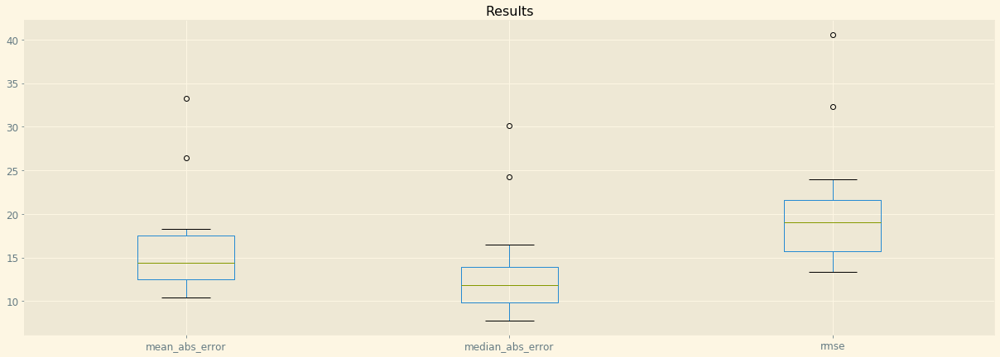

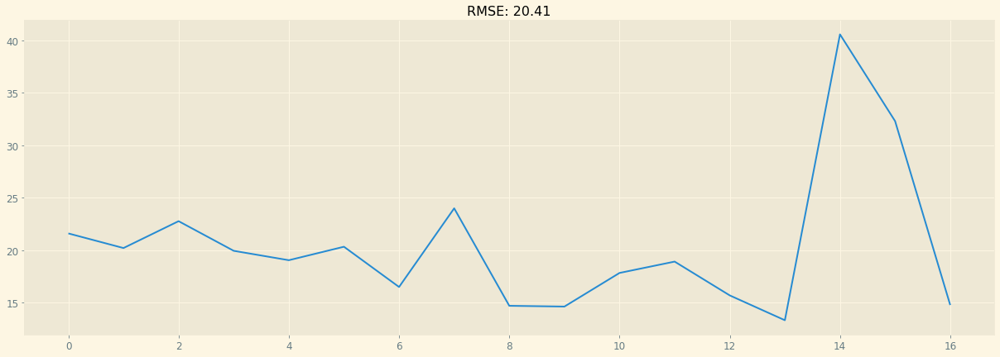

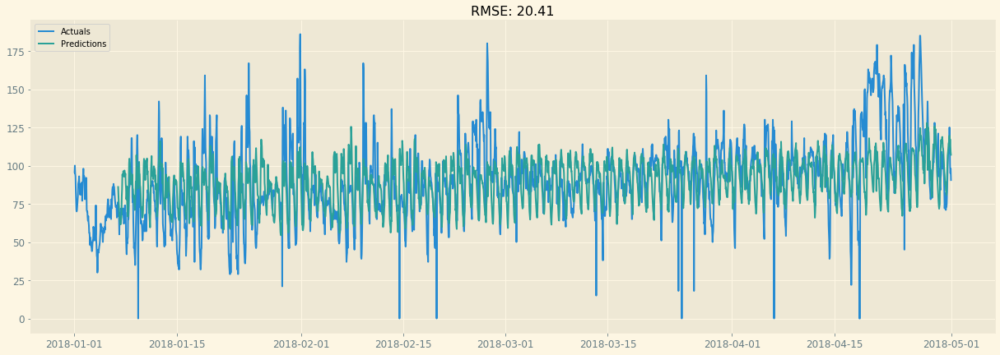

In [11]:
# Generate rolling predictions and results for particle of interest

data = oneparticle_onestation.sort_index().copy()
target = particle_of_interest

fit_func = fit_autoARIMA
predict_func = predict_autoARIMA

min_train_date = '2018-01-01'

week_starts = pd.date_range(min_train_date, data.index.max(), freq='W')

predictions_over_time, results_over_time = [], []

for i, week_start in enumerate(week_starts):
    if i % 10 == 0:
        print(week_start)

    train_set = data.loc[:(week_start - timedelta(hours=1))]
    test_set = data.loc[week_start:(week_start + timedelta(weeks=1, hours=-1))]
    models = train_set.groupby(['weekday', 'hour'])[target].apply(fit_func)
    predictions = test_set.apply(lambda x: predict_func(models.loc[tuple(x[['weekday', 'hour']])], x), axis=1)
    predictions_over_time.append(predictions)    
    results = evaluate_forecast(test_set[target], predictions, 'none')
    results['date'] = week_start
    results_over_time.append(results)  

results_over_time_24 = pd.DataFrame(results_over_time)
predictions_over_time_24 = pd.concat(predictions_over_time)

# Plot results statistics

results_over_time = results_over_time_24

fig, ax = plt.subplots(figsize=(21,7))
results_over_time.drop(['r2_score', 'mse'], axis=1).boxplot()
plt.title('Results')
plt.show()

# Plot RMSE overtime

fig, ax = plt.subplots(figsize=(21,7))
rmse_over_time = plt.plot(results_over_time['rmse'])
error = results_over_time['rmse'].mean()
plt.title('RMSE: %.2f'% error)
plt.show()

# Plot actuals and predictions overtime

plot_actuals_predictions(oneparticle_onestation[particle_of_interest][min_train_date:], predictions_over_time_24, results_over_time_24)

###  City average

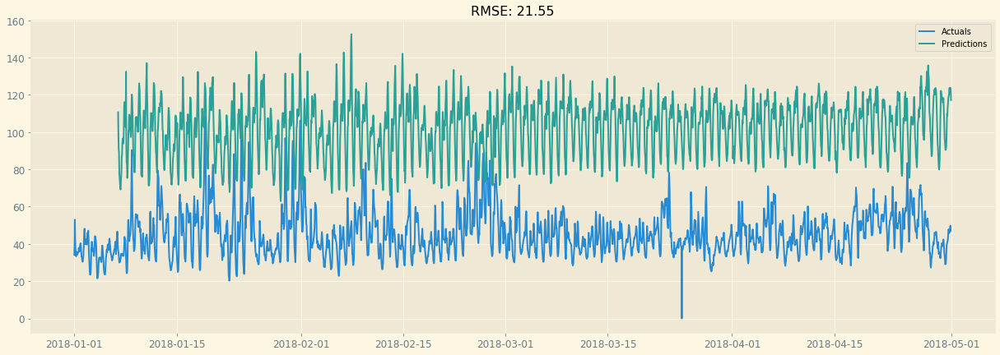

In [14]:
predictions_list =[predictions_over_time_08, predictions_over_time_18, predictions_over_time_24]
results_list = [results_over_time_08['rmse'], results_over_time_18['rmse'], results_over_time_24['rmse']]

predictions_final = pd.concat(predictions_list, axis=1).sort_index().mean(axis=1)
results_final = pd.concat(results_list, axis=1).sort_index().mean(axis=1)

target_mean = df_temp[particle_of_interest].groupby('date').mean()

fig, ax = plt.subplots(figsize=(21,7))
actuals = plt.plot(target_mean[min_train_date:], label='Actuals')
predictions = plt.plot(predictions_final, label='Predictions')
error = results_final.mean()
plt.legend(loc='best')
plt.title('RMSE: %.2f'% error)
plt.show()